# Load Libraries

In [1]:
import numpy as np 
import matplotlib.pyplot as plt
import glob
import cv2

from keras.models import Model, Sequential
from keras.layers import Dense, Flatten, Conv2D, MaxPooling2D
from keras.layers.normalization import BatchNormalization
import os
import seaborn as sns

In [2]:
list_of_architectures = [
    "VGG16",
    "VGG19",
    "ResNet101V2",
    "ResNet152V2",
    "InceptionV3",
    "MobileNet",
    "MobileNetV2",
    "DenseNet121",
    "DenseNet169",
    "DenseNet201"
    
]

In [3]:
list_of_classifiers = [
    "RF"
]

In [4]:
list_of_size = [
    128,
    256
]

In [5]:
layer = "last_layer"

In [6]:
preprocessing_technique = "smote"

In [7]:
output_folder = "output"
analysis_output =  output_folder + "/" + layer + "_" + preprocessing_technique + "_fusion_3_RF_128_256.csv"

# get Data

In [8]:
import tensorflow as tf
def getData(model1, model2, model3, image_size):
    train_data_dir="../class_imabalance/" + layer + "/" + str(image_size)+"/"
    test_data_dir="../feature_extractor/" + layer + "/" + str(image_size)+"/"
    X_train1=np.load(train_data_dir+model1+"_X_train_SMOTE.npy")
    X_train2=np.load(train_data_dir+model2+"_X_train_SMOTE.npy")
    X_train3=np.load(train_data_dir+model3+"_X_train_SMOTE.npy")
    X_train = tf.keras.layers.concatenate([X_train1, X_train2, X_train3],
                            axis=1)
    
    y_train=np.load(train_data_dir+model1+"_y_train_SMOTE.npy")
    
    X_test1=np.load(test_data_dir+model1+"_test_images.npy")
    X_test2=np.load(test_data_dir+model2+"_test_images.npy")
    X_test3=np.load(test_data_dir+model3+"_test_images.npy")
    X_test = tf.keras.layers.concatenate([X_test1, X_test2, X_test3],
                            axis=1)
    
    y_test=np.load(test_data_dir+"test_labels.npy")
    
    
    return X_train, y_train, X_test, y_test

In [9]:
def getLabelEncoder(layer, image_size):
    label_encoder_location = "../feature_extractor/" + layer + "/" + str(image_size)+"/"
    label_encoder = np.load(label_encoder_location+'label_encoder.npy')
    return label_encoder

#  Reusable function for Confusion Matrix 

In [10]:
def getClassificationReport(test_labels, prediction):
    
    def plot_confusion_matrix(cm, classes,
                              normalize=False,
                              title='Confusion matrix',
                              cmap=plt.cm.Blues):
        """
        This function prints and plots the confusion matrix.
        Normalization can be applied by setting `normalize=True`.
        """
        import itertools
        if normalize:
            cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
            print("Normalized confusion matrix")
        else:
            print('Confusion matrix, without normalization')

        #print(cm)

        plt.imshow(cm, interpolation='nearest', cmap=cmap)
        plt.title(title)
        #plt.colorbar()
        tick_marks = np.arange(len(classes))
        plt.xticks(tick_marks, classes, rotation=45)
        plt.yticks(tick_marks, classes)

        fmt = '.2f' if normalize else 'd'
        thresh = cm.max() / 2.
        for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
            plt.text(j, i, format(cm[i, j], fmt),
                     horizontalalignment="center",
                     color="white" if cm[i, j] > thresh else "black")

        plt.ylabel('True label')
        plt.xlabel('Predicted label')
        plt.tight_layout()
        plt.show()
        
    from sklearn.metrics import confusion_matrix
    test_label_list=list(np.unique(test_labels))
    cnf_matrix = confusion_matrix(test_labels, prediction,labels=test_label_list)
    np.set_printoptions(precision=2)

    # Plot non-normalized confusion matrix
    plt.figure(figsize=(8,8))
    plot_confusion_matrix(cnf_matrix, classes=test_label_list,
                          title='Confusion matrix, without normalization')
    
    
    from sklearn import metrics
    
    accuracy = round(metrics.accuracy_score(test_labels, prediction),3)
    precision = round(metrics.precision_score(test_labels, prediction, average='weighted'),3)
    recall = round(metrics.recall_score(test_labels, prediction, average='weighted'),3)
    f1_score = round(metrics.f1_score(test_labels, prediction, average='weighted'),3)
    
    # Balanced
    balanced_accuracy = round(metrics.balanced_accuracy_score(test_labels, prediction),3)
    
    FP = cnf_matrix.sum(axis=0) - np.diag(cnf_matrix)  
    FN = cnf_matrix.sum(axis=1) - np.diag(cnf_matrix)
    TP = np.diag(cnf_matrix)
    TN = cnf_matrix.sum() - (FP + FN + TP)
    
    # Sensitivity, hit rate, recall, or true positive rate
    TPR = round((TP/(TP+FN)).mean(),3)
    # Specificity or true negative rate
    TNR = round((TN/(TN+FP) ).mean(),3)
    # Precision or positive predictive value
    PPV = round((TP/(TP+FP)).mean(),3)
    # Negative predictive value
    NPV = round((TN/(TN+FN)).mean(),3)
    # Fall out or false positive rate
    FPR = round((FP/(FP+TN)).mean(),3)
    # False negative rate
    FNR = round((FN/(TP+FN)).mean(),3)
    # False discovery rate
    FDR = round((FP/(TP+FP)).mean(),3)

    # Overall accuracy
    Overall_Acc = round(((TP+TN)/(TP+FP+FN+TN)).mean(),3)
    Bal_F1 = round((2*(PPV*TPR)/(PPV+TPR)),3)
    
    
    print("Acc     = ", accuracy)
    print("Pre     = ", precision)
    print("Rec     = ", recall)
    print("F1      = ", f1_score)
    print("")
    
    print("Bal_Acc = ", balanced_accuracy)
    print("Bal_Pre = ", PPV)
    print("Bal_Rec = ", TPR)
    print("Bal_F1  = ", Bal_F1)
    print("")
    
    from sklearn.metrics import classification_report, confusion_matrix
    print(classification_report(test_labels, prediction))
    
    return accuracy, precision, recall, f1_score, balanced_accuracy, PPV, TPR, Bal_F1, TNR, NPV, FPR, FNR, FDR, Overall_Acc


# Classifier

In [11]:
def classify(model1, model2, model3, classifier, image_size):
    X_train, y_train, X_test, y_test = getData(model1, model2, model3, image_size)

    if classifier == "RF":
        from sklearn.ensemble import RandomForestClassifier
        model = RandomForestClassifier(n_estimators = 100, random_state = 42)
    elif classifier == "SVM":
        from sklearn.svm import SVC
        model = SVC(kernel='linear', degree=3, C=1, decision_function_shape='ovo')
        
    # Train the model on training data
    model.fit(X_train, y_train) #For sklearn no one hot encoding

    #Now predict using the trained RF model. 
    prediction = model.predict(X_test)
    
    #get the encoder from the pickle file
    from sklearn import preprocessing
    le = preprocessing.LabelEncoder()
    le.classes_ = getLabelEncoder(layer, image_size)
    
    """
    import pickle
    model_loc = "models"
    filename = model_loc + "/" + layer + "_" + preprocessing_technique + "_" + 'classifier'  + "_" + model_name + "_" + classifier + "_" + str(image_size) + " .sav "
    pickle.dump(model, open(filename, 'wb'))
    """
    
    #Inverse le transform to get original label back. 
    prediction = le.inverse_transform(prediction)
    y_test = le.inverse_transform(y_test)
    
    accuracy, precision, recall, f1_score, balanced_accuracy, PPV, TPR, Bal_F1, TNR, NPV, FPR, FNR, FDR, Overall_Acc = getClassificationReport(y_test, prediction)
    return accuracy, precision, recall, f1_score, balanced_accuracy, PPV, TPR, Bal_F1, TNR, NPV, FPR, FNR, FDR, Overall_Acc

In [12]:
from itertools import combinations
list_of_combinations=[",".join(map(str, comb)) for comb in combinations(list_of_architectures, 3)]
list_of_combinations

['VGG16,VGG19,ResNet101V2',
 'VGG16,VGG19,ResNet152V2',
 'VGG16,VGG19,InceptionV3',
 'VGG16,VGG19,MobileNet',
 'VGG16,VGG19,MobileNetV2',
 'VGG16,VGG19,DenseNet121',
 'VGG16,VGG19,DenseNet169',
 'VGG16,VGG19,DenseNet201',
 'VGG16,ResNet101V2,ResNet152V2',
 'VGG16,ResNet101V2,InceptionV3',
 'VGG16,ResNet101V2,MobileNet',
 'VGG16,ResNet101V2,MobileNetV2',
 'VGG16,ResNet101V2,DenseNet121',
 'VGG16,ResNet101V2,DenseNet169',
 'VGG16,ResNet101V2,DenseNet201',
 'VGG16,ResNet152V2,InceptionV3',
 'VGG16,ResNet152V2,MobileNet',
 'VGG16,ResNet152V2,MobileNetV2',
 'VGG16,ResNet152V2,DenseNet121',
 'VGG16,ResNet152V2,DenseNet169',
 'VGG16,ResNet152V2,DenseNet201',
 'VGG16,InceptionV3,MobileNet',
 'VGG16,InceptionV3,MobileNetV2',
 'VGG16,InceptionV3,DenseNet121',
 'VGG16,InceptionV3,DenseNet169',
 'VGG16,InceptionV3,DenseNet201',
 'VGG16,MobileNet,MobileNetV2',
 'VGG16,MobileNet,DenseNet121',
 'VGG16,MobileNet,DenseNet169',
 'VGG16,MobileNet,DenseNet201',
 'VGG16,MobileNetV2,DenseNet121',
 'VGG16,Mo

--------------------------------------------------------------------------
RF VGG16 VGG19 ResNet101V2 128

Confusion matrix, without normalization


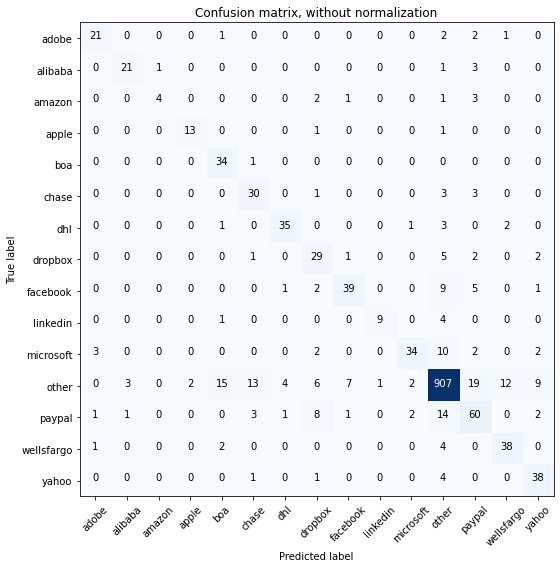

Acc     =  0.853
Pre     =  0.864
Rec     =  0.853
F1      =  0.854

Bal_Acc =  0.759
Bal_Pre =  0.767
Bal_Rec =  0.759
Bal_F1  =  0.763

              precision    recall  f1-score   support

       adobe       0.81      0.78      0.79        27
     alibaba       0.84      0.81      0.82        26
      amazon       0.80      0.36      0.50        11
       apple       0.87      0.87      0.87        15
         boa       0.63      0.97      0.76        35
       chase       0.61      0.81      0.70        37
         dhl       0.85      0.83      0.84        42
     dropbox       0.56      0.72      0.63        40
    facebook       0.80      0.68      0.74        57
    linkedin       0.90      0.64      0.75        14
   microsoft       0.87      0.64      0.74        53
       other       0.94      0.91      0.92      1000
      paypal       0.61      0.65      0.62        93
  wellsfargo       0.72      0.84      0.78        45
       yahoo       0.70      0.86      0.78        

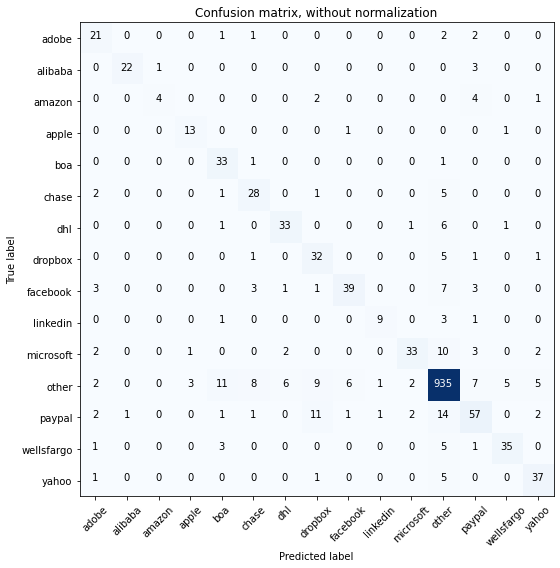

Acc     =  0.865
Pre     =  0.872
Rec     =  0.865
F1      =  0.865

Bal_Acc =  0.75
Bal_Pre =  0.768
Bal_Rec =  0.75
Bal_F1  =  0.759

              precision    recall  f1-score   support

       adobe       0.62      0.78      0.69        27
     alibaba       0.96      0.85      0.90        26
      amazon       0.80      0.36      0.50        11
       apple       0.76      0.87      0.81        15
         boa       0.63      0.94      0.76        35
       chase       0.65      0.76      0.70        37
         dhl       0.79      0.79      0.79        42
     dropbox       0.56      0.80      0.66        40
    facebook       0.83      0.68      0.75        57
    linkedin       0.82      0.64      0.72        14
   microsoft       0.87      0.62      0.73        53
       other       0.94      0.94      0.94      1000
      paypal       0.70      0.61      0.65        93
  wellsfargo       0.83      0.78      0.80        45
       yahoo       0.77      0.84      0.80        44

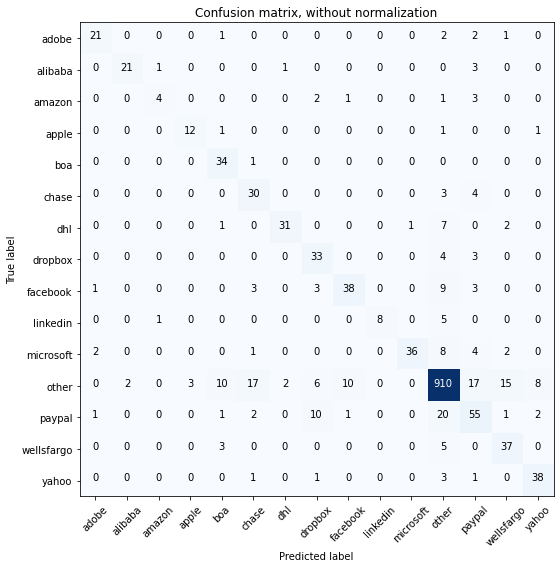

Acc     =  0.85
Pre     =  0.863
Rec     =  0.85
F1      =  0.852

Bal_Acc =  0.747
Bal_Pre =  0.773
Bal_Rec =  0.747
Bal_F1  =  0.76

              precision    recall  f1-score   support

       adobe       0.84      0.78      0.81        27
     alibaba       0.91      0.81      0.86        26
      amazon       0.67      0.36      0.47        11
       apple       0.80      0.80      0.80        15
         boa       0.67      0.97      0.79        35
       chase       0.55      0.81      0.65        37
         dhl       0.91      0.74      0.82        42
     dropbox       0.60      0.82      0.69        40
    facebook       0.76      0.67      0.71        57
    linkedin       1.00      0.57      0.73        14
   microsoft       0.97      0.68      0.80        53
       other       0.93      0.91      0.92      1000
      paypal       0.58      0.59      0.59        93
  wellsfargo       0.64      0.82      0.72        45
       yahoo       0.78      0.86      0.82        44


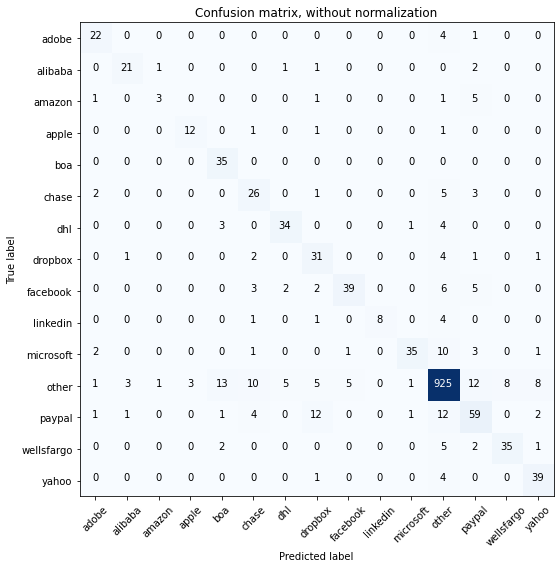

Acc     =  0.86
Pre     =  0.87
Rec     =  0.86
F1      =  0.861

Bal_Acc =  0.741
Bal_Pre =  0.763
Bal_Rec =  0.741
Bal_F1  =  0.752

              precision    recall  f1-score   support

       adobe       0.76      0.81      0.79        27
     alibaba       0.81      0.81      0.81        26
      amazon       0.60      0.27      0.37        11
       apple       0.80      0.80      0.80        15
         boa       0.65      1.00      0.79        35
       chase       0.54      0.70      0.61        37
         dhl       0.81      0.81      0.81        42
     dropbox       0.55      0.78      0.65        40
    facebook       0.87      0.68      0.76        57
    linkedin       1.00      0.57      0.73        14
   microsoft       0.92      0.66      0.77        53
       other       0.94      0.93      0.93      1000
      paypal       0.63      0.63      0.63        93
  wellsfargo       0.81      0.78      0.80        45
       yahoo       0.75      0.89      0.81        44


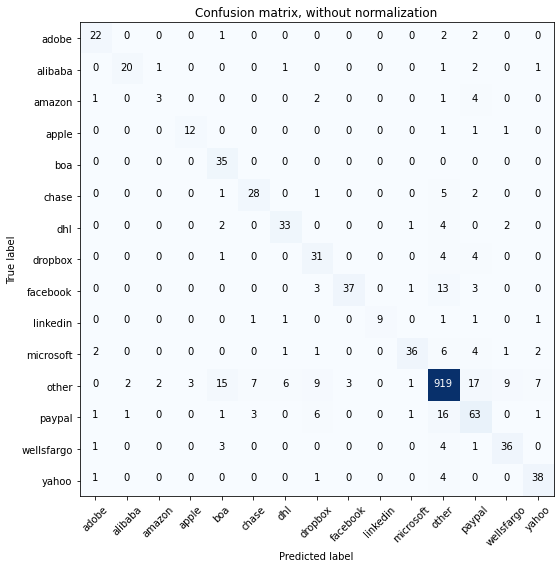

Acc     =  0.859
Pre     =  0.87
Rec     =  0.859
F1      =  0.86

Bal_Acc =  0.747
Bal_Pre =  0.766
Bal_Rec =  0.747
Bal_F1  =  0.756

              precision    recall  f1-score   support

       adobe       0.79      0.81      0.80        27
     alibaba       0.87      0.77      0.82        26
      amazon       0.50      0.27      0.35        11
       apple       0.80      0.80      0.80        15
         boa       0.59      1.00      0.74        35
       chase       0.72      0.76      0.74        37
         dhl       0.79      0.79      0.79        42
     dropbox       0.57      0.78      0.66        40
    facebook       0.93      0.65      0.76        57
    linkedin       1.00      0.64      0.78        14
   microsoft       0.90      0.68      0.77        53
       other       0.94      0.92      0.93      1000
      paypal       0.61      0.68      0.64        93
  wellsfargo       0.73      0.80      0.77        45
       yahoo       0.76      0.86      0.81        44

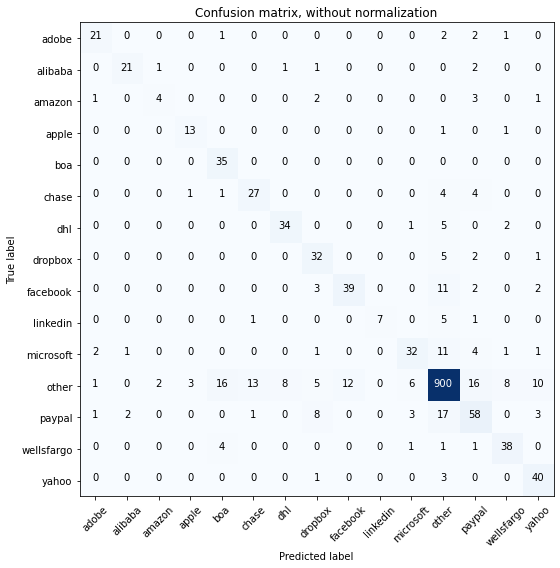

Acc     =  0.845
Pre     =  0.855
Rec     =  0.845
F1      =  0.846

Bal_Acc =  0.748
Bal_Pre =  0.744
Bal_Rec =  0.748
Bal_F1  =  0.746

              precision    recall  f1-score   support

       adobe       0.81      0.78      0.79        27
     alibaba       0.88      0.81      0.84        26
      amazon       0.57      0.36      0.44        11
       apple       0.76      0.87      0.81        15
         boa       0.61      1.00      0.76        35
       chase       0.64      0.73      0.68        37
         dhl       0.79      0.81      0.80        42
     dropbox       0.60      0.80      0.69        40
    facebook       0.76      0.68      0.72        57
    linkedin       1.00      0.50      0.67        14
   microsoft       0.74      0.60      0.67        53
       other       0.93      0.90      0.92      1000
      paypal       0.61      0.62      0.62        93
  wellsfargo       0.75      0.84      0.79        45
       yahoo       0.69      0.91      0.78        

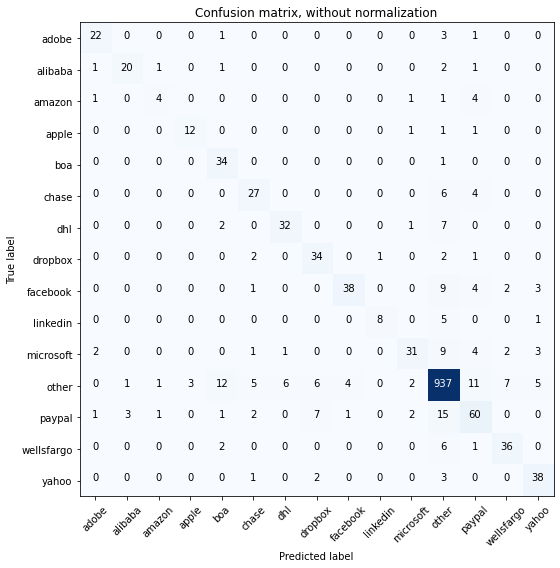

Acc     =  0.866
Pre     =  0.869
Rec     =  0.866
F1      =  0.865

Bal_Acc =  0.742
Bal_Pre =  0.771
Bal_Rec =  0.742
Bal_F1  =  0.756

              precision    recall  f1-score   support

       adobe       0.81      0.81      0.81        27
     alibaba       0.83      0.77      0.80        26
      amazon       0.57      0.36      0.44        11
       apple       0.80      0.80      0.80        15
         boa       0.64      0.97      0.77        35
       chase       0.69      0.73      0.71        37
         dhl       0.82      0.76      0.79        42
     dropbox       0.69      0.85      0.76        40
    facebook       0.88      0.67      0.76        57
    linkedin       0.89      0.57      0.70        14
   microsoft       0.82      0.58      0.68        53
       other       0.93      0.94      0.93      1000
      paypal       0.65      0.65      0.65        93
  wellsfargo       0.77      0.80      0.78        45
       yahoo       0.76      0.86      0.81        

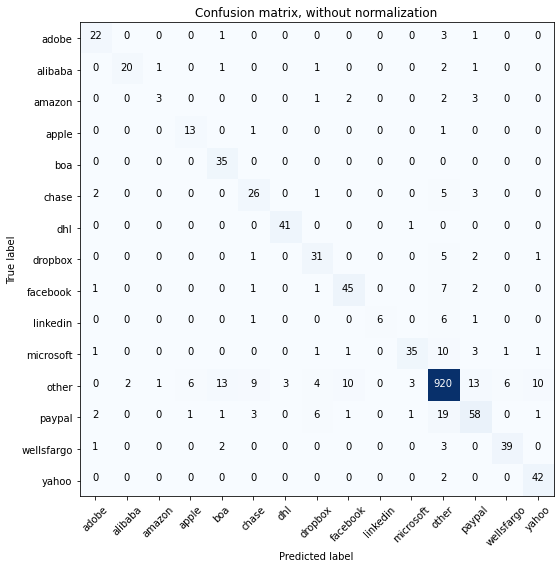

Acc     =  0.868
Pre     =  0.873
Rec     =  0.868
F1      =  0.867

Bal_Acc =  0.761
Bal_Pre =  0.777
Bal_Rec =  0.761
Bal_F1  =  0.769

              precision    recall  f1-score   support

       adobe       0.76      0.81      0.79        27
     alibaba       0.91      0.77      0.83        26
      amazon       0.60      0.27      0.37        11
       apple       0.65      0.87      0.74        15
         boa       0.66      1.00      0.80        35
       chase       0.62      0.70      0.66        37
         dhl       0.93      0.98      0.95        42
     dropbox       0.67      0.78      0.72        40
    facebook       0.76      0.79      0.78        57
    linkedin       1.00      0.43      0.60        14
   microsoft       0.88      0.66      0.75        53
       other       0.93      0.92      0.93      1000
      paypal       0.67      0.62      0.64        93
  wellsfargo       0.85      0.87      0.86        45
       yahoo       0.76      0.95      0.85        

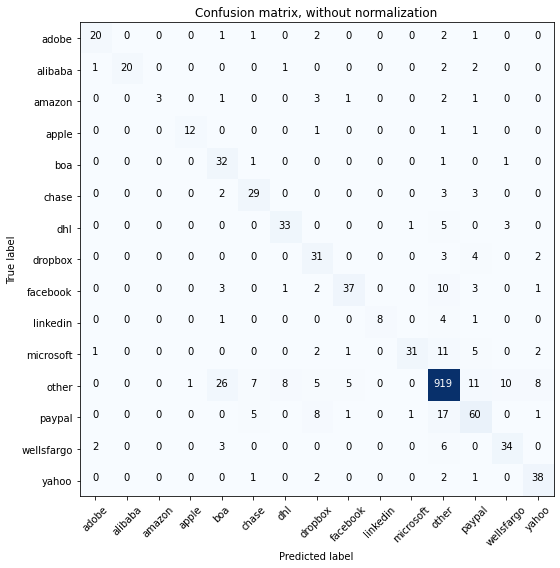

Acc     =  0.849
Pre     =  0.866
Rec     =  0.849
F1      =  0.851

Bal_Acc =  0.722
Bal_Pre =  0.798
Bal_Rec =  0.722
Bal_F1  =  0.758

              precision    recall  f1-score   support

       adobe       0.83      0.74      0.78        27
     alibaba       1.00      0.77      0.87        26
      amazon       1.00      0.27      0.43        11
       apple       0.92      0.80      0.86        15
         boa       0.46      0.91      0.62        35
       chase       0.66      0.78      0.72        37
         dhl       0.77      0.79      0.78        42
     dropbox       0.55      0.78      0.65        40
    facebook       0.82      0.65      0.73        57
    linkedin       1.00      0.57      0.73        14
   microsoft       0.94      0.58      0.72        53
       other       0.93      0.92      0.92      1000
      paypal       0.65      0.65      0.65        93
  wellsfargo       0.71      0.76      0.73        45
       yahoo       0.73      0.86      0.79        

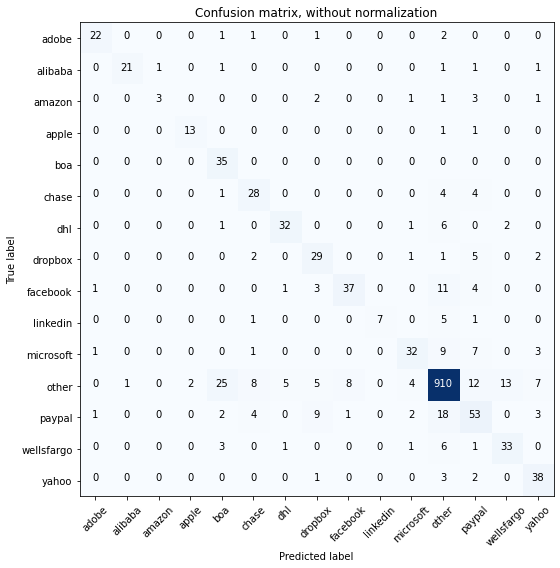

Acc     =  0.84
Pre     =  0.853
Rec     =  0.84
F1      =  0.842

Bal_Acc =  0.722
Bal_Pre =  0.761
Bal_Rec =  0.722
Bal_F1  =  0.741

              precision    recall  f1-score   support

       adobe       0.88      0.81      0.85        27
     alibaba       0.95      0.81      0.88        26
      amazon       0.75      0.27      0.40        11
       apple       0.87      0.87      0.87        15
         boa       0.51      1.00      0.67        35
       chase       0.62      0.76      0.68        37
         dhl       0.82      0.76      0.79        42
     dropbox       0.58      0.72      0.64        40
    facebook       0.80      0.65      0.72        57
    linkedin       1.00      0.50      0.67        14
   microsoft       0.76      0.60      0.67        53
       other       0.93      0.91      0.92      1000
      paypal       0.56      0.57      0.57        93
  wellsfargo       0.69      0.73      0.71        45
       yahoo       0.69      0.86      0.77        44

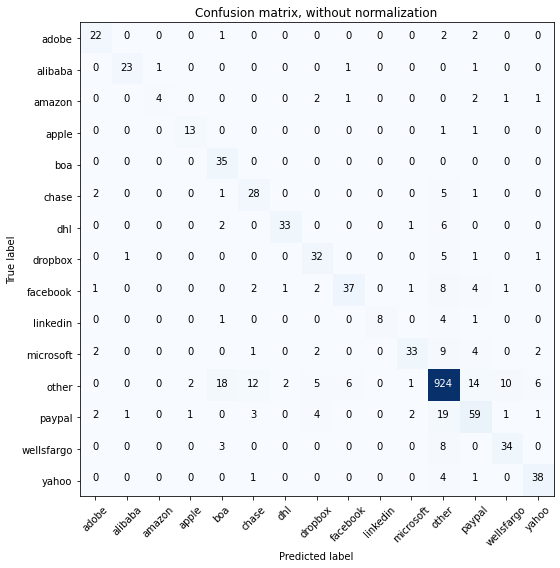

Acc     =  0.86
Pre     =  0.868
Rec     =  0.86
F1      =  0.86

Bal_Acc =  0.753
Bal_Pre =  0.788
Bal_Rec =  0.753
Bal_F1  =  0.77

              precision    recall  f1-score   support

       adobe       0.76      0.81      0.79        27
     alibaba       0.92      0.88      0.90        26
      amazon       0.80      0.36      0.50        11
       apple       0.81      0.87      0.84        15
         boa       0.57      1.00      0.73        35
       chase       0.60      0.76      0.67        37
         dhl       0.92      0.79      0.85        42
     dropbox       0.68      0.80      0.74        40
    facebook       0.82      0.65      0.73        57
    linkedin       1.00      0.57      0.73        14
   microsoft       0.87      0.62      0.73        53
       other       0.93      0.92      0.93      1000
      paypal       0.65      0.63      0.64        93
  wellsfargo       0.72      0.76      0.74        45
       yahoo       0.78      0.86      0.82        44



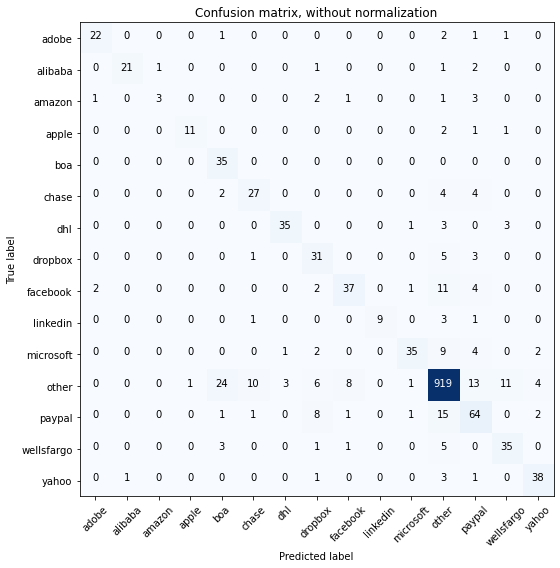

Acc     =  0.859
Pre     =  0.872
Rec     =  0.859
F1      =  0.861

Bal_Acc =  0.745
Bal_Pre =  0.795
Bal_Rec =  0.745
Bal_F1  =  0.769

              precision    recall  f1-score   support

       adobe       0.88      0.81      0.85        27
     alibaba       0.95      0.81      0.88        26
      amazon       0.75      0.27      0.40        11
       apple       0.92      0.73      0.81        15
         boa       0.53      1.00      0.69        35
       chase       0.68      0.73      0.70        37
         dhl       0.90      0.83      0.86        42
     dropbox       0.57      0.78      0.66        40
    facebook       0.77      0.65      0.70        57
    linkedin       1.00      0.64      0.78        14
   microsoft       0.90      0.66      0.76        53
       other       0.93      0.92      0.93      1000
      paypal       0.63      0.69      0.66        93
  wellsfargo       0.69      0.78      0.73        45
       yahoo       0.83      0.86      0.84        

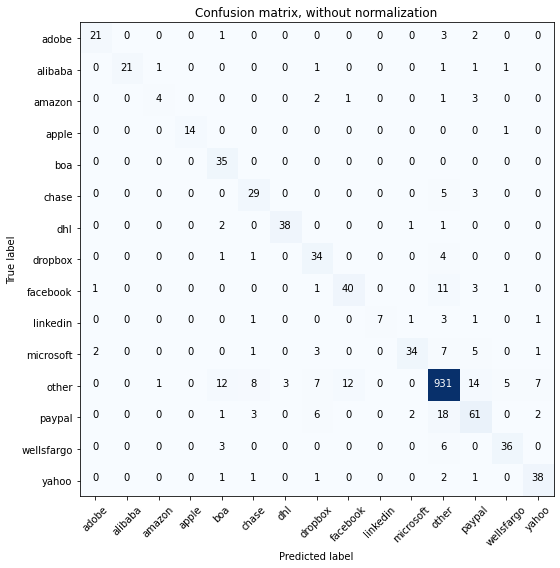

Acc     =  0.873
Pre     =  0.881
Rec     =  0.873
F1      =  0.873

Bal_Acc =  0.768
Bal_Pre =  0.813
Bal_Rec =  0.768
Bal_F1  =  0.79

              precision    recall  f1-score   support

       adobe       0.88      0.78      0.82        27
     alibaba       1.00      0.81      0.89        26
      amazon       0.67      0.36      0.47        11
       apple       1.00      0.93      0.97        15
         boa       0.62      1.00      0.77        35
       chase       0.66      0.78      0.72        37
         dhl       0.93      0.90      0.92        42
     dropbox       0.62      0.85      0.72        40
    facebook       0.75      0.70      0.73        57
    linkedin       1.00      0.50      0.67        14
   microsoft       0.89      0.64      0.75        53
       other       0.94      0.93      0.93      1000
      paypal       0.65      0.66      0.65        93
  wellsfargo       0.82      0.80      0.81        45
       yahoo       0.78      0.86      0.82        4

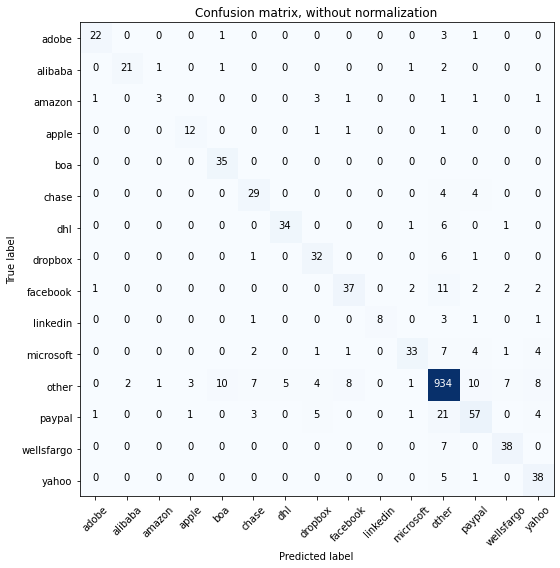

Acc     =  0.866
Pre     =  0.868
Rec     =  0.866
F1      =  0.864

Bal_Acc =  0.746
Bal_Pre =  0.786
Bal_Rec =  0.746
Bal_F1  =  0.765

              precision    recall  f1-score   support

       adobe       0.88      0.81      0.85        27
     alibaba       0.91      0.81      0.86        26
      amazon       0.60      0.27      0.37        11
       apple       0.75      0.80      0.77        15
         boa       0.74      1.00      0.85        35
       chase       0.67      0.78      0.72        37
         dhl       0.87      0.81      0.84        42
     dropbox       0.70      0.80      0.74        40
    facebook       0.77      0.65      0.70        57
    linkedin       1.00      0.57      0.73        14
   microsoft       0.85      0.62      0.72        53
       other       0.92      0.93      0.93      1000
      paypal       0.70      0.61      0.65        93
  wellsfargo       0.78      0.84      0.81        45
       yahoo       0.66      0.86      0.75        

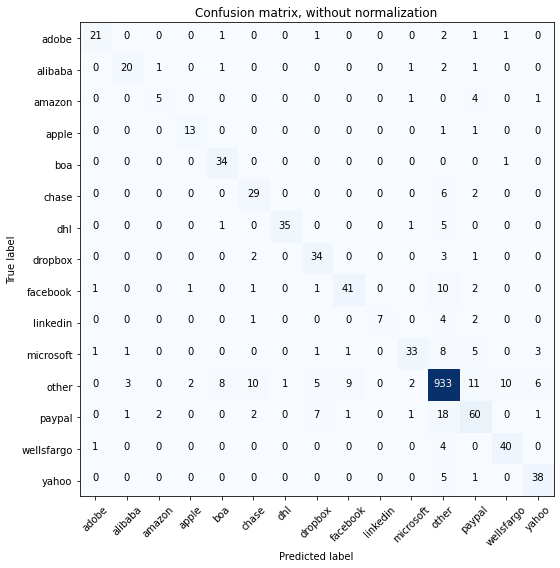

Acc     =  0.873
Pre     =  0.876
Rec     =  0.873
F1      =  0.872

Bal_Acc =  0.765
Bal_Pre =  0.797
Bal_Rec =  0.765
Bal_F1  =  0.781

              precision    recall  f1-score   support

       adobe       0.88      0.78      0.82        27
     alibaba       0.80      0.77      0.78        26
      amazon       0.62      0.45      0.53        11
       apple       0.81      0.87      0.84        15
         boa       0.76      0.97      0.85        35
       chase       0.64      0.78      0.71        37
         dhl       0.97      0.83      0.90        42
     dropbox       0.69      0.85      0.76        40
    facebook       0.79      0.72      0.75        57
    linkedin       1.00      0.50      0.67        14
   microsoft       0.85      0.62      0.72        53
       other       0.93      0.93      0.93      1000
      paypal       0.66      0.65      0.65        93
  wellsfargo       0.77      0.89      0.82        45
       yahoo       0.78      0.86      0.82        

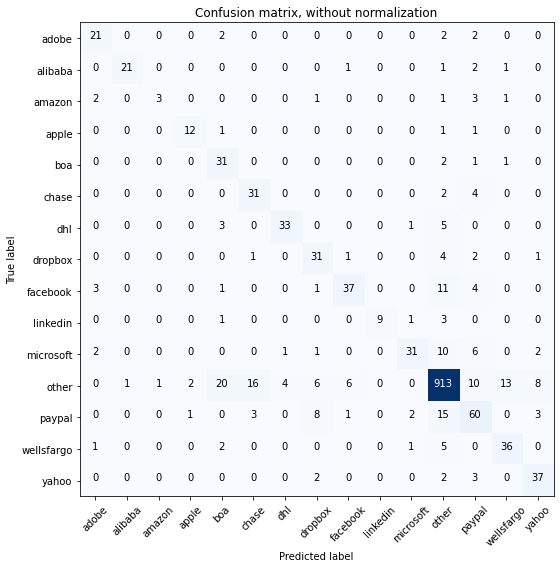

Acc     =  0.849
Pre     =  0.862
Rec     =  0.849
F1      =  0.85

Bal_Acc =  0.735
Bal_Pre =  0.764
Bal_Rec =  0.735
Bal_F1  =  0.749

              precision    recall  f1-score   support

       adobe       0.72      0.78      0.75        27
     alibaba       0.95      0.81      0.88        26
      amazon       0.75      0.27      0.40        11
       apple       0.80      0.80      0.80        15
         boa       0.51      0.89      0.65        35
       chase       0.61      0.84      0.70        37
         dhl       0.87      0.79      0.82        42
     dropbox       0.62      0.78      0.69        40
    facebook       0.80      0.65      0.72        57
    linkedin       1.00      0.64      0.78        14
   microsoft       0.86      0.58      0.70        53
       other       0.93      0.91      0.92      1000
      paypal       0.61      0.65      0.63        93
  wellsfargo       0.69      0.80      0.74        45
       yahoo       0.73      0.84      0.78        4

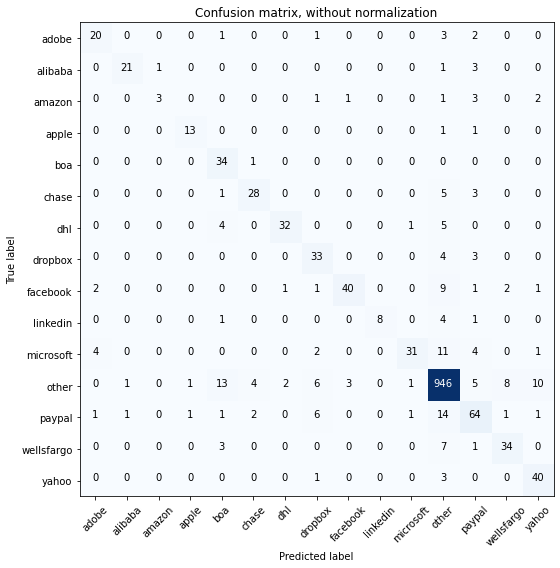

Acc     =  0.875
Pre     =  0.882
Rec     =  0.875
F1      =  0.874

Bal_Acc =  0.744
Bal_Pre =  0.811
Bal_Rec =  0.744
Bal_F1  =  0.776

              precision    recall  f1-score   support

       adobe       0.74      0.74      0.74        27
     alibaba       0.91      0.81      0.86        26
      amazon       0.75      0.27      0.40        11
       apple       0.87      0.87      0.87        15
         boa       0.59      0.97      0.73        35
       chase       0.80      0.76      0.78        37
         dhl       0.91      0.76      0.83        42
     dropbox       0.65      0.82      0.73        40
    facebook       0.91      0.70      0.79        57
    linkedin       1.00      0.57      0.73        14
   microsoft       0.91      0.58      0.71        53
       other       0.93      0.95      0.94      1000
      paypal       0.70      0.69      0.70        93
  wellsfargo       0.76      0.76      0.76        45
       yahoo       0.73      0.91      0.81        

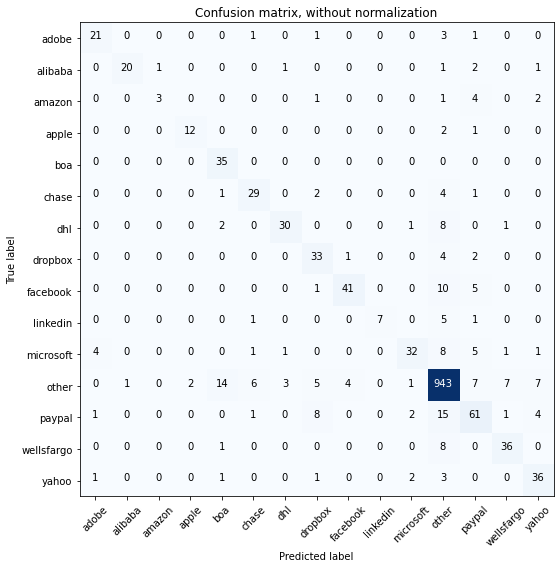

Acc     =  0.87
Pre     =  0.875
Rec     =  0.87
F1      =  0.868

Bal_Acc =  0.732
Bal_Pre =  0.803
Bal_Rec =  0.732
Bal_F1  =  0.766

              precision    recall  f1-score   support

       adobe       0.78      0.78      0.78        27
     alibaba       0.95      0.77      0.85        26
      amazon       0.75      0.27      0.40        11
       apple       0.86      0.80      0.83        15
         boa       0.65      1.00      0.79        35
       chase       0.74      0.78      0.76        37
         dhl       0.86      0.71      0.78        42
     dropbox       0.63      0.82      0.72        40
    facebook       0.89      0.72      0.80        57
    linkedin       1.00      0.50      0.67        14
   microsoft       0.84      0.60      0.70        53
       other       0.93      0.94      0.94      1000
      paypal       0.68      0.66      0.67        93
  wellsfargo       0.78      0.80      0.79        45
       yahoo       0.71      0.82      0.76        44

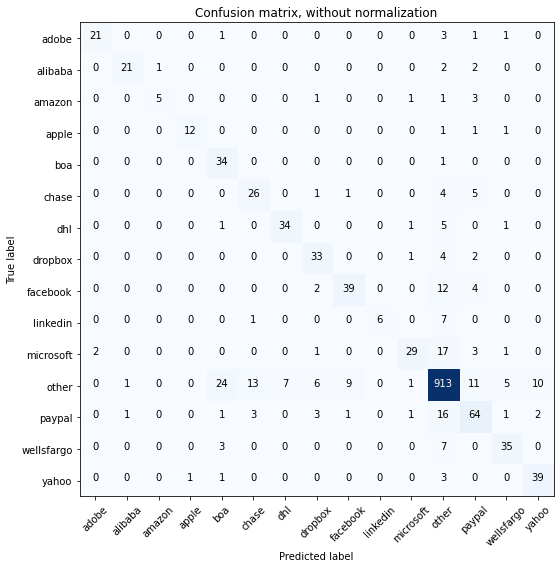

Acc     =  0.852
Pre     =  0.862
Rec     =  0.852
F1      =  0.852

Bal_Acc =  0.738
Bal_Pre =  0.8
Bal_Rec =  0.738
Bal_F1  =  0.768

              precision    recall  f1-score   support

       adobe       0.91      0.78      0.84        27
     alibaba       0.91      0.81      0.86        26
      amazon       0.83      0.45      0.59        11
       apple       0.92      0.80      0.86        15
         boa       0.52      0.97      0.68        35
       chase       0.60      0.70      0.65        37
         dhl       0.83      0.81      0.82        42
     dropbox       0.70      0.82      0.76        40
    facebook       0.78      0.68      0.73        57
    linkedin       1.00      0.43      0.60        14
   microsoft       0.85      0.55      0.67        53
       other       0.92      0.91      0.91      1000
      paypal       0.67      0.69      0.68        93
  wellsfargo       0.78      0.78      0.78        45
       yahoo       0.76      0.89      0.82        44

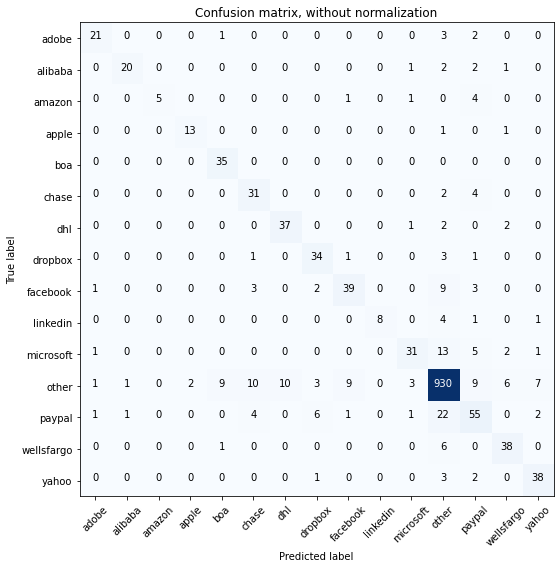

Acc     =  0.867
Pre     =  0.871
Rec     =  0.867
F1      =  0.866

Bal_Acc =  0.767
Bal_Pre =  0.814
Bal_Rec =  0.767
Bal_F1  =  0.79

              precision    recall  f1-score   support

       adobe       0.84      0.78      0.81        27
     alibaba       0.91      0.77      0.83        26
      amazon       1.00      0.45      0.62        11
       apple       0.87      0.87      0.87        15
         boa       0.76      1.00      0.86        35
       chase       0.63      0.84      0.72        37
         dhl       0.79      0.88      0.83        42
     dropbox       0.74      0.85      0.79        40
    facebook       0.76      0.68      0.72        57
    linkedin       1.00      0.57      0.73        14
   microsoft       0.82      0.58      0.68        53
       other       0.93      0.93      0.93      1000
      paypal       0.62      0.59      0.61        93
  wellsfargo       0.76      0.84      0.80        45
       yahoo       0.78      0.86      0.82        4

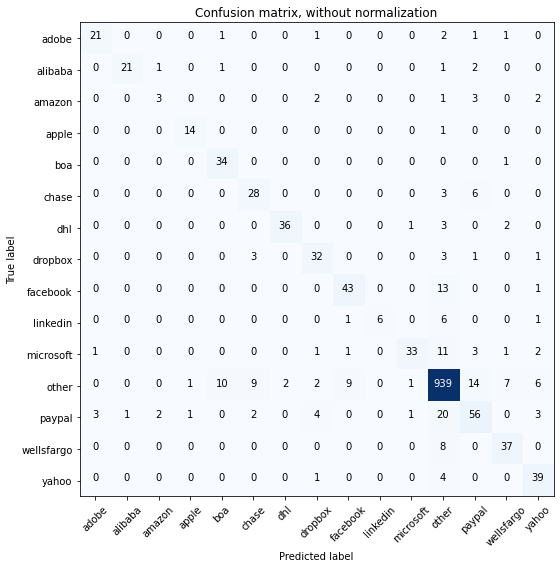

Acc     =  0.872
Pre     =  0.874
Rec     =  0.872
F1      =  0.87

Bal_Acc =  0.749
Bal_Pre =  0.801
Bal_Rec =  0.749
Bal_F1  =  0.774

              precision    recall  f1-score   support

       adobe       0.84      0.78      0.81        27
     alibaba       0.95      0.81      0.88        26
      amazon       0.50      0.27      0.35        11
       apple       0.88      0.93      0.90        15
         boa       0.74      0.97      0.84        35
       chase       0.67      0.76      0.71        37
         dhl       0.95      0.86      0.90        42
     dropbox       0.74      0.80      0.77        40
    facebook       0.80      0.75      0.77        57
    linkedin       1.00      0.43      0.60        14
   microsoft       0.92      0.62      0.74        53
       other       0.93      0.94      0.93      1000
      paypal       0.65      0.60      0.63        93
  wellsfargo       0.76      0.82      0.79        45
       yahoo       0.71      0.89      0.79        4

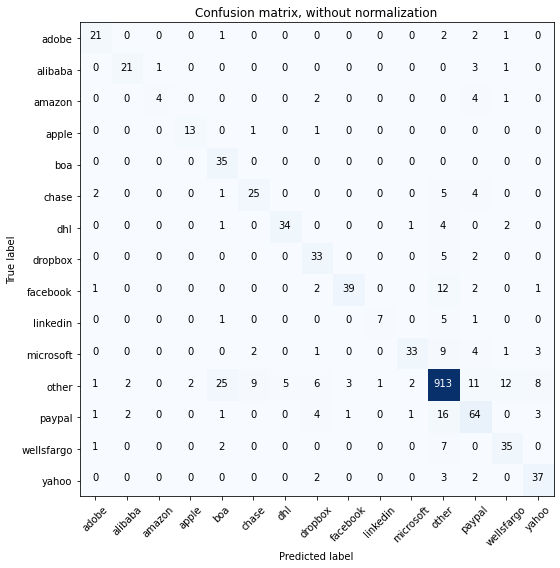

Acc     =  0.854
Pre     =  0.866
Rec     =  0.854
F1      =  0.855

Bal_Acc =  0.744
Bal_Pre =  0.775
Bal_Rec =  0.744
Bal_F1  =  0.759

              precision    recall  f1-score   support

       adobe       0.78      0.78      0.78        27
     alibaba       0.84      0.81      0.82        26
      amazon       0.80      0.36      0.50        11
       apple       0.87      0.87      0.87        15
         boa       0.52      1.00      0.69        35
       chase       0.68      0.68      0.68        37
         dhl       0.87      0.81      0.84        42
     dropbox       0.65      0.82      0.73        40
    facebook       0.91      0.68      0.78        57
    linkedin       0.88      0.50      0.64        14
   microsoft       0.89      0.62      0.73        53
       other       0.93      0.91      0.92      1000
      paypal       0.65      0.69      0.67        93
  wellsfargo       0.66      0.78      0.71        45
       yahoo       0.71      0.84      0.77        

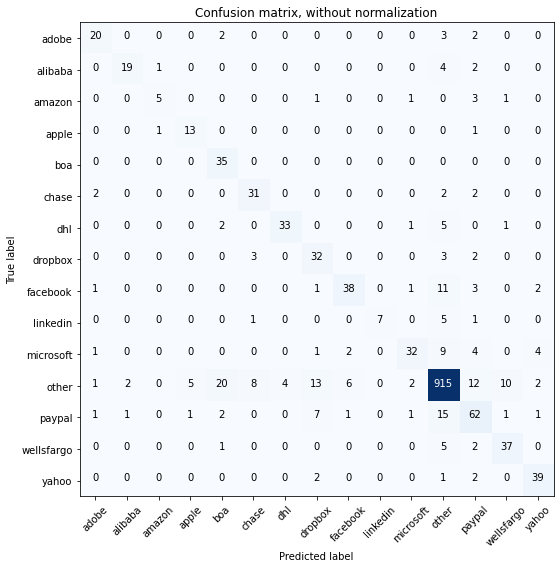

Acc     =  0.856
Pre     =  0.868
Rec     =  0.856
F1      =  0.858

Bal_Acc =  0.752
Bal_Pre =  0.769
Bal_Rec =  0.752
Bal_F1  =  0.76

              precision    recall  f1-score   support

       adobe       0.77      0.74      0.75        27
     alibaba       0.86      0.73      0.79        26
      amazon       0.71      0.45      0.56        11
       apple       0.68      0.87      0.76        15
         boa       0.56      1.00      0.72        35
       chase       0.72      0.84      0.77        37
         dhl       0.89      0.79      0.84        42
     dropbox       0.56      0.80      0.66        40
    facebook       0.81      0.67      0.73        57
    linkedin       1.00      0.50      0.67        14
   microsoft       0.84      0.60      0.70        53
       other       0.94      0.92      0.93      1000
      paypal       0.63      0.67      0.65        93
  wellsfargo       0.74      0.82      0.78        45
       yahoo       0.81      0.89      0.85        4

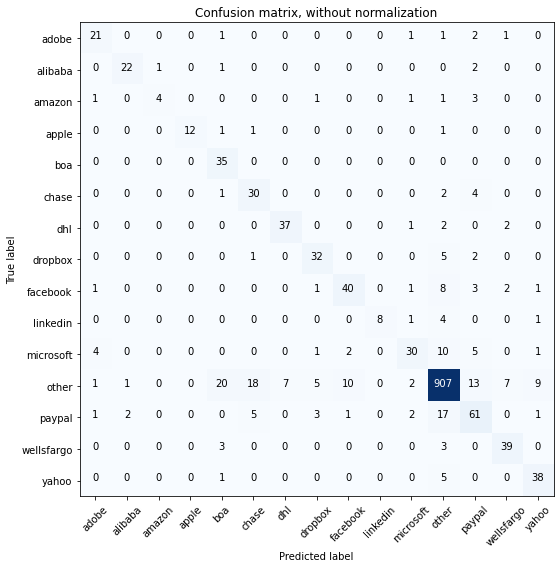

Acc     =  0.855
Pre     =  0.867
Rec     =  0.855
F1      =  0.857

Bal_Acc =  0.761
Bal_Pre =  0.78
Bal_Rec =  0.761
Bal_F1  =  0.77

              precision    recall  f1-score   support

       adobe       0.72      0.78      0.75        27
     alibaba       0.88      0.85      0.86        26
      amazon       0.80      0.36      0.50        11
       apple       1.00      0.80      0.89        15
         boa       0.56      1.00      0.71        35
       chase       0.55      0.81      0.65        37
         dhl       0.84      0.88      0.86        42
     dropbox       0.74      0.80      0.77        40
    facebook       0.75      0.70      0.73        57
    linkedin       1.00      0.57      0.73        14
   microsoft       0.77      0.57      0.65        53
       other       0.94      0.91      0.92      1000
      paypal       0.64      0.66      0.65        93
  wellsfargo       0.76      0.87      0.81        45
       yahoo       0.75      0.86      0.80        44

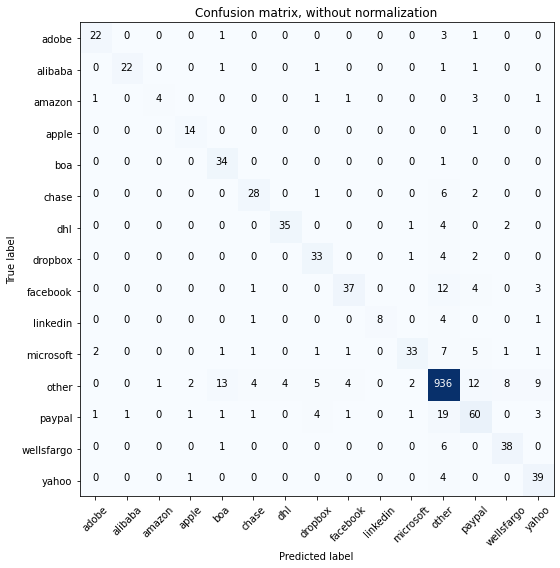

Acc     =  0.873
Pre     =  0.877
Rec     =  0.873
F1      =  0.871

Bal_Acc =  0.767
Bal_Pre =  0.812
Bal_Rec =  0.767
Bal_F1  =  0.789

              precision    recall  f1-score   support

       adobe       0.85      0.81      0.83        27
     alibaba       0.96      0.85      0.90        26
      amazon       0.80      0.36      0.50        11
       apple       0.78      0.93      0.85        15
         boa       0.65      0.97      0.78        35
       chase       0.78      0.76      0.77        37
         dhl       0.90      0.83      0.86        42
     dropbox       0.72      0.82      0.77        40
    facebook       0.84      0.65      0.73        57
    linkedin       1.00      0.57      0.73        14
   microsoft       0.87      0.62      0.73        53
       other       0.93      0.94      0.93      1000
      paypal       0.66      0.65      0.65        93
  wellsfargo       0.78      0.84      0.81        45
       yahoo       0.68      0.89      0.77        

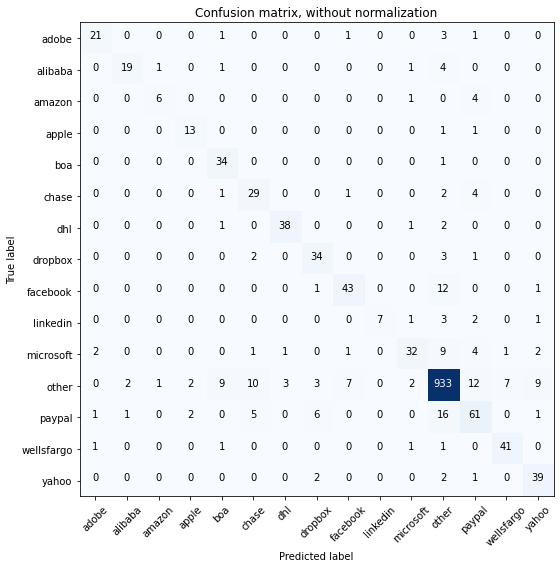

Acc     =  0.877
Pre     =  0.882
Rec     =  0.877
F1      =  0.877

Bal_Acc =  0.778
Bal_Pre =  0.8
Bal_Rec =  0.778
Bal_F1  =  0.789

              precision    recall  f1-score   support

       adobe       0.84      0.78      0.81        27
     alibaba       0.86      0.73      0.79        26
      amazon       0.75      0.55      0.63        11
       apple       0.76      0.87      0.81        15
         boa       0.71      0.97      0.82        35
       chase       0.62      0.78      0.69        37
         dhl       0.90      0.90      0.90        42
     dropbox       0.74      0.85      0.79        40
    facebook       0.81      0.75      0.78        57
    linkedin       1.00      0.50      0.67        14
   microsoft       0.82      0.60      0.70        53
       other       0.94      0.93      0.94      1000
      paypal       0.67      0.66      0.66        93
  wellsfargo       0.84      0.91      0.87        45
       yahoo       0.74      0.89      0.80        44

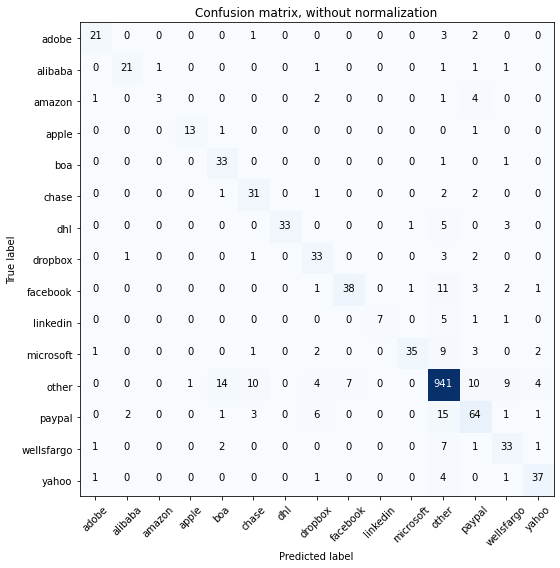

Acc     =  0.873
Pre     =  0.881
Rec     =  0.873
F1      =  0.872

Bal_Acc =  0.743
Bal_Pre =  0.812
Bal_Rec =  0.743
Bal_F1  =  0.776

              precision    recall  f1-score   support

       adobe       0.84      0.78      0.81        27
     alibaba       0.88      0.81      0.84        26
      amazon       0.75      0.27      0.40        11
       apple       0.93      0.87      0.90        15
         boa       0.63      0.94      0.76        35
       chase       0.66      0.84      0.74        37
         dhl       1.00      0.79      0.88        42
     dropbox       0.65      0.82      0.73        40
    facebook       0.84      0.67      0.75        57
    linkedin       1.00      0.50      0.67        14
   microsoft       0.95      0.66      0.78        53
       other       0.93      0.94      0.94      1000
      paypal       0.68      0.69      0.68        93
  wellsfargo       0.63      0.73      0.68        45
       yahoo       0.80      0.84      0.82        

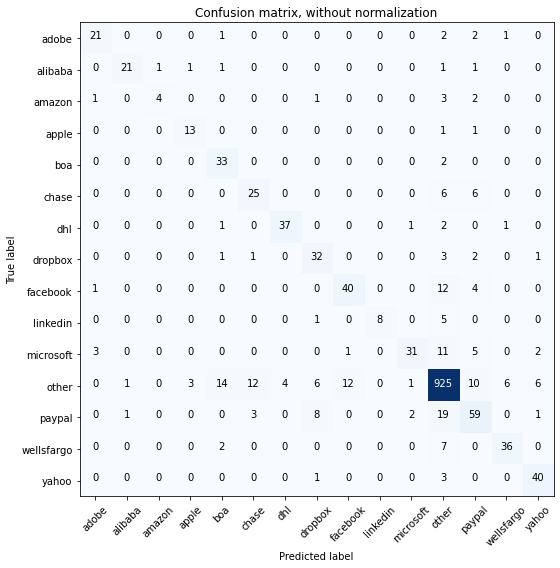

Acc     =  0.861
Pre     =  0.866
Rec     =  0.861
F1      =  0.86

Bal_Acc =  0.749
Bal_Pre =  0.793
Bal_Rec =  0.749
Bal_F1  =  0.77

              precision    recall  f1-score   support

       adobe       0.81      0.78      0.79        27
     alibaba       0.91      0.81      0.86        26
      amazon       0.80      0.36      0.50        11
       apple       0.76      0.87      0.81        15
         boa       0.62      0.94      0.75        35
       chase       0.61      0.68      0.64        37
         dhl       0.90      0.88      0.89        42
     dropbox       0.65      0.80      0.72        40
    facebook       0.75      0.70      0.73        57
    linkedin       1.00      0.57      0.73        14
   microsoft       0.89      0.58      0.70        53
       other       0.92      0.93      0.92      1000
      paypal       0.64      0.63      0.64        93
  wellsfargo       0.82      0.80      0.81        45
       yahoo       0.80      0.91      0.85        44

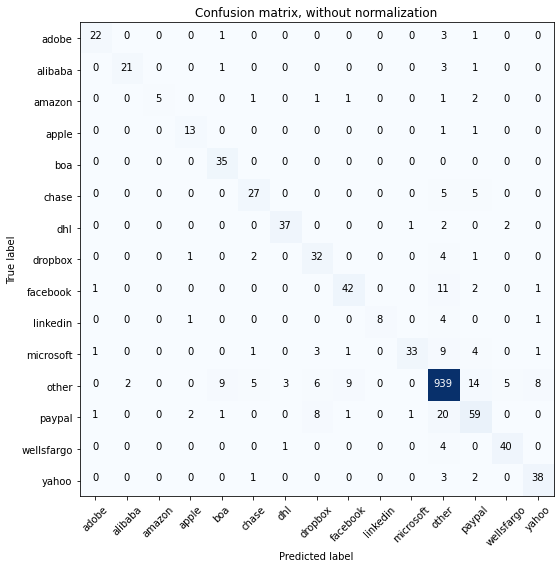

Acc     =  0.878
Pre     =  0.882
Rec     =  0.878
F1      =  0.877

Bal_Acc =  0.774
Bal_Pre =  0.833
Bal_Rec =  0.774
Bal_F1  =  0.802

              precision    recall  f1-score   support

       adobe       0.88      0.81      0.85        27
     alibaba       0.91      0.81      0.86        26
      amazon       1.00      0.45      0.62        11
       apple       0.76      0.87      0.81        15
         boa       0.74      1.00      0.85        35
       chase       0.73      0.73      0.73        37
         dhl       0.90      0.88      0.89        42
     dropbox       0.64      0.80      0.71        40
    facebook       0.78      0.74      0.76        57
    linkedin       1.00      0.57      0.73        14
   microsoft       0.94      0.62      0.75        53
       other       0.93      0.94      0.93      1000
      paypal       0.64      0.63      0.64        93
  wellsfargo       0.85      0.89      0.87        45
       yahoo       0.78      0.86      0.82        

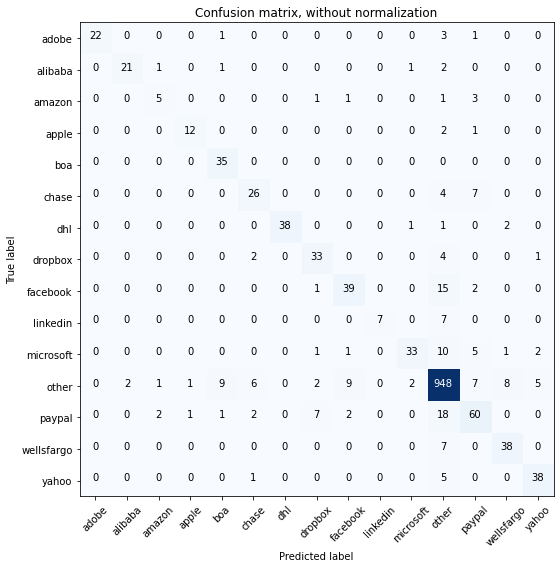

Acc     =  0.88
Pre     =  0.881
Rec     =  0.88
F1      =  0.878

Bal_Acc =  0.761
Bal_Pre =  0.825
Bal_Rec =  0.761
Bal_F1  =  0.792

              precision    recall  f1-score   support

       adobe       1.00      0.81      0.90        27
     alibaba       0.91      0.81      0.86        26
      amazon       0.56      0.45      0.50        11
       apple       0.86      0.80      0.83        15
         boa       0.74      1.00      0.85        35
       chase       0.70      0.70      0.70        37
         dhl       1.00      0.90      0.95        42
     dropbox       0.73      0.82      0.78        40
    facebook       0.75      0.68      0.72        57
    linkedin       1.00      0.50      0.67        14
   microsoft       0.89      0.62      0.73        53
       other       0.92      0.95      0.94      1000
      paypal       0.70      0.65      0.67        93
  wellsfargo       0.78      0.84      0.81        45
       yahoo       0.83      0.86      0.84        44

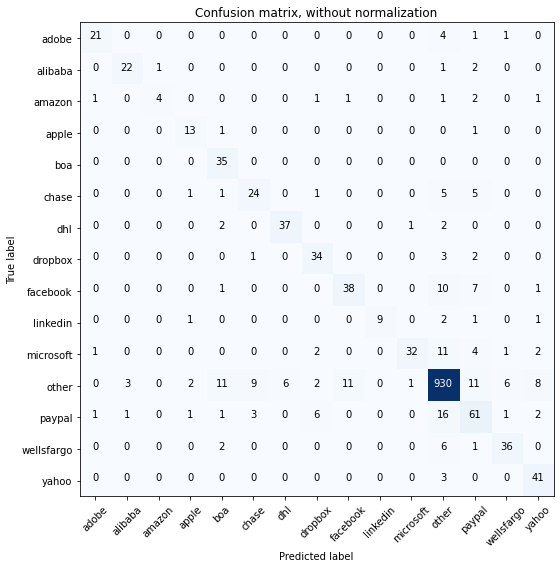

Acc     =  0.869
Pre     =  0.875
Rec     =  0.869
F1      =  0.868

Bal_Acc =  0.764
Bal_Pre =  0.795
Bal_Rec =  0.764
Bal_F1  =  0.779

              precision    recall  f1-score   support

       adobe       0.88      0.78      0.82        27
     alibaba       0.85      0.85      0.85        26
      amazon       0.80      0.36      0.50        11
       apple       0.72      0.87      0.79        15
         boa       0.65      1.00      0.79        35
       chase       0.65      0.65      0.65        37
         dhl       0.86      0.88      0.87        42
     dropbox       0.74      0.85      0.79        40
    facebook       0.76      0.67      0.71        57
    linkedin       1.00      0.64      0.78        14
   microsoft       0.94      0.60      0.74        53
       other       0.94      0.93      0.93      1000
      paypal       0.62      0.66      0.64        93
  wellsfargo       0.80      0.80      0.80        45
       yahoo       0.73      0.93      0.82        

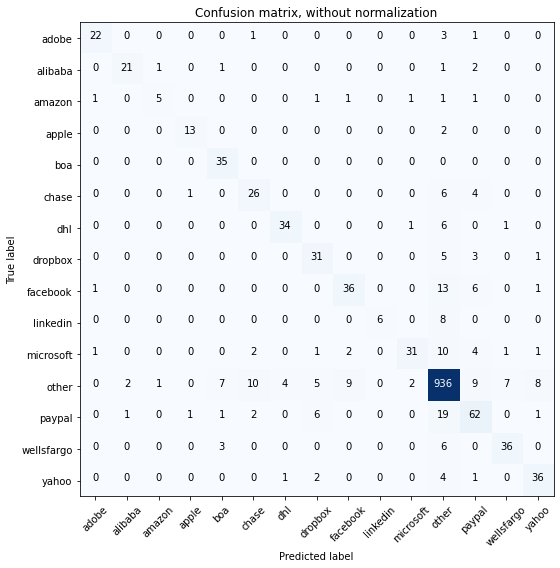

Acc     =  0.864
Pre     =  0.866
Rec     =  0.864
F1      =  0.862

Bal_Acc =  0.74
Bal_Pre =  0.802
Bal_Rec =  0.74
Bal_F1  =  0.77

              precision    recall  f1-score   support

       adobe       0.88      0.81      0.85        27
     alibaba       0.88      0.81      0.84        26
      amazon       0.71      0.45      0.56        11
       apple       0.87      0.87      0.87        15
         boa       0.74      1.00      0.85        35
       chase       0.63      0.70      0.67        37
         dhl       0.87      0.81      0.84        42
     dropbox       0.67      0.78      0.72        40
    facebook       0.75      0.63      0.69        57
    linkedin       1.00      0.43      0.60        14
   microsoft       0.89      0.58      0.70        53
       other       0.92      0.94      0.93      1000
      paypal       0.67      0.67      0.67        93
  wellsfargo       0.80      0.80      0.80        45
       yahoo       0.75      0.82      0.78        44


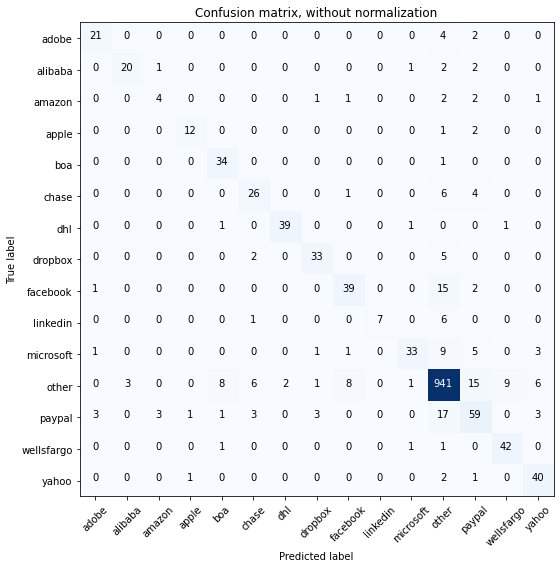

Acc     =  0.877
Pre     =  0.878
Rec     =  0.877
F1      =  0.875

Bal_Acc =  0.758
Bal_Pre =  0.804
Bal_Rec =  0.758
Bal_F1  =  0.78

              precision    recall  f1-score   support

       adobe       0.81      0.78      0.79        27
     alibaba       0.87      0.77      0.82        26
      amazon       0.50      0.36      0.42        11
       apple       0.86      0.80      0.83        15
         boa       0.76      0.97      0.85        35
       chase       0.68      0.70      0.69        37
         dhl       0.95      0.93      0.94        42
     dropbox       0.85      0.82      0.84        40
    facebook       0.78      0.68      0.73        57
    linkedin       1.00      0.50      0.67        14
   microsoft       0.89      0.62      0.73        53
       other       0.93      0.94      0.94      1000
      paypal       0.63      0.63      0.63        93
  wellsfargo       0.81      0.93      0.87        45
       yahoo       0.75      0.91      0.82        4

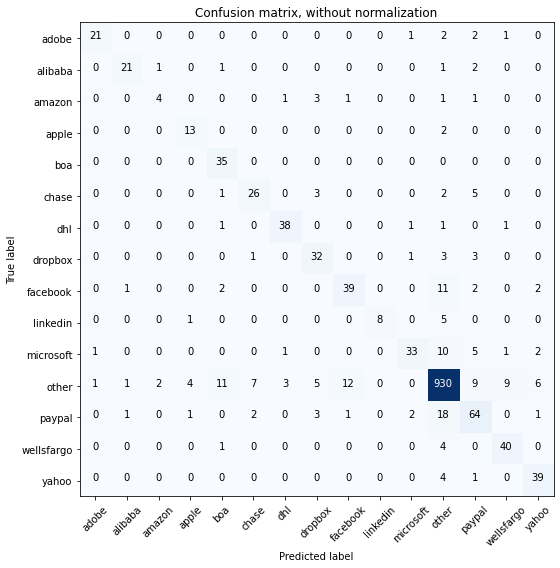

Acc     =  0.873
Pre     =  0.877
Rec     =  0.873
F1      =  0.872

Bal_Acc =  0.766
Bal_Pre =  0.786
Bal_Rec =  0.766
Bal_F1  =  0.776

              precision    recall  f1-score   support

       adobe       0.91      0.78      0.84        27
     alibaba       0.88      0.81      0.84        26
      amazon       0.57      0.36      0.44        11
       apple       0.68      0.87      0.76        15
         boa       0.67      1.00      0.80        35
       chase       0.72      0.70      0.71        37
         dhl       0.88      0.90      0.89        42
     dropbox       0.70      0.80      0.74        40
    facebook       0.74      0.68      0.71        57
    linkedin       1.00      0.57      0.73        14
   microsoft       0.87      0.62      0.73        53
       other       0.94      0.93      0.93      1000
      paypal       0.68      0.69      0.68        93
  wellsfargo       0.77      0.89      0.82        45
       yahoo       0.78      0.89      0.83        

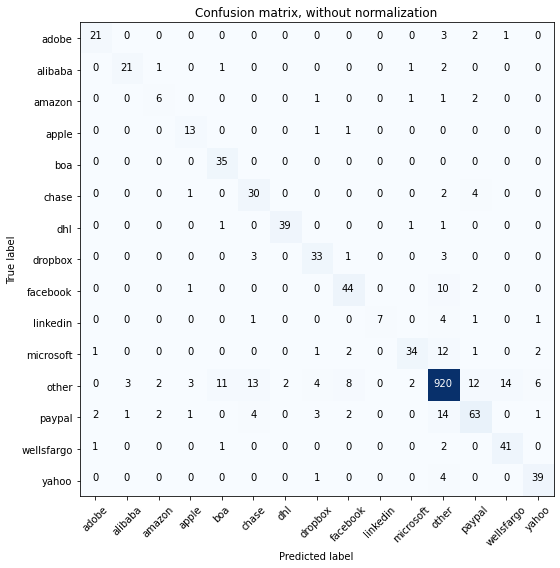

Acc     =  0.875
Pre     =  0.882
Rec     =  0.875
F1      =  0.875

Bal_Acc =  0.791
Bal_Pre =  0.782
Bal_Rec =  0.791
Bal_F1  =  0.786

              precision    recall  f1-score   support

       adobe       0.84      0.78      0.81        27
     alibaba       0.84      0.81      0.82        26
      amazon       0.55      0.55      0.55        11
       apple       0.68      0.87      0.76        15
         boa       0.71      1.00      0.83        35
       chase       0.59      0.81      0.68        37
         dhl       0.95      0.93      0.94        42
     dropbox       0.75      0.82      0.79        40
    facebook       0.76      0.77      0.77        57
    linkedin       1.00      0.50      0.67        14
   microsoft       0.87      0.64      0.74        53
       other       0.94      0.92      0.93      1000
      paypal       0.72      0.68      0.70        93
  wellsfargo       0.73      0.91      0.81        45
       yahoo       0.80      0.89      0.84        

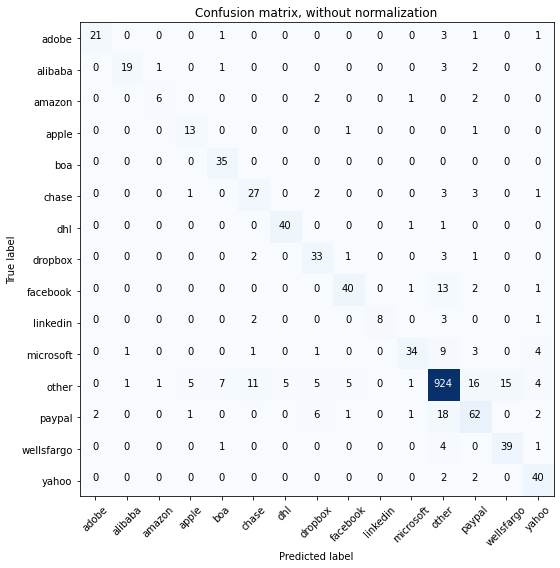

Acc     =  0.871
Pre     =  0.878
Rec     =  0.871
F1      =  0.872

Bal_Acc =  0.781
Bal_Pre =  0.795
Bal_Rec =  0.781
Bal_F1  =  0.788

              precision    recall  f1-score   support

       adobe       0.91      0.78      0.84        27
     alibaba       0.90      0.73      0.81        26
      amazon       0.75      0.55      0.63        11
       apple       0.65      0.87      0.74        15
         boa       0.78      1.00      0.88        35
       chase       0.63      0.73      0.68        37
         dhl       0.89      0.95      0.92        42
     dropbox       0.67      0.82      0.74        40
    facebook       0.83      0.70      0.76        57
    linkedin       1.00      0.57      0.73        14
   microsoft       0.87      0.64      0.74        53
       other       0.94      0.92      0.93      1000
      paypal       0.65      0.67      0.66        93
  wellsfargo       0.72      0.87      0.79        45
       yahoo       0.73      0.91      0.81        

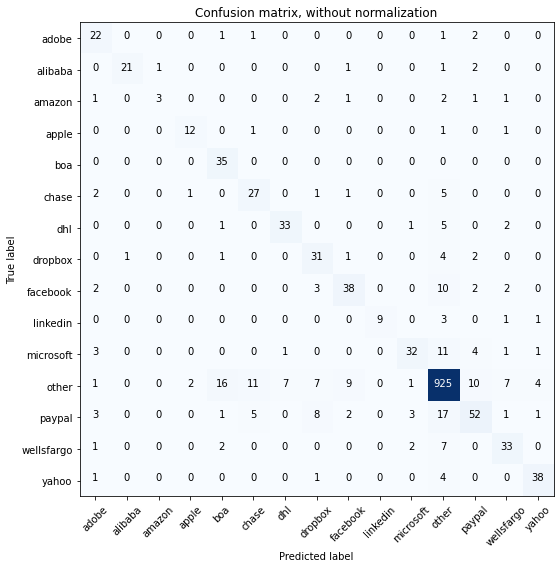

Acc     =  0.852
Pre     =  0.859
Rec     =  0.852
F1      =  0.851

Bal_Acc =  0.732
Bal_Pre =  0.76
Bal_Rec =  0.732
Bal_F1  =  0.746

              precision    recall  f1-score   support

       adobe       0.61      0.81      0.70        27
     alibaba       0.95      0.81      0.88        26
      amazon       0.75      0.27      0.40        11
       apple       0.80      0.80      0.80        15
         boa       0.61      1.00      0.76        35
       chase       0.60      0.73      0.66        37
         dhl       0.80      0.79      0.80        42
     dropbox       0.58      0.78      0.67        40
    facebook       0.72      0.67      0.69        57
    linkedin       1.00      0.64      0.78        14
   microsoft       0.82      0.60      0.70        53
       other       0.93      0.93      0.93      1000
      paypal       0.69      0.56      0.62        93
  wellsfargo       0.67      0.73      0.70        45
       yahoo       0.84      0.86      0.85        4

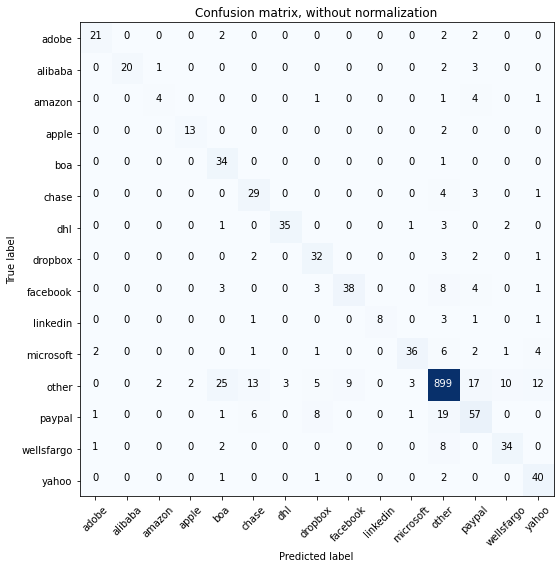

Acc     =  0.845
Pre     =  0.862
Rec     =  0.845
F1      =  0.848

Bal_Acc =  0.751
Bal_Pre =  0.765
Bal_Rec =  0.751
Bal_F1  =  0.758

              precision    recall  f1-score   support

       adobe       0.84      0.78      0.81        27
     alibaba       1.00      0.77      0.87        26
      amazon       0.57      0.36      0.44        11
       apple       0.87      0.87      0.87        15
         boa       0.49      0.97      0.65        35
       chase       0.56      0.78      0.65        37
         dhl       0.92      0.83      0.88        42
     dropbox       0.63      0.80      0.70        40
    facebook       0.81      0.67      0.73        57
    linkedin       1.00      0.57      0.73        14
   microsoft       0.88      0.68      0.77        53
       other       0.93      0.90      0.92      1000
      paypal       0.60      0.61      0.61        93
  wellsfargo       0.72      0.76      0.74        45
       yahoo       0.66      0.91      0.76        

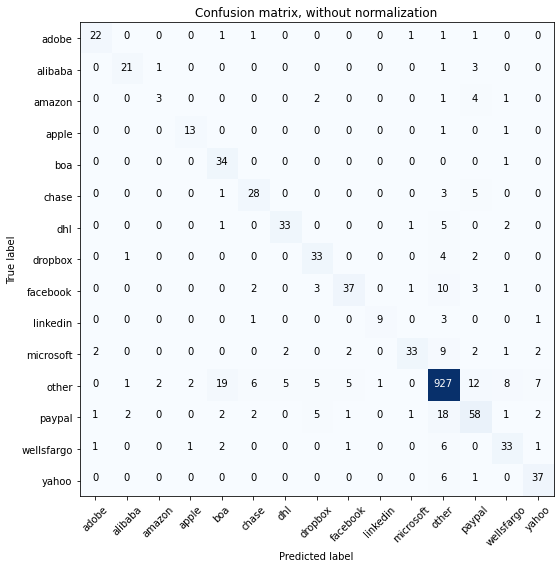

Acc     =  0.858
Pre     =  0.864
Rec     =  0.858
F1      =  0.858

Bal_Acc =  0.743
Bal_Pre =  0.757
Bal_Rec =  0.743
Bal_F1  =  0.75

              precision    recall  f1-score   support

       adobe       0.85      0.81      0.83        27
     alibaba       0.84      0.81      0.82        26
      amazon       0.50      0.27      0.35        11
       apple       0.81      0.87      0.84        15
         boa       0.57      0.97      0.72        35
       chase       0.70      0.76      0.73        37
         dhl       0.82      0.79      0.80        42
     dropbox       0.69      0.82      0.75        40
    facebook       0.80      0.65      0.72        57
    linkedin       0.90      0.64      0.75        14
   microsoft       0.89      0.62      0.73        53
       other       0.93      0.93      0.93      1000
      paypal       0.64      0.62      0.63        93
  wellsfargo       0.67      0.73      0.70        45
       yahoo       0.74      0.84      0.79        4

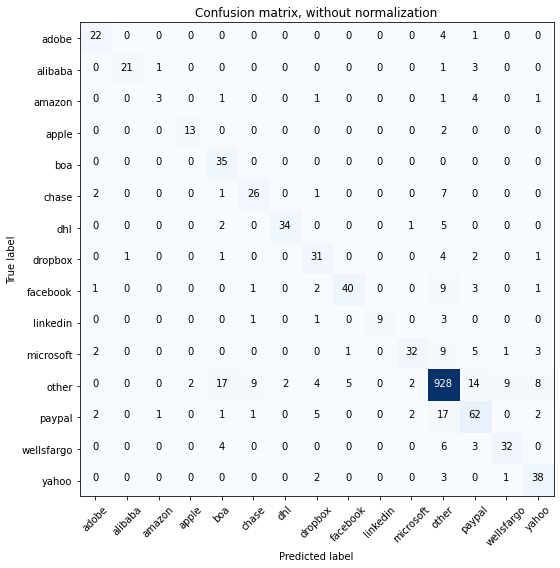

Acc     =  0.862
Pre     =  0.87
Rec     =  0.862
F1      =  0.862

Bal_Acc =  0.744
Bal_Pre =  0.786
Bal_Rec =  0.744
Bal_F1  =  0.764

              precision    recall  f1-score   support

       adobe       0.76      0.81      0.79        27
     alibaba       0.95      0.81      0.88        26
      amazon       0.60      0.27      0.37        11
       apple       0.87      0.87      0.87        15
         boa       0.56      1.00      0.72        35
       chase       0.68      0.70      0.69        37
         dhl       0.94      0.81      0.87        42
     dropbox       0.66      0.78      0.71        40
    facebook       0.87      0.70      0.78        57
    linkedin       1.00      0.64      0.78        14
   microsoft       0.86      0.60      0.71        53
       other       0.93      0.93      0.93      1000
      paypal       0.64      0.67      0.65        93
  wellsfargo       0.74      0.71      0.73        45
       yahoo       0.70      0.86      0.78        4

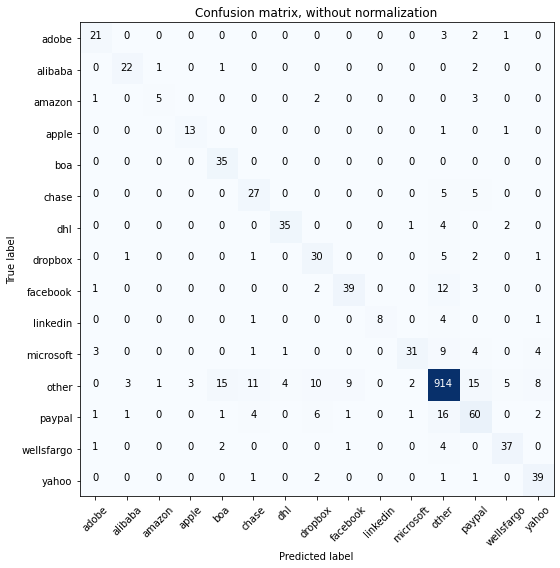

Acc     =  0.855
Pre     =  0.865
Rec     =  0.855
F1      =  0.856

Bal_Acc =  0.758
Bal_Pre =  0.767
Bal_Rec =  0.758
Bal_F1  =  0.762

              precision    recall  f1-score   support

       adobe       0.75      0.78      0.76        27
     alibaba       0.81      0.85      0.83        26
      amazon       0.71      0.45      0.56        11
       apple       0.81      0.87      0.84        15
         boa       0.65      1.00      0.79        35
       chase       0.59      0.73      0.65        37
         dhl       0.88      0.83      0.85        42
     dropbox       0.58      0.75      0.65        40
    facebook       0.78      0.68      0.73        57
    linkedin       1.00      0.57      0.73        14
   microsoft       0.89      0.58      0.70        53
       other       0.93      0.91      0.92      1000
      paypal       0.62      0.65      0.63        93
  wellsfargo       0.80      0.82      0.81        45
       yahoo       0.71      0.89      0.79        

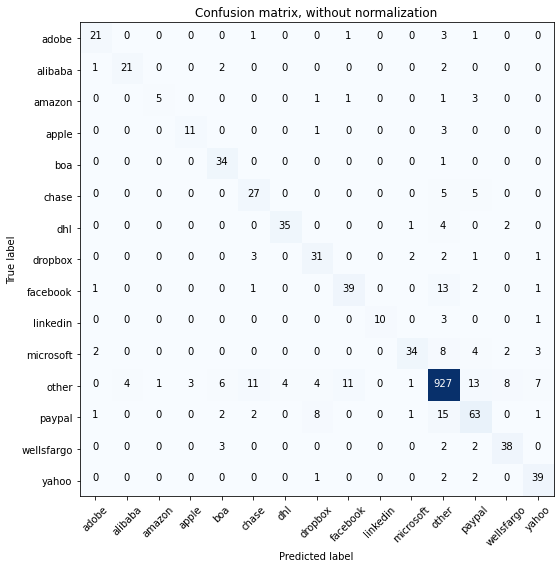

Acc     =  0.867
Pre     =  0.872
Rec     =  0.867
F1      =  0.868

Bal_Acc =  0.764
Bal_Pre =  0.791
Bal_Rec =  0.764
Bal_F1  =  0.777

              precision    recall  f1-score   support

       adobe       0.81      0.78      0.79        27
     alibaba       0.84      0.81      0.82        26
      amazon       0.83      0.45      0.59        11
       apple       0.79      0.73      0.76        15
         boa       0.72      0.97      0.83        35
       chase       0.60      0.73      0.66        37
         dhl       0.90      0.83      0.86        42
     dropbox       0.67      0.78      0.72        40
    facebook       0.75      0.68      0.72        57
    linkedin       1.00      0.71      0.83        14
   microsoft       0.87      0.64      0.74        53
       other       0.94      0.93      0.93      1000
      paypal       0.66      0.68      0.67        93
  wellsfargo       0.76      0.84      0.80        45
       yahoo       0.74      0.89      0.80        

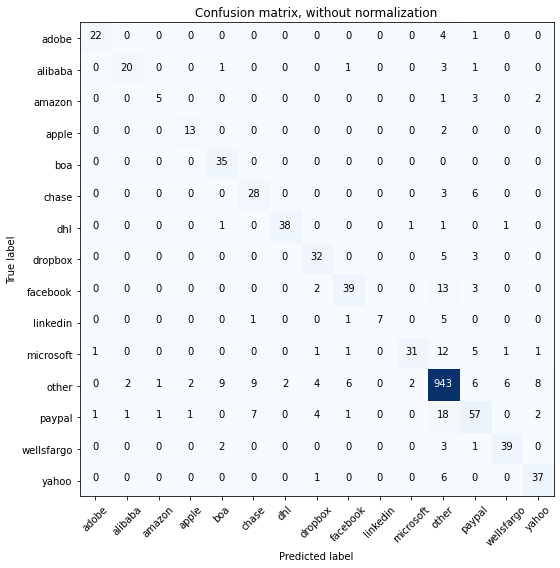

Acc     =  0.875
Pre     =  0.877
Rec     =  0.875
F1      =  0.872

Bal_Acc =  0.76
Bal_Pre =  0.814
Bal_Rec =  0.76
Bal_F1  =  0.786

              precision    recall  f1-score   support

       adobe       0.92      0.81      0.86        27
     alibaba       0.87      0.77      0.82        26
      amazon       0.71      0.45      0.56        11
       apple       0.81      0.87      0.84        15
         boa       0.73      1.00      0.84        35
       chase       0.62      0.76      0.68        37
         dhl       0.95      0.90      0.93        42
     dropbox       0.73      0.80      0.76        40
    facebook       0.80      0.68      0.74        57
    linkedin       1.00      0.50      0.67        14
   microsoft       0.91      0.58      0.71        53
       other       0.93      0.94      0.93      1000
      paypal       0.66      0.61      0.64        93
  wellsfargo       0.83      0.87      0.85        45
       yahoo       0.74      0.84      0.79        44

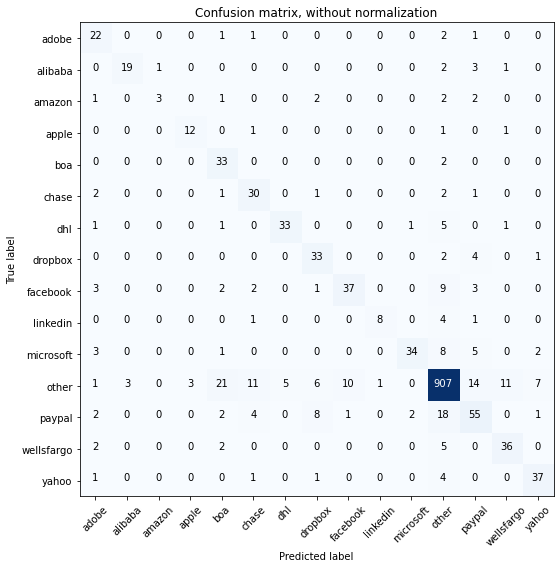

Acc     =  0.844
Pre     =  0.858
Rec     =  0.844
F1      =  0.846

Bal_Acc =  0.732
Bal_Pre =  0.747
Bal_Rec =  0.732
Bal_F1  =  0.739

              precision    recall  f1-score   support

       adobe       0.58      0.81      0.68        27
     alibaba       0.86      0.73      0.79        26
      amazon       0.75      0.27      0.40        11
       apple       0.80      0.80      0.80        15
         boa       0.51      0.94      0.66        35
       chase       0.59      0.81      0.68        37
         dhl       0.87      0.79      0.82        42
     dropbox       0.63      0.82      0.72        40
    facebook       0.77      0.65      0.70        57
    linkedin       0.89      0.57      0.70        14
   microsoft       0.92      0.64      0.76        53
       other       0.93      0.91      0.92      1000
      paypal       0.62      0.59      0.60        93
  wellsfargo       0.72      0.80      0.76        45
       yahoo       0.77      0.84      0.80        

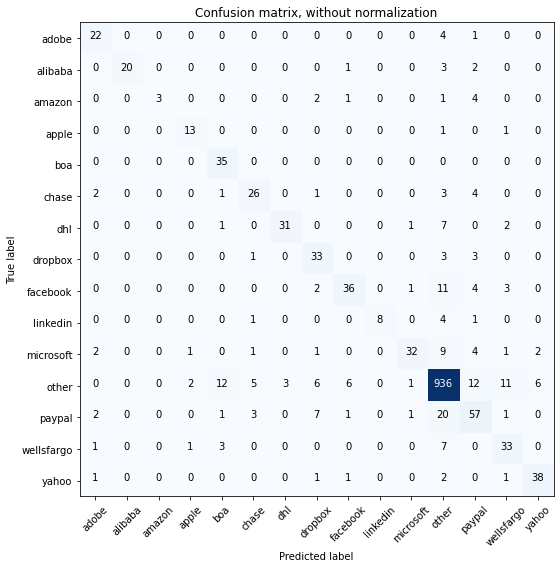

Acc     =  0.86
Pre     =  0.867
Rec     =  0.86
F1      =  0.858

Bal_Acc =  0.729
Bal_Pre =  0.804
Bal_Rec =  0.729
Bal_F1  =  0.765

              precision    recall  f1-score   support

       adobe       0.73      0.81      0.77        27
     alibaba       1.00      0.77      0.87        26
      amazon       1.00      0.27      0.43        11
       apple       0.76      0.87      0.81        15
         boa       0.66      1.00      0.80        35
       chase       0.70      0.70      0.70        37
         dhl       0.91      0.74      0.82        42
     dropbox       0.62      0.82      0.71        40
    facebook       0.78      0.63      0.70        57
    linkedin       1.00      0.57      0.73        14
   microsoft       0.89      0.60      0.72        53
       other       0.93      0.94      0.93      1000
      paypal       0.62      0.61      0.62        93
  wellsfargo       0.62      0.73      0.67        45
       yahoo       0.83      0.86      0.84        44

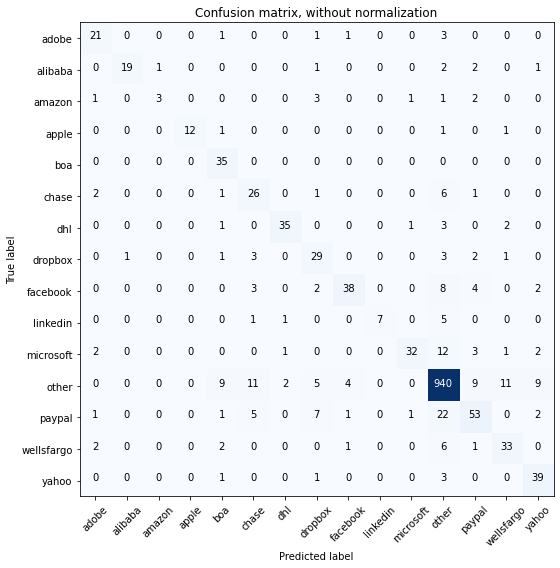

Acc     =  0.859
Pre     =  0.866
Rec     =  0.859
F1      =  0.857

Bal_Acc =  0.716
Bal_Pre =  0.79
Bal_Rec =  0.716
Bal_F1  =  0.751

              precision    recall  f1-score   support

       adobe       0.72      0.78      0.75        27
     alibaba       0.95      0.73      0.83        26
      amazon       0.75      0.27      0.40        11
       apple       1.00      0.80      0.89        15
         boa       0.66      1.00      0.80        35
       chase       0.53      0.70      0.60        37
         dhl       0.90      0.83      0.86        42
     dropbox       0.58      0.72      0.64        40
    facebook       0.84      0.67      0.75        57
    linkedin       1.00      0.50      0.67        14
   microsoft       0.91      0.60      0.73        53
       other       0.93      0.94      0.93      1000
      paypal       0.69      0.57      0.62        93
  wellsfargo       0.67      0.73      0.70        45
       yahoo       0.71      0.89      0.79        4

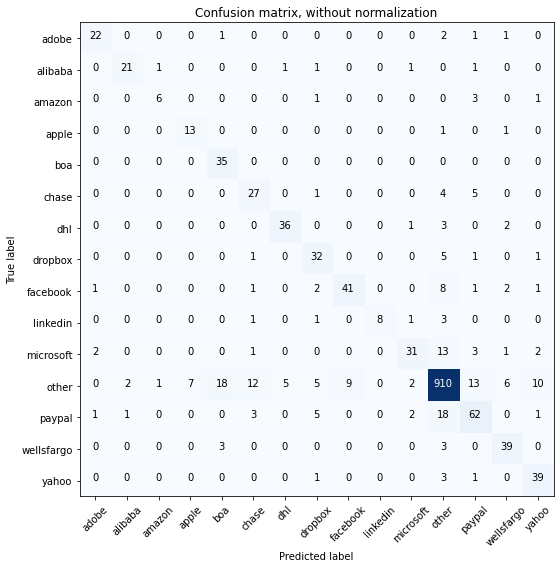

Acc     =  0.859
Pre     =  0.868
Rec     =  0.859
F1      =  0.86

Bal_Acc =  0.775
Bal_Pre =  0.77
Bal_Rec =  0.775
Bal_F1  =  0.772

              precision    recall  f1-score   support

       adobe       0.85      0.81      0.83        27
     alibaba       0.88      0.81      0.84        26
      amazon       0.75      0.55      0.63        11
       apple       0.65      0.87      0.74        15
         boa       0.61      1.00      0.76        35
       chase       0.59      0.73      0.65        37
         dhl       0.86      0.86      0.86        42
     dropbox       0.65      0.80      0.72        40
    facebook       0.82      0.72      0.77        57
    linkedin       1.00      0.57      0.73        14
   microsoft       0.82      0.58      0.68        53
       other       0.94      0.91      0.92      1000
      paypal       0.68      0.67      0.67        93
  wellsfargo       0.75      0.87      0.80        45
       yahoo       0.71      0.89      0.79        44

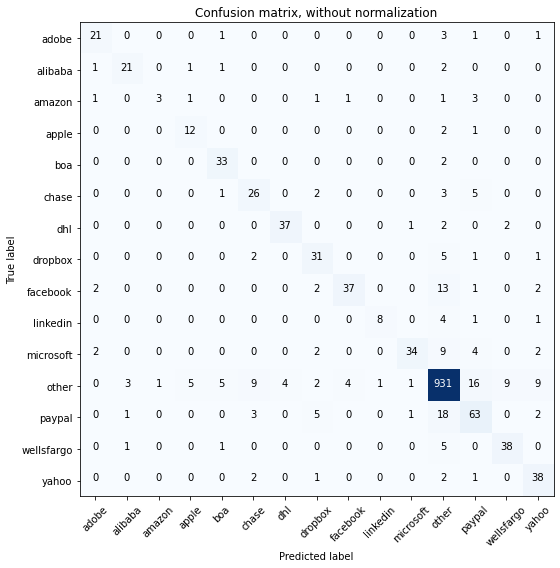

Acc     =  0.866
Pre     =  0.871
Rec     =  0.866
F1      =  0.865

Bal_Acc =  0.743
Bal_Pre =  0.778
Bal_Rec =  0.743
Bal_F1  =  0.76

              precision    recall  f1-score   support

       adobe       0.78      0.78      0.78        27
     alibaba       0.81      0.81      0.81        26
      amazon       0.75      0.27      0.40        11
       apple       0.63      0.80      0.71        15
         boa       0.79      0.94      0.86        35
       chase       0.62      0.70      0.66        37
         dhl       0.90      0.88      0.89        42
     dropbox       0.67      0.78      0.72        40
    facebook       0.88      0.65      0.75        57
    linkedin       0.89      0.57      0.70        14
   microsoft       0.92      0.64      0.76        53
       other       0.93      0.93      0.93      1000
      paypal       0.65      0.68      0.66        93
  wellsfargo       0.78      0.84      0.81        45
       yahoo       0.68      0.86      0.76        4

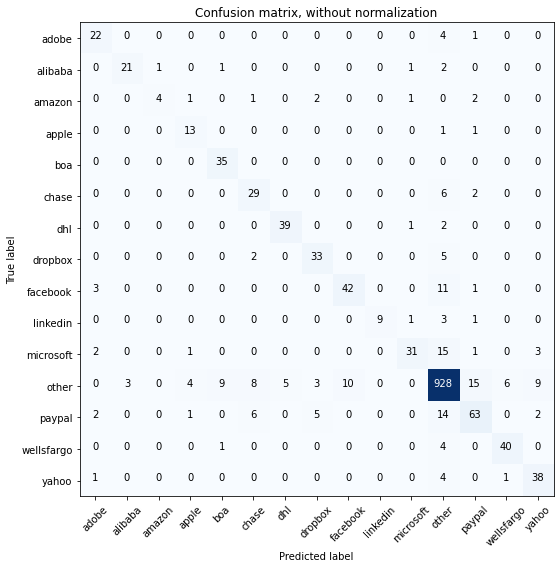

Acc     =  0.875
Pre     =  0.879
Rec     =  0.875
F1      =  0.874

Bal_Acc =  0.781
Bal_Pre =  0.802
Bal_Rec =  0.781
Bal_F1  =  0.791

              precision    recall  f1-score   support

       adobe       0.73      0.81      0.77        27
     alibaba       0.88      0.81      0.84        26
      amazon       0.80      0.36      0.50        11
       apple       0.65      0.87      0.74        15
         boa       0.76      1.00      0.86        35
       chase       0.63      0.78      0.70        37
         dhl       0.89      0.93      0.91        42
     dropbox       0.77      0.82      0.80        40
    facebook       0.81      0.74      0.77        57
    linkedin       1.00      0.64      0.78        14
   microsoft       0.89      0.58      0.70        53
       other       0.93      0.93      0.93      1000
      paypal       0.72      0.68      0.70        93
  wellsfargo       0.85      0.89      0.87        45
       yahoo       0.73      0.86      0.79        

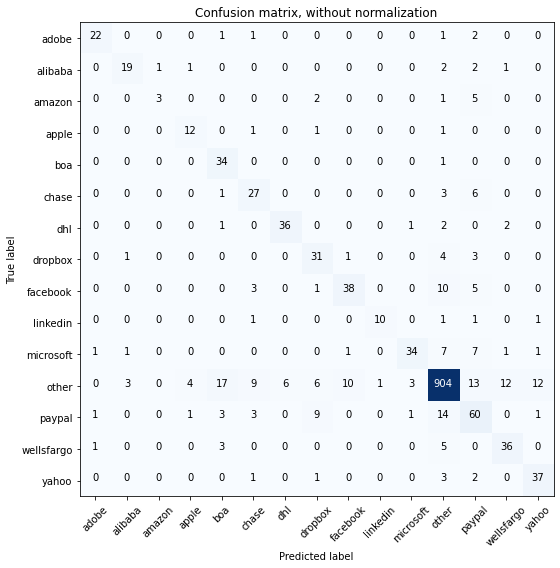

Acc     =  0.847
Pre     =  0.861
Rec     =  0.847
F1      =  0.85

Bal_Acc =  0.744
Bal_Pre =  0.744
Bal_Rec =  0.744
Bal_F1  =  0.744

              precision    recall  f1-score   support

       adobe       0.88      0.81      0.85        27
     alibaba       0.79      0.73      0.76        26
      amazon       0.75      0.27      0.40        11
       apple       0.67      0.80      0.73        15
         boa       0.57      0.97      0.72        35
       chase       0.59      0.73      0.65        37
         dhl       0.86      0.86      0.86        42
     dropbox       0.61      0.78      0.68        40
    facebook       0.76      0.67      0.71        57
    linkedin       0.91      0.71      0.80        14
   microsoft       0.87      0.64      0.74        53
       other       0.94      0.90      0.92      1000
      paypal       0.57      0.65      0.60        93
  wellsfargo       0.69      0.80      0.74        45
       yahoo       0.71      0.84      0.77        4

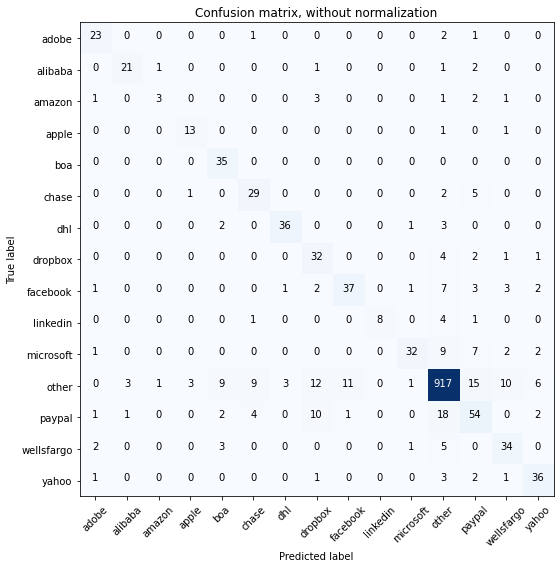

Acc     =  0.851
Pre     =  0.861
Rec     =  0.851
F1      =  0.852

Bal_Acc =  0.742
Bal_Pre =  0.752
Bal_Rec =  0.742
Bal_F1  =  0.747

              precision    recall  f1-score   support

       adobe       0.77      0.85      0.81        27
     alibaba       0.84      0.81      0.82        26
      amazon       0.60      0.27      0.37        11
       apple       0.76      0.87      0.81        15
         boa       0.69      1.00      0.81        35
       chase       0.66      0.78      0.72        37
         dhl       0.90      0.86      0.88        42
     dropbox       0.52      0.80      0.63        40
    facebook       0.76      0.65      0.70        57
    linkedin       1.00      0.57      0.73        14
   microsoft       0.89      0.60      0.72        53
       other       0.94      0.92      0.93      1000
      paypal       0.57      0.58      0.58        93
  wellsfargo       0.64      0.76      0.69        45
       yahoo       0.73      0.82      0.77        

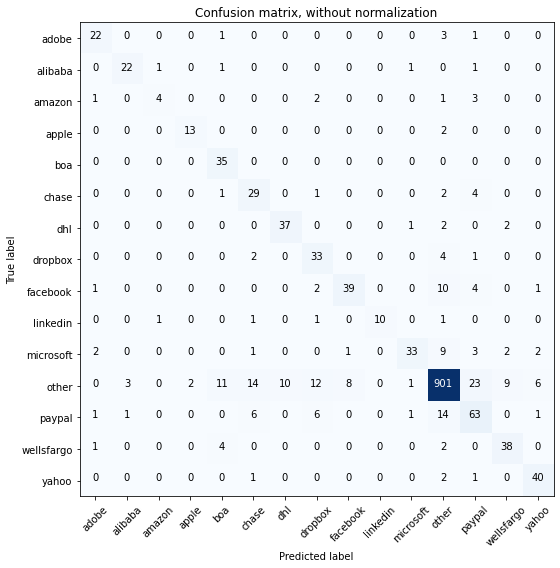

Acc     =  0.857
Pre     =  0.871
Rec     =  0.857
F1      =  0.86

Bal_Acc =  0.782
Bal_Pre =  0.769
Bal_Rec =  0.782
Bal_F1  =  0.775

              precision    recall  f1-score   support

       adobe       0.79      0.81      0.80        27
     alibaba       0.85      0.85      0.85        26
      amazon       0.67      0.36      0.47        11
       apple       0.87      0.87      0.87        15
         boa       0.66      1.00      0.80        35
       chase       0.54      0.78      0.64        37
         dhl       0.79      0.88      0.83        42
     dropbox       0.58      0.82      0.68        40
    facebook       0.81      0.68      0.74        57
    linkedin       1.00      0.71      0.83        14
   microsoft       0.89      0.62      0.73        53
       other       0.95      0.90      0.92      1000
      paypal       0.61      0.68      0.64        93
  wellsfargo       0.75      0.84      0.79        45
       yahoo       0.80      0.91      0.85        4

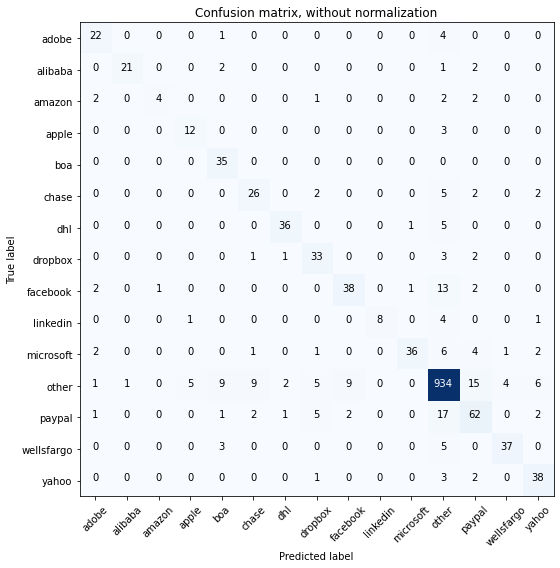

Acc     =  0.872
Pre     =  0.877
Rec     =  0.872
F1      =  0.871

Bal_Acc =  0.758
Bal_Pre =  0.803
Bal_Rec =  0.758
Bal_F1  =  0.78

              precision    recall  f1-score   support

       adobe       0.73      0.81      0.77        27
     alibaba       0.95      0.81      0.88        26
      amazon       0.80      0.36      0.50        11
       apple       0.67      0.80      0.73        15
         boa       0.69      1.00      0.81        35
       chase       0.67      0.70      0.68        37
         dhl       0.90      0.86      0.88        42
     dropbox       0.69      0.82      0.75        40
    facebook       0.78      0.67      0.72        57
    linkedin       1.00      0.57      0.73        14
   microsoft       0.95      0.68      0.79        53
       other       0.93      0.93      0.93      1000
      paypal       0.67      0.67      0.67        93
  wellsfargo       0.88      0.82      0.85        45
       yahoo       0.75      0.86      0.80        4

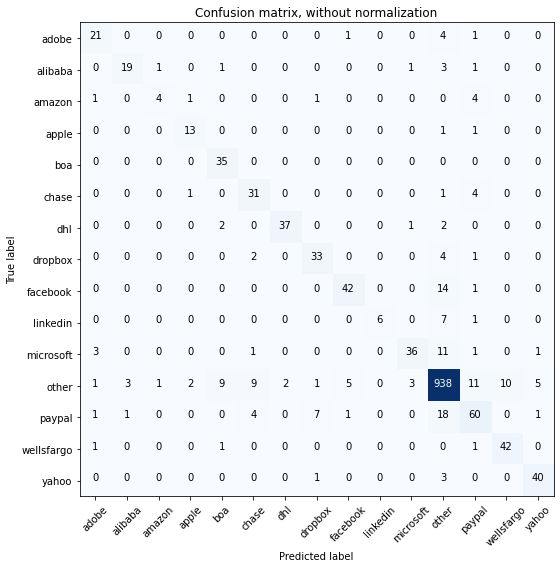

Acc     =  0.882
Pre     =  0.884
Rec     =  0.882
F1      =  0.88

Bal_Acc =  0.77
Bal_Pre =  0.809
Bal_Rec =  0.77
Bal_F1  =  0.789

              precision    recall  f1-score   support

       adobe       0.75      0.78      0.76        27
     alibaba       0.83      0.73      0.78        26
      amazon       0.67      0.36      0.47        11
       apple       0.76      0.87      0.81        15
         boa       0.73      1.00      0.84        35
       chase       0.66      0.84      0.74        37
         dhl       0.95      0.88      0.91        42
     dropbox       0.77      0.82      0.80        40
    facebook       0.86      0.74      0.79        57
    linkedin       1.00      0.43      0.60        14
   microsoft       0.88      0.68      0.77        53
       other       0.93      0.94      0.94      1000
      paypal       0.69      0.65      0.67        93
  wellsfargo       0.81      0.93      0.87        45
       yahoo       0.85      0.91      0.88        44


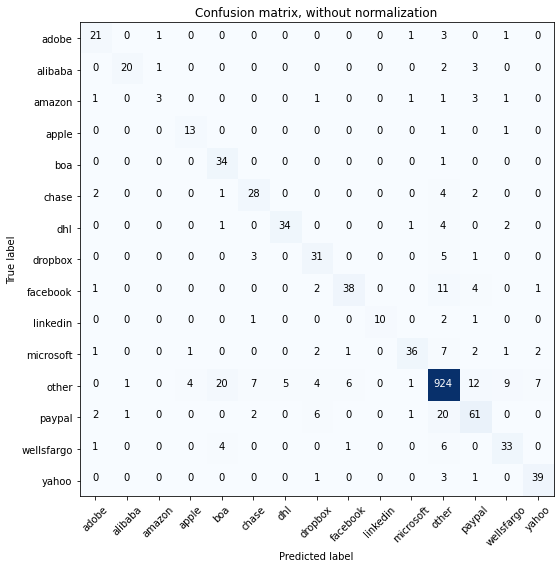

Acc     =  0.861
Pre     =  0.867
Rec     =  0.861
F1      =  0.861

Bal_Acc =  0.751
Bal_Pre =  0.769
Bal_Rec =  0.751
Bal_F1  =  0.76

              precision    recall  f1-score   support

       adobe       0.72      0.78      0.75        27
     alibaba       0.91      0.77      0.83        26
      amazon       0.60      0.27      0.37        11
       apple       0.72      0.87      0.79        15
         boa       0.57      0.97      0.72        35
       chase       0.68      0.76      0.72        37
         dhl       0.87      0.81      0.84        42
     dropbox       0.66      0.78      0.71        40
    facebook       0.83      0.67      0.74        57
    linkedin       1.00      0.71      0.83        14
   microsoft       0.88      0.68      0.77        53
       other       0.93      0.92      0.93      1000
      paypal       0.68      0.66      0.67        93
  wellsfargo       0.69      0.73      0.71        45
       yahoo       0.80      0.89      0.84        4

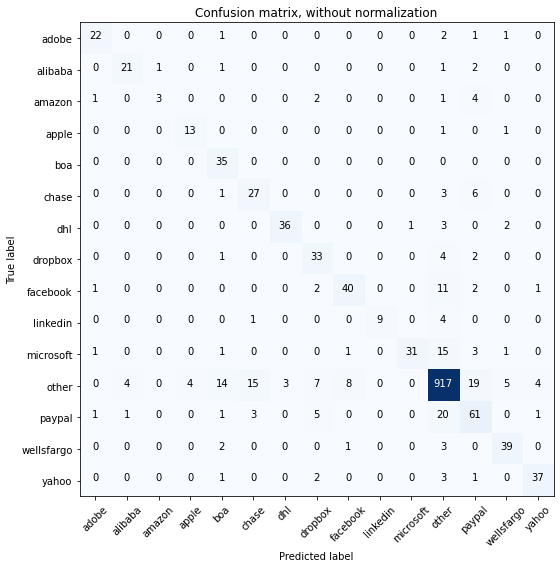

Acc     =  0.86
Pre     =  0.871
Rec     =  0.86
F1      =  0.861

Bal_Acc =  0.759
Bal_Pre =  0.792
Bal_Rec =  0.759
Bal_F1  =  0.775

              precision    recall  f1-score   support

       adobe       0.85      0.81      0.83        27
     alibaba       0.81      0.81      0.81        26
      amazon       0.75      0.27      0.40        11
       apple       0.76      0.87      0.81        15
         boa       0.60      1.00      0.75        35
       chase       0.59      0.73      0.65        37
         dhl       0.92      0.86      0.89        42
     dropbox       0.65      0.82      0.73        40
    facebook       0.80      0.70      0.75        57
    linkedin       1.00      0.64      0.78        14
   microsoft       0.97      0.58      0.73        53
       other       0.93      0.92      0.92      1000
      paypal       0.60      0.66      0.63        93
  wellsfargo       0.80      0.87      0.83        45
       yahoo       0.86      0.84      0.85        44

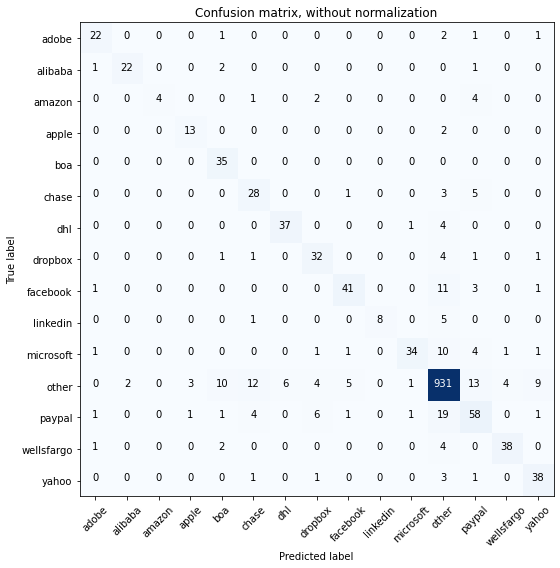

Acc     =  0.871
Pre     =  0.878
Rec     =  0.871
F1      =  0.871

Bal_Acc =  0.768
Bal_Pre =  0.817
Bal_Rec =  0.768
Bal_F1  =  0.792

              precision    recall  f1-score   support

       adobe       0.81      0.81      0.81        27
     alibaba       0.92      0.85      0.88        26
      amazon       1.00      0.36      0.53        11
       apple       0.76      0.87      0.81        15
         boa       0.67      1.00      0.80        35
       chase       0.58      0.76      0.66        37
         dhl       0.86      0.88      0.87        42
     dropbox       0.70      0.80      0.74        40
    facebook       0.84      0.72      0.77        57
    linkedin       1.00      0.57      0.73        14
   microsoft       0.92      0.64      0.76        53
       other       0.93      0.93      0.93      1000
      paypal       0.64      0.62      0.63        93
  wellsfargo       0.88      0.84      0.86        45
       yahoo       0.73      0.86      0.79        

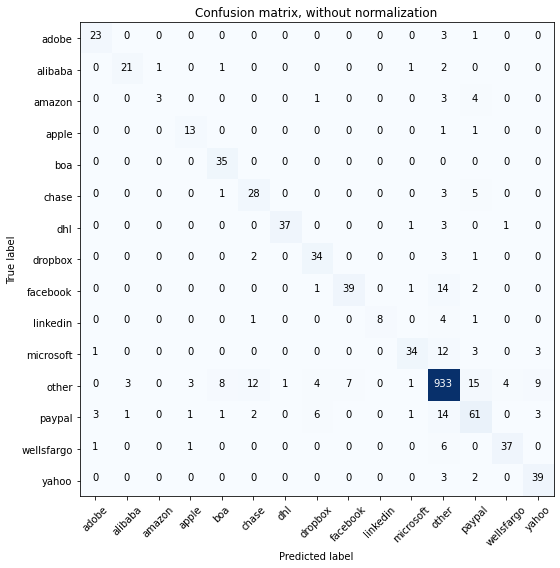

Acc     =  0.874
Pre     =  0.878
Rec     =  0.874
F1      =  0.873

Bal_Acc =  0.765
Bal_Pre =  0.808
Bal_Rec =  0.765
Bal_F1  =  0.786

              precision    recall  f1-score   support

       adobe       0.82      0.85      0.84        27
     alibaba       0.84      0.81      0.82        26
      amazon       0.75      0.27      0.40        11
       apple       0.72      0.87      0.79        15
         boa       0.76      1.00      0.86        35
       chase       0.62      0.76      0.68        37
         dhl       0.97      0.88      0.93        42
     dropbox       0.74      0.85      0.79        40
    facebook       0.85      0.68      0.76        57
    linkedin       1.00      0.57      0.73        14
   microsoft       0.87      0.64      0.74        53
       other       0.93      0.93      0.93      1000
      paypal       0.64      0.66      0.65        93
  wellsfargo       0.88      0.82      0.85        45
       yahoo       0.72      0.89      0.80        

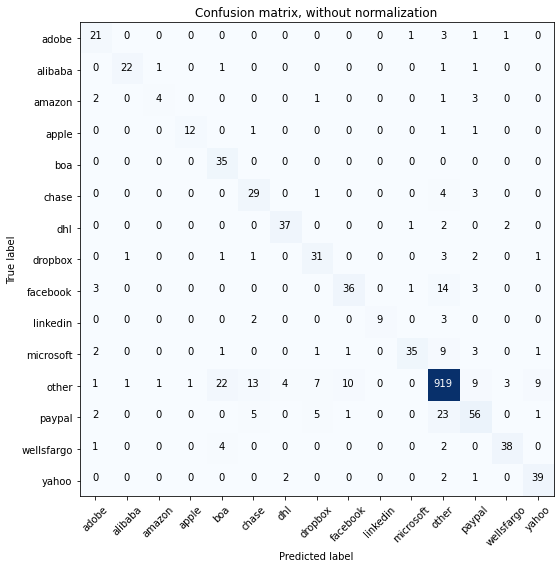

Acc     =  0.86
Pre     =  0.869
Rec     =  0.86
F1      =  0.86

Bal_Acc =  0.761
Bal_Pre =  0.781
Bal_Rec =  0.761
Bal_F1  =  0.771

              precision    recall  f1-score   support

       adobe       0.66      0.78      0.71        27
     alibaba       0.92      0.85      0.88        26
      amazon       0.67      0.36      0.47        11
       apple       0.92      0.80      0.86        15
         boa       0.55      1.00      0.71        35
       chase       0.57      0.78      0.66        37
         dhl       0.86      0.88      0.87        42
     dropbox       0.67      0.78      0.72        40
    facebook       0.75      0.63      0.69        57
    linkedin       1.00      0.64      0.78        14
   microsoft       0.92      0.66      0.77        53
       other       0.93      0.92      0.93      1000
      paypal       0.67      0.60      0.64        93
  wellsfargo       0.86      0.84      0.85        45
       yahoo       0.76      0.89      0.82        44


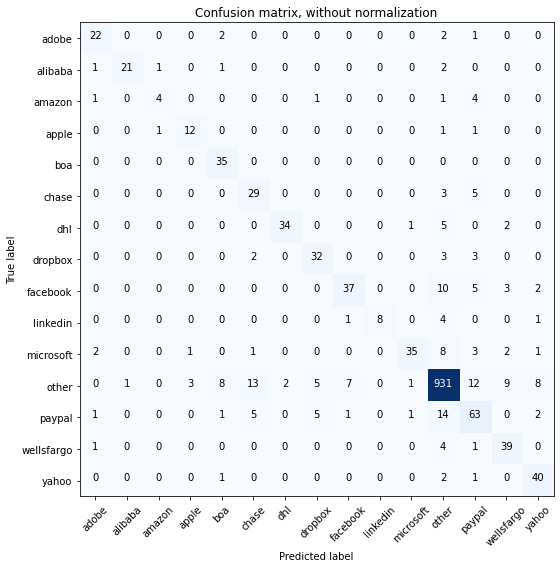

Acc     =  0.872
Pre     =  0.88
Rec     =  0.872
F1      =  0.872

Bal_Acc =  0.763
Bal_Pre =  0.794
Bal_Rec =  0.763
Bal_F1  =  0.778

              precision    recall  f1-score   support

       adobe       0.79      0.81      0.80        27
     alibaba       0.95      0.81      0.88        26
      amazon       0.67      0.36      0.47        11
       apple       0.75      0.80      0.77        15
         boa       0.73      1.00      0.84        35
       chase       0.58      0.78      0.67        37
         dhl       0.94      0.81      0.87        42
     dropbox       0.74      0.80      0.77        40
    facebook       0.80      0.65      0.72        57
    linkedin       1.00      0.57      0.73        14
   microsoft       0.92      0.66      0.77        53
       other       0.94      0.93      0.94      1000
      paypal       0.64      0.68      0.66        93
  wellsfargo       0.71      0.87      0.78        45
       yahoo       0.74      0.91      0.82        4

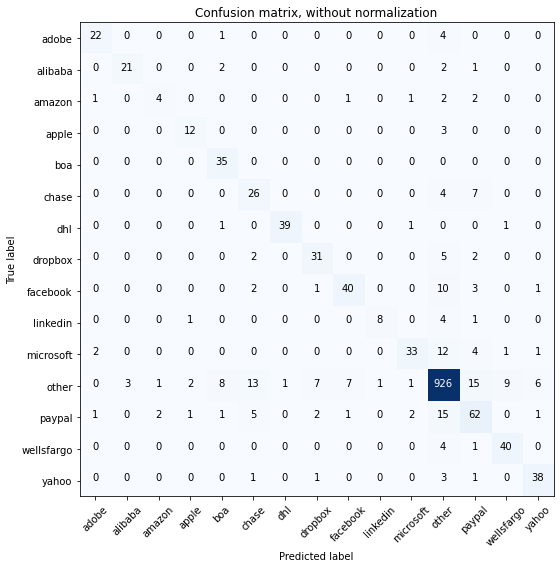

Acc     =  0.869
Pre     =  0.874
Rec     =  0.869
F1      =  0.869

Bal_Acc =  0.762
Bal_Pre =  0.783
Bal_Rec =  0.762
Bal_F1  =  0.772

              precision    recall  f1-score   support

       adobe       0.85      0.81      0.83        27
     alibaba       0.88      0.81      0.84        26
      amazon       0.57      0.36      0.44        11
       apple       0.75      0.80      0.77        15
         boa       0.73      1.00      0.84        35
       chase       0.53      0.70      0.60        37
         dhl       0.97      0.93      0.95        42
     dropbox       0.74      0.78      0.76        40
    facebook       0.82      0.70      0.75        57
    linkedin       0.89      0.57      0.70        14
   microsoft       0.87      0.62      0.73        53
       other       0.93      0.93      0.93      1000
      paypal       0.63      0.67      0.65        93
  wellsfargo       0.78      0.89      0.83        45
       yahoo       0.81      0.86      0.84        

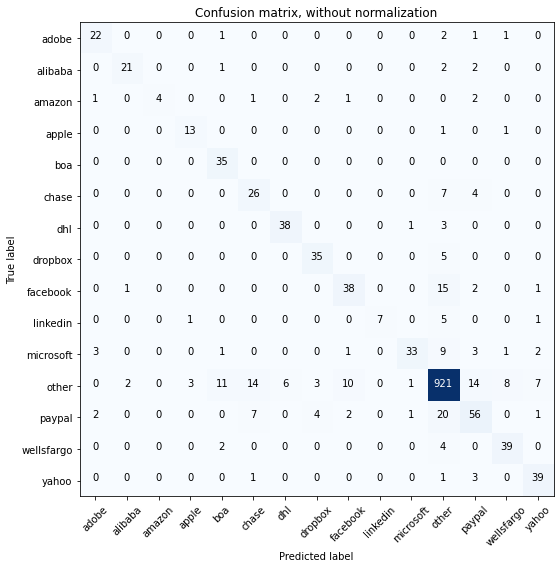

Acc     =  0.862
Pre     =  0.869
Rec     =  0.862
F1      =  0.861

Bal_Acc =  0.76
Bal_Pre =  0.804
Bal_Rec =  0.76
Bal_F1  =  0.781

              precision    recall  f1-score   support

       adobe       0.79      0.81      0.80        27
     alibaba       0.88      0.81      0.84        26
      amazon       1.00      0.36      0.53        11
       apple       0.76      0.87      0.81        15
         boa       0.69      1.00      0.81        35
       chase       0.53      0.70      0.60        37
         dhl       0.86      0.90      0.88        42
     dropbox       0.80      0.88      0.83        40
    facebook       0.73      0.67      0.70        57
    linkedin       1.00      0.50      0.67        14
   microsoft       0.92      0.62      0.74        53
       other       0.93      0.92      0.92      1000
      paypal       0.64      0.60      0.62        93
  wellsfargo       0.78      0.87      0.82        45
       yahoo       0.76      0.89      0.82        44

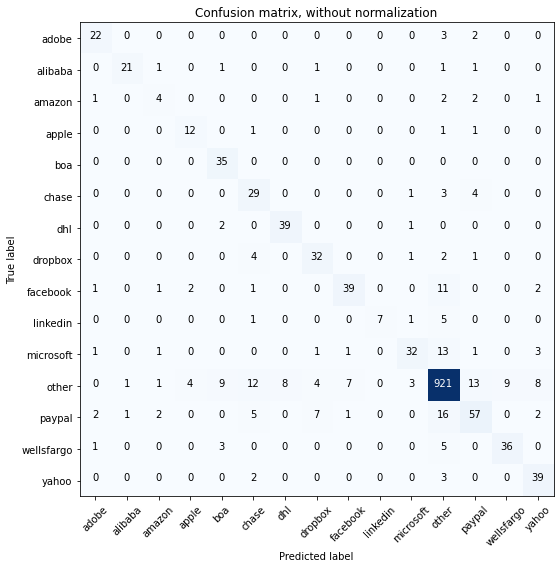

Acc     =  0.861
Pre     =  0.868
Rec     =  0.861
F1      =  0.861

Bal_Acc =  0.754
Bal_Pre =  0.753
Bal_Rec =  0.754
Bal_F1  =  0.753

              precision    recall  f1-score   support

       adobe       0.79      0.81      0.80        27
     alibaba       0.91      0.81      0.86        26
      amazon       0.40      0.36      0.38        11
       apple       0.67      0.80      0.73        15
         boa       0.70      1.00      0.82        35
       chase       0.53      0.78      0.63        37
         dhl       0.83      0.93      0.88        42
     dropbox       0.70      0.80      0.74        40
    facebook       0.81      0.68      0.74        57
    linkedin       1.00      0.50      0.67        14
   microsoft       0.82      0.60      0.70        53
       other       0.93      0.92      0.93      1000
      paypal       0.70      0.61      0.65        93
  wellsfargo       0.80      0.80      0.80        45
       yahoo       0.71      0.89      0.79        

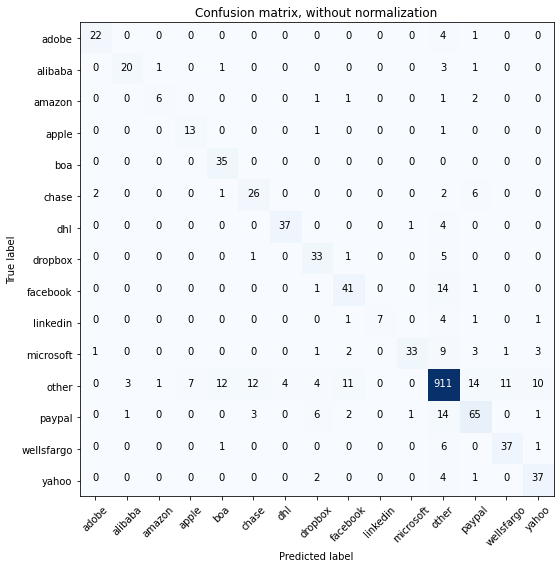

Acc     =  0.86
Pre     =  0.868
Rec     =  0.86
F1      =  0.86

Bal_Acc =  0.768
Bal_Pre =  0.781
Bal_Rec =  0.768
Bal_F1  =  0.774

              precision    recall  f1-score   support

       adobe       0.88      0.81      0.85        27
     alibaba       0.83      0.77      0.80        26
      amazon       0.75      0.55      0.63        11
       apple       0.65      0.87      0.74        15
         boa       0.70      1.00      0.82        35
       chase       0.62      0.70      0.66        37
         dhl       0.90      0.88      0.89        42
     dropbox       0.67      0.82      0.74        40
    facebook       0.69      0.72      0.71        57
    linkedin       1.00      0.50      0.67        14
   microsoft       0.94      0.62      0.75        53
       other       0.93      0.91      0.92      1000
      paypal       0.68      0.70      0.69        93
  wellsfargo       0.76      0.82      0.79        45
       yahoo       0.70      0.84      0.76        44


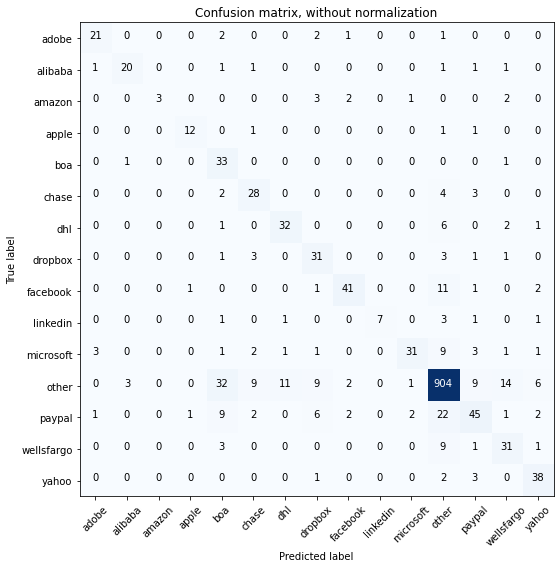

Acc     =  0.83
Pre     =  0.852
Rec     =  0.83
F1      =  0.833

Bal_Acc =  0.707
Bal_Pre =  0.76
Bal_Rec =  0.707
Bal_F1  =  0.733

              precision    recall  f1-score   support

       adobe       0.81      0.78      0.79        27
     alibaba       0.83      0.77      0.80        26
      amazon       1.00      0.27      0.43        11
       apple       0.86      0.80      0.83        15
         boa       0.38      0.94      0.55        35
       chase       0.61      0.76      0.67        37
         dhl       0.71      0.76      0.74        42
     dropbox       0.57      0.78      0.66        40
    facebook       0.85      0.72      0.78        57
    linkedin       1.00      0.50      0.67        14
   microsoft       0.89      0.58      0.70        53
       other       0.93      0.90      0.91      1000
      paypal       0.65      0.48      0.56        93
  wellsfargo       0.57      0.69      0.63        45
       yahoo       0.73      0.86      0.79        44


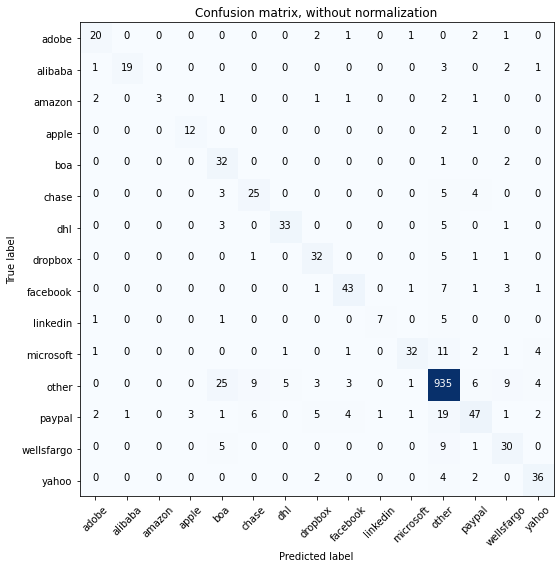

Acc     =  0.849
Pre     =  0.859
Rec     =  0.849
F1      =  0.848

Bal_Acc =  0.7
Bal_Pre =  0.775
Bal_Rec =  0.7
Bal_F1  =  0.736

              precision    recall  f1-score   support

       adobe       0.74      0.74      0.74        27
     alibaba       0.95      0.73      0.83        26
      amazon       1.00      0.27      0.43        11
       apple       0.80      0.80      0.80        15
         boa       0.45      0.91      0.60        35
       chase       0.61      0.68      0.64        37
         dhl       0.85      0.79      0.81        42
     dropbox       0.70      0.80      0.74        40
    facebook       0.81      0.75      0.78        57
    linkedin       0.88      0.50      0.64        14
   microsoft       0.89      0.60      0.72        53
       other       0.92      0.94      0.93      1000
      paypal       0.69      0.51      0.58        93
  wellsfargo       0.59      0.67      0.62        45
       yahoo       0.75      0.82      0.78        44



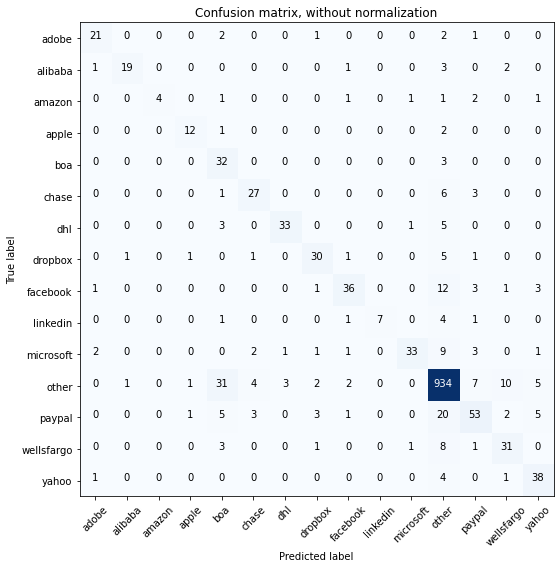

Acc     =  0.851
Pre     =  0.865
Rec     =  0.851
F1      =  0.852

Bal_Acc =  0.711
Bal_Pre =  0.803
Bal_Rec =  0.711
Bal_F1  =  0.754

              precision    recall  f1-score   support

       adobe       0.81      0.78      0.79        27
     alibaba       0.90      0.73      0.81        26
      amazon       1.00      0.36      0.53        11
       apple       0.80      0.80      0.80        15
         boa       0.40      0.91      0.56        35
       chase       0.73      0.73      0.73        37
         dhl       0.89      0.79      0.84        42
     dropbox       0.77      0.75      0.76        40
    facebook       0.82      0.63      0.71        57
    linkedin       1.00      0.50      0.67        14
   microsoft       0.92      0.62      0.74        53
       other       0.92      0.93      0.93      1000
      paypal       0.71      0.57      0.63        93
  wellsfargo       0.66      0.69      0.67        45
       yahoo       0.72      0.86      0.78        

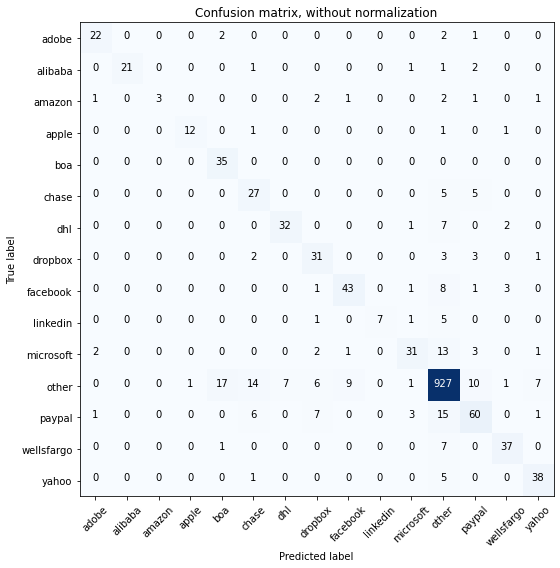

Acc     =  0.862
Pre     =  0.87
Rec     =  0.862
F1      =  0.861

Bal_Acc =  0.737
Bal_Pre =  0.813
Bal_Rec =  0.737
Bal_F1  =  0.773

              precision    recall  f1-score   support

       adobe       0.85      0.81      0.83        27
     alibaba       1.00      0.81      0.89        26
      amazon       1.00      0.27      0.43        11
       apple       0.92      0.80      0.86        15
         boa       0.64      1.00      0.78        35
       chase       0.52      0.73      0.61        37
         dhl       0.82      0.76      0.79        42
     dropbox       0.62      0.78      0.69        40
    facebook       0.80      0.75      0.77        57
    linkedin       1.00      0.50      0.67        14
   microsoft       0.79      0.58      0.67        53
       other       0.93      0.93      0.93      1000
      paypal       0.70      0.65      0.67        93
  wellsfargo       0.84      0.82      0.83        45
       yahoo       0.78      0.86      0.82        4

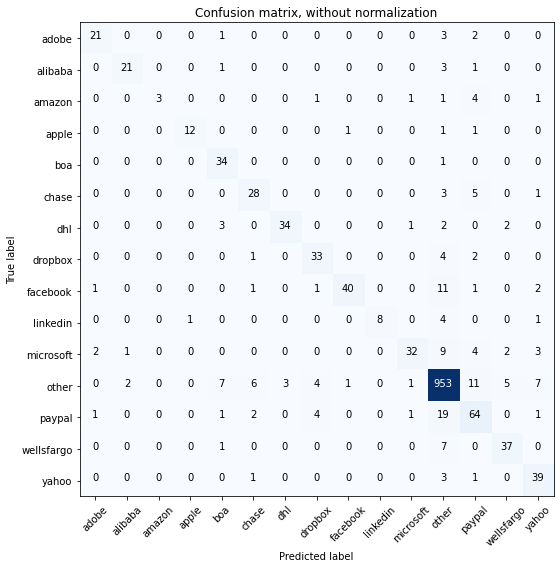

Acc     =  0.883
Pre     =  0.888
Rec     =  0.883
F1      =  0.881

Bal_Acc =  0.75
Bal_Pre =  0.847
Bal_Rec =  0.75
Bal_F1  =  0.796

              precision    recall  f1-score   support

       adobe       0.84      0.78      0.81        27
     alibaba       0.88      0.81      0.84        26
      amazon       1.00      0.27      0.43        11
       apple       0.92      0.80      0.86        15
         boa       0.71      0.97      0.82        35
       chase       0.72      0.76      0.74        37
         dhl       0.92      0.81      0.86        42
     dropbox       0.77      0.82      0.80        40
    facebook       0.95      0.70      0.81        57
    linkedin       1.00      0.57      0.73        14
   microsoft       0.89      0.60      0.72        53
       other       0.93      0.95      0.94      1000
      paypal       0.67      0.69      0.68        93
  wellsfargo       0.80      0.82      0.81        45
       yahoo       0.71      0.89      0.79        44

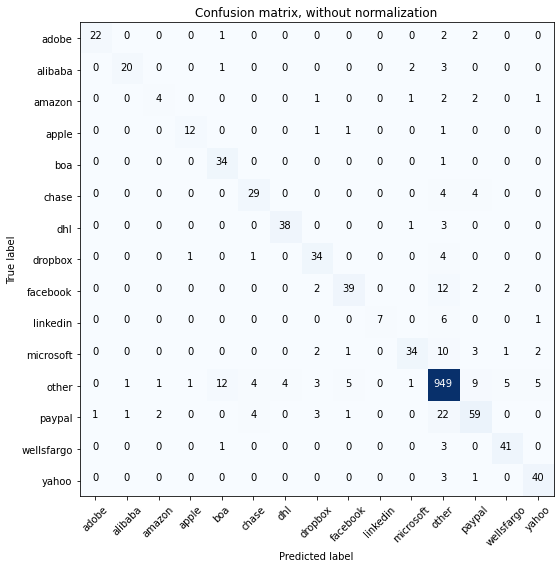

Acc     =  0.885
Pre     =  0.885
Rec     =  0.885
F1      =  0.882

Bal_Acc =  0.766
Bal_Pre =  0.826
Bal_Rec =  0.766
Bal_F1  =  0.795

              precision    recall  f1-score   support

       adobe       0.96      0.81      0.88        27
     alibaba       0.91      0.77      0.83        26
      amazon       0.57      0.36      0.44        11
       apple       0.86      0.80      0.83        15
         boa       0.69      0.97      0.81        35
       chase       0.76      0.78      0.77        37
         dhl       0.90      0.90      0.90        42
     dropbox       0.74      0.85      0.79        40
    facebook       0.83      0.68      0.75        57
    linkedin       1.00      0.50      0.67        14
   microsoft       0.87      0.64      0.74        53
       other       0.93      0.95      0.94      1000
      paypal       0.72      0.63      0.67        93
  wellsfargo       0.84      0.91      0.87        45
       yahoo       0.82      0.91      0.86        

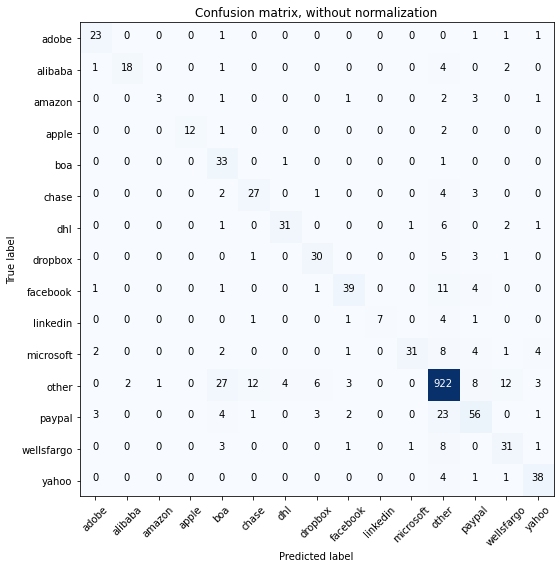

Acc     =  0.845
Pre     =  0.86
Rec     =  0.845
F1      =  0.846

Bal_Acc =  0.708
Bal_Pre =  0.786
Bal_Rec =  0.708
Bal_F1  =  0.745

              precision    recall  f1-score   support

       adobe       0.77      0.85      0.81        27
     alibaba       0.90      0.69      0.78        26
      amazon       0.75      0.27      0.40        11
       apple       1.00      0.80      0.89        15
         boa       0.43      0.94      0.59        35
       chase       0.64      0.73      0.68        37
         dhl       0.86      0.74      0.79        42
     dropbox       0.73      0.75      0.74        40
    facebook       0.81      0.68      0.74        57
    linkedin       1.00      0.50      0.67        14
   microsoft       0.94      0.58      0.72        53
       other       0.92      0.92      0.92      1000
      paypal       0.67      0.60      0.63        93
  wellsfargo       0.61      0.69      0.65        45
       yahoo       0.76      0.86      0.81        4

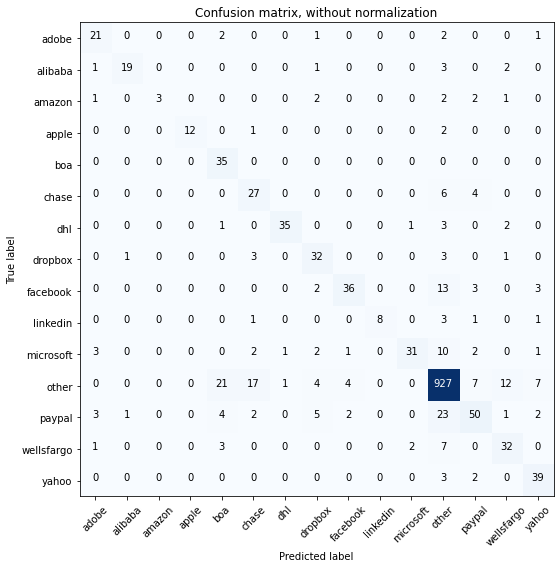

Acc     =  0.849
Pre     =  0.863
Rec     =  0.849
F1      =  0.849

Bal_Acc =  0.72
Bal_Pre =  0.798
Bal_Rec =  0.72
Bal_F1  =  0.757

              precision    recall  f1-score   support

       adobe       0.70      0.78      0.74        27
     alibaba       0.90      0.73      0.81        26
      amazon       1.00      0.27      0.43        11
       apple       1.00      0.80      0.89        15
         boa       0.53      1.00      0.69        35
       chase       0.51      0.73      0.60        37
         dhl       0.95      0.83      0.89        42
     dropbox       0.65      0.80      0.72        40
    facebook       0.84      0.63      0.72        57
    linkedin       1.00      0.57      0.73        14
   microsoft       0.91      0.58      0.71        53
       other       0.92      0.93      0.92      1000
      paypal       0.70      0.54      0.61        93
  wellsfargo       0.63      0.71      0.67        45
       yahoo       0.72      0.89      0.80        44

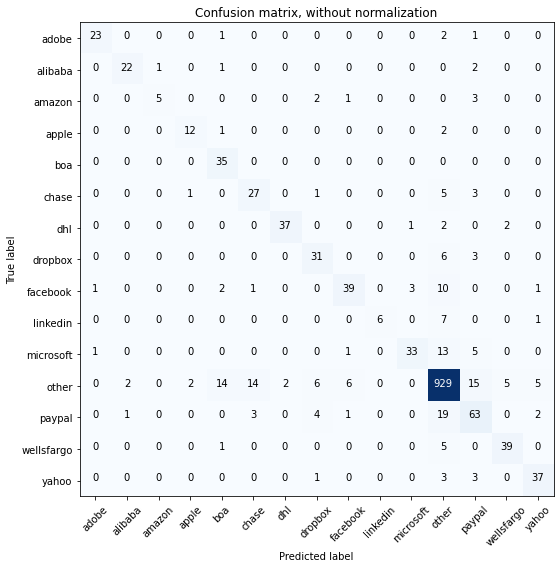

Acc     =  0.869
Pre     =  0.876
Rec     =  0.869
F1      =  0.869

Bal_Acc =  0.759
Bal_Pre =  0.816
Bal_Rec =  0.759
Bal_F1  =  0.786

              precision    recall  f1-score   support

       adobe       0.92      0.85      0.88        27
     alibaba       0.88      0.85      0.86        26
      amazon       0.83      0.45      0.59        11
       apple       0.80      0.80      0.80        15
         boa       0.64      1.00      0.78        35
       chase       0.60      0.73      0.66        37
         dhl       0.95      0.88      0.91        42
     dropbox       0.69      0.78      0.73        40
    facebook       0.81      0.68      0.74        57
    linkedin       1.00      0.43      0.60        14
   microsoft       0.89      0.62      0.73        53
       other       0.93      0.93      0.93      1000
      paypal       0.64      0.68      0.66        93
  wellsfargo       0.85      0.87      0.86        45
       yahoo       0.80      0.84      0.82        

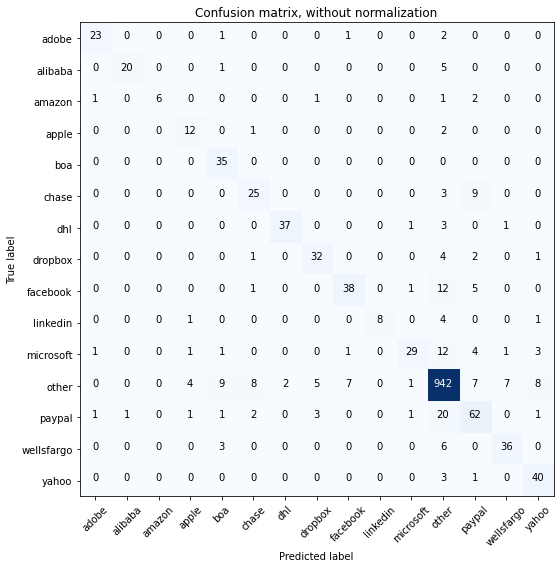

Acc     =  0.874
Pre     =  0.878
Rec     =  0.874
F1      =  0.872

Bal_Acc =  0.762
Bal_Pre =  0.825
Bal_Rec =  0.762
Bal_F1  =  0.792

              precision    recall  f1-score   support

       adobe       0.88      0.85      0.87        27
     alibaba       0.95      0.77      0.85        26
      amazon       1.00      0.55      0.71        11
       apple       0.63      0.80      0.71        15
         boa       0.69      1.00      0.81        35
       chase       0.66      0.68      0.67        37
         dhl       0.95      0.88      0.91        42
     dropbox       0.78      0.80      0.79        40
    facebook       0.81      0.67      0.73        57
    linkedin       1.00      0.57      0.73        14
   microsoft       0.88      0.55      0.67        53
       other       0.92      0.94      0.93      1000
      paypal       0.67      0.67      0.67        93
  wellsfargo       0.80      0.80      0.80        45
       yahoo       0.74      0.91      0.82        

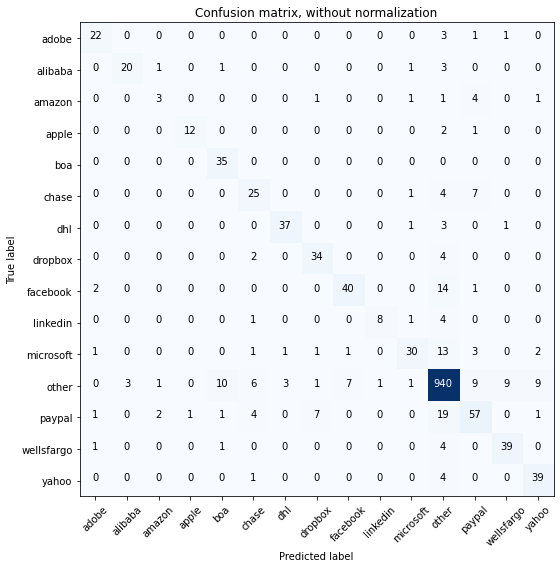

Acc     =  0.871
Pre     =  0.871
Rec     =  0.871
F1      =  0.868

Bal_Acc =  0.747
Bal_Pre =  0.784
Bal_Rec =  0.747
Bal_F1  =  0.765

              precision    recall  f1-score   support

       adobe       0.81      0.81      0.81        27
     alibaba       0.87      0.77      0.82        26
      amazon       0.43      0.27      0.33        11
       apple       0.92      0.80      0.86        15
         boa       0.73      1.00      0.84        35
       chase       0.62      0.68      0.65        37
         dhl       0.90      0.88      0.89        42
     dropbox       0.77      0.85      0.81        40
    facebook       0.83      0.70      0.76        57
    linkedin       0.89      0.57      0.70        14
   microsoft       0.83      0.57      0.67        53
       other       0.92      0.94      0.93      1000
      paypal       0.69      0.61      0.65        93
  wellsfargo       0.78      0.87      0.82        45
       yahoo       0.75      0.89      0.81        

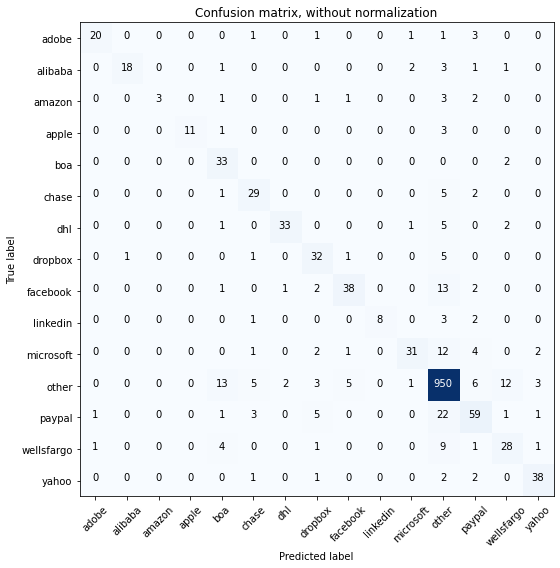

Acc     =  0.865
Pre     =  0.871
Rec     =  0.865
F1      =  0.862

Bal_Acc =  0.71
Bal_Pre =  0.831
Bal_Rec =  0.71
Bal_F1  =  0.766

              precision    recall  f1-score   support

       adobe       0.91      0.74      0.82        27
     alibaba       0.95      0.69      0.80        26
      amazon       1.00      0.27      0.43        11
       apple       1.00      0.73      0.85        15
         boa       0.58      0.94      0.72        35
       chase       0.69      0.78      0.73        37
         dhl       0.92      0.79      0.85        42
     dropbox       0.67      0.80      0.73        40
    facebook       0.83      0.67      0.74        57
    linkedin       1.00      0.57      0.73        14
   microsoft       0.86      0.58      0.70        53
       other       0.92      0.95      0.93      1000
      paypal       0.70      0.63      0.67        93
  wellsfargo       0.61      0.62      0.62        45
       yahoo       0.84      0.86      0.85        44

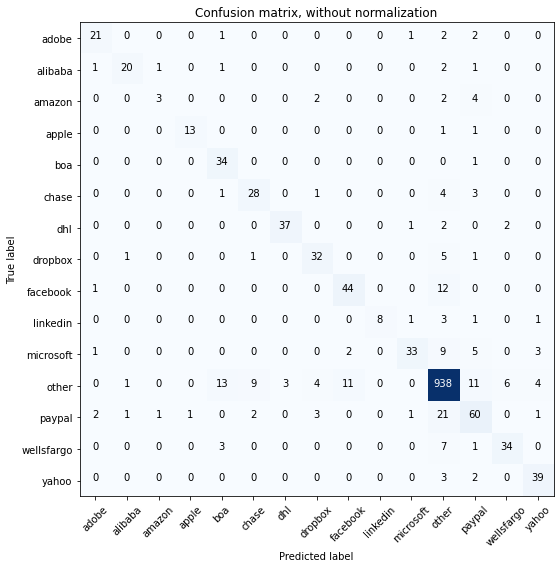

Acc     =  0.873
Pre     =  0.876
Rec     =  0.873
F1      =  0.872

Bal_Acc =  0.752
Bal_Pre =  0.806
Bal_Rec =  0.752
Bal_F1  =  0.778

              precision    recall  f1-score   support

       adobe       0.81      0.78      0.79        27
     alibaba       0.87      0.77      0.82        26
      amazon       0.60      0.27      0.37        11
       apple       0.93      0.87      0.90        15
         boa       0.64      0.97      0.77        35
       chase       0.70      0.76      0.73        37
         dhl       0.93      0.88      0.90        42
     dropbox       0.76      0.80      0.78        40
    facebook       0.77      0.77      0.77        57
    linkedin       1.00      0.57      0.73        14
   microsoft       0.89      0.62      0.73        53
       other       0.93      0.94      0.93      1000
      paypal       0.65      0.65      0.65        93
  wellsfargo       0.81      0.76      0.78        45
       yahoo       0.81      0.89      0.85        

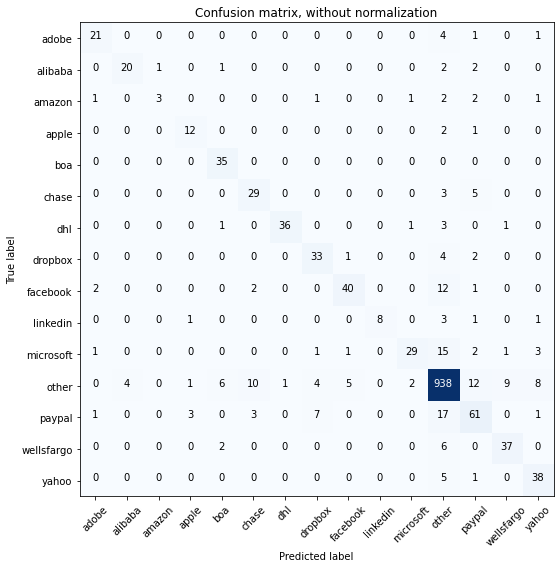

Acc     =  0.871
Pre     =  0.874
Rec     =  0.871
F1      =  0.868

Bal_Acc =  0.746
Bal_Pre =  0.802
Bal_Rec =  0.746
Bal_F1  =  0.773

              precision    recall  f1-score   support

       adobe       0.81      0.78      0.79        27
     alibaba       0.83      0.77      0.80        26
      amazon       0.75      0.27      0.40        11
       apple       0.71      0.80      0.75        15
         boa       0.78      1.00      0.88        35
       chase       0.66      0.78      0.72        37
         dhl       0.97      0.86      0.91        42
     dropbox       0.72      0.82      0.77        40
    facebook       0.85      0.70      0.77        57
    linkedin       1.00      0.57      0.73        14
   microsoft       0.88      0.55      0.67        53
       other       0.92      0.94      0.93      1000
      paypal       0.67      0.66      0.66        93
  wellsfargo       0.77      0.82      0.80        45
       yahoo       0.72      0.86      0.78        

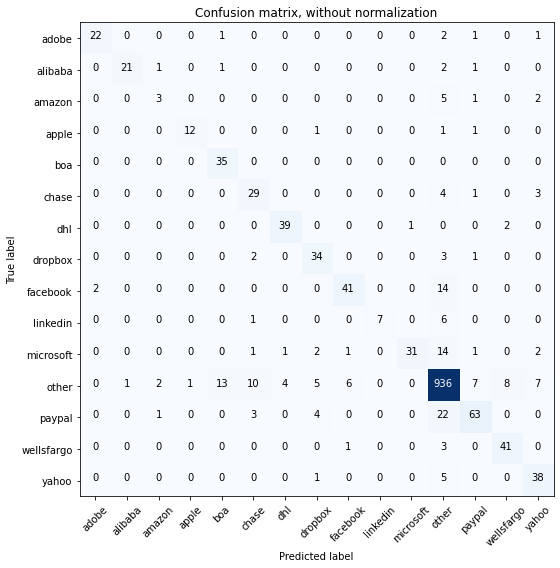

Acc     =  0.878
Pre     =  0.883
Rec     =  0.878
F1      =  0.876

Bal_Acc =  0.763
Bal_Pre =  0.815
Bal_Rec =  0.763
Bal_F1  =  0.788

              precision    recall  f1-score   support

       adobe       0.92      0.81      0.86        27
     alibaba       0.95      0.81      0.88        26
      amazon       0.43      0.27      0.33        11
       apple       0.92      0.80      0.86        15
         boa       0.70      1.00      0.82        35
       chase       0.63      0.78      0.70        37
         dhl       0.89      0.93      0.91        42
     dropbox       0.72      0.85      0.78        40
    facebook       0.84      0.72      0.77        57
    linkedin       1.00      0.50      0.67        14
   microsoft       0.97      0.58      0.73        53
       other       0.92      0.94      0.93      1000
      paypal       0.82      0.68      0.74        93
  wellsfargo       0.80      0.91      0.85        45
       yahoo       0.72      0.86      0.78        

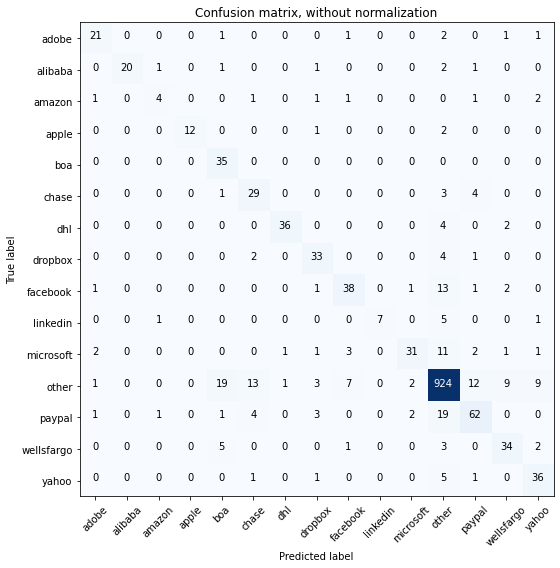

Acc     =  0.859
Pre     =  0.869
Rec     =  0.859
F1      =  0.859

Bal_Acc =  0.74
Bal_Pre =  0.788
Bal_Rec =  0.74
Bal_F1  =  0.763

              precision    recall  f1-score   support

       adobe       0.78      0.78      0.78        27
     alibaba       1.00      0.77      0.87        26
      amazon       0.57      0.36      0.44        11
       apple       1.00      0.80      0.89        15
         boa       0.56      1.00      0.71        35
       chase       0.58      0.78      0.67        37
         dhl       0.95      0.86      0.90        42
     dropbox       0.73      0.82      0.78        40
    facebook       0.75      0.67      0.70        57
    linkedin       1.00      0.50      0.67        14
   microsoft       0.86      0.58      0.70        53
       other       0.93      0.92      0.93      1000
      paypal       0.73      0.67      0.70        93
  wellsfargo       0.69      0.76      0.72        45
       yahoo       0.69      0.82      0.75        44

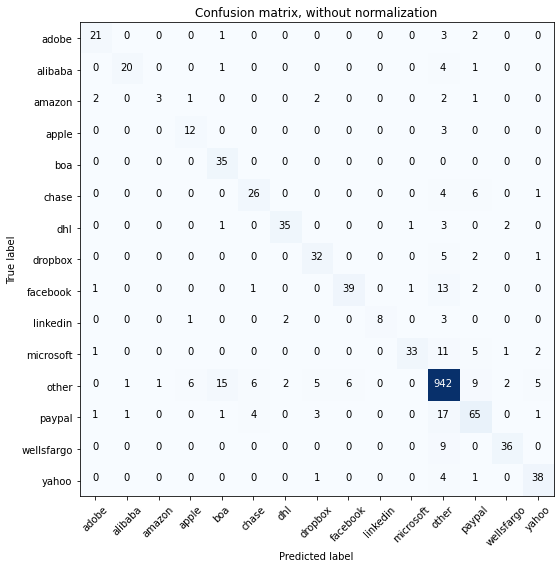

Acc     =  0.874
Pre     =  0.878
Rec     =  0.874
F1      =  0.872

Bal_Acc =  0.743
Bal_Pre =  0.81
Bal_Rec =  0.743
Bal_F1  =  0.775

              precision    recall  f1-score   support

       adobe       0.81      0.78      0.79        27
     alibaba       0.91      0.77      0.83        26
      amazon       0.75      0.27      0.40        11
       apple       0.60      0.80      0.69        15
         boa       0.65      1.00      0.79        35
       chase       0.70      0.70      0.70        37
         dhl       0.90      0.83      0.86        42
     dropbox       0.74      0.80      0.77        40
    facebook       0.87      0.68      0.76        57
    linkedin       1.00      0.57      0.73        14
   microsoft       0.94      0.62      0.75        53
       other       0.92      0.94      0.93      1000
      paypal       0.69      0.70      0.70        93
  wellsfargo       0.88      0.80      0.84        45
       yahoo       0.79      0.86      0.83        4

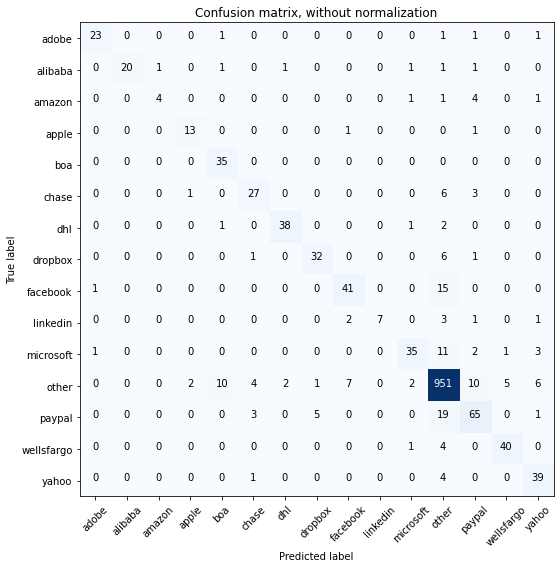

Acc     =  0.89
Pre     =  0.891
Rec     =  0.89
F1      =  0.888

Bal_Acc =  0.773
Bal_Pre =  0.848
Bal_Rec =  0.773
Bal_F1  =  0.809

              precision    recall  f1-score   support

       adobe       0.92      0.85      0.88        27
     alibaba       1.00      0.77      0.87        26
      amazon       0.80      0.36      0.50        11
       apple       0.81      0.87      0.84        15
         boa       0.73      1.00      0.84        35
       chase       0.75      0.73      0.74        37
         dhl       0.93      0.90      0.92        42
     dropbox       0.84      0.80      0.82        40
    facebook       0.80      0.72      0.76        57
    linkedin       1.00      0.50      0.67        14
   microsoft       0.85      0.66      0.74        53
       other       0.93      0.95      0.94      1000
      paypal       0.73      0.70      0.71        93
  wellsfargo       0.87      0.89      0.88        45
       yahoo       0.75      0.89      0.81        44

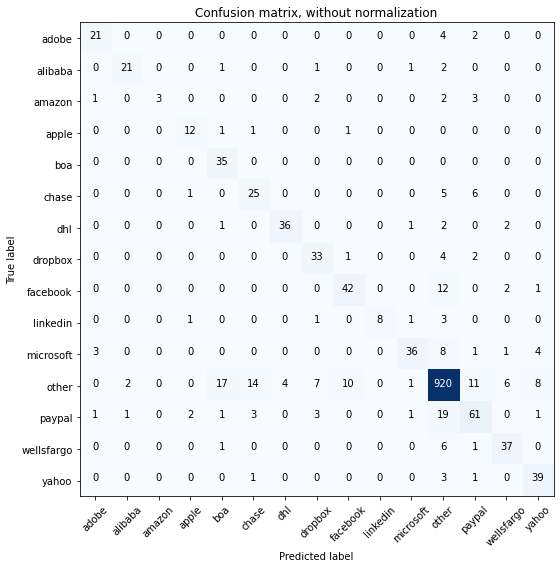

Acc     =  0.864
Pre     =  0.871
Rec     =  0.864
F1      =  0.863

Bal_Acc =  0.753
Bal_Pre =  0.8
Bal_Rec =  0.753
Bal_F1  =  0.776

              precision    recall  f1-score   support

       adobe       0.81      0.78      0.79        27
     alibaba       0.88      0.81      0.84        26
      amazon       1.00      0.27      0.43        11
       apple       0.75      0.80      0.77        15
         boa       0.61      1.00      0.76        35
       chase       0.57      0.68      0.62        37
         dhl       0.90      0.86      0.88        42
     dropbox       0.70      0.82      0.76        40
    facebook       0.78      0.74      0.76        57
    linkedin       1.00      0.57      0.73        14
   microsoft       0.88      0.68      0.77        53
       other       0.93      0.92      0.92      1000
      paypal       0.69      0.66      0.67        93
  wellsfargo       0.77      0.82      0.80        45
       yahoo       0.74      0.89      0.80        44

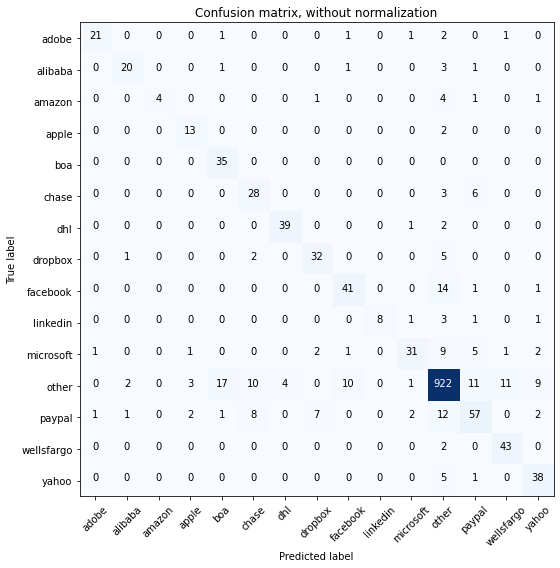

Acc     =  0.865
Pre     =  0.873
Rec     =  0.865
F1      =  0.865

Bal_Acc =  0.766
Bal_Pre =  0.8
Bal_Rec =  0.766
Bal_F1  =  0.783

              precision    recall  f1-score   support

       adobe       0.91      0.78      0.84        27
     alibaba       0.83      0.77      0.80        26
      amazon       1.00      0.36      0.53        11
       apple       0.68      0.87      0.76        15
         boa       0.64      1.00      0.78        35
       chase       0.58      0.76      0.66        37
         dhl       0.91      0.93      0.92        42
     dropbox       0.76      0.80      0.78        40
    facebook       0.76      0.72      0.74        57
    linkedin       1.00      0.57      0.73        14
   microsoft       0.84      0.58      0.69        53
       other       0.93      0.92      0.93      1000
      paypal       0.68      0.61      0.64        93
  wellsfargo       0.77      0.96      0.85        45
       yahoo       0.70      0.86      0.78        44

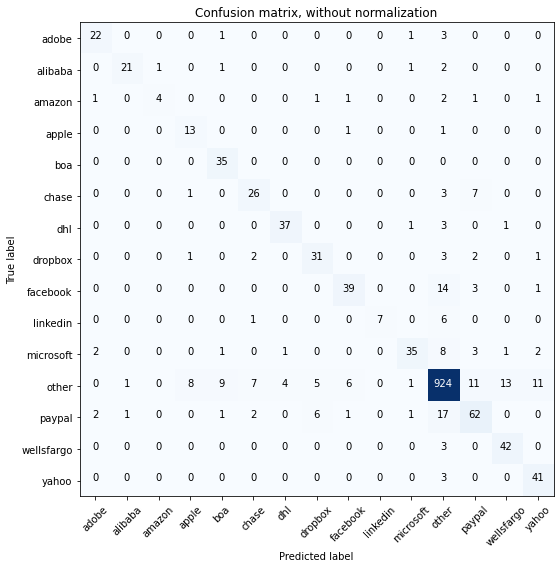

Acc     =  0.87
Pre     =  0.876
Rec     =  0.87
F1      =  0.869

Bal_Acc =  0.767
Bal_Pre =  0.792
Bal_Rec =  0.767
Bal_F1  =  0.779

              precision    recall  f1-score   support

       adobe       0.81      0.81      0.81        27
     alibaba       0.91      0.81      0.86        26
      amazon       0.80      0.36      0.50        11
       apple       0.57      0.87      0.68        15
         boa       0.73      1.00      0.84        35
       chase       0.68      0.70      0.69        37
         dhl       0.88      0.88      0.88        42
     dropbox       0.72      0.78      0.75        40
    facebook       0.81      0.68      0.74        57
    linkedin       1.00      0.50      0.67        14
   microsoft       0.88      0.66      0.75        53
       other       0.93      0.92      0.93      1000
      paypal       0.70      0.67      0.68        93
  wellsfargo       0.74      0.93      0.82        45
       yahoo       0.72      0.93      0.81        44

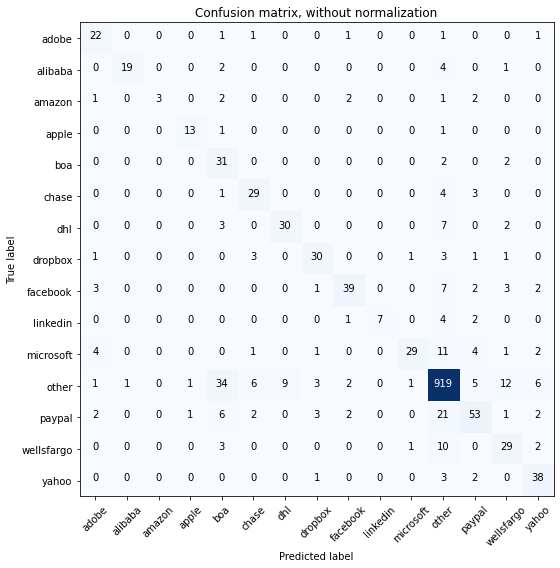

Acc     =  0.839
Pre     =  0.858
Rec     =  0.839
F1      =  0.841

Bal_Acc =  0.703
Bal_Pre =  0.781
Bal_Rec =  0.703
Bal_F1  =  0.74

              precision    recall  f1-score   support

       adobe       0.65      0.81      0.72        27
     alibaba       0.95      0.73      0.83        26
      amazon       1.00      0.27      0.43        11
       apple       0.87      0.87      0.87        15
         boa       0.37      0.89      0.52        35
       chase       0.69      0.78      0.73        37
         dhl       0.77      0.71      0.74        42
     dropbox       0.77      0.75      0.76        40
    facebook       0.83      0.68      0.75        57
    linkedin       1.00      0.50      0.67        14
   microsoft       0.91      0.55      0.68        53
       other       0.92      0.92      0.92      1000
      paypal       0.72      0.57      0.63        93
  wellsfargo       0.56      0.64      0.60        45
       yahoo       0.72      0.86      0.78        4

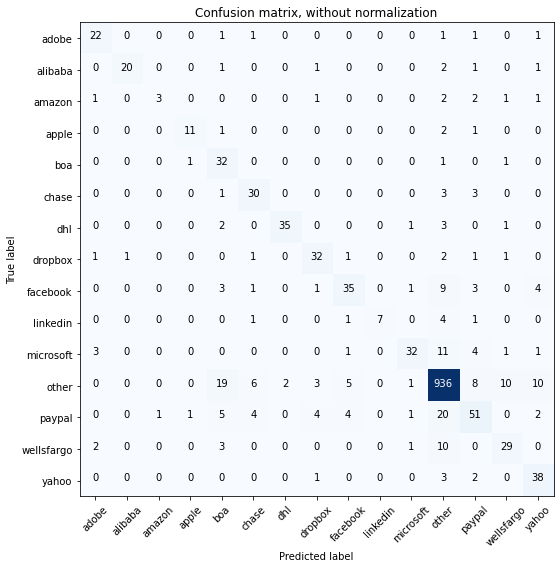

Acc     =  0.853
Pre     =  0.862
Rec     =  0.853
F1      =  0.852

Bal_Acc =  0.711
Bal_Pre =  0.777
Bal_Rec =  0.711
Bal_F1  =  0.743

              precision    recall  f1-score   support

       adobe       0.76      0.81      0.79        27
     alibaba       0.95      0.77      0.85        26
      amazon       0.75      0.27      0.40        11
       apple       0.85      0.73      0.79        15
         boa       0.47      0.91      0.62        35
       chase       0.68      0.81      0.74        37
         dhl       0.95      0.83      0.89        42
     dropbox       0.74      0.80      0.77        40
    facebook       0.74      0.61      0.67        57
    linkedin       1.00      0.50      0.67        14
   microsoft       0.86      0.60      0.71        53
       other       0.93      0.94      0.93      1000
      paypal       0.65      0.55      0.60        93
  wellsfargo       0.66      0.64      0.65        45
       yahoo       0.66      0.86      0.75        

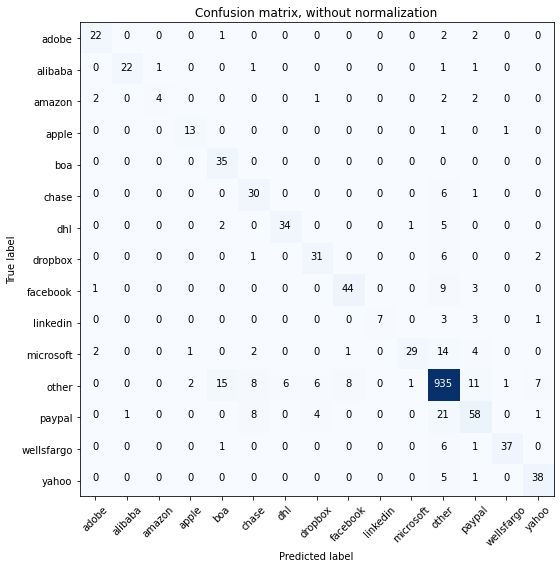

Acc     =  0.87
Pre     =  0.876
Rec     =  0.87
F1      =  0.868

Bal_Acc =  0.757
Bal_Pre =  0.82
Bal_Rec =  0.757
Bal_F1  =  0.787

              precision    recall  f1-score   support

       adobe       0.81      0.81      0.81        27
     alibaba       0.96      0.85      0.90        26
      amazon       0.80      0.36      0.50        11
       apple       0.81      0.87      0.84        15
         boa       0.65      1.00      0.79        35
       chase       0.60      0.81      0.69        37
         dhl       0.85      0.81      0.83        42
     dropbox       0.74      0.78      0.76        40
    facebook       0.83      0.77      0.80        57
    linkedin       1.00      0.50      0.67        14
   microsoft       0.94      0.55      0.69        53
       other       0.92      0.94      0.93      1000
      paypal       0.67      0.62      0.64        93
  wellsfargo       0.95      0.82      0.88        45
       yahoo       0.78      0.86      0.82        44


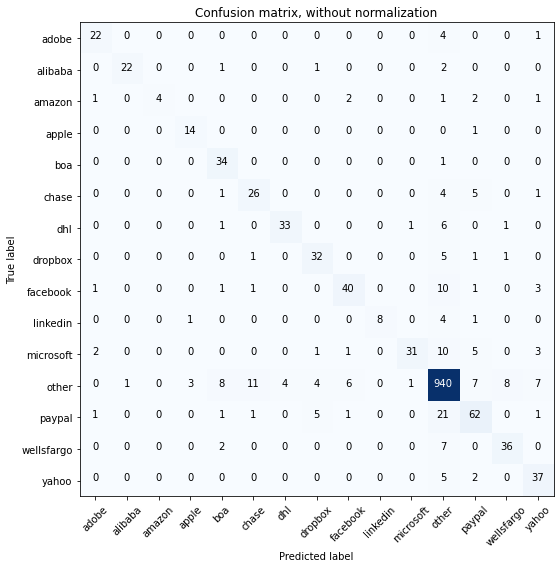

Acc     =  0.871
Pre     =  0.876
Rec     =  0.871
F1      =  0.869

Bal_Acc =  0.755
Bal_Pre =  0.825
Bal_Rec =  0.755
Bal_F1  =  0.788

              precision    recall  f1-score   support

       adobe       0.81      0.81      0.81        27
     alibaba       0.96      0.85      0.90        26
      amazon       1.00      0.36      0.53        11
       apple       0.78      0.93      0.85        15
         boa       0.69      0.97      0.81        35
       chase       0.65      0.70      0.68        37
         dhl       0.89      0.79      0.84        42
     dropbox       0.74      0.80      0.77        40
    facebook       0.80      0.70      0.75        57
    linkedin       1.00      0.57      0.73        14
   microsoft       0.94      0.58      0.72        53
       other       0.92      0.94      0.93      1000
      paypal       0.71      0.67      0.69        93
  wellsfargo       0.78      0.80      0.79        45
       yahoo       0.69      0.84      0.76        

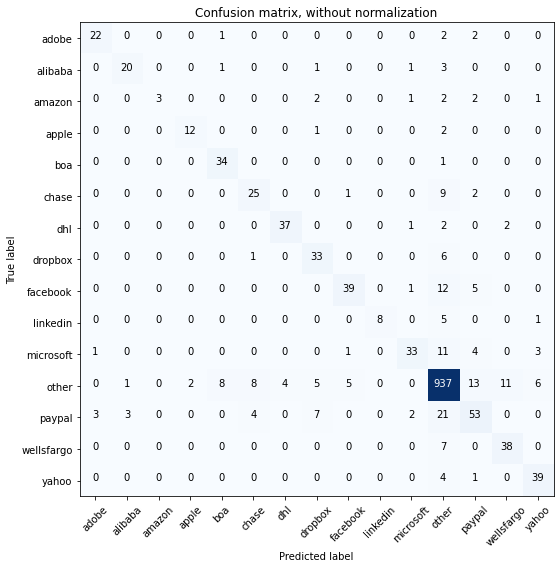

Acc     =  0.866
Pre     =  0.867
Rec     =  0.866
F1      =  0.863

Bal_Acc =  0.742
Bal_Pre =  0.822
Bal_Rec =  0.742
Bal_F1  =  0.78

              precision    recall  f1-score   support

       adobe       0.85      0.81      0.83        27
     alibaba       0.83      0.77      0.80        26
      amazon       1.00      0.27      0.43        11
       apple       0.86      0.80      0.83        15
         boa       0.77      0.97      0.86        35
       chase       0.66      0.68      0.67        37
         dhl       0.90      0.88      0.89        42
     dropbox       0.67      0.82      0.74        40
    facebook       0.85      0.68      0.76        57
    linkedin       1.00      0.57      0.73        14
   microsoft       0.85      0.62      0.72        53
       other       0.92      0.94      0.93      1000
      paypal       0.65      0.57      0.61        93
  wellsfargo       0.75      0.84      0.79        45
       yahoo       0.78      0.89      0.83        4

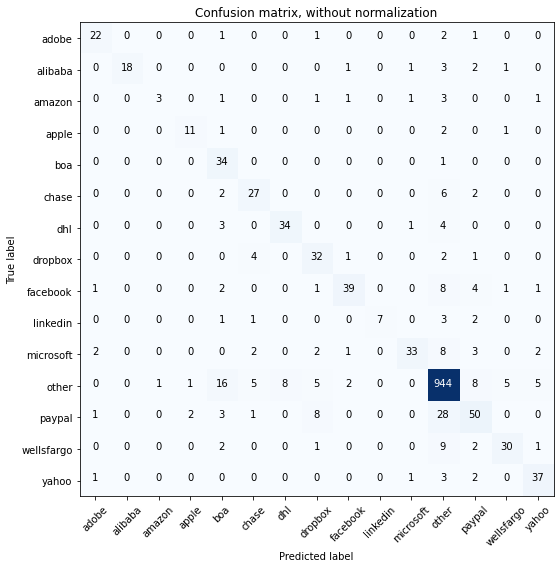

Acc     =  0.858
Pre     =  0.865
Rec     =  0.858
F1      =  0.856

Bal_Acc =  0.708
Bal_Pre =  0.792
Bal_Rec =  0.708
Bal_F1  =  0.748

              precision    recall  f1-score   support

       adobe       0.81      0.81      0.81        27
     alibaba       1.00      0.69      0.82        26
      amazon       0.75      0.27      0.40        11
       apple       0.79      0.73      0.76        15
         boa       0.52      0.97      0.67        35
       chase       0.68      0.73      0.70        37
         dhl       0.81      0.81      0.81        42
     dropbox       0.63      0.80      0.70        40
    facebook       0.87      0.68      0.76        57
    linkedin       1.00      0.50      0.67        14
   microsoft       0.89      0.62      0.73        53
       other       0.92      0.94      0.93      1000
      paypal       0.65      0.54      0.59        93
  wellsfargo       0.79      0.67      0.72        45
       yahoo       0.79      0.84      0.81        

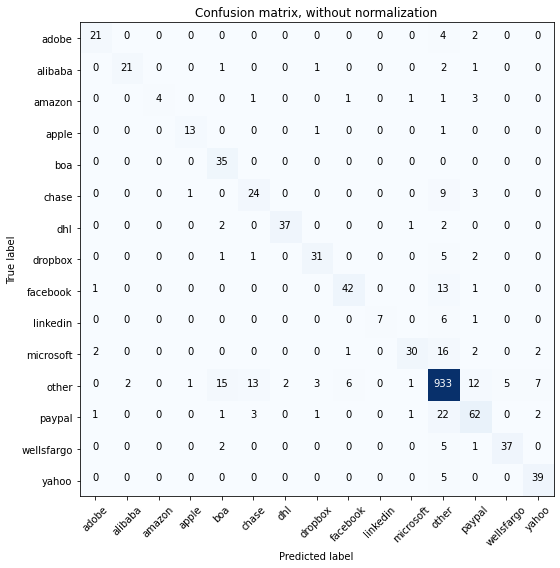

Acc     =  0.868
Pre     =  0.873
Rec     =  0.868
F1      =  0.866

Bal_Acc =  0.749
Bal_Pre =  0.838
Bal_Rec =  0.749
Bal_F1  =  0.791

              precision    recall  f1-score   support

       adobe       0.84      0.78      0.81        27
     alibaba       0.91      0.81      0.86        26
      amazon       1.00      0.36      0.53        11
       apple       0.87      0.87      0.87        15
         boa       0.61      1.00      0.76        35
       chase       0.57      0.65      0.61        37
         dhl       0.95      0.88      0.91        42
     dropbox       0.84      0.78      0.81        40
    facebook       0.84      0.74      0.79        57
    linkedin       1.00      0.50      0.67        14
   microsoft       0.88      0.57      0.69        53
       other       0.91      0.93      0.92      1000
      paypal       0.69      0.67      0.68        93
  wellsfargo       0.88      0.82      0.85        45
       yahoo       0.78      0.89      0.83        

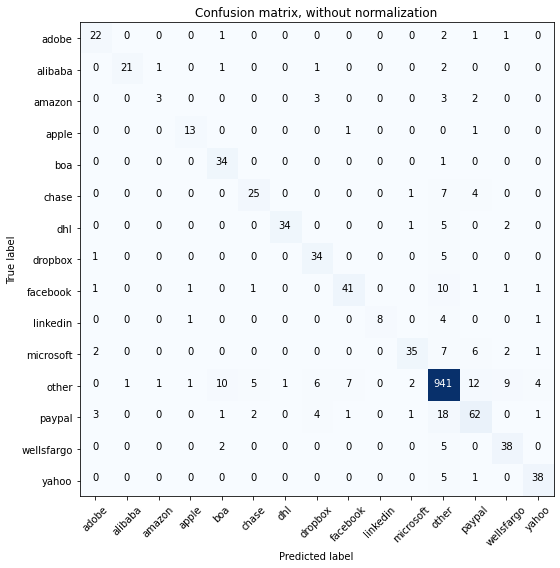

Acc     =  0.877
Pre     =  0.879
Rec     =  0.877
F1      =  0.875

Bal_Acc =  0.756
Bal_Pre =  0.807
Bal_Rec =  0.756
Bal_F1  =  0.781

              precision    recall  f1-score   support

       adobe       0.76      0.81      0.79        27
     alibaba       0.95      0.81      0.88        26
      amazon       0.60      0.27      0.37        11
       apple       0.81      0.87      0.84        15
         boa       0.69      0.97      0.81        35
       chase       0.76      0.68      0.71        37
         dhl       0.97      0.81      0.88        42
     dropbox       0.71      0.85      0.77        40
    facebook       0.82      0.72      0.77        57
    linkedin       1.00      0.57      0.73        14
   microsoft       0.88      0.66      0.75        53
       other       0.93      0.94      0.93      1000
      paypal       0.69      0.67      0.68        93
  wellsfargo       0.72      0.84      0.78        45
       yahoo       0.83      0.86      0.84        

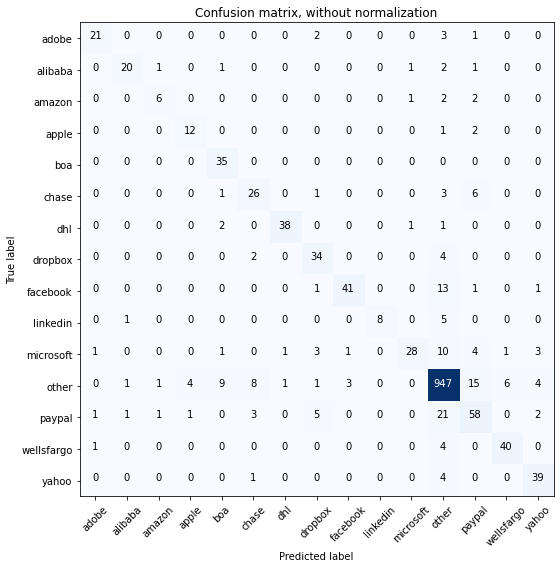

Acc     =  0.879
Pre     =  0.882
Rec     =  0.879
F1      =  0.877

Bal_Acc =  0.768
Bal_Pre =  0.813
Bal_Rec =  0.768
Bal_F1  =  0.79

              precision    recall  f1-score   support

       adobe       0.88      0.78      0.82        27
     alibaba       0.87      0.77      0.82        26
      amazon       0.67      0.55      0.60        11
       apple       0.71      0.80      0.75        15
         boa       0.71      1.00      0.83        35
       chase       0.65      0.70      0.68        37
         dhl       0.95      0.90      0.93        42
     dropbox       0.72      0.85      0.78        40
    facebook       0.91      0.72      0.80        57
    linkedin       1.00      0.57      0.73        14
   microsoft       0.90      0.53      0.67        53
       other       0.93      0.95      0.94      1000
      paypal       0.64      0.62      0.63        93
  wellsfargo       0.85      0.89      0.87        45
       yahoo       0.80      0.89      0.84        4

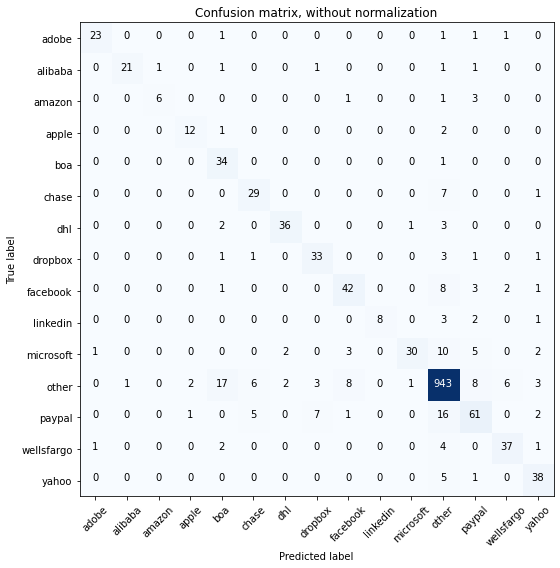

Acc     =  0.879
Pre     =  0.886
Rec     =  0.879
F1      =  0.878

Bal_Acc =  0.773
Bal_Pre =  0.824
Bal_Rec =  0.773
Bal_F1  =  0.798

              precision    recall  f1-score   support

       adobe       0.92      0.85      0.88        27
     alibaba       0.95      0.81      0.88        26
      amazon       0.86      0.55      0.67        11
       apple       0.80      0.80      0.80        15
         boa       0.57      0.97      0.72        35
       chase       0.71      0.78      0.74        37
         dhl       0.90      0.86      0.88        42
     dropbox       0.75      0.82      0.79        40
    facebook       0.76      0.74      0.75        57
    linkedin       1.00      0.57      0.73        14
   microsoft       0.94      0.57      0.71        53
       other       0.94      0.94      0.94      1000
      paypal       0.71      0.66      0.68        93
  wellsfargo       0.80      0.82      0.81        45
       yahoo       0.76      0.86      0.81        

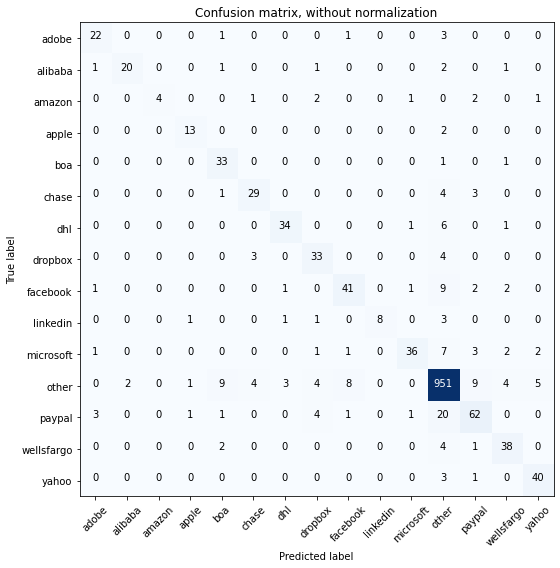

Acc     =  0.886
Pre     =  0.888
Rec     =  0.886
F1      =  0.884

Bal_Acc =  0.768
Bal_Pre =  0.836
Bal_Rec =  0.768
Bal_F1  =  0.801

              precision    recall  f1-score   support

       adobe       0.79      0.81      0.80        27
     alibaba       0.91      0.77      0.83        26
      amazon       1.00      0.36      0.53        11
       apple       0.81      0.87      0.84        15
         boa       0.69      0.94      0.80        35
       chase       0.78      0.78      0.78        37
         dhl       0.87      0.81      0.84        42
     dropbox       0.72      0.82      0.77        40
    facebook       0.79      0.72      0.75        57
    linkedin       1.00      0.57      0.73        14
   microsoft       0.90      0.68      0.77        53
       other       0.93      0.95      0.94      1000
      paypal       0.75      0.67      0.70        93
  wellsfargo       0.78      0.84      0.81        45
       yahoo       0.83      0.91      0.87        

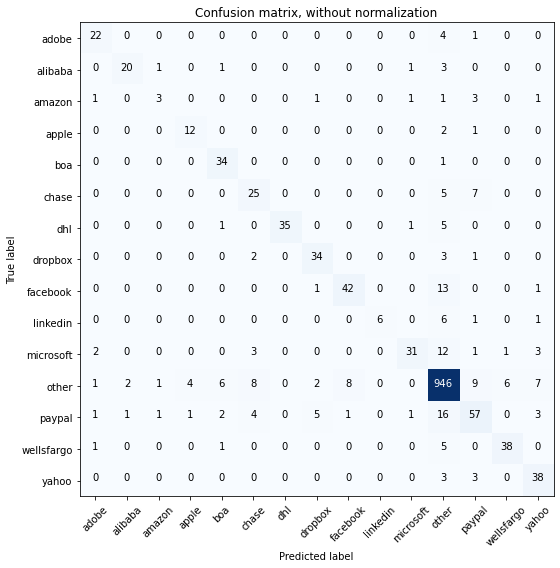

Acc     =  0.873
Pre     =  0.874
Rec     =  0.873
F1      =  0.87

Bal_Acc =  0.734
Bal_Pre =  0.791
Bal_Rec =  0.734
Bal_F1  =  0.761

              precision    recall  f1-score   support

       adobe       0.79      0.81      0.80        27
     alibaba       0.87      0.77      0.82        26
      amazon       0.50      0.27      0.35        11
       apple       0.71      0.80      0.75        15
         boa       0.76      0.97      0.85        35
       chase       0.60      0.68      0.63        37
         dhl       1.00      0.83      0.91        42
     dropbox       0.79      0.85      0.82        40
    facebook       0.82      0.74      0.78        57
    linkedin       1.00      0.43      0.60        14
   microsoft       0.89      0.58      0.70        53
       other       0.92      0.95      0.93      1000
      paypal       0.68      0.61      0.64        93
  wellsfargo       0.84      0.84      0.84        45
       yahoo       0.70      0.86      0.78        4

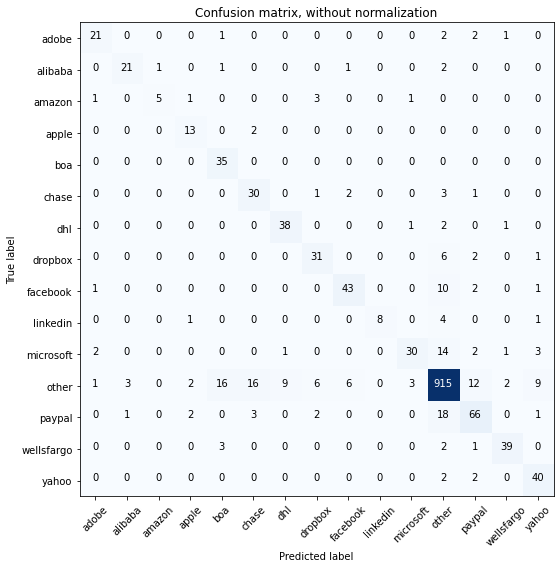

Acc     =  0.867
Pre     =  0.876
Rec     =  0.867
F1      =  0.868

Bal_Acc =  0.779
Bal_Pre =  0.79
Bal_Rec =  0.779
Bal_F1  =  0.784

              precision    recall  f1-score   support

       adobe       0.81      0.78      0.79        27
     alibaba       0.84      0.81      0.82        26
      amazon       0.83      0.45      0.59        11
       apple       0.68      0.87      0.76        15
         boa       0.62      1.00      0.77        35
       chase       0.59      0.81      0.68        37
         dhl       0.79      0.90      0.84        42
     dropbox       0.72      0.78      0.75        40
    facebook       0.83      0.75      0.79        57
    linkedin       1.00      0.57      0.73        14
   microsoft       0.86      0.57      0.68        53
       other       0.93      0.92      0.92      1000
      paypal       0.73      0.71      0.72        93
  wellsfargo       0.89      0.87      0.88        45
       yahoo       0.71      0.91      0.80        4

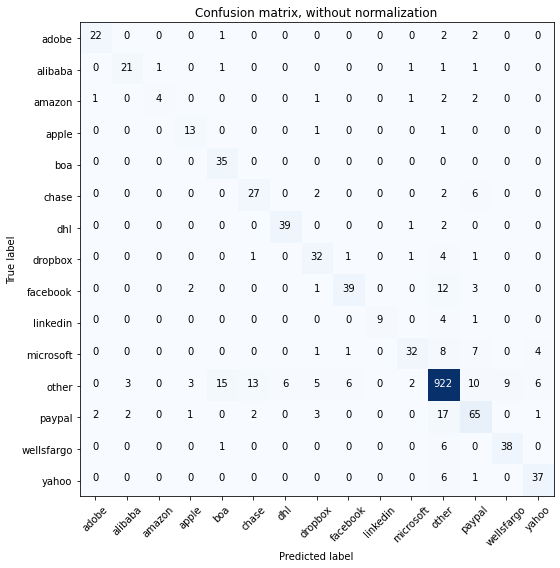

Acc     =  0.867
Pre     =  0.873
Rec     =  0.867
F1      =  0.867

Bal_Acc =  0.77
Bal_Pre =  0.791
Bal_Rec =  0.77
Bal_F1  =  0.78

              precision    recall  f1-score   support

       adobe       0.88      0.81      0.85        27
     alibaba       0.81      0.81      0.81        26
      amazon       0.80      0.36      0.50        11
       apple       0.68      0.87      0.76        15
         boa       0.66      1.00      0.80        35
       chase       0.63      0.73      0.68        37
         dhl       0.87      0.93      0.90        42
     dropbox       0.70      0.80      0.74        40
    facebook       0.83      0.68      0.75        57
    linkedin       1.00      0.64      0.78        14
   microsoft       0.84      0.60      0.70        53
       other       0.93      0.92      0.93      1000
      paypal       0.66      0.70      0.68        93
  wellsfargo       0.81      0.84      0.83        45
       yahoo       0.77      0.84      0.80        44


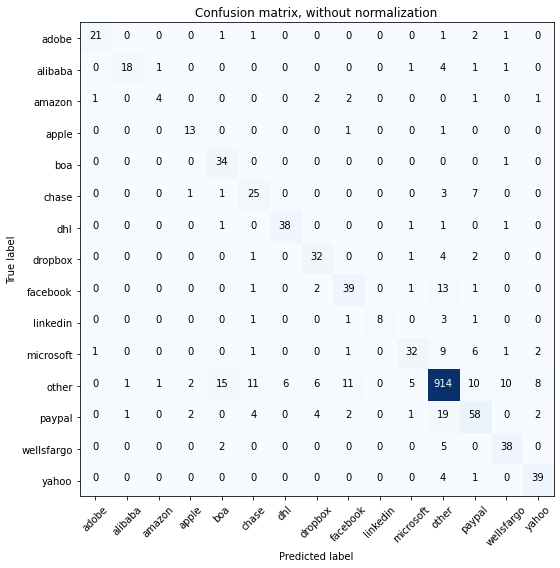

Acc     =  0.853
Pre     =  0.86
Rec     =  0.853
F1      =  0.853

Bal_Acc =  0.745
Bal_Pre =  0.762
Bal_Rec =  0.745
Bal_F1  =  0.753

              precision    recall  f1-score   support

       adobe       0.91      0.78      0.84        27
     alibaba       0.90      0.69      0.78        26
      amazon       0.67      0.36      0.47        11
       apple       0.72      0.87      0.79        15
         boa       0.63      0.97      0.76        35
       chase       0.56      0.68      0.61        37
         dhl       0.86      0.90      0.88        42
     dropbox       0.70      0.80      0.74        40
    facebook       0.68      0.68      0.68        57
    linkedin       1.00      0.57      0.73        14
   microsoft       0.76      0.60      0.67        53
       other       0.93      0.91      0.92      1000
      paypal       0.64      0.62      0.63        93
  wellsfargo       0.72      0.84      0.78        45
       yahoo       0.75      0.89      0.81        4

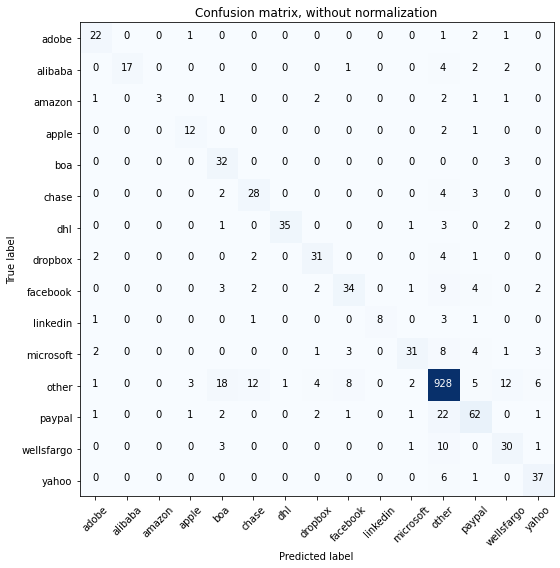

Acc     =  0.851
Pre     =  0.861
Rec     =  0.851
F1      =  0.851

Bal_Acc =  0.712
Bal_Pre =  0.787
Bal_Rec =  0.712
Bal_F1  =  0.748

              precision    recall  f1-score   support

       adobe       0.73      0.81      0.77        27
     alibaba       1.00      0.65      0.79        26
      amazon       1.00      0.27      0.43        11
       apple       0.71      0.80      0.75        15
         boa       0.52      0.91      0.66        35
       chase       0.62      0.76      0.68        37
         dhl       0.97      0.83      0.90        42
     dropbox       0.74      0.78      0.76        40
    facebook       0.72      0.60      0.65        57
    linkedin       1.00      0.57      0.73        14
   microsoft       0.84      0.58      0.69        53
       other       0.92      0.93      0.93      1000
      paypal       0.71      0.67      0.69        93
  wellsfargo       0.58      0.67      0.62        45
       yahoo       0.74      0.84      0.79        

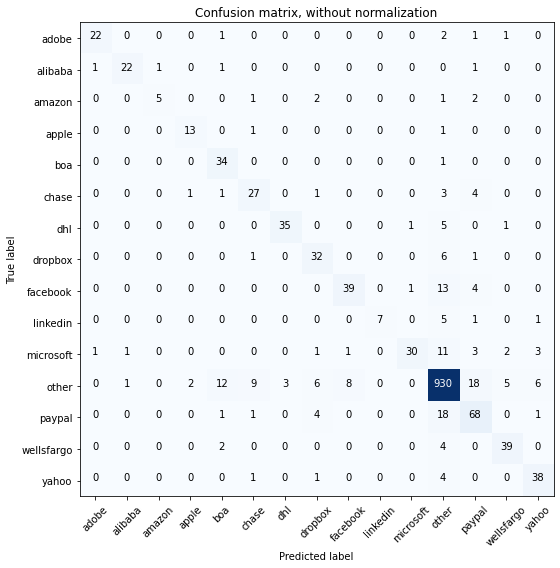

Acc     =  0.871
Pre     =  0.878
Rec     =  0.871
F1      =  0.871

Bal_Acc =  0.764
Bal_Pre =  0.821
Bal_Rec =  0.764
Bal_F1  =  0.791

              precision    recall  f1-score   support

       adobe       0.92      0.81      0.86        27
     alibaba       0.92      0.85      0.88        26
      amazon       0.83      0.45      0.59        11
       apple       0.81      0.87      0.84        15
         boa       0.65      0.97      0.78        35
       chase       0.66      0.73      0.69        37
         dhl       0.92      0.83      0.88        42
     dropbox       0.68      0.80      0.74        40
    facebook       0.81      0.68      0.74        57
    linkedin       1.00      0.50      0.67        14
   microsoft       0.94      0.57      0.71        53
       other       0.93      0.93      0.93      1000
      paypal       0.66      0.73      0.69        93
  wellsfargo       0.81      0.87      0.84        45
       yahoo       0.78      0.86      0.82        

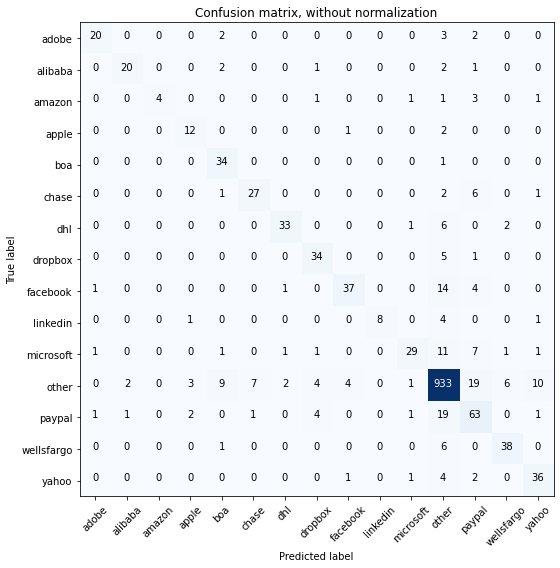

Acc     =  0.863
Pre     =  0.869
Rec     =  0.863
F1      =  0.862

Bal_Acc =  0.737
Bal_Pre =  0.816
Bal_Rec =  0.737
Bal_F1  =  0.774

              precision    recall  f1-score   support

       adobe       0.87      0.74      0.80        27
     alibaba       0.87      0.77      0.82        26
      amazon       1.00      0.36      0.53        11
       apple       0.67      0.80      0.73        15
         boa       0.68      0.97      0.80        35
       chase       0.77      0.73      0.75        37
         dhl       0.89      0.79      0.84        42
     dropbox       0.76      0.85      0.80        40
    facebook       0.86      0.65      0.74        57
    linkedin       1.00      0.57      0.73        14
   microsoft       0.85      0.55      0.67        53
       other       0.92      0.93      0.93      1000
      paypal       0.58      0.68      0.63        93
  wellsfargo       0.81      0.84      0.83        45
       yahoo       0.71      0.82      0.76        

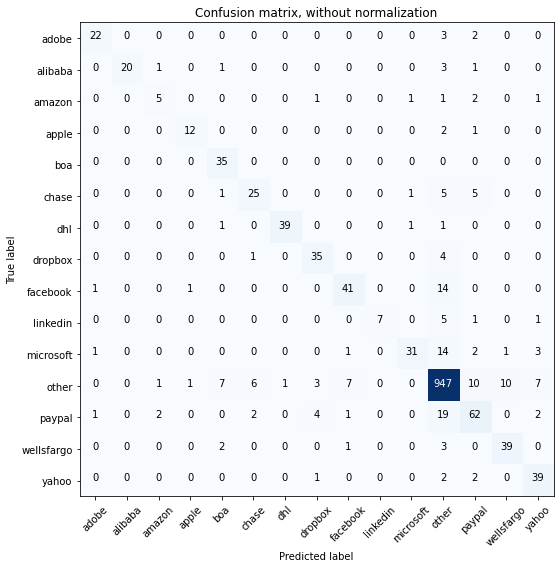

Acc     =  0.883
Pre     =  0.885
Rec     =  0.883
F1      =  0.881

Bal_Acc =  0.766
Bal_Pre =  0.827
Bal_Rec =  0.766
Bal_F1  =  0.795

              precision    recall  f1-score   support

       adobe       0.88      0.81      0.85        27
     alibaba       1.00      0.77      0.87        26
      amazon       0.56      0.45      0.50        11
       apple       0.86      0.80      0.83        15
         boa       0.74      1.00      0.85        35
       chase       0.74      0.68      0.70        37
         dhl       0.97      0.93      0.95        42
     dropbox       0.80      0.88      0.83        40
    facebook       0.80      0.72      0.76        57
    linkedin       1.00      0.50      0.67        14
   microsoft       0.91      0.58      0.71        53
       other       0.93      0.95      0.94      1000
      paypal       0.70      0.67      0.69        93
  wellsfargo       0.78      0.87      0.82        45
       yahoo       0.74      0.89      0.80        

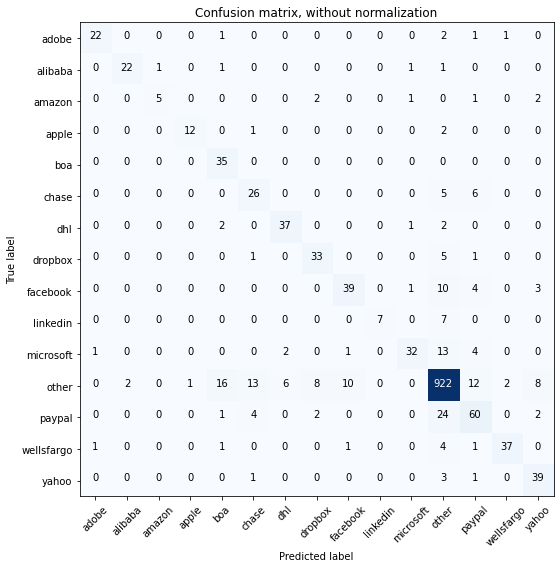

Acc     =  0.863
Pre     =  0.87
Rec     =  0.863
F1      =  0.863

Bal_Acc =  0.759
Bal_Pre =  0.814
Bal_Rec =  0.759
Bal_F1  =  0.786

              precision    recall  f1-score   support

       adobe       0.92      0.81      0.86        27
     alibaba       0.92      0.85      0.88        26
      amazon       0.83      0.45      0.59        11
       apple       0.92      0.80      0.86        15
         boa       0.61      1.00      0.76        35
       chase       0.57      0.70      0.63        37
         dhl       0.82      0.88      0.85        42
     dropbox       0.73      0.82      0.78        40
    facebook       0.76      0.68      0.72        57
    linkedin       1.00      0.50      0.67        14
   microsoft       0.89      0.60      0.72        53
       other       0.92      0.92      0.92      1000
      paypal       0.66      0.65      0.65        93
  wellsfargo       0.93      0.82      0.87        45
       yahoo       0.72      0.89      0.80        4

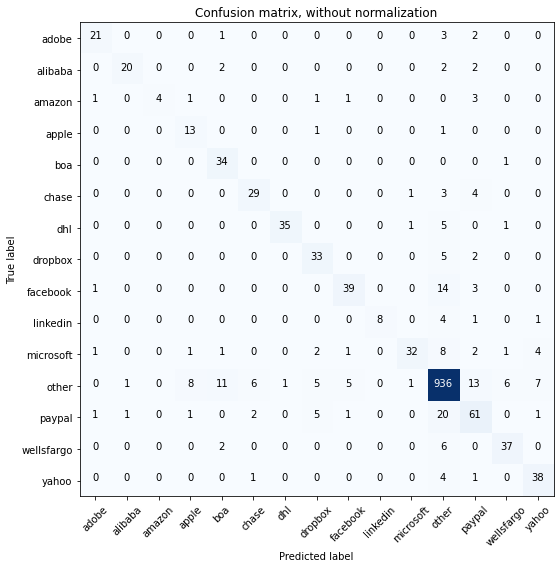

Acc     =  0.871
Pre     =  0.878
Rec     =  0.871
F1      =  0.87

Bal_Acc =  0.755
Bal_Pre =  0.818
Bal_Rec =  0.755
Bal_F1  =  0.785

              precision    recall  f1-score   support

       adobe       0.84      0.78      0.81        27
     alibaba       0.91      0.77      0.83        26
      amazon       1.00      0.36      0.53        11
       apple       0.54      0.87      0.67        15
         boa       0.67      0.97      0.79        35
       chase       0.76      0.78      0.77        37
         dhl       0.97      0.83      0.90        42
     dropbox       0.70      0.82      0.76        40
    facebook       0.83      0.68      0.75        57
    linkedin       1.00      0.57      0.73        14
   microsoft       0.91      0.60      0.73        53
       other       0.93      0.94      0.93      1000
      paypal       0.65      0.66      0.65        93
  wellsfargo       0.80      0.82      0.81        45
       yahoo       0.75      0.86      0.80        4

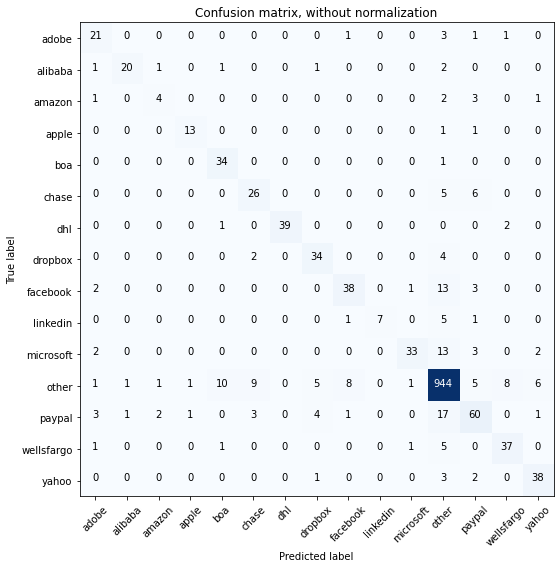

Acc     =  0.876
Pre     =  0.878
Rec     =  0.876
F1      =  0.874

Bal_Acc =  0.753
Bal_Pre =  0.797
Bal_Rec =  0.753
Bal_F1  =  0.774

              precision    recall  f1-score   support

       adobe       0.66      0.78      0.71        27
     alibaba       0.91      0.77      0.83        26
      amazon       0.50      0.36      0.42        11
       apple       0.87      0.87      0.87        15
         boa       0.72      0.97      0.83        35
       chase       0.65      0.70      0.68        37
         dhl       1.00      0.93      0.96        42
     dropbox       0.76      0.85      0.80        40
    facebook       0.78      0.67      0.72        57
    linkedin       1.00      0.50      0.67        14
   microsoft       0.92      0.62      0.74        53
       other       0.93      0.94      0.94      1000
      paypal       0.71      0.65      0.67        93
  wellsfargo       0.77      0.82      0.80        45
       yahoo       0.79      0.86      0.83        

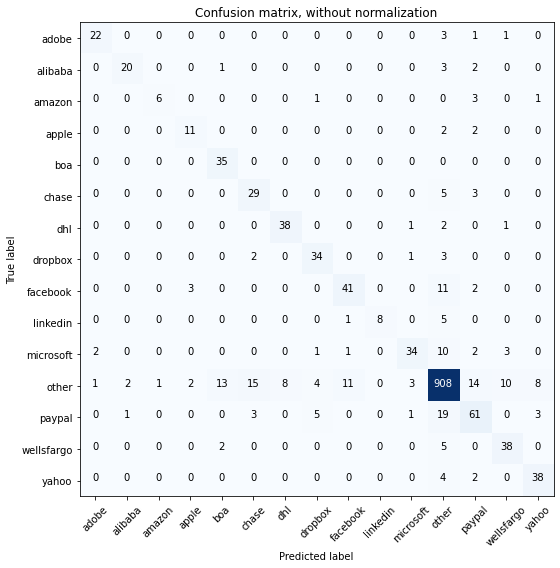

Acc     =  0.86
Pre     =  0.866
Rec     =  0.86
F1      =  0.86

Bal_Acc =  0.774
Bal_Pre =  0.789
Bal_Rec =  0.774
Bal_F1  =  0.781

              precision    recall  f1-score   support

       adobe       0.88      0.81      0.85        27
     alibaba       0.87      0.77      0.82        26
      amazon       0.86      0.55      0.67        11
       apple       0.69      0.73      0.71        15
         boa       0.69      1.00      0.81        35
       chase       0.59      0.78      0.67        37
         dhl       0.83      0.90      0.86        42
     dropbox       0.76      0.85      0.80        40
    facebook       0.76      0.72      0.74        57
    linkedin       1.00      0.57      0.73        14
   microsoft       0.85      0.64      0.73        53
       other       0.93      0.91      0.92      1000
      paypal       0.66      0.66      0.66        93
  wellsfargo       0.72      0.84      0.78        45
       yahoo       0.76      0.86      0.81        44


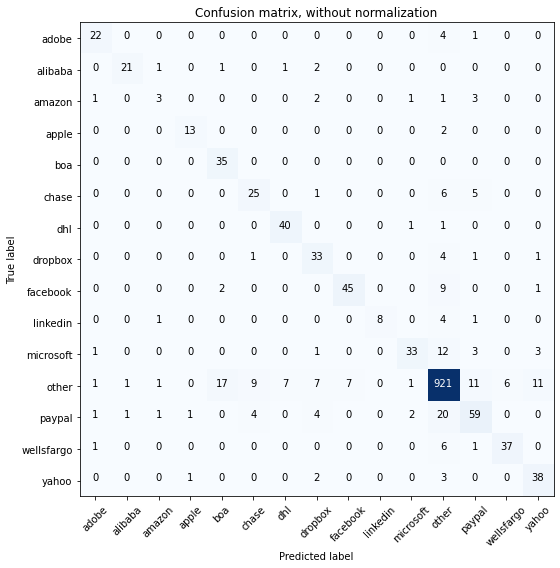

Acc     =  0.866
Pre     =  0.871
Rec     =  0.866
F1      =  0.866

Bal_Acc =  0.763
Bal_Pre =  0.779
Bal_Rec =  0.763
Bal_F1  =  0.771

              precision    recall  f1-score   support

       adobe       0.81      0.81      0.81        27
     alibaba       0.91      0.81      0.86        26
      amazon       0.43      0.27      0.33        11
       apple       0.87      0.87      0.87        15
         boa       0.64      1.00      0.78        35
       chase       0.64      0.68      0.66        37
         dhl       0.83      0.95      0.89        42
     dropbox       0.63      0.82      0.72        40
    facebook       0.87      0.79      0.83        57
    linkedin       1.00      0.57      0.73        14
   microsoft       0.87      0.62      0.73        53
       other       0.93      0.92      0.92      1000
      paypal       0.69      0.63      0.66        93
  wellsfargo       0.86      0.82      0.84        45
       yahoo       0.70      0.86      0.78        

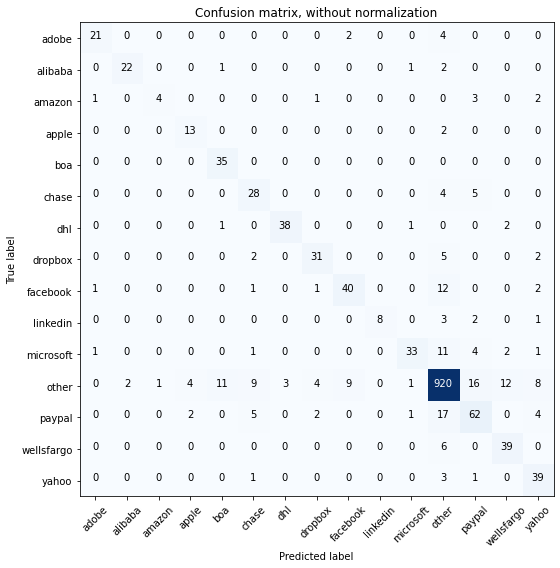

Acc     =  0.866
Pre     =  0.873
Rec     =  0.866
F1      =  0.866

Bal_Acc =  0.768
Bal_Pre =  0.798
Bal_Rec =  0.768
Bal_F1  =  0.783

              precision    recall  f1-score   support

       adobe       0.88      0.78      0.82        27
     alibaba       0.92      0.85      0.88        26
      amazon       0.80      0.36      0.50        11
       apple       0.68      0.87      0.76        15
         boa       0.73      1.00      0.84        35
       chase       0.60      0.76      0.67        37
         dhl       0.93      0.90      0.92        42
     dropbox       0.79      0.78      0.78        40
    facebook       0.78      0.70      0.74        57
    linkedin       1.00      0.57      0.73        14
   microsoft       0.89      0.62      0.73        53
       other       0.93      0.92      0.93      1000
      paypal       0.67      0.67      0.67        93
  wellsfargo       0.71      0.87      0.78        45
       yahoo       0.66      0.89      0.76        

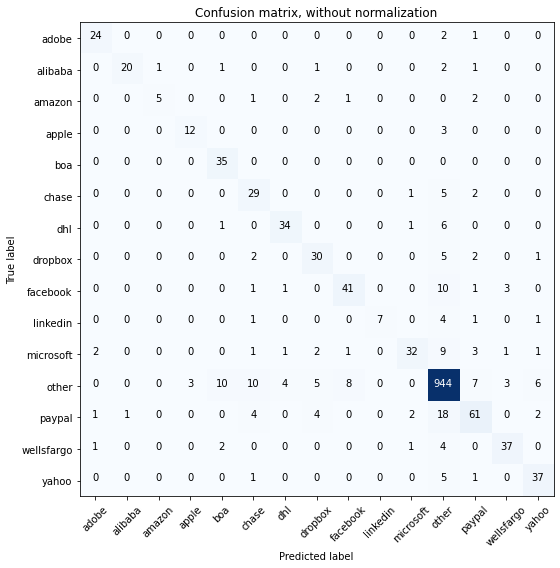

Acc     =  0.876
Pre     =  0.879
Rec     =  0.876
F1      =  0.874

Bal_Acc =  0.756
Bal_Pre =  0.815
Bal_Rec =  0.756
Bal_F1  =  0.784

              precision    recall  f1-score   support

       adobe       0.86      0.89      0.87        27
     alibaba       0.95      0.77      0.85        26
      amazon       0.83      0.45      0.59        11
       apple       0.80      0.80      0.80        15
         boa       0.71      1.00      0.83        35
       chase       0.58      0.78      0.67        37
         dhl       0.85      0.81      0.83        42
     dropbox       0.68      0.75      0.71        40
    facebook       0.80      0.72      0.76        57
    linkedin       1.00      0.50      0.67        14
   microsoft       0.86      0.60      0.71        53
       other       0.93      0.94      0.94      1000
      paypal       0.74      0.66      0.70        93
  wellsfargo       0.84      0.82      0.83        45
       yahoo       0.77      0.84      0.80        

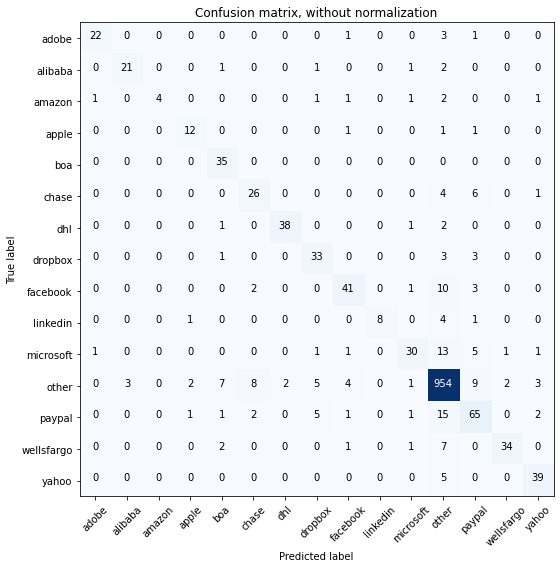

Acc     =  0.885
Pre     =  0.887
Rec     =  0.885
F1      =  0.882

Bal_Acc =  0.758
Bal_Pre =  0.841
Bal_Rec =  0.758
Bal_F1  =  0.797

              precision    recall  f1-score   support

       adobe       0.92      0.81      0.86        27
     alibaba       0.88      0.81      0.84        26
      amazon       1.00      0.36      0.53        11
       apple       0.75      0.80      0.77        15
         boa       0.73      1.00      0.84        35
       chase       0.68      0.70      0.69        37
         dhl       0.95      0.90      0.93        42
     dropbox       0.72      0.82      0.77        40
    facebook       0.80      0.72      0.76        57
    linkedin       1.00      0.57      0.73        14
   microsoft       0.81      0.57      0.67        53
       other       0.93      0.95      0.94      1000
      paypal       0.69      0.70      0.70        93
  wellsfargo       0.92      0.76      0.83        45
       yahoo       0.83      0.89      0.86        

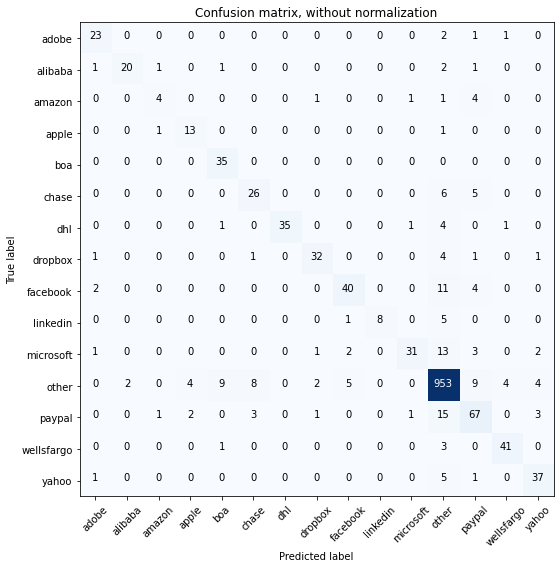

Acc     =  0.887
Pre     =  0.889
Rec     =  0.887
F1      =  0.885

Bal_Acc =  0.765
Bal_Pre =  0.819
Bal_Rec =  0.765
Bal_F1  =  0.791

              precision    recall  f1-score   support

       adobe       0.79      0.85      0.82        27
     alibaba       0.91      0.77      0.83        26
      amazon       0.57      0.36      0.44        11
       apple       0.68      0.87      0.76        15
         boa       0.74      1.00      0.85        35
       chase       0.68      0.70      0.69        37
         dhl       1.00      0.83      0.91        42
     dropbox       0.86      0.80      0.83        40
    facebook       0.83      0.70      0.76        57
    linkedin       1.00      0.57      0.73        14
   microsoft       0.91      0.58      0.71        53
       other       0.93      0.95      0.94      1000
      paypal       0.70      0.72      0.71        93
  wellsfargo       0.87      0.91      0.89        45
       yahoo       0.79      0.84      0.81        

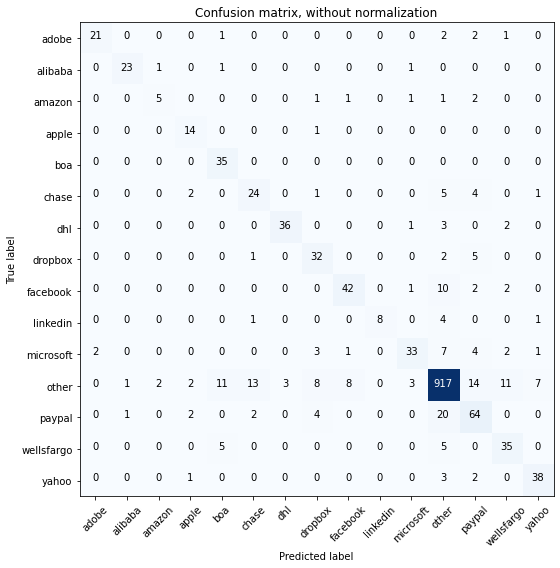

Acc     =  0.862
Pre     =  0.87
Rec     =  0.862
F1      =  0.863

Bal_Acc =  0.769
Bal_Pre =  0.773
Bal_Rec =  0.769
Bal_F1  =  0.771

              precision    recall  f1-score   support

       adobe       0.91      0.78      0.84        27
     alibaba       0.92      0.88      0.90        26
      amazon       0.62      0.45      0.53        11
       apple       0.67      0.93      0.78        15
         boa       0.66      1.00      0.80        35
       chase       0.59      0.65      0.62        37
         dhl       0.92      0.86      0.89        42
     dropbox       0.64      0.80      0.71        40
    facebook       0.81      0.74      0.77        57
    linkedin       1.00      0.57      0.73        14
   microsoft       0.82      0.62      0.71        53
       other       0.94      0.92      0.93      1000
      paypal       0.65      0.69      0.67        93
  wellsfargo       0.66      0.78      0.71        45
       yahoo       0.79      0.86      0.83        4

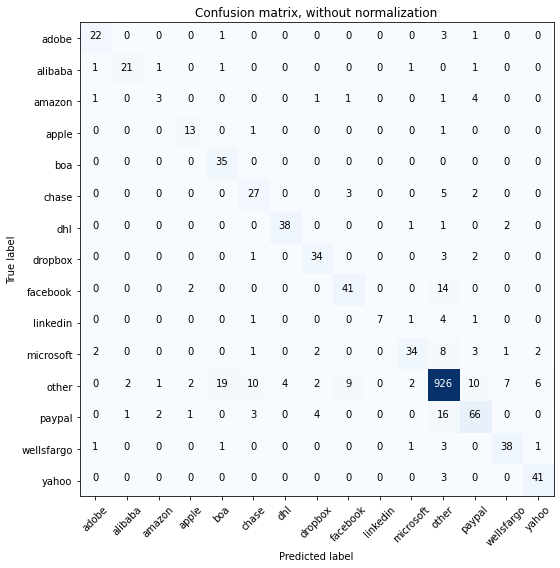

Acc     =  0.875
Pre     =  0.88
Rec     =  0.875
F1      =  0.874

Bal_Acc =  0.768
Bal_Pre =  0.777
Bal_Rec =  0.768
Bal_F1  =  0.772

              precision    recall  f1-score   support

       adobe       0.81      0.81      0.81        27
     alibaba       0.88      0.81      0.84        26
      amazon       0.43      0.27      0.33        11
       apple       0.72      0.87      0.79        15
         boa       0.61      1.00      0.76        35
       chase       0.61      0.73      0.67        37
         dhl       0.90      0.90      0.90        42
     dropbox       0.79      0.85      0.82        40
    facebook       0.76      0.72      0.74        57
    linkedin       1.00      0.50      0.67        14
   microsoft       0.85      0.64      0.73        53
       other       0.94      0.93      0.93      1000
      paypal       0.73      0.71      0.72        93
  wellsfargo       0.79      0.84      0.82        45
       yahoo       0.82      0.93      0.87        4

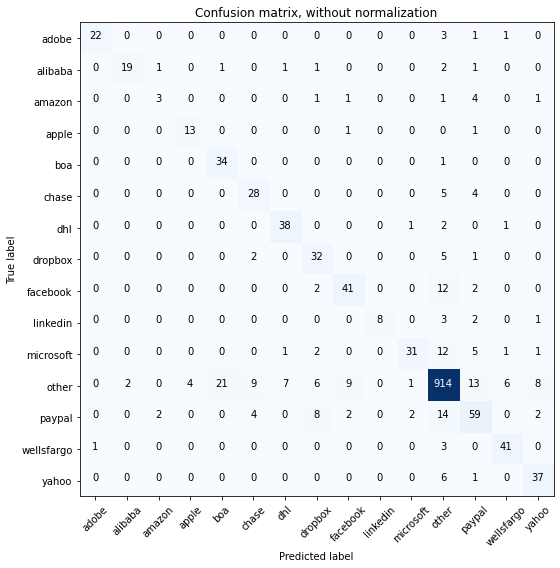

Acc     =  0.858
Pre     =  0.866
Rec     =  0.858
F1      =  0.858

Bal_Acc =  0.753
Bal_Pre =  0.771
Bal_Rec =  0.753
Bal_F1  =  0.762

              precision    recall  f1-score   support

       adobe       0.96      0.81      0.88        27
     alibaba       0.90      0.73      0.81        26
      amazon       0.50      0.27      0.35        11
       apple       0.76      0.87      0.81        15
         boa       0.61      0.97      0.75        35
       chase       0.65      0.76      0.70        37
         dhl       0.81      0.90      0.85        42
     dropbox       0.62      0.80      0.70        40
    facebook       0.76      0.72      0.74        57
    linkedin       1.00      0.57      0.73        14
   microsoft       0.89      0.58      0.70        53
       other       0.93      0.91      0.92      1000
      paypal       0.63      0.63      0.63        93
  wellsfargo       0.82      0.91      0.86        45
       yahoo       0.74      0.84      0.79        

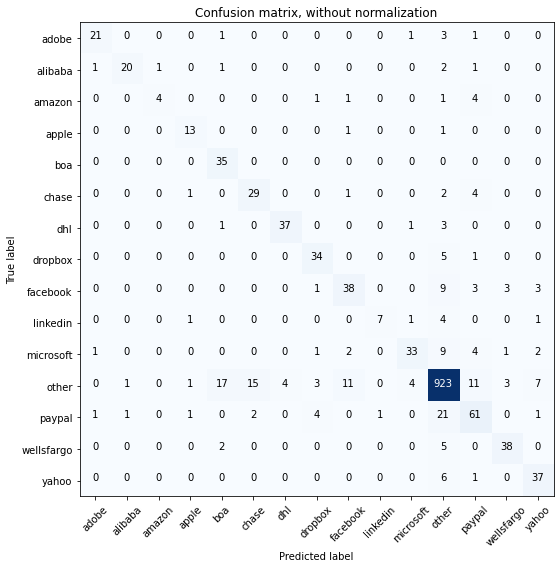

Acc     =  0.864
Pre     =  0.869
Rec     =  0.864
F1      =  0.864

Bal_Acc =  0.756
Bal_Pre =  0.789
Bal_Rec =  0.756
Bal_F1  =  0.772

              precision    recall  f1-score   support

       adobe       0.88      0.78      0.82        27
     alibaba       0.91      0.77      0.83        26
      amazon       0.80      0.36      0.50        11
       apple       0.76      0.87      0.81        15
         boa       0.61      1.00      0.76        35
       chase       0.63      0.78      0.70        37
         dhl       0.90      0.88      0.89        42
     dropbox       0.77      0.85      0.81        40
    facebook       0.70      0.67      0.68        57
    linkedin       0.88      0.50      0.64        14
   microsoft       0.82      0.62      0.71        53
       other       0.93      0.92      0.93      1000
      paypal       0.67      0.66      0.66        93
  wellsfargo       0.84      0.84      0.84        45
       yahoo       0.73      0.84      0.78        

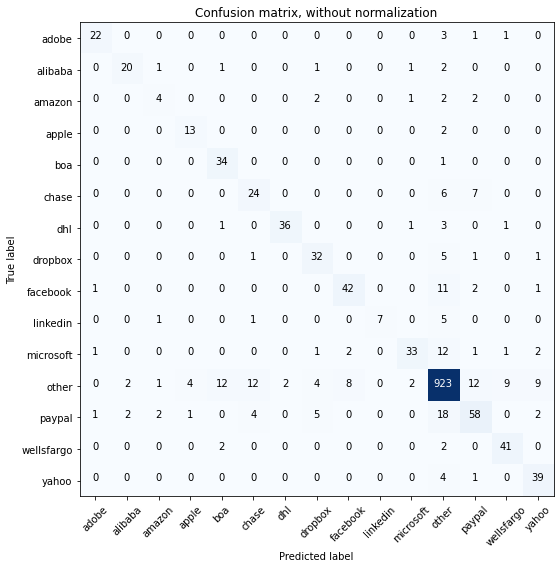

Acc     =  0.863
Pre     =  0.867
Rec     =  0.863
F1      =  0.862

Bal_Acc =  0.753
Bal_Pre =  0.771
Bal_Rec =  0.753
Bal_F1  =  0.762

              precision    recall  f1-score   support

       adobe       0.88      0.81      0.85        27
     alibaba       0.83      0.77      0.80        26
      amazon       0.44      0.36      0.40        11
       apple       0.72      0.87      0.79        15
         boa       0.68      0.97      0.80        35
       chase       0.57      0.65      0.61        37
         dhl       0.95      0.86      0.90        42
     dropbox       0.71      0.80      0.75        40
    facebook       0.81      0.74      0.77        57
    linkedin       1.00      0.50      0.67        14
   microsoft       0.87      0.62      0.73        53
       other       0.92      0.92      0.92      1000
      paypal       0.68      0.62      0.65        93
  wellsfargo       0.77      0.91      0.84        45
       yahoo       0.72      0.89      0.80        

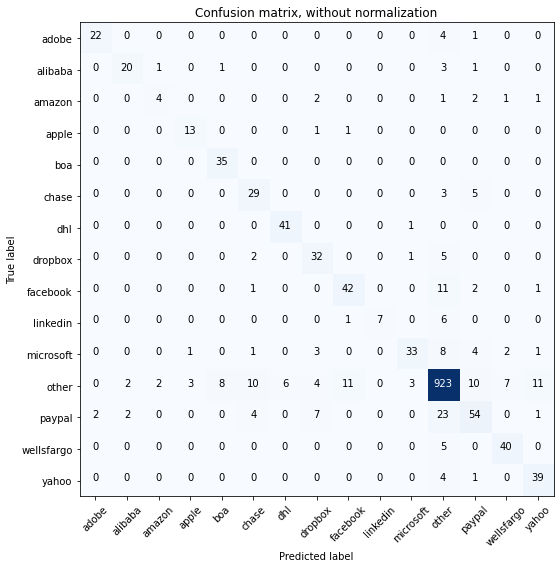

Acc     =  0.867
Pre     =  0.87
Rec     =  0.867
F1      =  0.865

Bal_Acc =  0.768
Bal_Pre =  0.785
Bal_Rec =  0.768
Bal_F1  =  0.776

              precision    recall  f1-score   support

       adobe       0.92      0.81      0.86        27
     alibaba       0.83      0.77      0.80        26
      amazon       0.57      0.36      0.44        11
       apple       0.76      0.87      0.81        15
         boa       0.80      1.00      0.89        35
       chase       0.62      0.78      0.69        37
         dhl       0.87      0.98      0.92        42
     dropbox       0.65      0.80      0.72        40
    facebook       0.76      0.74      0.75        57
    linkedin       1.00      0.50      0.67        14
   microsoft       0.87      0.62      0.73        53
       other       0.93      0.92      0.92      1000
      paypal       0.68      0.58      0.62        93
  wellsfargo       0.80      0.89      0.84        45
       yahoo       0.72      0.89      0.80        4

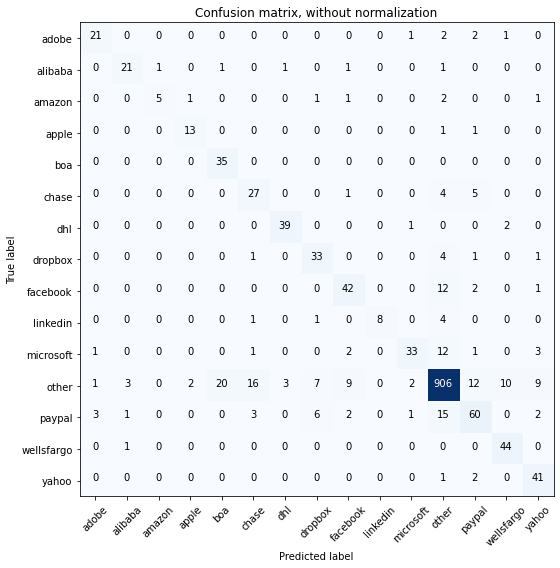

Acc     =  0.863
Pre     =  0.873
Rec     =  0.863
F1      =  0.864

Bal_Acc =  0.785
Bal_Pre =  0.783
Bal_Rec =  0.785
Bal_F1  =  0.784

              precision    recall  f1-score   support

       adobe       0.81      0.78      0.79        27
     alibaba       0.81      0.81      0.81        26
      amazon       0.83      0.45      0.59        11
       apple       0.81      0.87      0.84        15
         boa       0.62      1.00      0.77        35
       chase       0.55      0.73      0.63        37
         dhl       0.91      0.93      0.92        42
     dropbox       0.69      0.82      0.75        40
    facebook       0.72      0.74      0.73        57
    linkedin       1.00      0.57      0.73        14
   microsoft       0.87      0.62      0.73        53
       other       0.94      0.91      0.92      1000
      paypal       0.70      0.65      0.67        93
  wellsfargo       0.77      0.98      0.86        45
       yahoo       0.71      0.93      0.80        

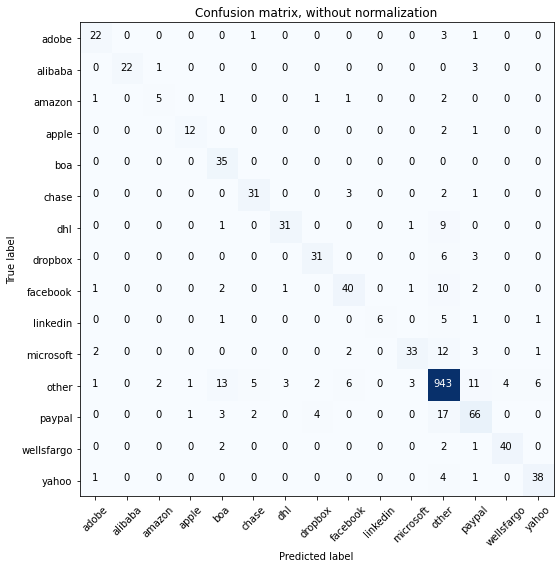

Acc     =  0.88
Pre     =  0.884
Rec     =  0.88
F1      =  0.879

Bal_Acc =  0.762
Bal_Pre =  0.825
Bal_Rec =  0.762
Bal_F1  =  0.792

              precision    recall  f1-score   support

       adobe       0.79      0.81      0.80        27
     alibaba       1.00      0.85      0.92        26
      amazon       0.62      0.45      0.53        11
       apple       0.86      0.80      0.83        15
         boa       0.60      1.00      0.75        35
       chase       0.79      0.84      0.82        37
         dhl       0.89      0.74      0.81        42
     dropbox       0.82      0.78      0.79        40
    facebook       0.77      0.70      0.73        57
    linkedin       1.00      0.43      0.60        14
   microsoft       0.87      0.62      0.73        53
       other       0.93      0.94      0.94      1000
      paypal       0.70      0.71      0.71        93
  wellsfargo       0.91      0.89      0.90        45
       yahoo       0.83      0.86      0.84        44

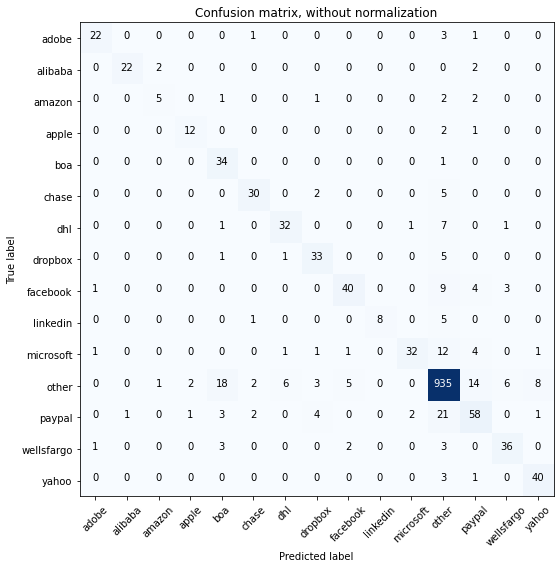

Acc     =  0.87
Pre     =  0.875
Rec     =  0.87
F1      =  0.869

Bal_Acc =  0.762
Bal_Pre =  0.808
Bal_Rec =  0.762
Bal_F1  =  0.784

              precision    recall  f1-score   support

       adobe       0.88      0.81      0.85        27
     alibaba       0.96      0.85      0.90        26
      amazon       0.62      0.45      0.53        11
       apple       0.80      0.80      0.80        15
         boa       0.56      0.97      0.71        35
       chase       0.83      0.81      0.82        37
         dhl       0.80      0.76      0.78        42
     dropbox       0.75      0.82      0.79        40
    facebook       0.83      0.70      0.76        57
    linkedin       1.00      0.57      0.73        14
   microsoft       0.91      0.60      0.73        53
       other       0.92      0.94      0.93      1000
      paypal       0.67      0.62      0.64        93
  wellsfargo       0.78      0.80      0.79        45
       yahoo       0.80      0.91      0.85        44

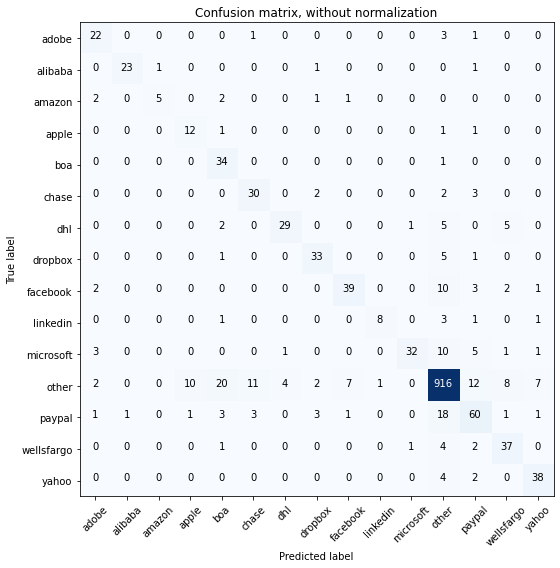

Acc     =  0.856
Pre     =  0.869
Rec     =  0.856
F1      =  0.858

Bal_Acc =  0.757
Bal_Pre =  0.768
Bal_Rec =  0.757
Bal_F1  =  0.762

              precision    recall  f1-score   support

       adobe       0.69      0.81      0.75        27
     alibaba       0.96      0.88      0.92        26
      amazon       0.83      0.45      0.59        11
       apple       0.52      0.80      0.63        15
         boa       0.52      0.97      0.68        35
       chase       0.67      0.81      0.73        37
         dhl       0.85      0.69      0.76        42
     dropbox       0.79      0.82      0.80        40
    facebook       0.81      0.68      0.74        57
    linkedin       0.89      0.57      0.70        14
   microsoft       0.94      0.60      0.74        53
       other       0.93      0.92      0.92      1000
      paypal       0.65      0.65      0.65        93
  wellsfargo       0.69      0.82      0.75        45
       yahoo       0.78      0.86      0.82        

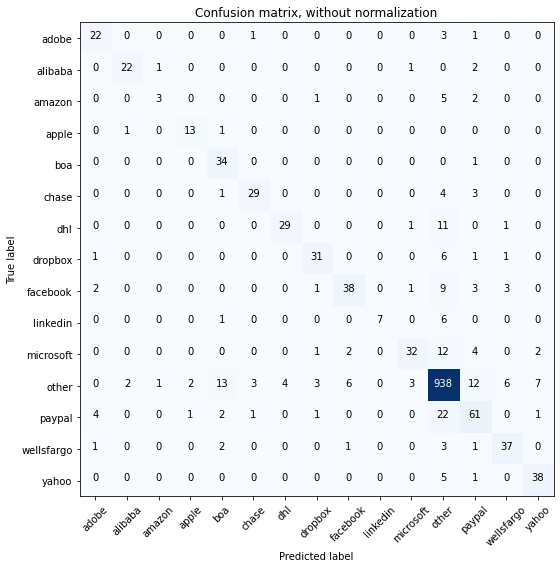

Acc     =  0.867
Pre     =  0.868
Rec     =  0.867
F1      =  0.864

Bal_Acc =  0.738
Bal_Pre =  0.8
Bal_Rec =  0.738
Bal_F1  =  0.768

              precision    recall  f1-score   support

       adobe       0.73      0.81      0.77        27
     alibaba       0.88      0.85      0.86        26
      amazon       0.60      0.27      0.37        11
       apple       0.81      0.87      0.84        15
         boa       0.63      0.97      0.76        35
       chase       0.85      0.78      0.82        37
         dhl       0.88      0.69      0.77        42
     dropbox       0.82      0.78      0.79        40
    facebook       0.81      0.67      0.73        57
    linkedin       1.00      0.50      0.67        14
   microsoft       0.84      0.60      0.70        53
       other       0.92      0.94      0.93      1000
      paypal       0.66      0.66      0.66        93
  wellsfargo       0.77      0.82      0.80        45
       yahoo       0.79      0.86      0.83        44

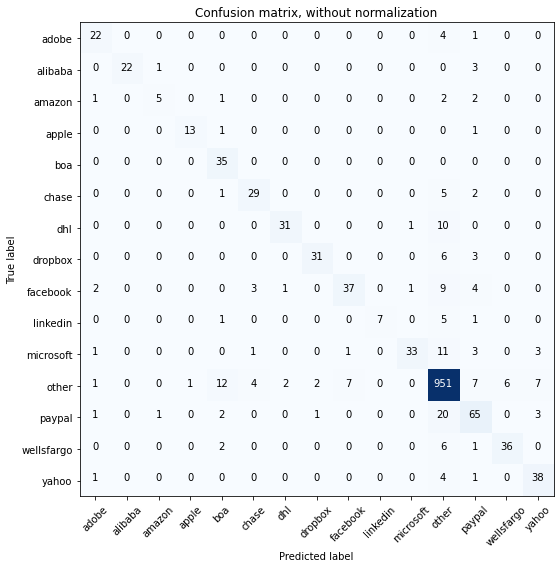

Acc     =  0.88
Pre     =  0.885
Rec     =  0.88
F1      =  0.878

Bal_Acc =  0.758
Bal_Pre =  0.842
Bal_Rec =  0.758
Bal_F1  =  0.798

              precision    recall  f1-score   support

       adobe       0.76      0.81      0.79        27
     alibaba       1.00      0.85      0.92        26
      amazon       0.71      0.45      0.56        11
       apple       0.93      0.87      0.90        15
         boa       0.64      1.00      0.78        35
       chase       0.78      0.78      0.78        37
         dhl       0.91      0.74      0.82        42
     dropbox       0.91      0.78      0.84        40
    facebook       0.82      0.65      0.73        57
    linkedin       1.00      0.50      0.67        14
   microsoft       0.94      0.62      0.75        53
       other       0.92      0.95      0.94      1000
      paypal       0.69      0.70      0.70        93
  wellsfargo       0.86      0.80      0.83        45
       yahoo       0.75      0.86      0.80        44

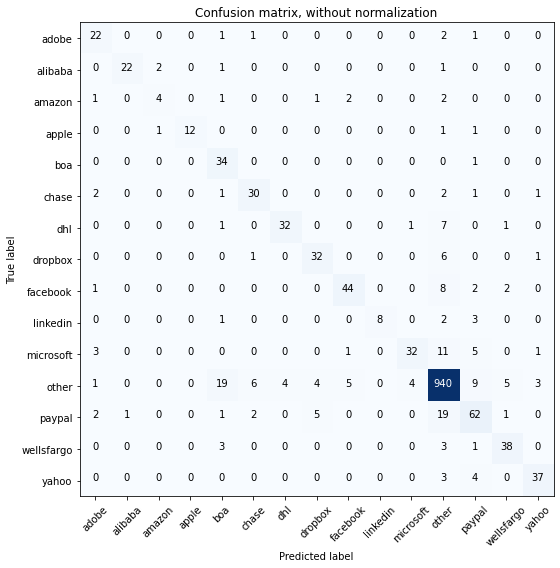

Acc     =  0.877
Pre     =  0.883
Rec     =  0.877
F1      =  0.876

Bal_Acc =  0.761
Bal_Pre =  0.811
Bal_Rec =  0.761
Bal_F1  =  0.785

              precision    recall  f1-score   support

       adobe       0.69      0.81      0.75        27
     alibaba       0.96      0.85      0.90        26
      amazon       0.57      0.36      0.44        11
       apple       1.00      0.80      0.89        15
         boa       0.54      0.97      0.69        35
       chase       0.75      0.81      0.78        37
         dhl       0.89      0.76      0.82        42
     dropbox       0.76      0.80      0.78        40
    facebook       0.85      0.77      0.81        57
    linkedin       1.00      0.57      0.73        14
   microsoft       0.86      0.60      0.71        53
       other       0.93      0.94      0.94      1000
      paypal       0.69      0.67      0.68        93
  wellsfargo       0.81      0.84      0.83        45
       yahoo       0.86      0.84      0.85        

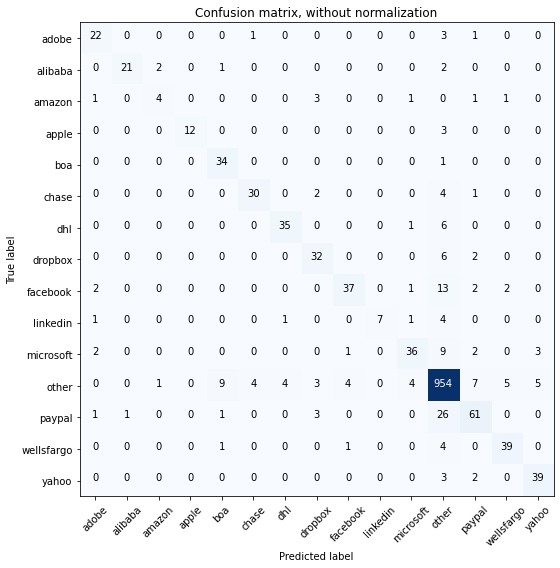

Acc     =  0.886
Pre     =  0.885
Rec     =  0.886
F1      =  0.882

Bal_Acc =  0.76
Bal_Pre =  0.835
Bal_Rec =  0.76
Bal_F1  =  0.796

              precision    recall  f1-score   support

       adobe       0.76      0.81      0.79        27
     alibaba       0.95      0.81      0.88        26
      amazon       0.57      0.36      0.44        11
       apple       1.00      0.80      0.89        15
         boa       0.74      0.97      0.84        35
       chase       0.86      0.81      0.83        37
         dhl       0.88      0.83      0.85        42
     dropbox       0.74      0.80      0.77        40
    facebook       0.86      0.65      0.74        57
    linkedin       1.00      0.50      0.67        14
   microsoft       0.82      0.68      0.74        53
       other       0.92      0.95      0.94      1000
      paypal       0.77      0.66      0.71        93
  wellsfargo       0.83      0.87      0.85        45
       yahoo       0.83      0.89      0.86        44

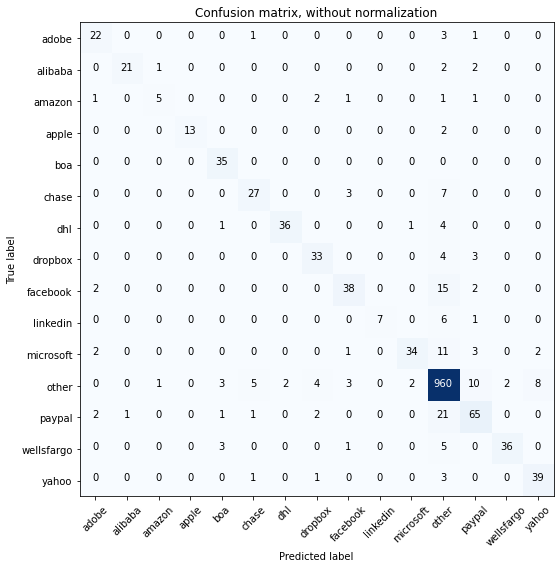

Acc     =  0.891
Pre     =  0.891
Rec     =  0.891
F1      =  0.888

Bal_Acc =  0.767
Bal_Pre =  0.858
Bal_Rec =  0.767
Bal_F1  =  0.81

              precision    recall  f1-score   support

       adobe       0.76      0.81      0.79        27
     alibaba       0.95      0.81      0.88        26
      amazon       0.71      0.45      0.56        11
       apple       1.00      0.87      0.93        15
         boa       0.81      1.00      0.90        35
       chase       0.77      0.73      0.75        37
         dhl       0.95      0.86      0.90        42
     dropbox       0.79      0.82      0.80        40
    facebook       0.81      0.67      0.73        57
    linkedin       1.00      0.50      0.67        14
   microsoft       0.92      0.64      0.76        53
       other       0.92      0.96      0.94      1000
      paypal       0.74      0.70      0.72        93
  wellsfargo       0.95      0.80      0.87        45
       yahoo       0.80      0.89      0.84        4

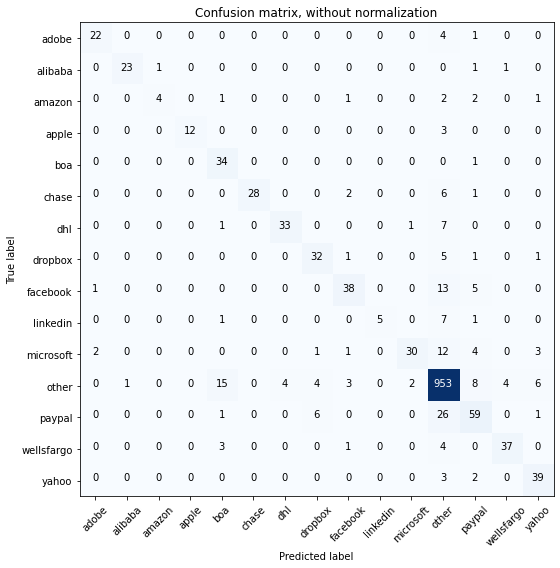

Acc     =  0.877
Pre     =  0.881
Rec     =  0.877
F1      =  0.873

Bal_Acc =  0.738
Bal_Pre =  0.856
Bal_Rec =  0.738
Bal_F1  =  0.793

              precision    recall  f1-score   support

       adobe       0.88      0.81      0.85        27
     alibaba       0.96      0.88      0.92        26
      amazon       0.80      0.36      0.50        11
       apple       1.00      0.80      0.89        15
         boa       0.61      0.97      0.75        35
       chase       1.00      0.76      0.86        37
         dhl       0.89      0.79      0.84        42
     dropbox       0.74      0.80      0.77        40
    facebook       0.81      0.67      0.73        57
    linkedin       1.00      0.36      0.53        14
   microsoft       0.91      0.57      0.70        53
       other       0.91      0.95      0.93      1000
      paypal       0.69      0.63      0.66        93
  wellsfargo       0.88      0.82      0.85        45
       yahoo       0.76      0.89      0.82        

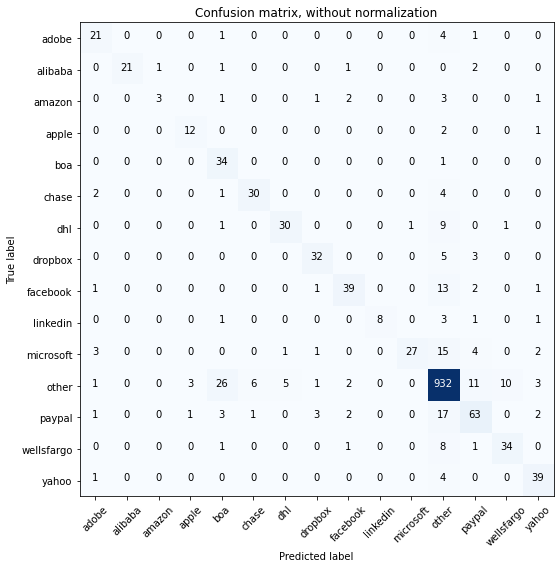

Acc     =  0.861
Pre     =  0.871
Rec     =  0.861
F1      =  0.86

Bal_Acc =  0.731
Bal_Pre =  0.807
Bal_Rec =  0.731
Bal_F1  =  0.767

              precision    recall  f1-score   support

       adobe       0.70      0.78      0.74        27
     alibaba       1.00      0.81      0.89        26
      amazon       0.75      0.27      0.40        11
       apple       0.75      0.80      0.77        15
         boa       0.49      0.97      0.65        35
       chase       0.81      0.81      0.81        37
         dhl       0.83      0.71      0.77        42
     dropbox       0.82      0.80      0.81        40
    facebook       0.83      0.68      0.75        57
    linkedin       1.00      0.57      0.73        14
   microsoft       0.96      0.51      0.67        53
       other       0.91      0.93      0.92      1000
      paypal       0.72      0.68      0.70        93
  wellsfargo       0.76      0.76      0.76        45
       yahoo       0.78      0.89      0.83        4

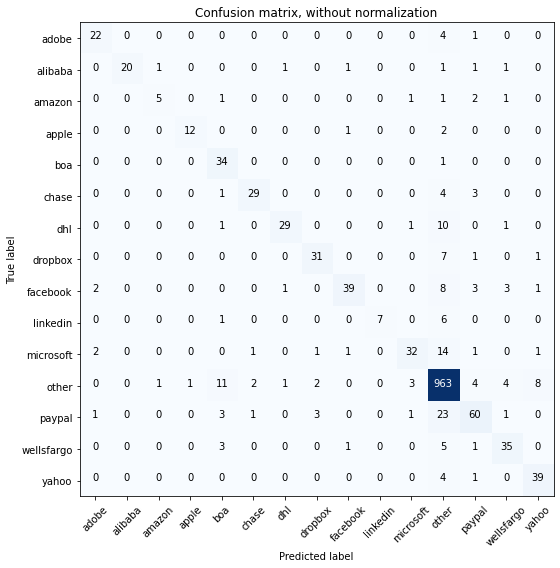

Acc     =  0.882
Pre     =  0.884
Rec     =  0.882
F1      =  0.878

Bal_Acc =  0.741
Bal_Pre =  0.844
Bal_Rec =  0.741
Bal_F1  =  0.789

              precision    recall  f1-score   support

       adobe       0.81      0.81      0.81        27
     alibaba       1.00      0.77      0.87        26
      amazon       0.71      0.45      0.56        11
       apple       0.92      0.80      0.86        15
         boa       0.62      0.97      0.76        35
       chase       0.88      0.78      0.83        37
         dhl       0.91      0.69      0.78        42
     dropbox       0.84      0.78      0.81        40
    facebook       0.91      0.68      0.78        57
    linkedin       1.00      0.50      0.67        14
   microsoft       0.84      0.60      0.70        53
       other       0.91      0.96      0.94      1000
      paypal       0.77      0.65      0.70        93
  wellsfargo       0.76      0.78      0.77        45
       yahoo       0.78      0.89      0.83        

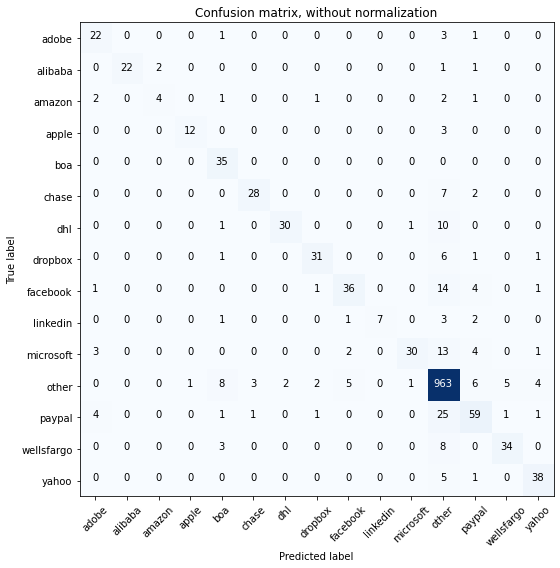

Acc     =  0.878
Pre     =  0.879
Rec     =  0.878
F1      =  0.873

Bal_Acc =  0.732
Bal_Pre =  0.845
Bal_Rec =  0.732
Bal_F1  =  0.784

              precision    recall  f1-score   support

       adobe       0.69      0.81      0.75        27
     alibaba       1.00      0.85      0.92        26
      amazon       0.67      0.36      0.47        11
       apple       0.92      0.80      0.86        15
         boa       0.67      1.00      0.80        35
       chase       0.88      0.76      0.81        37
         dhl       0.94      0.71      0.81        42
     dropbox       0.86      0.78      0.82        40
    facebook       0.82      0.63      0.71        57
    linkedin       1.00      0.50      0.67        14
   microsoft       0.94      0.57      0.71        53
       other       0.91      0.96      0.93      1000
      paypal       0.72      0.63      0.67        93
  wellsfargo       0.85      0.76      0.80        45
       yahoo       0.83      0.86      0.84        

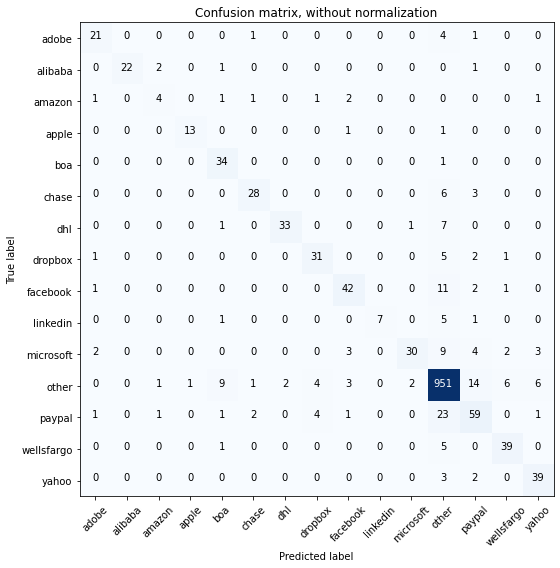

Acc     =  0.879
Pre     =  0.881
Rec     =  0.879
F1      =  0.876

Bal_Acc =  0.752
Bal_Pre =  0.823
Bal_Rec =  0.752
Bal_F1  =  0.786

              precision    recall  f1-score   support

       adobe       0.78      0.78      0.78        27
     alibaba       1.00      0.85      0.92        26
      amazon       0.50      0.36      0.42        11
       apple       0.93      0.87      0.90        15
         boa       0.69      0.97      0.81        35
       chase       0.85      0.76      0.80        37
         dhl       0.94      0.79      0.86        42
     dropbox       0.78      0.78      0.78        40
    facebook       0.81      0.74      0.77        57
    linkedin       1.00      0.50      0.67        14
   microsoft       0.91      0.57      0.70        53
       other       0.92      0.95      0.94      1000
      paypal       0.66      0.63      0.65        93
  wellsfargo       0.80      0.87      0.83        45
       yahoo       0.78      0.89      0.83        

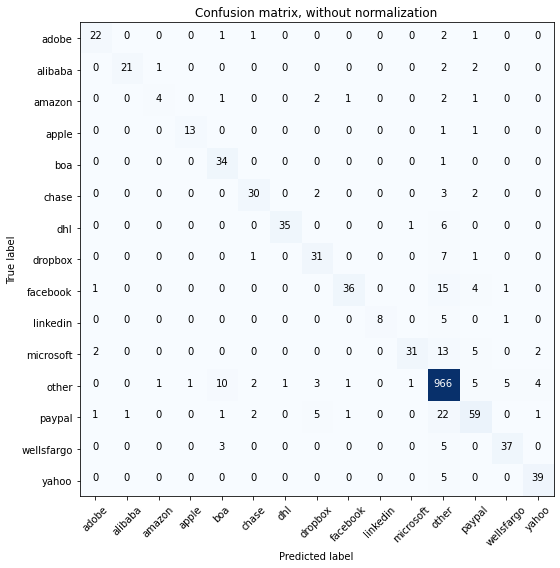

Acc     =  0.888
Pre     =  0.889
Rec     =  0.888
F1      =  0.883

Bal_Acc =  0.756
Bal_Pre =  0.853
Bal_Rec =  0.756
Bal_F1  =  0.802

              precision    recall  f1-score   support

       adobe       0.85      0.81      0.83        27
     alibaba       0.95      0.81      0.88        26
      amazon       0.67      0.36      0.47        11
       apple       0.93      0.87      0.90        15
         boa       0.68      0.97      0.80        35
       chase       0.83      0.81      0.82        37
         dhl       0.97      0.83      0.90        42
     dropbox       0.72      0.78      0.75        40
    facebook       0.92      0.63      0.75        57
    linkedin       1.00      0.57      0.73        14
   microsoft       0.94      0.58      0.72        53
       other       0.92      0.97      0.94      1000
      paypal       0.73      0.63      0.68        93
  wellsfargo       0.84      0.82      0.83        45
       yahoo       0.85      0.89      0.87        

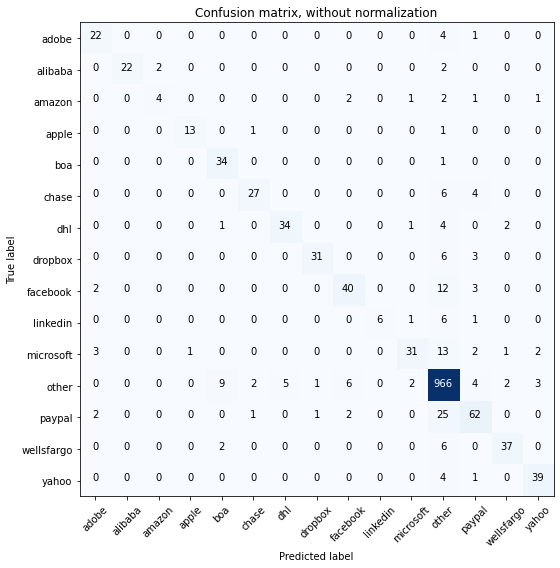

Acc     =  0.889
Pre     =  0.888
Rec     =  0.889
F1      =  0.884

Bal_Acc =  0.749
Bal_Pre =  0.857
Bal_Rec =  0.749
Bal_F1  =  0.799

              precision    recall  f1-score   support

       adobe       0.76      0.81      0.79        27
     alibaba       1.00      0.85      0.92        26
      amazon       0.67      0.36      0.47        11
       apple       0.93      0.87      0.90        15
         boa       0.74      0.97      0.84        35
       chase       0.87      0.73      0.79        37
         dhl       0.87      0.81      0.84        42
     dropbox       0.94      0.78      0.85        40
    facebook       0.80      0.70      0.75        57
    linkedin       1.00      0.43      0.60        14
   microsoft       0.86      0.58      0.70        53
       other       0.91      0.97      0.94      1000
      paypal       0.76      0.67      0.71        93
  wellsfargo       0.88      0.82      0.85        45
       yahoo       0.87      0.89      0.88        

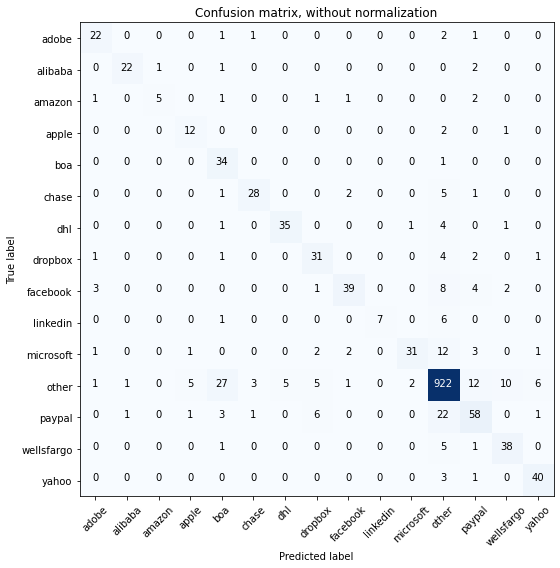

Acc     =  0.86
Pre     =  0.873
Rec     =  0.86
F1      =  0.861

Bal_Acc =  0.755
Bal_Pre =  0.795
Bal_Rec =  0.755
Bal_F1  =  0.774

              precision    recall  f1-score   support

       adobe       0.76      0.81      0.79        27
     alibaba       0.92      0.85      0.88        26
      amazon       0.83      0.45      0.59        11
       apple       0.63      0.80      0.71        15
         boa       0.47      0.97      0.64        35
       chase       0.85      0.76      0.80        37
         dhl       0.88      0.83      0.85        42
     dropbox       0.67      0.78      0.72        40
    facebook       0.87      0.68      0.76        57
    linkedin       1.00      0.50      0.67        14
   microsoft       0.91      0.58      0.71        53
       other       0.93      0.92      0.92      1000
      paypal       0.67      0.62      0.64        93
  wellsfargo       0.73      0.84      0.78        45
       yahoo       0.82      0.91      0.86        44

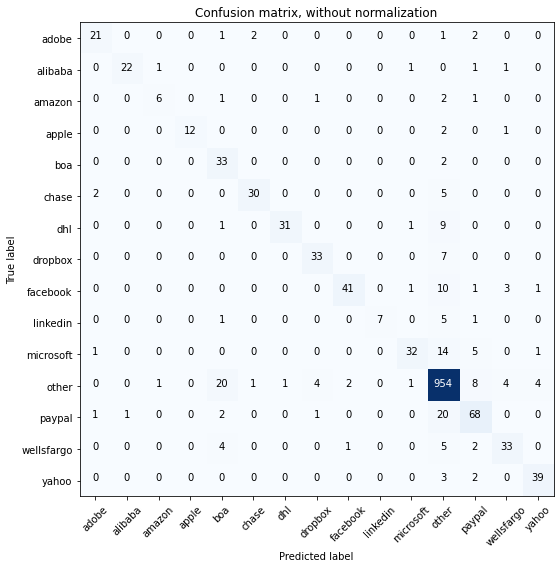

Acc     =  0.885
Pre     =  0.892
Rec     =  0.885
F1      =  0.884

Bal_Acc =  0.761
Bal_Pre =  0.862
Bal_Rec =  0.761
Bal_F1  =  0.808

              precision    recall  f1-score   support

       adobe       0.84      0.78      0.81        27
     alibaba       0.96      0.85      0.90        26
      amazon       0.75      0.55      0.63        11
       apple       1.00      0.80      0.89        15
         boa       0.52      0.94      0.67        35
       chase       0.91      0.81      0.86        37
         dhl       0.97      0.74      0.84        42
     dropbox       0.85      0.82      0.84        40
    facebook       0.93      0.72      0.81        57
    linkedin       1.00      0.50      0.67        14
   microsoft       0.89      0.60      0.72        53
       other       0.92      0.95      0.94      1000
      paypal       0.75      0.73      0.74        93
  wellsfargo       0.79      0.73      0.76        45
       yahoo       0.87      0.89      0.88        

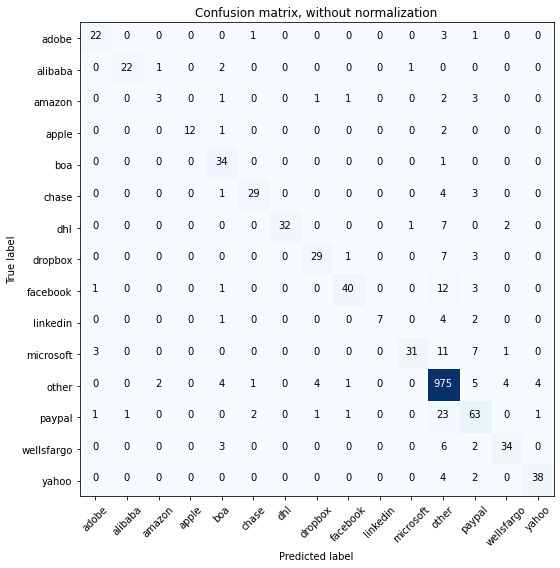

Acc     =  0.891
Pre     =  0.892
Rec     =  0.891
F1      =  0.887

Bal_Acc =  0.736
Bal_Pre =  0.856
Bal_Rec =  0.736
Bal_F1  =  0.791

              precision    recall  f1-score   support

       adobe       0.81      0.81      0.81        27
     alibaba       0.96      0.85      0.90        26
      amazon       0.50      0.27      0.35        11
       apple       1.00      0.80      0.89        15
         boa       0.71      0.97      0.82        35
       chase       0.88      0.78      0.83        37
         dhl       1.00      0.76      0.86        42
     dropbox       0.83      0.72      0.77        40
    facebook       0.91      0.70      0.79        57
    linkedin       1.00      0.50      0.67        14
   microsoft       0.94      0.58      0.72        53
       other       0.92      0.97      0.95      1000
      paypal       0.67      0.68      0.67        93
  wellsfargo       0.83      0.76      0.79        45
       yahoo       0.88      0.86      0.87        

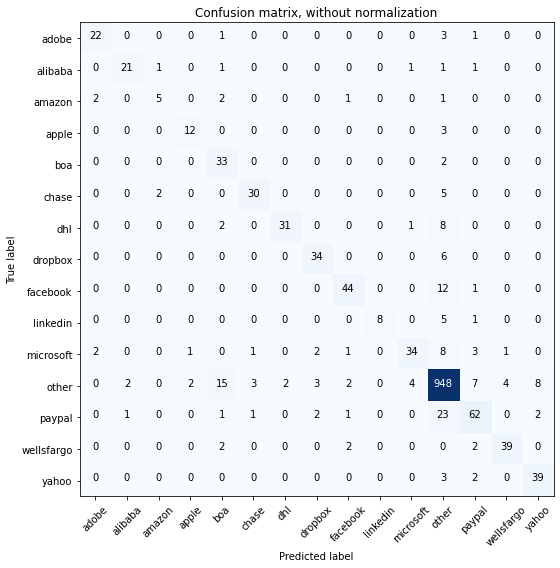

Acc     =  0.885
Pre     =  0.888
Rec     =  0.885
F1      =  0.883

Bal_Acc =  0.771
Bal_Pre =  0.83
Bal_Rec =  0.771
Bal_F1  =  0.799

              precision    recall  f1-score   support

       adobe       0.85      0.81      0.83        27
     alibaba       0.88      0.81      0.84        26
      amazon       0.62      0.45      0.53        11
       apple       0.80      0.80      0.80        15
         boa       0.58      0.94      0.72        35
       chase       0.86      0.81      0.83        37
         dhl       0.94      0.74      0.83        42
     dropbox       0.83      0.85      0.84        40
    facebook       0.86      0.77      0.81        57
    linkedin       1.00      0.57      0.73        14
   microsoft       0.85      0.64      0.73        53
       other       0.92      0.95      0.93      1000
      paypal       0.78      0.67      0.72        93
  wellsfargo       0.89      0.87      0.88        45
       yahoo       0.80      0.89      0.84        4

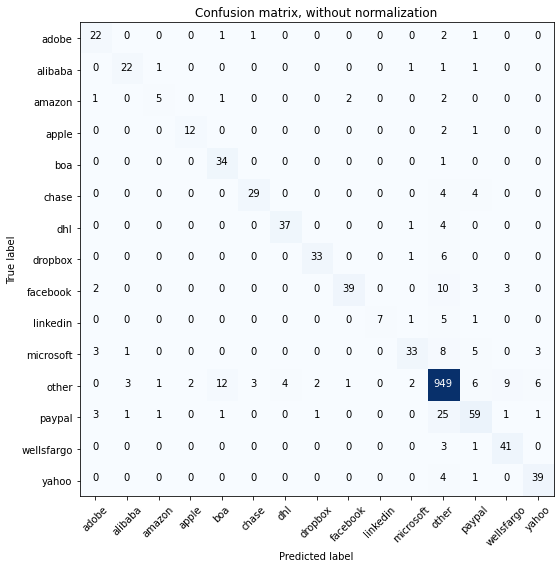

Acc     =  0.884
Pre     =  0.886
Rec     =  0.884
F1      =  0.882

Bal_Acc =  0.771
Bal_Pre =  0.824
Bal_Rec =  0.771
Bal_F1  =  0.797

              precision    recall  f1-score   support

       adobe       0.71      0.81      0.76        27
     alibaba       0.81      0.85      0.83        26
      amazon       0.62      0.45      0.53        11
       apple       0.86      0.80      0.83        15
         boa       0.69      0.97      0.81        35
       chase       0.88      0.78      0.83        37
         dhl       0.90      0.88      0.89        42
     dropbox       0.92      0.82      0.87        40
    facebook       0.93      0.68      0.79        57
    linkedin       1.00      0.50      0.67        14
   microsoft       0.85      0.62      0.72        53
       other       0.92      0.95      0.94      1000
      paypal       0.71      0.63      0.67        93
  wellsfargo       0.76      0.91      0.83        45
       yahoo       0.80      0.89      0.84        

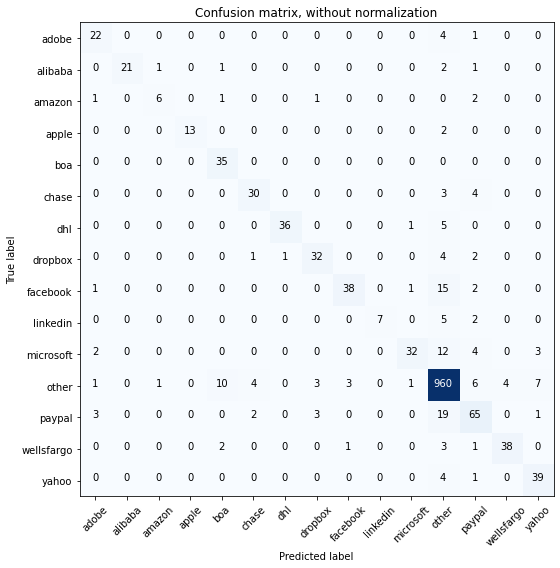

Acc     =  0.893
Pre     =  0.895
Rec     =  0.893
F1      =  0.89

Bal_Acc =  0.778
Bal_Pre =  0.863
Bal_Rec =  0.778
Bal_F1  =  0.818

              precision    recall  f1-score   support

       adobe       0.73      0.81      0.77        27
     alibaba       1.00      0.81      0.89        26
      amazon       0.75      0.55      0.63        11
       apple       1.00      0.87      0.93        15
         boa       0.71      1.00      0.83        35
       chase       0.81      0.81      0.81        37
         dhl       0.97      0.86      0.91        42
     dropbox       0.82      0.80      0.81        40
    facebook       0.90      0.67      0.77        57
    linkedin       1.00      0.50      0.67        14
   microsoft       0.91      0.60      0.73        53
       other       0.92      0.96      0.94      1000
      paypal       0.71      0.70      0.71        93
  wellsfargo       0.90      0.84      0.87        45
       yahoo       0.78      0.89      0.83        4

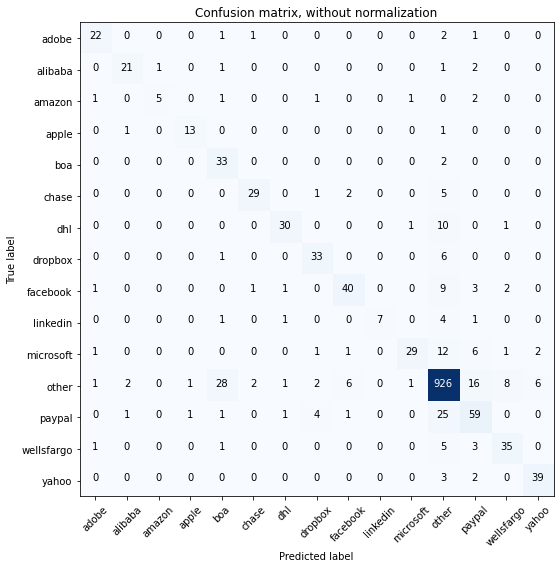

Acc     =  0.858
Pre     =  0.868
Rec     =  0.858
F1      =  0.858

Bal_Acc =  0.746
Bal_Pre =  0.814
Bal_Rec =  0.746
Bal_F1  =  0.779

              precision    recall  f1-score   support

       adobe       0.81      0.81      0.81        27
     alibaba       0.84      0.81      0.82        26
      amazon       0.83      0.45      0.59        11
       apple       0.87      0.87      0.87        15
         boa       0.49      0.94      0.64        35
       chase       0.88      0.78      0.83        37
         dhl       0.88      0.71      0.79        42
     dropbox       0.79      0.82      0.80        40
    facebook       0.80      0.70      0.75        57
    linkedin       1.00      0.50      0.67        14
   microsoft       0.91      0.55      0.68        53
       other       0.92      0.93      0.92      1000
      paypal       0.62      0.63      0.63        93
  wellsfargo       0.74      0.78      0.76        45
       yahoo       0.83      0.89      0.86        

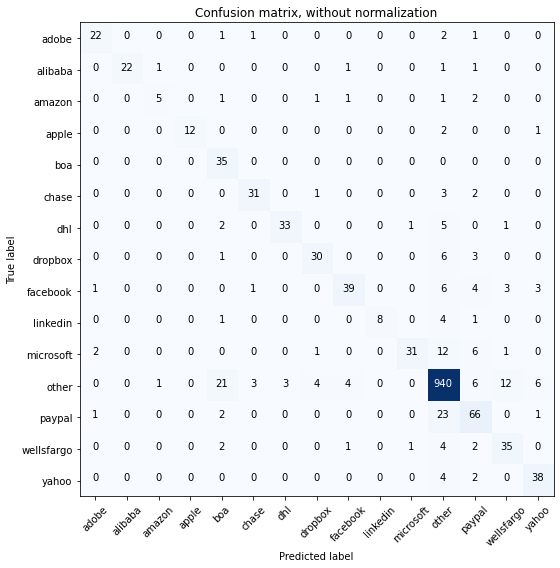

Acc     =  0.875
Pre     =  0.885
Rec     =  0.875
F1      =  0.875

Bal_Acc =  0.761
Bal_Pre =  0.835
Bal_Rec =  0.761
Bal_F1  =  0.796

              precision    recall  f1-score   support

       adobe       0.85      0.81      0.83        27
     alibaba       1.00      0.85      0.92        26
      amazon       0.71      0.45      0.56        11
       apple       1.00      0.80      0.89        15
         boa       0.53      1.00      0.69        35
       chase       0.86      0.84      0.85        37
         dhl       0.92      0.79      0.85        42
     dropbox       0.81      0.75      0.78        40
    facebook       0.85      0.68      0.76        57
    linkedin       1.00      0.57      0.73        14
   microsoft       0.94      0.58      0.72        53
       other       0.93      0.94      0.93      1000
      paypal       0.69      0.71      0.70        93
  wellsfargo       0.67      0.78      0.72        45
       yahoo       0.78      0.86      0.82        

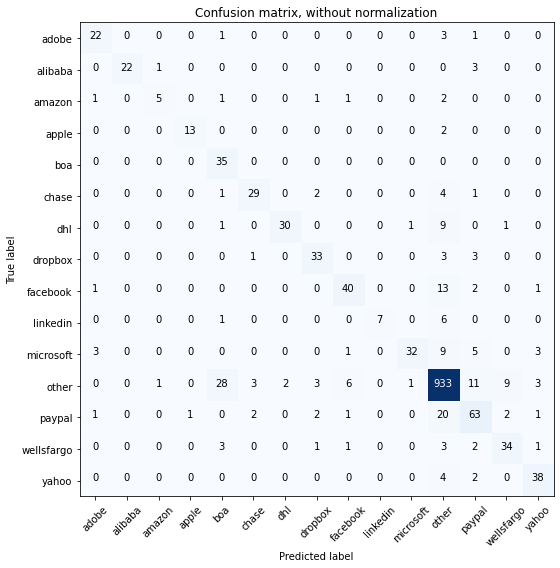

Acc     =  0.868
Pre     =  0.878
Rec     =  0.868
F1      =  0.868

Bal_Acc =  0.756
Bal_Pre =  0.824
Bal_Rec =  0.756
Bal_F1  =  0.789

              precision    recall  f1-score   support

       adobe       0.79      0.81      0.80        27
     alibaba       1.00      0.85      0.92        26
      amazon       0.71      0.45      0.56        11
       apple       0.93      0.87      0.90        15
         boa       0.49      1.00      0.66        35
       chase       0.83      0.78      0.81        37
         dhl       0.94      0.71      0.81        42
     dropbox       0.79      0.82      0.80        40
    facebook       0.80      0.70      0.75        57
    linkedin       1.00      0.50      0.67        14
   microsoft       0.94      0.60      0.74        53
       other       0.92      0.93      0.93      1000
      paypal       0.68      0.68      0.68        93
  wellsfargo       0.74      0.76      0.75        45
       yahoo       0.81      0.86      0.84        

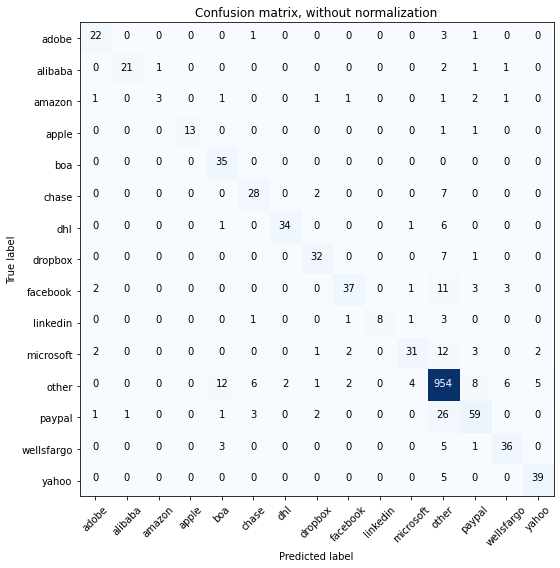

Acc     =  0.878
Pre     =  0.879
Rec     =  0.878
F1      =  0.875

Bal_Acc =  0.747
Bal_Pre =  0.838
Bal_Rec =  0.747
Bal_F1  =  0.79

              precision    recall  f1-score   support

       adobe       0.79      0.81      0.80        27
     alibaba       0.95      0.81      0.88        26
      amazon       0.75      0.27      0.40        11
       apple       1.00      0.87      0.93        15
         boa       0.66      1.00      0.80        35
       chase       0.72      0.76      0.74        37
         dhl       0.94      0.81      0.87        42
     dropbox       0.82      0.80      0.81        40
    facebook       0.86      0.65      0.74        57
    linkedin       1.00      0.57      0.73        14
   microsoft       0.82      0.58      0.68        53
       other       0.91      0.95      0.93      1000
      paypal       0.74      0.63      0.68        93
  wellsfargo       0.77      0.80      0.78        45
       yahoo       0.85      0.89      0.87        4

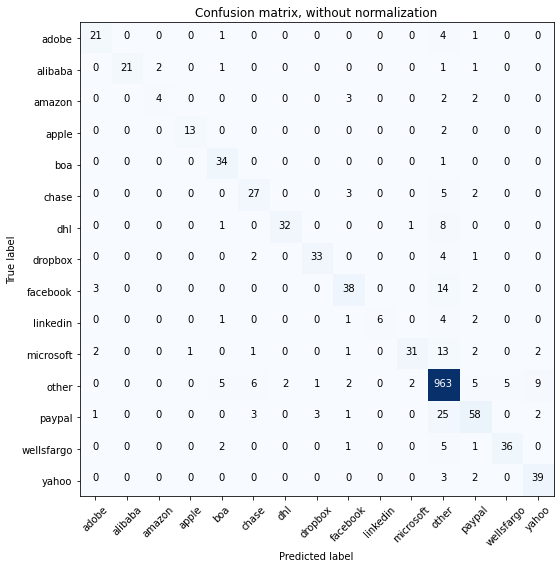

Acc     =  0.881
Pre     =  0.881
Rec     =  0.881
F1      =  0.877

Bal_Acc =  0.737
Bal_Pre =  0.84
Bal_Rec =  0.737
Bal_F1  =  0.785

              precision    recall  f1-score   support

       adobe       0.78      0.78      0.78        27
     alibaba       1.00      0.81      0.89        26
      amazon       0.67      0.36      0.47        11
       apple       0.93      0.87      0.90        15
         boa       0.76      0.97      0.85        35
       chase       0.69      0.73      0.71        37
         dhl       0.94      0.76      0.84        42
     dropbox       0.89      0.82      0.86        40
    facebook       0.76      0.67      0.71        57
    linkedin       1.00      0.43      0.60        14
   microsoft       0.91      0.58      0.71        53
       other       0.91      0.96      0.94      1000
      paypal       0.73      0.62      0.67        93
  wellsfargo       0.88      0.80      0.84        45
       yahoo       0.75      0.89      0.81        4

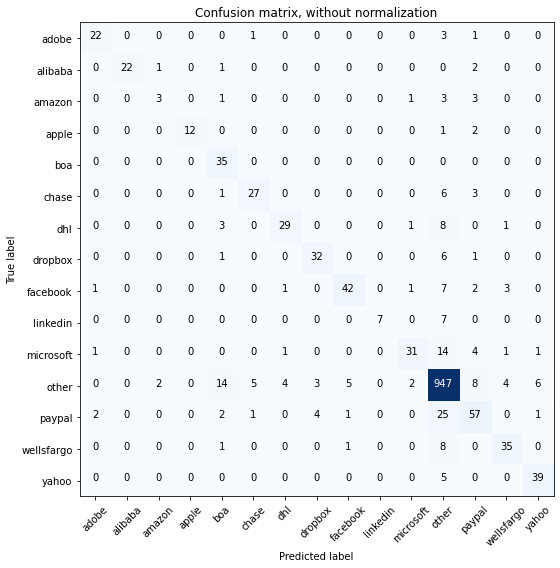

Acc     =  0.871
Pre     =  0.872
Rec     =  0.871
F1      =  0.867

Bal_Acc =  0.733
Bal_Pre =  0.822
Bal_Rec =  0.733
Bal_F1  =  0.775

              precision    recall  f1-score   support

       adobe       0.85      0.81      0.83        27
     alibaba       1.00      0.85      0.92        26
      amazon       0.50      0.27      0.35        11
       apple       1.00      0.80      0.89        15
         boa       0.59      1.00      0.74        35
       chase       0.79      0.73      0.76        37
         dhl       0.83      0.69      0.75        42
     dropbox       0.82      0.80      0.81        40
    facebook       0.86      0.74      0.79        57
    linkedin       1.00      0.50      0.67        14
   microsoft       0.86      0.58      0.70        53
       other       0.91      0.95      0.93      1000
      paypal       0.69      0.61      0.65        93
  wellsfargo       0.80      0.78      0.79        45
       yahoo       0.83      0.89      0.86        

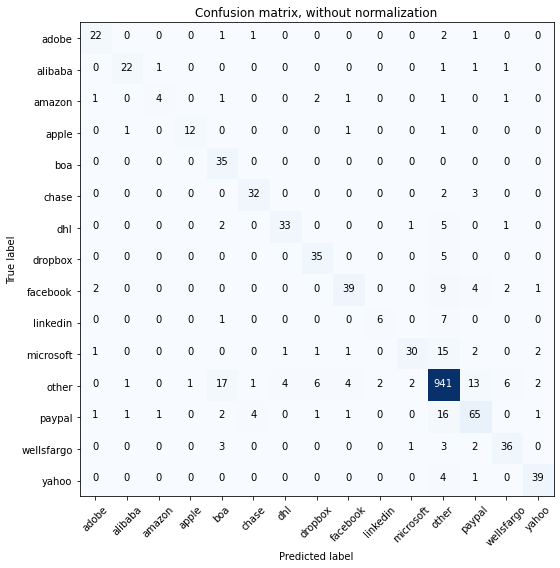

Acc     =  0.878
Pre     =  0.882
Rec     =  0.878
F1      =  0.876

Bal_Acc =  0.757
Bal_Pre =  0.805
Bal_Rec =  0.757
Bal_F1  =  0.78

              precision    recall  f1-score   support

       adobe       0.81      0.81      0.81        27
     alibaba       0.88      0.85      0.86        26
      amazon       0.67      0.36      0.47        11
       apple       0.92      0.80      0.86        15
         boa       0.56      1.00      0.72        35
       chase       0.84      0.86      0.85        37
         dhl       0.87      0.79      0.82        42
     dropbox       0.78      0.88      0.82        40
    facebook       0.83      0.68      0.75        57
    linkedin       0.75      0.43      0.55        14
   microsoft       0.88      0.57      0.69        53
       other       0.93      0.94      0.94      1000
      paypal       0.71      0.70      0.70        93
  wellsfargo       0.77      0.80      0.78        45
       yahoo       0.87      0.89      0.88        4

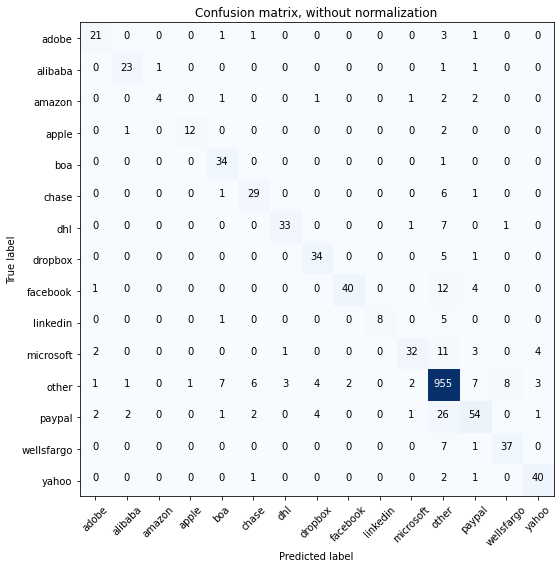

Acc     =  0.881
Pre     =  0.881
Rec     =  0.881
F1      =  0.877

Bal_Acc =  0.757
Bal_Pre =  0.84
Bal_Rec =  0.757
Bal_F1  =  0.796

              precision    recall  f1-score   support

       adobe       0.78      0.78      0.78        27
     alibaba       0.85      0.88      0.87        26
      amazon       0.80      0.36      0.50        11
       apple       0.92      0.80      0.86        15
         boa       0.74      0.97      0.84        35
       chase       0.74      0.78      0.76        37
         dhl       0.89      0.79      0.84        42
     dropbox       0.79      0.85      0.82        40
    facebook       0.95      0.70      0.81        57
    linkedin       1.00      0.57      0.73        14
   microsoft       0.86      0.60      0.71        53
       other       0.91      0.95      0.93      1000
      paypal       0.71      0.58      0.64        93
  wellsfargo       0.80      0.82      0.81        45
       yahoo       0.83      0.91      0.87        4

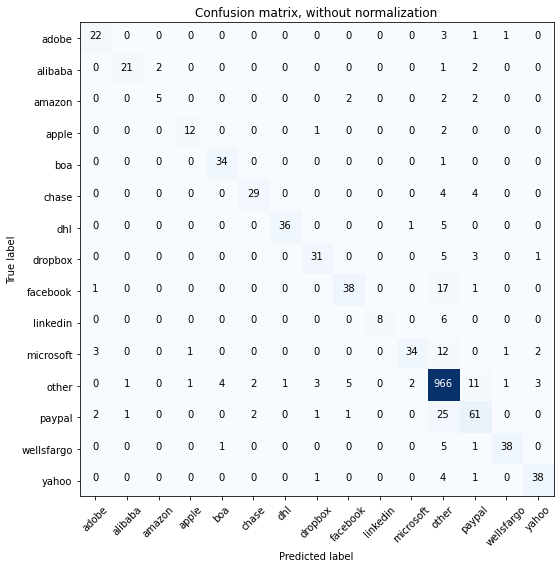

Acc     =  0.892
Pre     =  0.891
Rec     =  0.892
F1      =  0.889

Bal_Acc =  0.765
Bal_Pre =  0.865
Bal_Rec =  0.765
Bal_F1  =  0.812

              precision    recall  f1-score   support

       adobe       0.79      0.81      0.80        27
     alibaba       0.91      0.81      0.86        26
      amazon       0.71      0.45      0.56        11
       apple       0.86      0.80      0.83        15
         boa       0.87      0.97      0.92        35
       chase       0.88      0.78      0.83        37
         dhl       0.97      0.86      0.91        42
     dropbox       0.84      0.78      0.81        40
    facebook       0.83      0.67      0.74        57
    linkedin       1.00      0.57      0.73        14
   microsoft       0.92      0.64      0.76        53
       other       0.91      0.97      0.94      1000
      paypal       0.70      0.66      0.68        93
  wellsfargo       0.93      0.84      0.88        45
       yahoo       0.86      0.86      0.86        

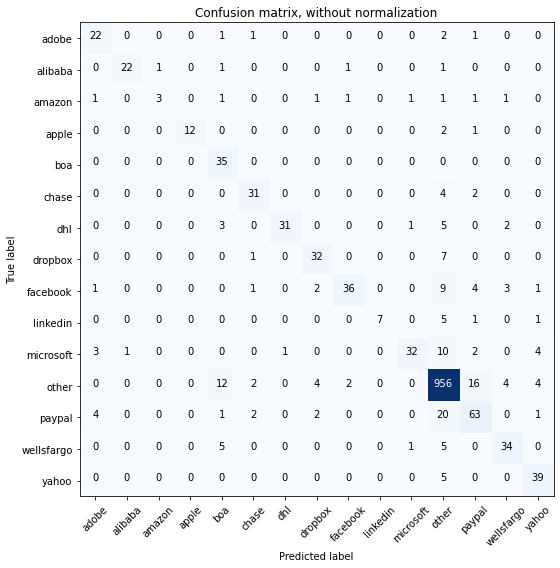

Acc     =  0.88
Pre     =  0.886
Rec     =  0.88
F1      =  0.878

Bal_Acc =  0.741
Bal_Pre =  0.837
Bal_Rec =  0.741
Bal_F1  =  0.786

              precision    recall  f1-score   support

       adobe       0.71      0.81      0.76        27
     alibaba       0.96      0.85      0.90        26
      amazon       0.75      0.27      0.40        11
       apple       1.00      0.80      0.89        15
         boa       0.59      1.00      0.74        35
       chase       0.82      0.84      0.83        37
         dhl       0.97      0.74      0.84        42
     dropbox       0.78      0.80      0.79        40
    facebook       0.90      0.63      0.74        57
    linkedin       1.00      0.50      0.67        14
   microsoft       0.91      0.60      0.73        53
       other       0.93      0.96      0.94      1000
      paypal       0.69      0.68      0.68        93
  wellsfargo       0.77      0.76      0.76        45
       yahoo       0.78      0.89      0.83        44

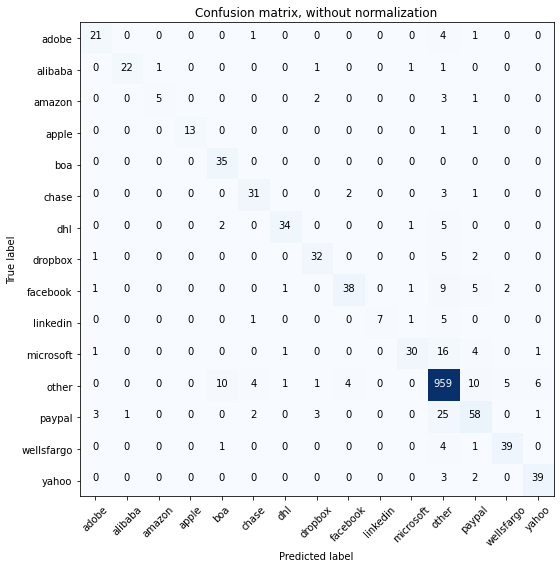

Acc     =  0.886
Pre     =  0.886
Rec     =  0.886
F1      =  0.882

Bal_Acc =  0.764
Bal_Pre =  0.857
Bal_Rec =  0.764
Bal_F1  =  0.808

              precision    recall  f1-score   support

       adobe       0.78      0.78      0.78        27
     alibaba       0.96      0.85      0.90        26
      amazon       0.83      0.45      0.59        11
       apple       1.00      0.87      0.93        15
         boa       0.73      1.00      0.84        35
       chase       0.79      0.84      0.82        37
         dhl       0.92      0.81      0.86        42
     dropbox       0.82      0.80      0.81        40
    facebook       0.86      0.67      0.75        57
    linkedin       1.00      0.50      0.67        14
   microsoft       0.88      0.57      0.69        53
       other       0.92      0.96      0.94      1000
      paypal       0.67      0.62      0.65        93
  wellsfargo       0.85      0.87      0.86        45
       yahoo       0.83      0.89      0.86        

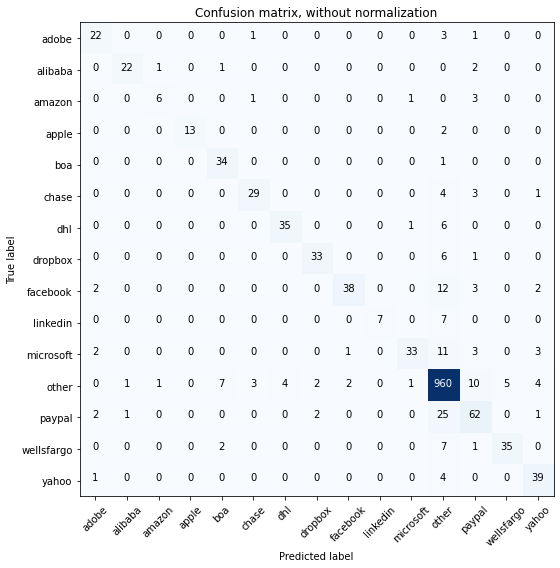

Acc     =  0.889
Pre     =  0.89
Rec     =  0.889
F1      =  0.886

Bal_Acc =  0.771
Bal_Pre =  0.863
Bal_Rec =  0.771
Bal_F1  =  0.814

              precision    recall  f1-score   support

       adobe       0.76      0.81      0.79        27
     alibaba       0.92      0.85      0.88        26
      amazon       0.75      0.55      0.63        11
       apple       1.00      0.87      0.93        15
         boa       0.77      0.97      0.86        35
       chase       0.85      0.78      0.82        37
         dhl       0.90      0.83      0.86        42
     dropbox       0.89      0.82      0.86        40
    facebook       0.93      0.67      0.78        57
    linkedin       1.00      0.50      0.67        14
   microsoft       0.92      0.62      0.74        53
       other       0.92      0.96      0.94      1000
      paypal       0.70      0.67      0.68        93
  wellsfargo       0.88      0.78      0.82        45
       yahoo       0.78      0.89      0.83        4

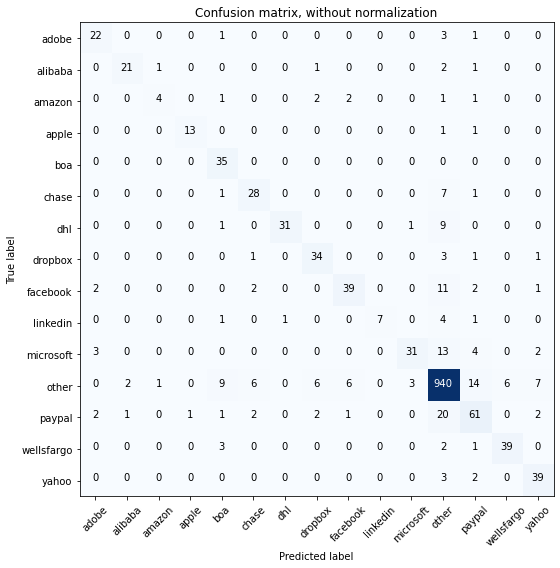

Acc     =  0.873
Pre     =  0.877
Rec     =  0.873
F1      =  0.871

Bal_Acc =  0.754
Bal_Pre =  0.816
Bal_Rec =  0.754
Bal_F1  =  0.784

              precision    recall  f1-score   support

       adobe       0.76      0.81      0.79        27
     alibaba       0.88      0.81      0.84        26
      amazon       0.67      0.36      0.47        11
       apple       0.93      0.87      0.90        15
         boa       0.66      1.00      0.80        35
       chase       0.72      0.76      0.74        37
         dhl       0.97      0.74      0.84        42
     dropbox       0.76      0.85      0.80        40
    facebook       0.81      0.68      0.74        57
    linkedin       1.00      0.50      0.67        14
   microsoft       0.89      0.58      0.70        53
       other       0.92      0.94      0.93      1000
      paypal       0.67      0.66      0.66        93
  wellsfargo       0.87      0.87      0.87        45
       yahoo       0.75      0.89      0.81        

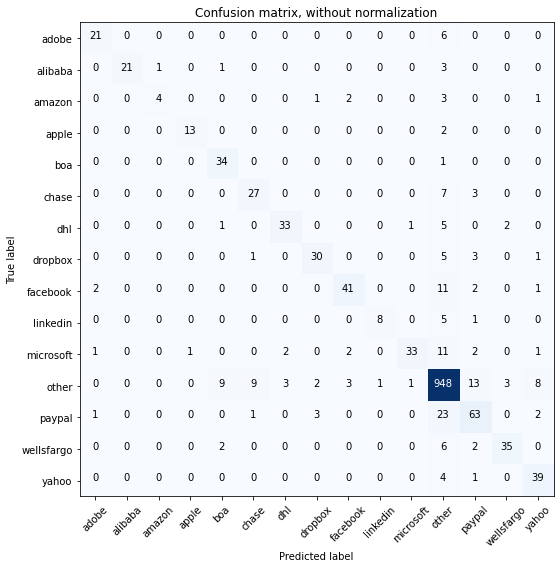

Acc     =  0.877
Pre     =  0.879
Rec     =  0.877
F1      =  0.874

Bal_Acc =  0.75
Bal_Pre =  0.841
Bal_Rec =  0.75
Bal_F1  =  0.793

              precision    recall  f1-score   support

       adobe       0.84      0.78      0.81        27
     alibaba       1.00      0.81      0.89        26
      amazon       0.80      0.36      0.50        11
       apple       0.93      0.87      0.90        15
         boa       0.72      0.97      0.83        35
       chase       0.71      0.73      0.72        37
         dhl       0.87      0.79      0.82        42
     dropbox       0.83      0.75      0.79        40
    facebook       0.85      0.72      0.78        57
    linkedin       0.89      0.57      0.70        14
   microsoft       0.94      0.62      0.75        53
       other       0.91      0.95      0.93      1000
      paypal       0.70      0.68      0.69        93
  wellsfargo       0.88      0.78      0.82        45
       yahoo       0.74      0.89      0.80        44

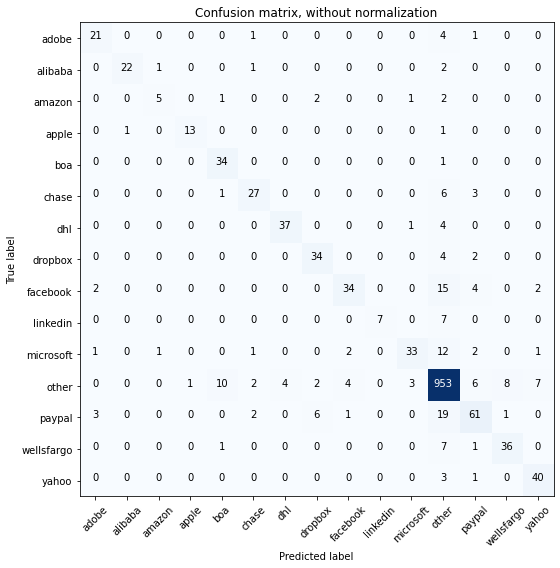

Acc     =  0.882
Pre     =  0.881
Rec     =  0.882
F1      =  0.878

Bal_Acc =  0.761
Bal_Pre =  0.836
Bal_Rec =  0.761
Bal_F1  =  0.797

              precision    recall  f1-score   support

       adobe       0.78      0.78      0.78        27
     alibaba       0.96      0.85      0.90        26
      amazon       0.71      0.45      0.56        11
       apple       0.93      0.87      0.90        15
         boa       0.72      0.97      0.83        35
       chase       0.79      0.73      0.76        37
         dhl       0.90      0.88      0.89        42
     dropbox       0.77      0.85      0.81        40
    facebook       0.83      0.60      0.69        57
    linkedin       1.00      0.50      0.67        14
   microsoft       0.87      0.62      0.73        53
       other       0.92      0.95      0.93      1000
      paypal       0.75      0.66      0.70        93
  wellsfargo       0.80      0.80      0.80        45
       yahoo       0.80      0.91      0.85        

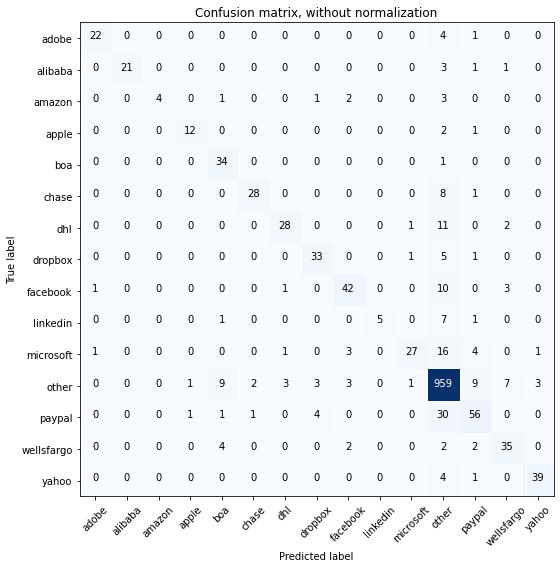

Acc     =  0.874
Pre     =  0.875
Rec     =  0.874
F1      =  0.868

Bal_Acc =  0.722
Bal_Pre =  0.865
Bal_Rec =  0.722
Bal_F1  =  0.787

              precision    recall  f1-score   support

       adobe       0.92      0.81      0.86        27
     alibaba       1.00      0.81      0.89        26
      amazon       1.00      0.36      0.53        11
       apple       0.86      0.80      0.83        15
         boa       0.68      0.97      0.80        35
       chase       0.90      0.76      0.82        37
         dhl       0.85      0.67      0.75        42
     dropbox       0.80      0.82      0.81        40
    facebook       0.81      0.74      0.77        57
    linkedin       1.00      0.36      0.53        14
   microsoft       0.90      0.51      0.65        53
       other       0.90      0.96      0.93      1000
      paypal       0.72      0.60      0.65        93
  wellsfargo       0.73      0.78      0.75        45
       yahoo       0.91      0.89      0.90        

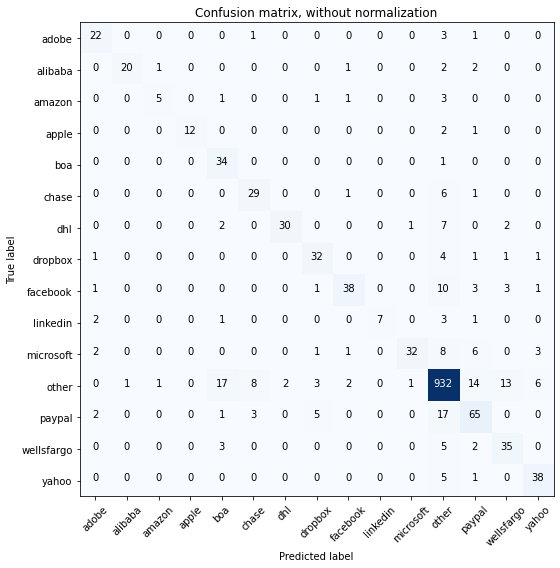

Acc     =  0.865
Pre     =  0.874
Rec     =  0.865
F1      =  0.865

Bal_Acc =  0.743
Bal_Pre =  0.812
Bal_Rec =  0.743
Bal_F1  =  0.776

              precision    recall  f1-score   support

       adobe       0.73      0.81      0.77        27
     alibaba       0.95      0.77      0.85        26
      amazon       0.71      0.45      0.56        11
       apple       1.00      0.80      0.89        15
         boa       0.58      0.97      0.72        35
       chase       0.71      0.78      0.74        37
         dhl       0.94      0.71      0.81        42
     dropbox       0.74      0.80      0.77        40
    facebook       0.86      0.67      0.75        57
    linkedin       1.00      0.50      0.67        14
   microsoft       0.94      0.60      0.74        53
       other       0.92      0.93      0.93      1000
      paypal       0.66      0.70      0.68        93
  wellsfargo       0.65      0.78      0.71        45
       yahoo       0.78      0.86      0.82        

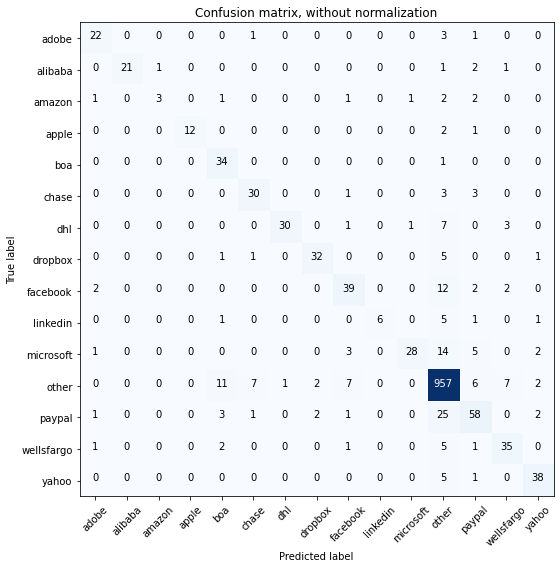

Acc     =  0.874
Pre     =  0.877
Rec     =  0.874
F1      =  0.87

Bal_Acc =  0.724
Bal_Pre =  0.84
Bal_Rec =  0.724
Bal_F1  =  0.778

              precision    recall  f1-score   support

       adobe       0.79      0.81      0.80        27
     alibaba       1.00      0.81      0.89        26
      amazon       0.75      0.27      0.40        11
       apple       1.00      0.80      0.89        15
         boa       0.64      0.97      0.77        35
       chase       0.75      0.81      0.78        37
         dhl       0.97      0.71      0.82        42
     dropbox       0.89      0.80      0.84        40
    facebook       0.72      0.68      0.70        57
    linkedin       1.00      0.43      0.60        14
   microsoft       0.93      0.53      0.67        53
       other       0.91      0.96      0.94      1000
      paypal       0.70      0.62      0.66        93
  wellsfargo       0.73      0.78      0.75        45
       yahoo       0.83      0.86      0.84        44

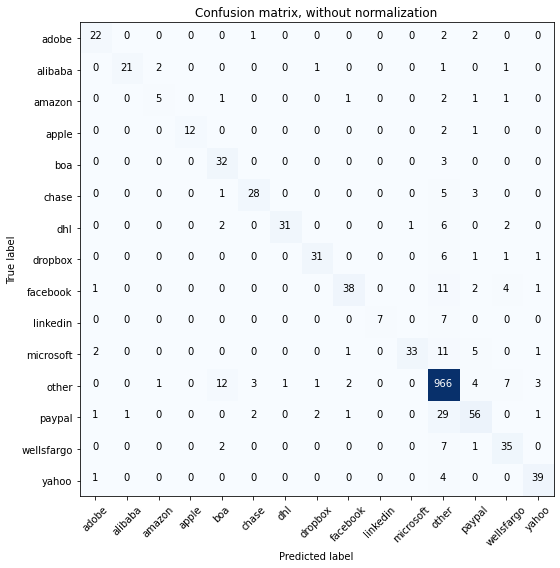

Acc     =  0.881
Pre     =  0.884
Rec     =  0.881
F1      =  0.877

Bal_Acc =  0.739
Bal_Pre =  0.85
Bal_Rec =  0.739
Bal_F1  =  0.791

              precision    recall  f1-score   support

       adobe       0.81      0.81      0.81        27
     alibaba       0.95      0.81      0.88        26
      amazon       0.62      0.45      0.53        11
       apple       1.00      0.80      0.89        15
         boa       0.64      0.91      0.75        35
       chase       0.82      0.76      0.79        37
         dhl       0.97      0.74      0.84        42
     dropbox       0.89      0.78      0.83        40
    facebook       0.88      0.67      0.76        57
    linkedin       1.00      0.50      0.67        14
   microsoft       0.97      0.62      0.76        53
       other       0.91      0.97      0.94      1000
      paypal       0.74      0.60      0.66        93
  wellsfargo       0.69      0.78      0.73        45
       yahoo       0.85      0.89      0.87        4

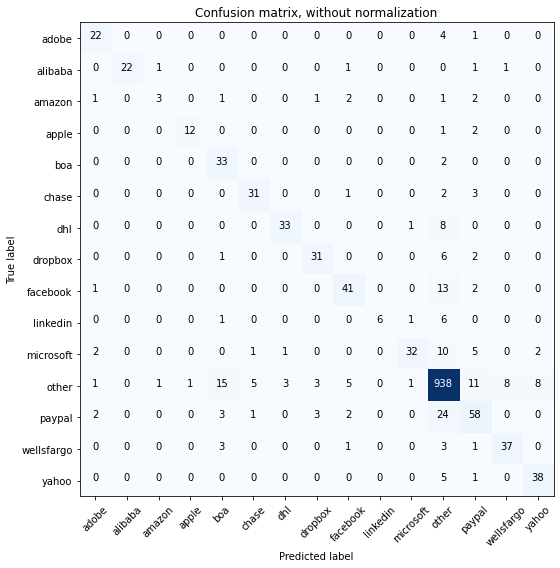

Acc     =  0.869
Pre     =  0.872
Rec     =  0.869
F1      =  0.867

Bal_Acc =  0.738
Bal_Pre =  0.816
Bal_Rec =  0.738
Bal_F1  =  0.775

              precision    recall  f1-score   support

       adobe       0.76      0.81      0.79        27
     alibaba       1.00      0.85      0.92        26
      amazon       0.60      0.27      0.37        11
       apple       0.92      0.80      0.86        15
         boa       0.58      0.94      0.72        35
       chase       0.82      0.84      0.83        37
         dhl       0.89      0.79      0.84        42
     dropbox       0.82      0.78      0.79        40
    facebook       0.77      0.72      0.75        57
    linkedin       1.00      0.43      0.60        14
   microsoft       0.91      0.60      0.73        53
       other       0.92      0.94      0.93      1000
      paypal       0.65      0.62      0.64        93
  wellsfargo       0.80      0.82      0.81        45
       yahoo       0.79      0.86      0.83        

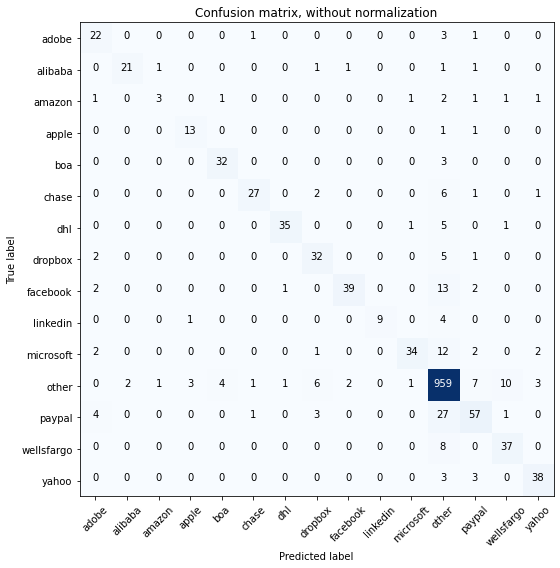

Acc     =  0.882
Pre     =  0.882
Rec     =  0.882
F1      =  0.879

Bal_Acc =  0.751
Bal_Pre =  0.83
Bal_Rec =  0.751
Bal_F1  =  0.789

              precision    recall  f1-score   support

       adobe       0.67      0.81      0.73        27
     alibaba       0.91      0.81      0.86        26
      amazon       0.60      0.27      0.37        11
       apple       0.76      0.87      0.81        15
         boa       0.86      0.91      0.89        35
       chase       0.90      0.73      0.81        37
         dhl       0.95      0.83      0.89        42
     dropbox       0.71      0.80      0.75        40
    facebook       0.93      0.68      0.79        57
    linkedin       1.00      0.64      0.78        14
   microsoft       0.92      0.64      0.76        53
       other       0.91      0.96      0.93      1000
      paypal       0.74      0.61      0.67        93
  wellsfargo       0.74      0.82      0.78        45
       yahoo       0.84      0.86      0.85        4

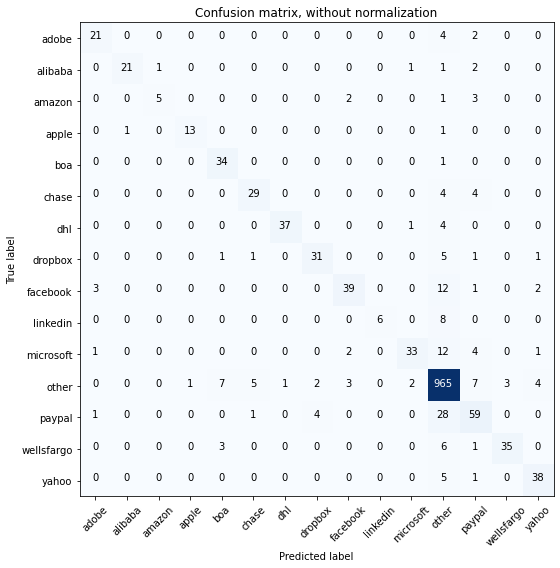

Acc     =  0.888
Pre     =  0.887
Rec     =  0.888
F1      =  0.884

Bal_Acc =  0.753
Bal_Pre =  0.866
Bal_Rec =  0.753
Bal_F1  =  0.806

              precision    recall  f1-score   support

       adobe       0.81      0.78      0.79        27
     alibaba       0.95      0.81      0.88        26
      amazon       0.83      0.45      0.59        11
       apple       0.93      0.87      0.90        15
         boa       0.76      0.97      0.85        35
       chase       0.81      0.78      0.79        37
         dhl       0.97      0.88      0.93        42
     dropbox       0.84      0.78      0.81        40
    facebook       0.85      0.68      0.76        57
    linkedin       1.00      0.43      0.60        14
   microsoft       0.89      0.62      0.73        53
       other       0.91      0.96      0.94      1000
      paypal       0.69      0.63      0.66        93
  wellsfargo       0.92      0.78      0.84        45
       yahoo       0.83      0.86      0.84        

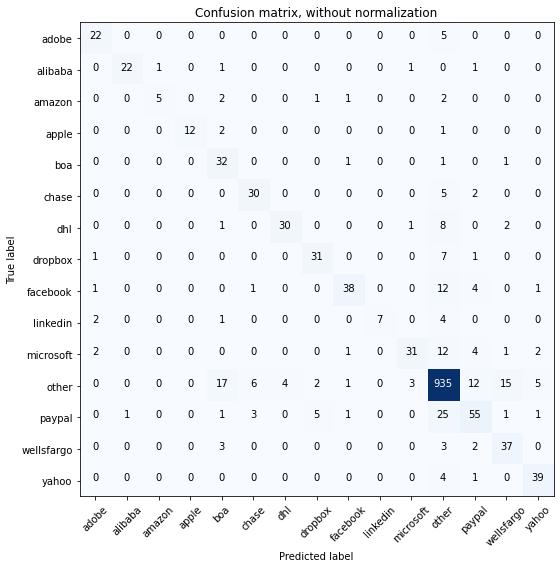

Acc     =  0.862
Pre     =  0.868
Rec     =  0.862
F1      =  0.86

Bal_Acc =  0.741
Bal_Pre =  0.822
Bal_Rec =  0.741
Bal_F1  =  0.779

              precision    recall  f1-score   support

       adobe       0.79      0.81      0.80        27
     alibaba       0.96      0.85      0.90        26
      amazon       0.83      0.45      0.59        11
       apple       1.00      0.80      0.89        15
         boa       0.53      0.91      0.67        35
       chase       0.75      0.81      0.78        37
         dhl       0.88      0.71      0.79        42
     dropbox       0.79      0.78      0.78        40
    facebook       0.88      0.67      0.76        57
    linkedin       1.00      0.50      0.67        14
   microsoft       0.86      0.58      0.70        53
       other       0.91      0.94      0.92      1000
      paypal       0.67      0.59      0.63        93
  wellsfargo       0.65      0.82      0.73        45
       yahoo       0.81      0.89      0.85        4

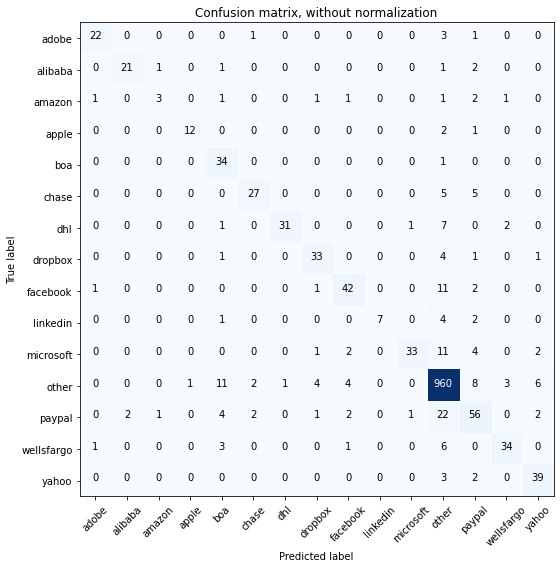

Acc     =  0.88
Pre     =  0.883
Rec     =  0.88
F1      =  0.877

Bal_Acc =  0.735
Bal_Pre =  0.832
Bal_Rec =  0.735
Bal_F1  =  0.78

              precision    recall  f1-score   support

       adobe       0.88      0.81      0.85        27
     alibaba       0.91      0.81      0.86        26
      amazon       0.60      0.27      0.37        11
       apple       0.92      0.80      0.86        15
         boa       0.60      0.97      0.74        35
       chase       0.84      0.73      0.78        37
         dhl       0.97      0.74      0.84        42
     dropbox       0.80      0.82      0.81        40
    facebook       0.81      0.74      0.77        57
    linkedin       1.00      0.50      0.67        14
   microsoft       0.94      0.62      0.75        53
       other       0.92      0.96      0.94      1000
      paypal       0.65      0.60      0.63        93
  wellsfargo       0.85      0.76      0.80        45
       yahoo       0.78      0.89      0.83        44


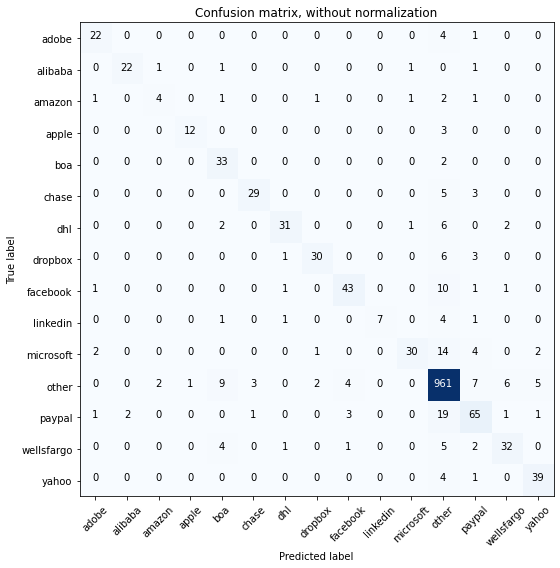

Acc     =  0.884
Pre     =  0.885
Rec     =  0.884
F1      =  0.88

Bal_Acc =  0.741
Bal_Pre =  0.834
Bal_Rec =  0.741
Bal_F1  =  0.785

              precision    recall  f1-score   support

       adobe       0.81      0.81      0.81        27
     alibaba       0.92      0.85      0.88        26
      amazon       0.57      0.36      0.44        11
       apple       0.92      0.80      0.86        15
         boa       0.65      0.94      0.77        35
       chase       0.88      0.78      0.83        37
         dhl       0.89      0.74      0.81        42
     dropbox       0.88      0.75      0.81        40
    facebook       0.84      0.75      0.80        57
    linkedin       1.00      0.50      0.67        14
   microsoft       0.91      0.57      0.70        53
       other       0.92      0.96      0.94      1000
      paypal       0.72      0.70      0.71        93
  wellsfargo       0.76      0.71      0.74        45
       yahoo       0.83      0.89      0.86        4

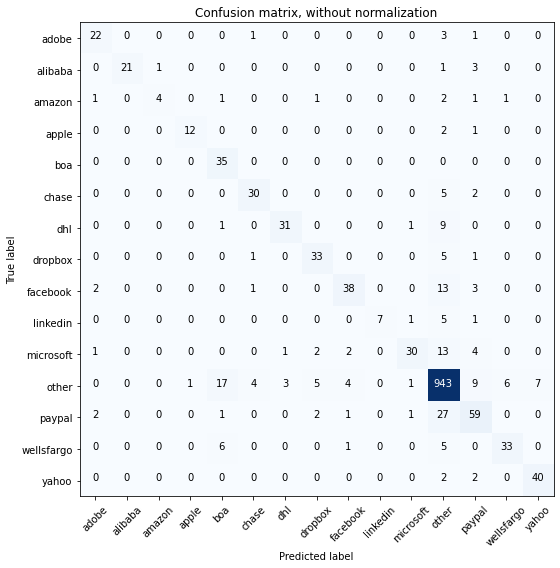

Acc     =  0.869
Pre     =  0.874
Rec     =  0.869
F1      =  0.867

Bal_Acc =  0.741
Bal_Pre =  0.835
Bal_Rec =  0.741
Bal_F1  =  0.785

              precision    recall  f1-score   support

       adobe       0.79      0.81      0.80        27
     alibaba       1.00      0.81      0.89        26
      amazon       0.80      0.36      0.50        11
       apple       0.92      0.80      0.86        15
         boa       0.57      1.00      0.73        35
       chase       0.81      0.81      0.81        37
         dhl       0.89      0.74      0.81        42
     dropbox       0.77      0.82      0.80        40
    facebook       0.83      0.67      0.74        57
    linkedin       1.00      0.50      0.67        14
   microsoft       0.88      0.57      0.69        53
       other       0.91      0.94      0.93      1000
      paypal       0.68      0.63      0.66        93
  wellsfargo       0.82      0.73      0.78        45
       yahoo       0.85      0.91      0.88        

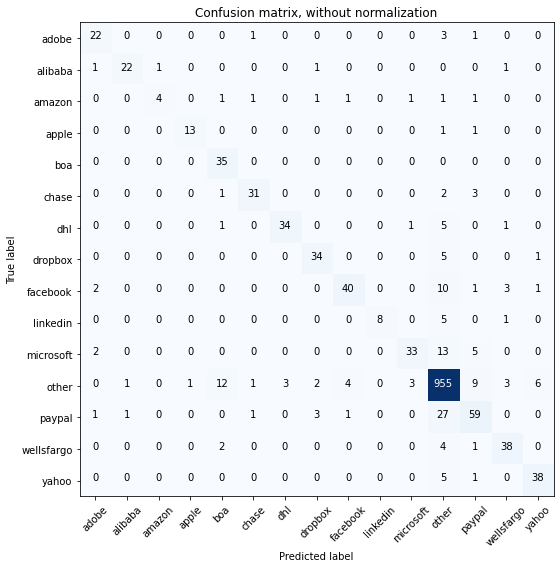

Acc     =  0.888
Pre     =  0.888
Rec     =  0.888
F1      =  0.884

Bal_Acc =  0.772
Bal_Pre =  0.85
Bal_Rec =  0.772
Bal_F1  =  0.809

              precision    recall  f1-score   support

       adobe       0.79      0.81      0.80        27
     alibaba       0.92      0.85      0.88        26
      amazon       0.80      0.36      0.50        11
       apple       0.93      0.87      0.90        15
         boa       0.67      1.00      0.80        35
       chase       0.89      0.84      0.86        37
         dhl       0.92      0.81      0.86        42
     dropbox       0.83      0.85      0.84        40
    facebook       0.87      0.70      0.78        57
    linkedin       1.00      0.57      0.73        14
   microsoft       0.87      0.62      0.73        53
       other       0.92      0.95      0.94      1000
      paypal       0.72      0.63      0.67        93
  wellsfargo       0.81      0.84      0.83        45
       yahoo       0.83      0.86      0.84        4

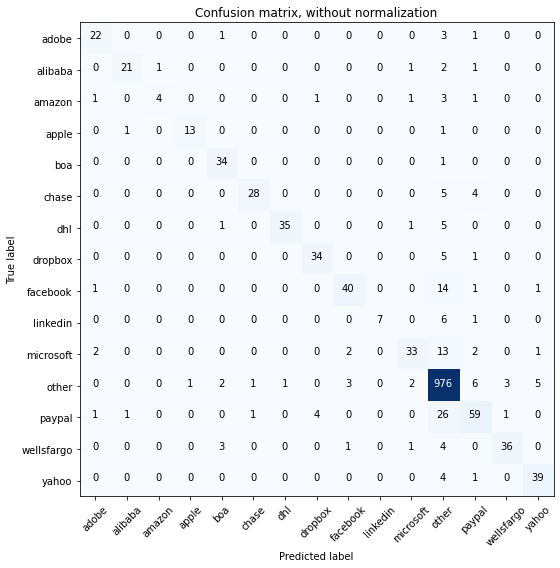

Acc     =  0.897
Pre     =  0.895
Rec     =  0.897
F1      =  0.893

Bal_Acc =  0.759
Bal_Pre =  0.88
Bal_Rec =  0.759
Bal_F1  =  0.815

              precision    recall  f1-score   support

       adobe       0.81      0.81      0.81        27
     alibaba       0.91      0.81      0.86        26
      amazon       0.80      0.36      0.50        11
       apple       0.93      0.87      0.90        15
         boa       0.83      0.97      0.89        35
       chase       0.93      0.76      0.84        37
         dhl       0.97      0.83      0.90        42
     dropbox       0.87      0.85      0.86        40
    facebook       0.87      0.70      0.78        57
    linkedin       1.00      0.50      0.67        14
   microsoft       0.85      0.62      0.72        53
       other       0.91      0.98      0.94      1000
      paypal       0.76      0.63      0.69        93
  wellsfargo       0.90      0.80      0.85        45
       yahoo       0.85      0.89      0.87        4

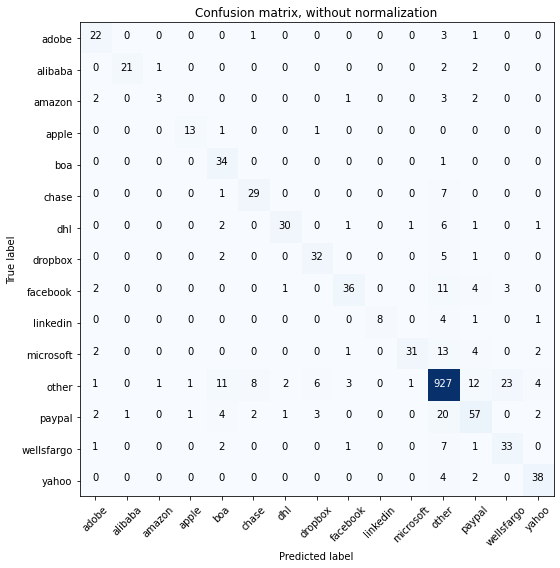

Acc     =  0.854
Pre     =  0.861
Rec     =  0.854
F1      =  0.853

Bal_Acc =  0.73
Bal_Pre =  0.784
Bal_Rec =  0.73
Bal_F1  =  0.756

              precision    recall  f1-score   support

       adobe       0.69      0.81      0.75        27
     alibaba       0.95      0.81      0.88        26
      amazon       0.60      0.27      0.37        11
       apple       0.87      0.87      0.87        15
         boa       0.60      0.97      0.74        35
       chase       0.72      0.78      0.75        37
         dhl       0.88      0.71      0.79        42
     dropbox       0.76      0.80      0.78        40
    facebook       0.84      0.63      0.72        57
    linkedin       1.00      0.57      0.73        14
   microsoft       0.94      0.58      0.72        53
       other       0.92      0.93      0.92      1000
      paypal       0.65      0.61      0.63        93
  wellsfargo       0.56      0.73      0.63        45
       yahoo       0.79      0.86      0.83        44

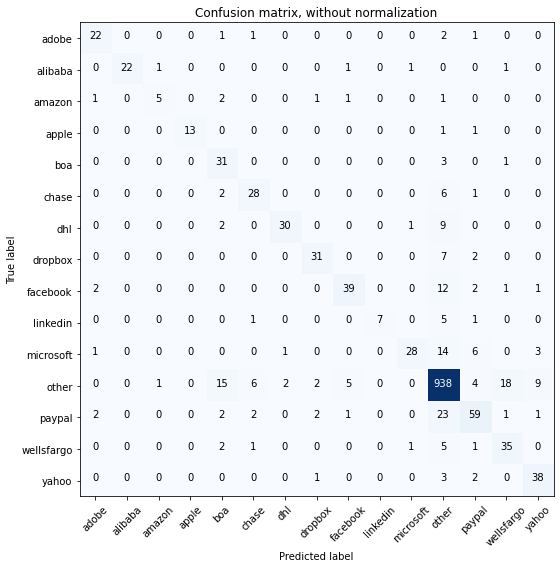

Acc     =  0.862
Pre     =  0.868
Rec     =  0.862
F1      =  0.86

Bal_Acc =  0.736
Bal_Pre =  0.816
Bal_Rec =  0.736
Bal_F1  =  0.774

              precision    recall  f1-score   support

       adobe       0.79      0.81      0.80        27
     alibaba       1.00      0.85      0.92        26
      amazon       0.71      0.45      0.56        11
       apple       1.00      0.87      0.93        15
         boa       0.54      0.89      0.67        35
       chase       0.72      0.76      0.74        37
         dhl       0.91      0.71      0.80        42
     dropbox       0.84      0.78      0.81        40
    facebook       0.83      0.68      0.75        57
    linkedin       1.00      0.50      0.67        14
   microsoft       0.90      0.53      0.67        53
       other       0.91      0.94      0.92      1000
      paypal       0.74      0.63      0.68        93
  wellsfargo       0.61      0.78      0.69        45
       yahoo       0.73      0.86      0.79        4

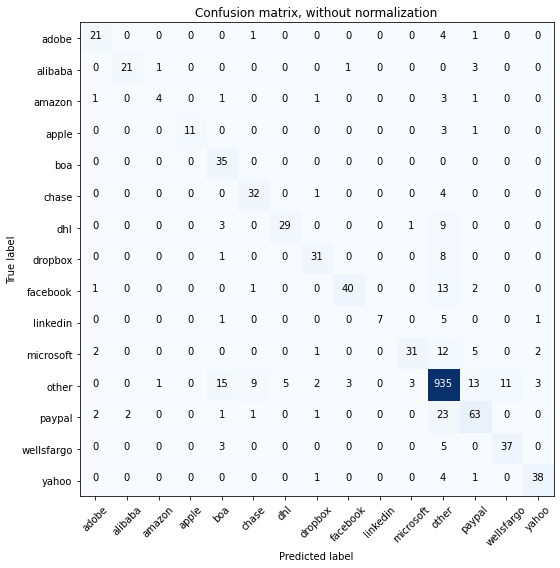

Acc     =  0.867
Pre     =  0.873
Rec     =  0.867
F1      =  0.865

Bal_Acc =  0.74
Bal_Pre =  0.825
Bal_Rec =  0.74
Bal_F1  =  0.78

              precision    recall  f1-score   support

       adobe       0.78      0.78      0.78        27
     alibaba       0.91      0.81      0.86        26
      amazon       0.67      0.36      0.47        11
       apple       1.00      0.73      0.85        15
         boa       0.58      1.00      0.74        35
       chase       0.73      0.86      0.79        37
         dhl       0.85      0.69      0.76        42
     dropbox       0.82      0.78      0.79        40
    facebook       0.91      0.70      0.79        57
    linkedin       1.00      0.50      0.67        14
   microsoft       0.89      0.58      0.70        53
       other       0.91      0.94      0.92      1000
      paypal       0.70      0.68      0.69        93
  wellsfargo       0.77      0.82      0.80        45
       yahoo       0.86      0.86      0.86        44


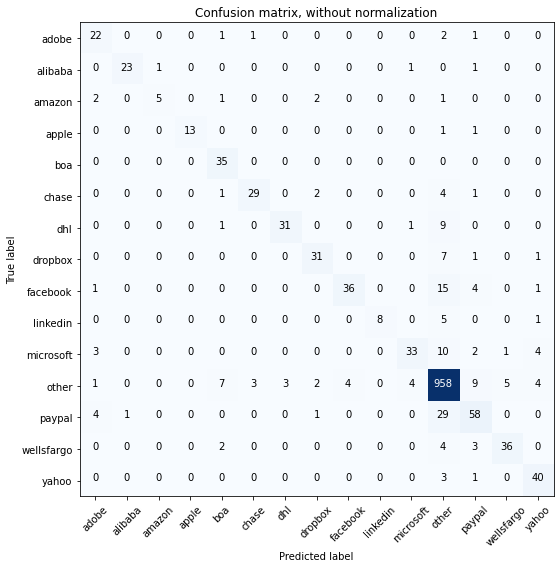

Acc     =  0.882
Pre     =  0.883
Rec     =  0.882
F1      =  0.879

Bal_Acc =  0.762
Bal_Pre =  0.854
Bal_Rec =  0.762
Bal_F1  =  0.805

              precision    recall  f1-score   support

       adobe       0.67      0.81      0.73        27
     alibaba       0.96      0.88      0.92        26
      amazon       0.83      0.45      0.59        11
       apple       1.00      0.87      0.93        15
         boa       0.73      1.00      0.84        35
       chase       0.88      0.78      0.83        37
         dhl       0.91      0.74      0.82        42
     dropbox       0.82      0.78      0.79        40
    facebook       0.90      0.63      0.74        57
    linkedin       1.00      0.57      0.73        14
   microsoft       0.85      0.62      0.72        53
       other       0.91      0.96      0.94      1000
      paypal       0.71      0.62      0.66        93
  wellsfargo       0.86      0.80      0.83        45
       yahoo       0.78      0.91      0.84        

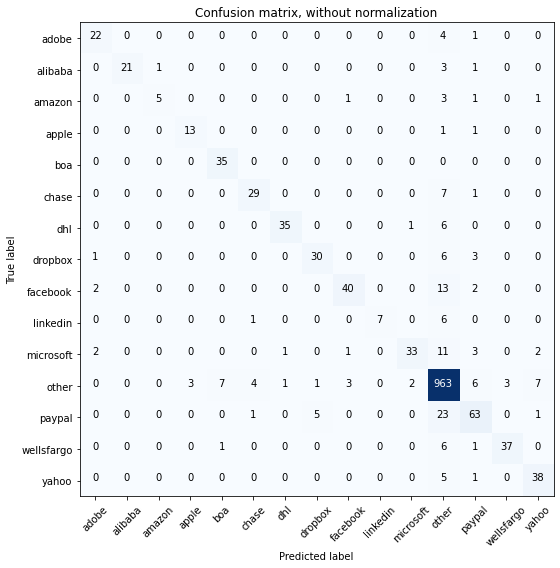

Acc     =  0.891
Pre     =  0.891
Rec     =  0.891
F1      =  0.887

Bal_Acc =  0.764
Bal_Pre =  0.87
Bal_Rec =  0.764
Bal_F1  =  0.814

              precision    recall  f1-score   support

       adobe       0.81      0.81      0.81        27
     alibaba       1.00      0.81      0.89        26
      amazon       0.83      0.45      0.59        11
       apple       0.81      0.87      0.84        15
         boa       0.81      1.00      0.90        35
       chase       0.83      0.78      0.81        37
         dhl       0.95      0.83      0.89        42
     dropbox       0.83      0.75      0.79        40
    facebook       0.89      0.70      0.78        57
    linkedin       1.00      0.50      0.67        14
   microsoft       0.92      0.62      0.74        53
       other       0.91      0.96      0.94      1000
      paypal       0.75      0.68      0.71        93
  wellsfargo       0.93      0.82      0.87        45
       yahoo       0.78      0.86      0.82        4

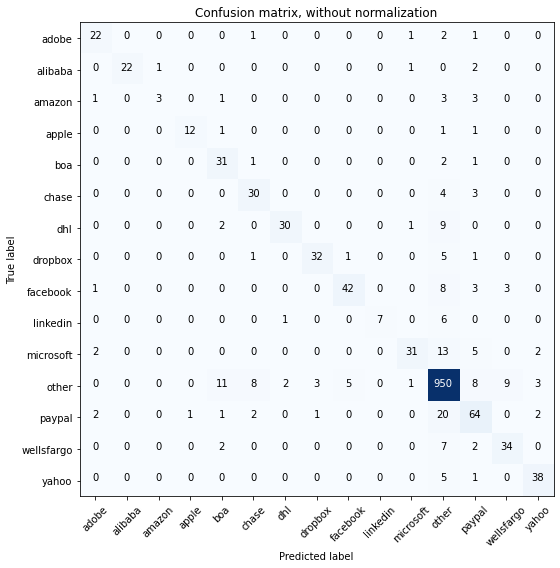

Acc     =  0.876
Pre     =  0.879
Rec     =  0.876
F1      =  0.873

Bal_Acc =  0.735
Bal_Pre =  0.835
Bal_Rec =  0.735
Bal_F1  =  0.782

              precision    recall  f1-score   support

       adobe       0.79      0.81      0.80        27
     alibaba       1.00      0.85      0.92        26
      amazon       0.75      0.27      0.40        11
       apple       0.92      0.80      0.86        15
         boa       0.63      0.89      0.74        35
       chase       0.70      0.81      0.75        37
         dhl       0.91      0.71      0.80        42
     dropbox       0.89      0.80      0.84        40
    facebook       0.88      0.74      0.80        57
    linkedin       1.00      0.50      0.67        14
   microsoft       0.89      0.58      0.70        53
       other       0.92      0.95      0.93      1000
      paypal       0.67      0.69      0.68        93
  wellsfargo       0.74      0.76      0.75        45
       yahoo       0.84      0.86      0.85        

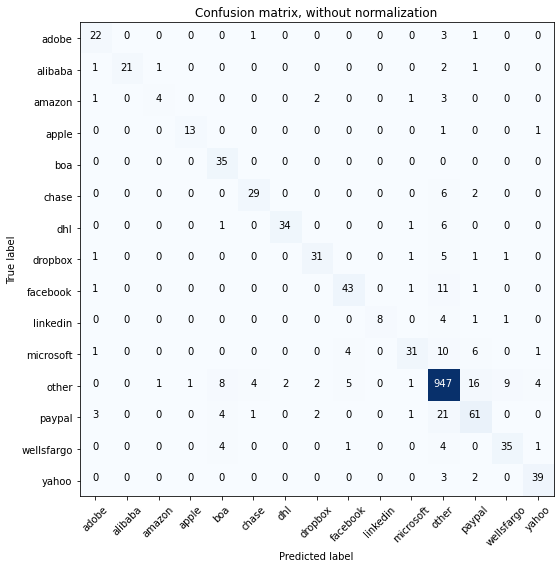

Acc     =  0.879
Pre     =  0.881
Rec     =  0.879
F1      =  0.877

Bal_Acc =  0.76
Bal_Pre =  0.83
Bal_Rec =  0.76
Bal_F1  =  0.793

              precision    recall  f1-score   support

       adobe       0.73      0.81      0.77        27
     alibaba       1.00      0.81      0.89        26
      amazon       0.67      0.36      0.47        11
       apple       0.93      0.87      0.90        15
         boa       0.67      1.00      0.80        35
       chase       0.83      0.78      0.81        37
         dhl       0.94      0.81      0.87        42
     dropbox       0.84      0.78      0.81        40
    facebook       0.81      0.75      0.78        57
    linkedin       1.00      0.57      0.73        14
   microsoft       0.84      0.58      0.69        53
       other       0.92      0.95      0.93      1000
      paypal       0.66      0.66      0.66        93
  wellsfargo       0.76      0.78      0.77        45
       yahoo       0.85      0.89      0.87        44


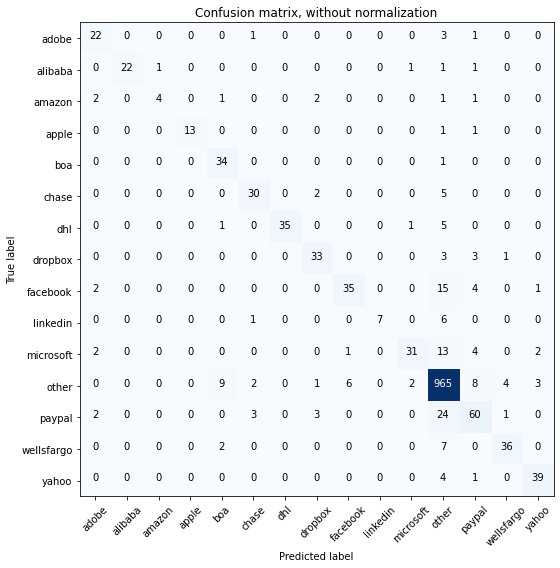

Acc     =  0.888
Pre     =  0.888
Rec     =  0.888
F1      =  0.883

Bal_Acc =  0.755
Bal_Pre =  0.863
Bal_Rec =  0.755
Bal_F1  =  0.805

              precision    recall  f1-score   support

       adobe       0.73      0.81      0.77        27
     alibaba       1.00      0.85      0.92        26
      amazon       0.80      0.36      0.50        11
       apple       1.00      0.87      0.93        15
         boa       0.72      0.97      0.83        35
       chase       0.81      0.81      0.81        37
         dhl       1.00      0.83      0.91        42
     dropbox       0.80      0.82      0.81        40
    facebook       0.83      0.61      0.71        57
    linkedin       1.00      0.50      0.67        14
   microsoft       0.89      0.58      0.70        53
       other       0.92      0.96      0.94      1000
      paypal       0.71      0.65      0.68        93
  wellsfargo       0.86      0.80      0.83        45
       yahoo       0.87      0.89      0.88        

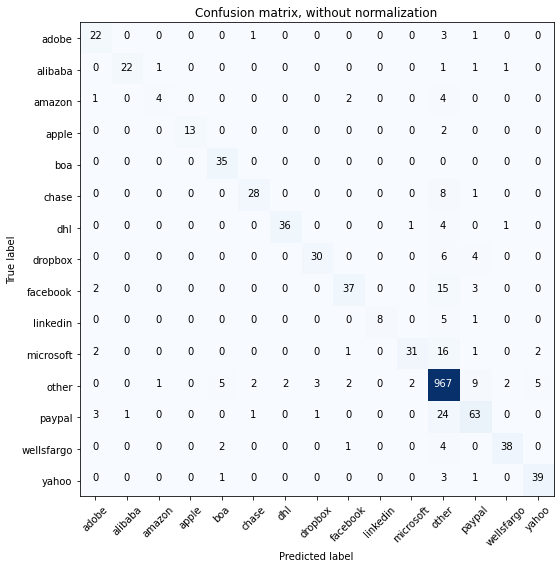

Acc     =  0.892
Pre     =  0.891
Rec     =  0.892
F1      =  0.888

Bal_Acc =  0.762
Bal_Pre =  0.87
Bal_Rec =  0.762
Bal_F1  =  0.812

              precision    recall  f1-score   support

       adobe       0.73      0.81      0.77        27
     alibaba       0.96      0.85      0.90        26
      amazon       0.67      0.36      0.47        11
       apple       1.00      0.87      0.93        15
         boa       0.81      1.00      0.90        35
       chase       0.88      0.76      0.81        37
         dhl       0.95      0.86      0.90        42
     dropbox       0.88      0.75      0.81        40
    facebook       0.86      0.65      0.74        57
    linkedin       1.00      0.57      0.73        14
   microsoft       0.91      0.58      0.71        53
       other       0.91      0.97      0.94      1000
      paypal       0.74      0.68      0.71        93
  wellsfargo       0.90      0.84      0.87        45
       yahoo       0.85      0.89      0.87        4

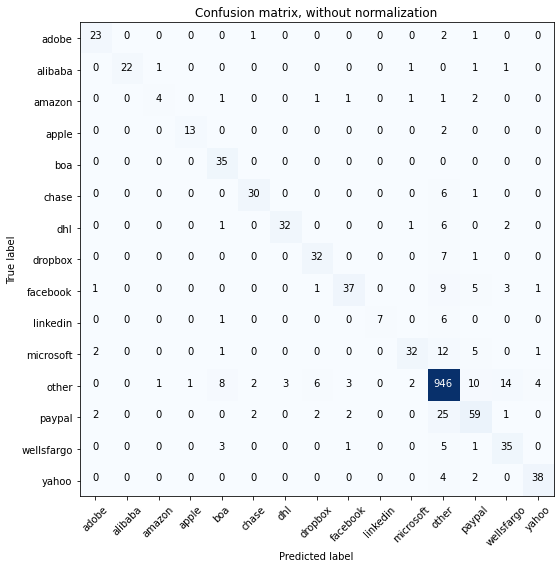

Acc     =  0.874
Pre     =  0.876
Rec     =  0.874
F1      =  0.871

Bal_Acc =  0.752
Bal_Pre =  0.829
Bal_Rec =  0.752
Bal_F1  =  0.789

              precision    recall  f1-score   support

       adobe       0.82      0.85      0.84        27
     alibaba       1.00      0.85      0.92        26
      amazon       0.67      0.36      0.47        11
       apple       0.93      0.87      0.90        15
         boa       0.70      1.00      0.82        35
       chase       0.86      0.81      0.83        37
         dhl       0.91      0.76      0.83        42
     dropbox       0.76      0.80      0.78        40
    facebook       0.84      0.65      0.73        57
    linkedin       1.00      0.50      0.67        14
   microsoft       0.86      0.60      0.71        53
       other       0.92      0.95      0.93      1000
      paypal       0.67      0.63      0.65        93
  wellsfargo       0.62      0.78      0.69        45
       yahoo       0.86      0.86      0.86        

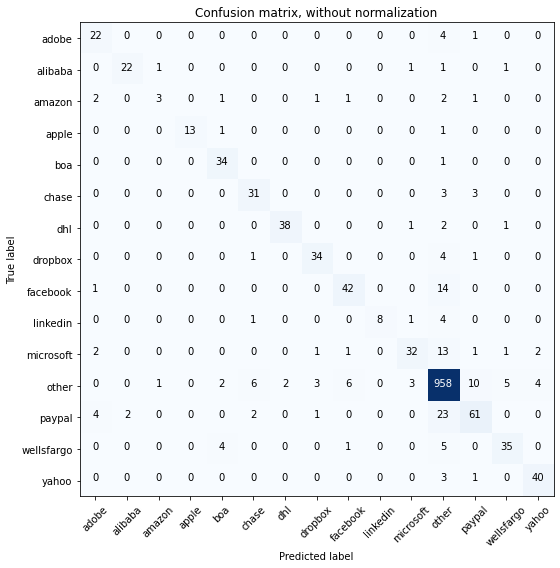

Acc     =  0.892
Pre     =  0.89
Rec     =  0.892
F1      =  0.889

Bal_Acc =  0.772
Bal_Pre =  0.842
Bal_Rec =  0.772
Bal_F1  =  0.805

              precision    recall  f1-score   support

       adobe       0.71      0.81      0.76        27
     alibaba       0.92      0.85      0.88        26
      amazon       0.60      0.27      0.37        11
       apple       1.00      0.87      0.93        15
         boa       0.81      0.97      0.88        35
       chase       0.76      0.84      0.79        37
         dhl       0.95      0.90      0.93        42
     dropbox       0.85      0.85      0.85        40
    facebook       0.82      0.74      0.78        57
    linkedin       1.00      0.57      0.73        14
   microsoft       0.84      0.60      0.70        53
       other       0.92      0.96      0.94      1000
      paypal       0.77      0.66      0.71        93
  wellsfargo       0.81      0.78      0.80        45
       yahoo       0.87      0.91      0.89        4

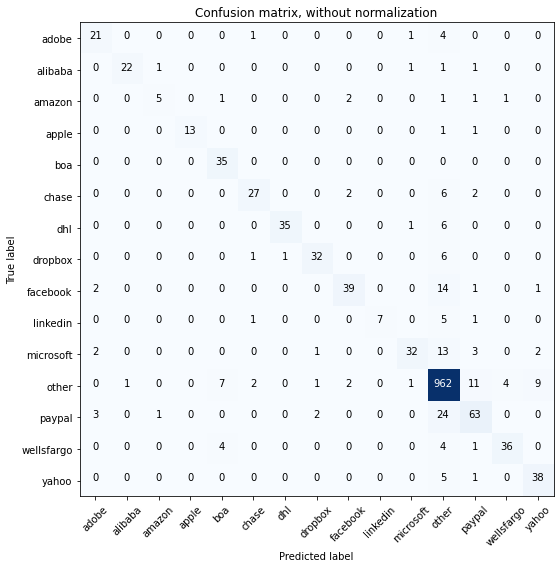

Acc     =  0.888
Pre     =  0.889
Rec     =  0.888
F1      =  0.885

Bal_Acc =  0.76
Bal_Pre =  0.861
Bal_Rec =  0.76
Bal_F1  =  0.807

              precision    recall  f1-score   support

       adobe       0.75      0.78      0.76        27
     alibaba       0.96      0.85      0.90        26
      amazon       0.71      0.45      0.56        11
       apple       1.00      0.87      0.93        15
         boa       0.74      1.00      0.85        35
       chase       0.84      0.73      0.78        37
         dhl       0.97      0.83      0.90        42
     dropbox       0.89      0.80      0.84        40
    facebook       0.87      0.68      0.76        57
    linkedin       1.00      0.50      0.67        14
   microsoft       0.89      0.60      0.72        53
       other       0.91      0.96      0.94      1000
      paypal       0.73      0.68      0.70        93
  wellsfargo       0.88      0.80      0.84        45
       yahoo       0.76      0.86      0.81        44

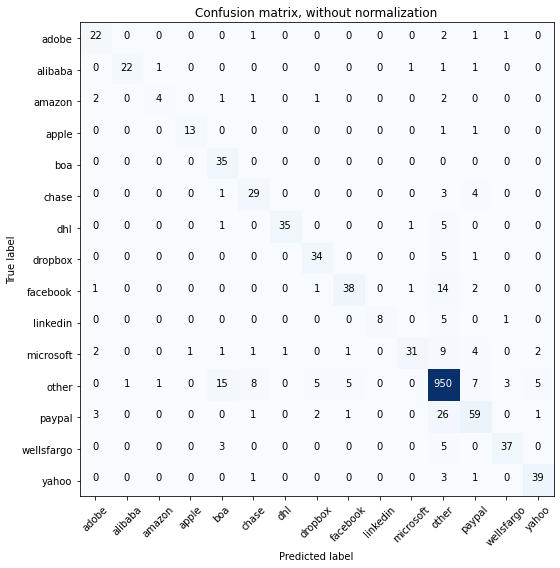

Acc     =  0.881
Pre     =  0.884
Rec     =  0.881
F1      =  0.879

Bal_Acc =  0.765
Bal_Pre =  0.831
Bal_Rec =  0.765
Bal_F1  =  0.797

              precision    recall  f1-score   support

       adobe       0.73      0.81      0.77        27
     alibaba       0.96      0.85      0.90        26
      amazon       0.67      0.36      0.47        11
       apple       0.93      0.87      0.90        15
         boa       0.61      1.00      0.76        35
       chase       0.69      0.78      0.73        37
         dhl       0.97      0.83      0.90        42
     dropbox       0.79      0.85      0.82        40
    facebook       0.84      0.67      0.75        57
    linkedin       1.00      0.57      0.73        14
   microsoft       0.91      0.58      0.71        53
       other       0.92      0.95      0.94      1000
      paypal       0.73      0.63      0.68        93
  wellsfargo       0.88      0.82      0.85        45
       yahoo       0.83      0.89      0.86        

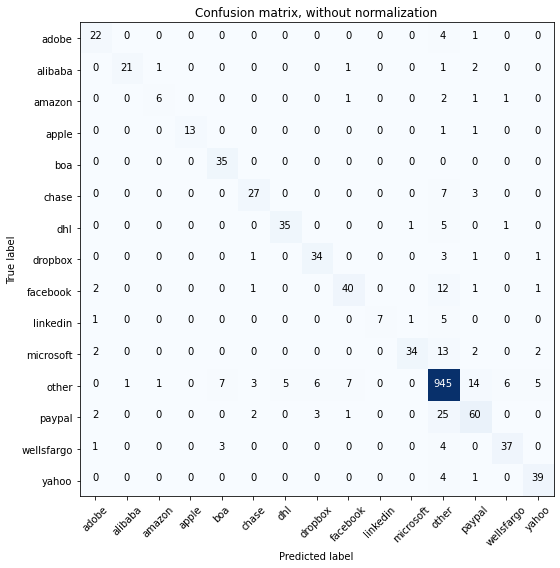

Acc     =  0.88
Pre     =  0.881
Rec     =  0.88
F1      =  0.878

Bal_Acc =  0.773
Bal_Pre =  0.844
Bal_Rec =  0.773
Bal_F1  =  0.807

              precision    recall  f1-score   support

       adobe       0.73      0.81      0.77        27
     alibaba       0.95      0.81      0.88        26
      amazon       0.75      0.55      0.63        11
       apple       1.00      0.87      0.93        15
         boa       0.78      1.00      0.88        35
       chase       0.79      0.73      0.76        37
         dhl       0.88      0.83      0.85        42
     dropbox       0.79      0.85      0.82        40
    facebook       0.80      0.70      0.75        57
    linkedin       1.00      0.50      0.67        14
   microsoft       0.94      0.64      0.76        53
       other       0.92      0.94      0.93      1000
      paypal       0.69      0.65      0.67        93
  wellsfargo       0.82      0.82      0.82        45
       yahoo       0.81      0.89      0.85        44

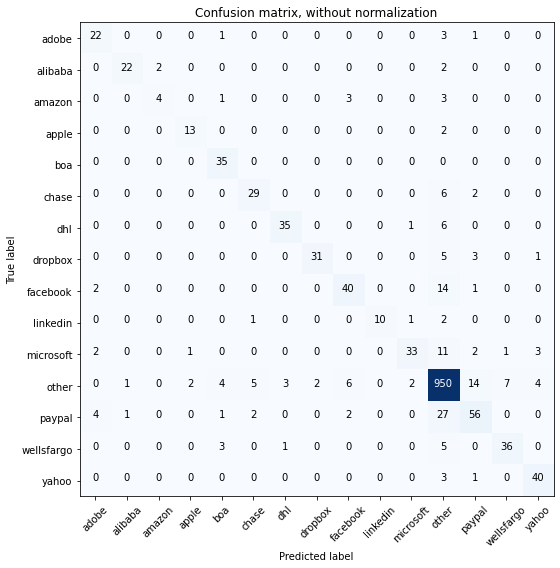

Acc     =  0.881
Pre     =  0.879
Rec     =  0.881
F1      =  0.878

Bal_Acc =  0.772
Bal_Pre =  0.831
Bal_Rec =  0.772
Bal_F1  =  0.8

              precision    recall  f1-score   support

       adobe       0.73      0.81      0.77        27
     alibaba       0.92      0.85      0.88        26
      amazon       0.67      0.36      0.47        11
       apple       0.81      0.87      0.84        15
         boa       0.78      1.00      0.88        35
       chase       0.78      0.78      0.78        37
         dhl       0.90      0.83      0.86        42
     dropbox       0.94      0.78      0.85        40
    facebook       0.78      0.70      0.74        57
    linkedin       1.00      0.71      0.83        14
   microsoft       0.89      0.62      0.73        53
       other       0.91      0.95      0.93      1000
      paypal       0.70      0.60      0.65        93
  wellsfargo       0.82      0.80      0.81        45
       yahoo       0.83      0.91      0.87        44

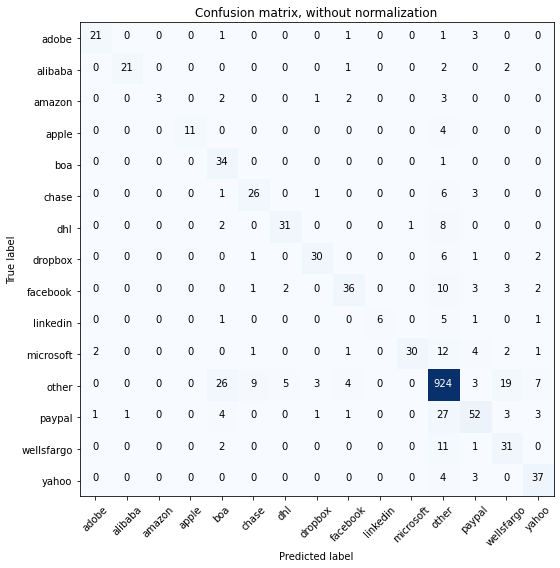

Acc     =  0.84
Pre     =  0.855
Rec     =  0.84
F1      =  0.839

Bal_Acc =  0.693
Bal_Pre =  0.813
Bal_Rec =  0.693
Bal_F1  =  0.748

              precision    recall  f1-score   support

       adobe       0.88      0.78      0.82        27
     alibaba       0.95      0.81      0.88        26
      amazon       1.00      0.27      0.43        11
       apple       1.00      0.73      0.85        15
         boa       0.47      0.97      0.63        35
       chase       0.68      0.70      0.69        37
         dhl       0.82      0.74      0.78        42
     dropbox       0.83      0.75      0.79        40
    facebook       0.78      0.63      0.70        57
    linkedin       1.00      0.43      0.60        14
   microsoft       0.97      0.57      0.71        53
       other       0.90      0.92      0.91      1000
      paypal       0.70      0.56      0.62        93
  wellsfargo       0.52      0.69      0.59        45
       yahoo       0.70      0.84      0.76        44

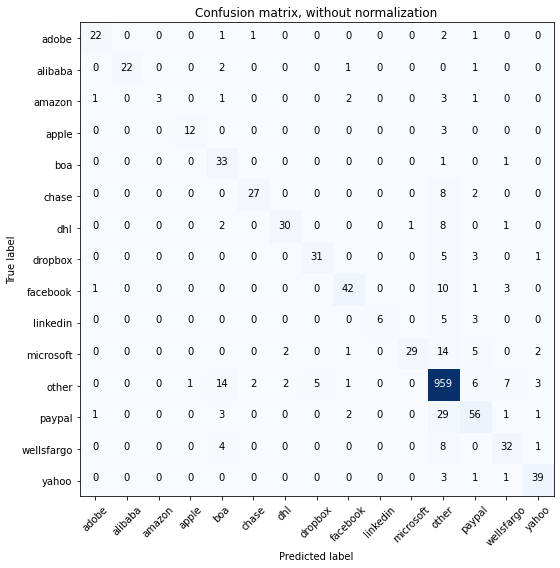

Acc     =  0.873
Pre     =  0.879
Rec     =  0.873
F1      =  0.868

Bal_Acc =  0.718
Bal_Pre =  0.863
Bal_Rec =  0.718
Bal_F1  =  0.784

              precision    recall  f1-score   support

       adobe       0.88      0.81      0.85        27
     alibaba       1.00      0.85      0.92        26
      amazon       1.00      0.27      0.43        11
       apple       0.92      0.80      0.86        15
         boa       0.55      0.94      0.69        35
       chase       0.90      0.73      0.81        37
         dhl       0.88      0.71      0.79        42
     dropbox       0.86      0.78      0.82        40
    facebook       0.86      0.74      0.79        57
    linkedin       1.00      0.43      0.60        14
   microsoft       0.97      0.55      0.70        53
       other       0.91      0.96      0.93      1000
      paypal       0.70      0.60      0.65        93
  wellsfargo       0.70      0.71      0.70        45
       yahoo       0.83      0.89      0.86        

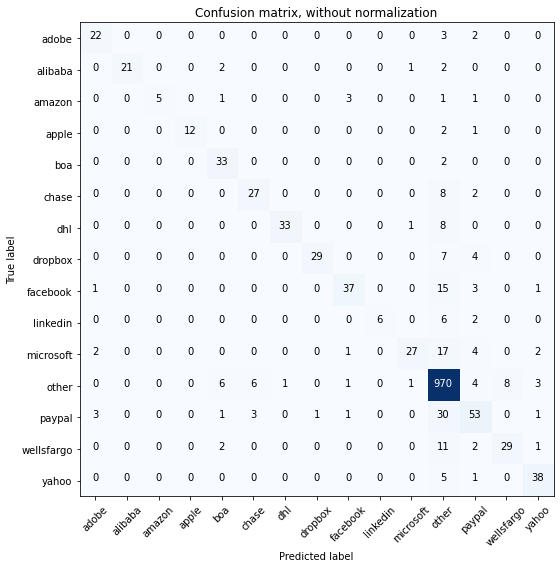

Acc     =  0.872
Pre     =  0.873
Rec     =  0.872
F1      =  0.865

Bal_Acc =  0.713
Bal_Pre =  0.876
Bal_Rec =  0.713
Bal_F1  =  0.786

              precision    recall  f1-score   support

       adobe       0.79      0.81      0.80        27
     alibaba       1.00      0.81      0.89        26
      amazon       1.00      0.45      0.62        11
       apple       1.00      0.80      0.89        15
         boa       0.73      0.94      0.83        35
       chase       0.75      0.73      0.74        37
         dhl       0.97      0.79      0.87        42
     dropbox       0.97      0.72      0.83        40
    facebook       0.86      0.65      0.74        57
    linkedin       1.00      0.43      0.60        14
   microsoft       0.90      0.51      0.65        53
       other       0.89      0.97      0.93      1000
      paypal       0.67      0.57      0.62        93
  wellsfargo       0.78      0.64      0.71        45
       yahoo       0.83      0.86      0.84        

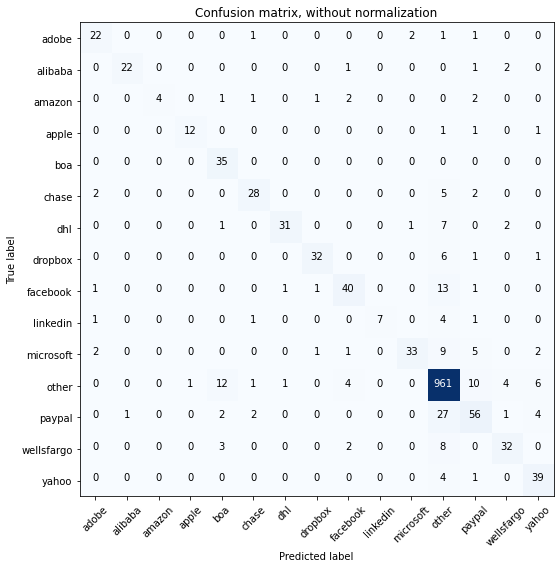

Acc     =  0.88
Pre     =  0.882
Rec     =  0.88
F1      =  0.876

Bal_Acc =  0.74
Bal_Pre =  0.855
Bal_Rec =  0.74
Bal_F1  =  0.793

              precision    recall  f1-score   support

       adobe       0.79      0.81      0.80        27
     alibaba       0.96      0.85      0.90        26
      amazon       1.00      0.36      0.53        11
       apple       0.92      0.80      0.86        15
         boa       0.65      1.00      0.79        35
       chase       0.82      0.76      0.79        37
         dhl       0.94      0.74      0.83        42
     dropbox       0.91      0.80      0.85        40
    facebook       0.80      0.70      0.75        57
    linkedin       1.00      0.50      0.67        14
   microsoft       0.92      0.62      0.74        53
       other       0.92      0.96      0.94      1000
      paypal       0.68      0.60      0.64        93
  wellsfargo       0.78      0.71      0.74        45
       yahoo       0.74      0.89      0.80        44



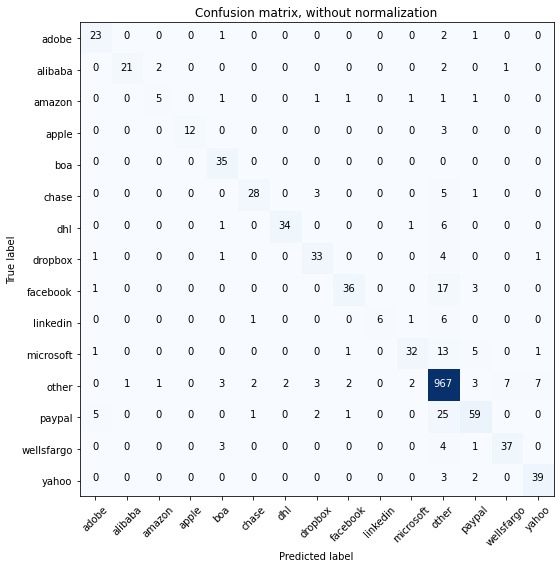

Acc     =  0.888
Pre     =  0.888
Rec     =  0.888
F1      =  0.883

Bal_Acc =  0.752
Bal_Pre =  0.851
Bal_Rec =  0.752
Bal_F1  =  0.798

              precision    recall  f1-score   support

       adobe       0.74      0.85      0.79        27
     alibaba       0.95      0.81      0.88        26
      amazon       0.62      0.45      0.53        11
       apple       1.00      0.80      0.89        15
         boa       0.78      1.00      0.88        35
       chase       0.88      0.76      0.81        37
         dhl       0.94      0.81      0.87        42
     dropbox       0.79      0.82      0.80        40
    facebook       0.88      0.63      0.73        57
    linkedin       1.00      0.43      0.60        14
   microsoft       0.86      0.60      0.71        53
       other       0.91      0.97      0.94      1000
      paypal       0.78      0.63      0.70        93
  wellsfargo       0.82      0.82      0.82        45
       yahoo       0.81      0.89      0.85        

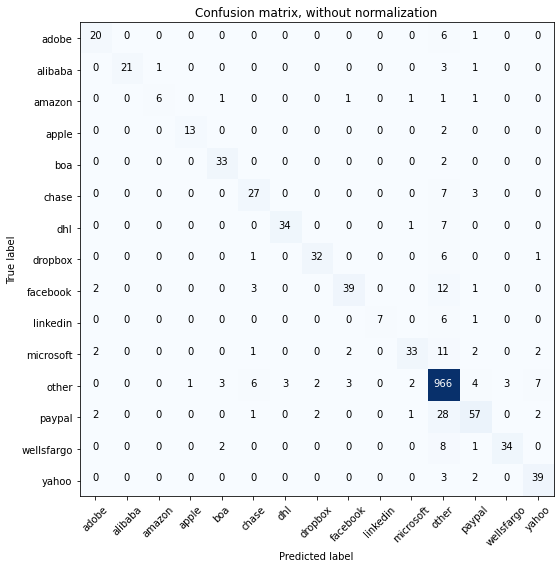

Acc     =  0.884
Pre     =  0.884
Rec     =  0.884
F1      =  0.88

Bal_Acc =  0.751
Bal_Pre =  0.866
Bal_Rec =  0.751
Bal_F1  =  0.804

              precision    recall  f1-score   support

       adobe       0.77      0.74      0.75        27
     alibaba       1.00      0.81      0.89        26
      amazon       0.86      0.55      0.67        11
       apple       0.93      0.87      0.90        15
         boa       0.85      0.94      0.89        35
       chase       0.69      0.73      0.71        37
         dhl       0.92      0.81      0.86        42
     dropbox       0.89      0.80      0.84        40
    facebook       0.87      0.68      0.76        57
    linkedin       1.00      0.50      0.67        14
   microsoft       0.87      0.62      0.73        53
       other       0.90      0.97      0.93      1000
      paypal       0.77      0.61      0.68        93
  wellsfargo       0.92      0.76      0.83        45
       yahoo       0.76      0.89      0.82        4

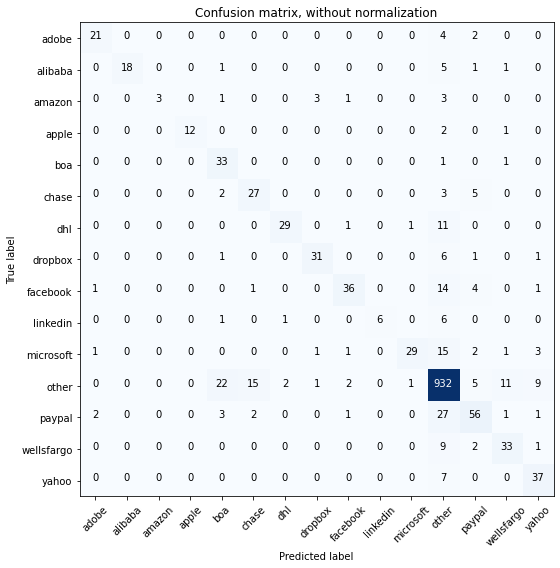

Acc     =  0.847
Pre     =  0.857
Rec     =  0.847
F1      =  0.844

Bal_Acc =  0.693
Bal_Pre =  0.833
Bal_Rec =  0.693
Bal_F1  =  0.757

              precision    recall  f1-score   support

       adobe       0.84      0.78      0.81        27
     alibaba       1.00      0.69      0.82        26
      amazon       1.00      0.27      0.43        11
       apple       1.00      0.80      0.89        15
         boa       0.52      0.94      0.67        35
       chase       0.60      0.73      0.66        37
         dhl       0.91      0.69      0.78        42
     dropbox       0.86      0.78      0.82        40
    facebook       0.86      0.63      0.73        57
    linkedin       1.00      0.43      0.60        14
   microsoft       0.94      0.55      0.69        53
       other       0.89      0.93      0.91      1000
      paypal       0.72      0.60      0.65        93
  wellsfargo       0.67      0.73      0.70        45
       yahoo       0.70      0.84      0.76        

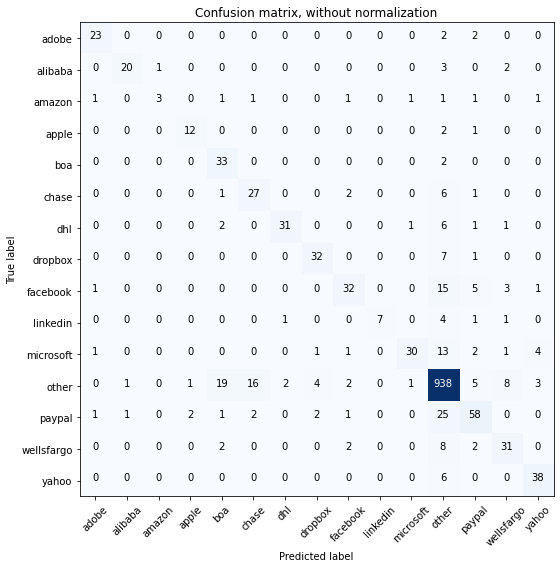

Acc     =  0.854
Pre     =  0.859
Rec     =  0.854
F1      =  0.851

Bal_Acc =  0.71
Bal_Pre =  0.798
Bal_Rec =  0.71
Bal_F1  =  0.751

              precision    recall  f1-score   support

       adobe       0.85      0.85      0.85        27
     alibaba       0.91      0.77      0.83        26
      amazon       0.75      0.27      0.40        11
       apple       0.80      0.80      0.80        15
         boa       0.56      0.94      0.70        35
       chase       0.59      0.73      0.65        37
         dhl       0.91      0.74      0.82        42
     dropbox       0.82      0.80      0.81        40
    facebook       0.78      0.56      0.65        57
    linkedin       1.00      0.50      0.67        14
   microsoft       0.91      0.57      0.70        53
       other       0.90      0.94      0.92      1000
      paypal       0.72      0.62      0.67        93
  wellsfargo       0.66      0.69      0.67        45
       yahoo       0.81      0.86      0.84        44

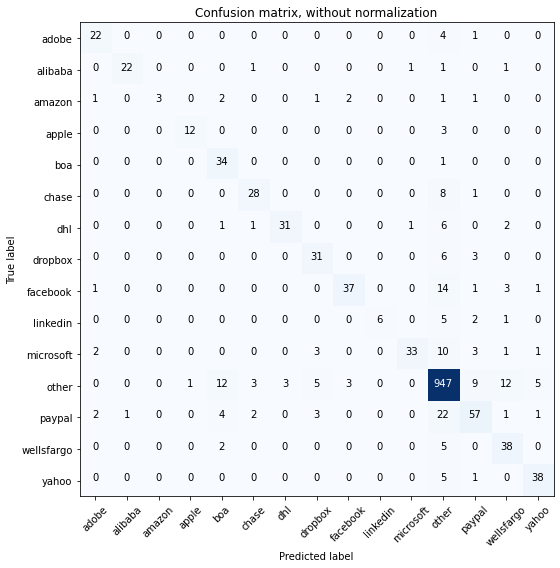

Acc     =  0.87
Pre     =  0.876
Rec     =  0.87
F1      =  0.867

Bal_Acc =  0.73
Bal_Pre =  0.843
Bal_Rec =  0.73
Bal_F1  =  0.782

              precision    recall  f1-score   support

       adobe       0.79      0.81      0.80        27
     alibaba       0.96      0.85      0.90        26
      amazon       1.00      0.27      0.43        11
       apple       0.92      0.80      0.86        15
         boa       0.62      0.97      0.76        35
       chase       0.80      0.76      0.78        37
         dhl       0.91      0.74      0.82        42
     dropbox       0.72      0.78      0.75        40
    facebook       0.88      0.65      0.75        57
    linkedin       1.00      0.43      0.60        14
   microsoft       0.94      0.62      0.75        53
       other       0.91      0.95      0.93      1000
      paypal       0.72      0.61      0.66        93
  wellsfargo       0.64      0.84      0.73        45
       yahoo       0.83      0.86      0.84        44



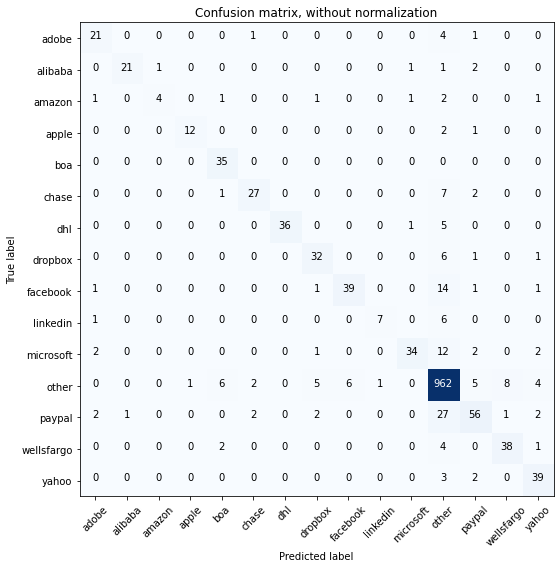

Acc     =  0.886
Pre     =  0.885
Rec     =  0.886
F1      =  0.881

Bal_Acc =  0.75
Bal_Pre =  0.848
Bal_Rec =  0.75
Bal_F1  =  0.796

              precision    recall  f1-score   support

       adobe       0.75      0.78      0.76        27
     alibaba       0.95      0.81      0.88        26
      amazon       0.80      0.36      0.50        11
       apple       0.92      0.80      0.86        15
         boa       0.78      1.00      0.88        35
       chase       0.84      0.73      0.78        37
         dhl       1.00      0.86      0.92        42
     dropbox       0.76      0.80      0.78        40
    facebook       0.87      0.68      0.76        57
    linkedin       0.88      0.50      0.64        14
   microsoft       0.92      0.64      0.76        53
       other       0.91      0.96      0.94      1000
      paypal       0.77      0.60      0.67        93
  wellsfargo       0.81      0.84      0.83        45
       yahoo       0.76      0.89      0.82        44

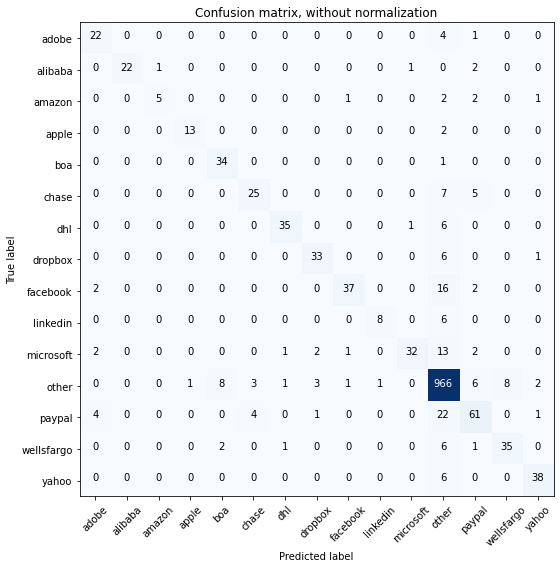

Acc     =  0.888
Pre     =  0.888
Rec     =  0.888
F1      =  0.883

Bal_Acc =  0.758
Bal_Pre =  0.861
Bal_Rec =  0.758
Bal_F1  =  0.806

              precision    recall  f1-score   support

       adobe       0.73      0.81      0.77        27
     alibaba       1.00      0.85      0.92        26
      amazon       0.83      0.45      0.59        11
       apple       0.93      0.87      0.90        15
         boa       0.77      0.97      0.86        35
       chase       0.78      0.68      0.72        37
         dhl       0.92      0.83      0.88        42
     dropbox       0.85      0.82      0.84        40
    facebook       0.93      0.65      0.76        57
    linkedin       0.89      0.57      0.70        14
   microsoft       0.94      0.60      0.74        53
       other       0.91      0.97      0.94      1000
      paypal       0.74      0.66      0.70        93
  wellsfargo       0.81      0.78      0.80        45
       yahoo       0.88      0.86      0.87        

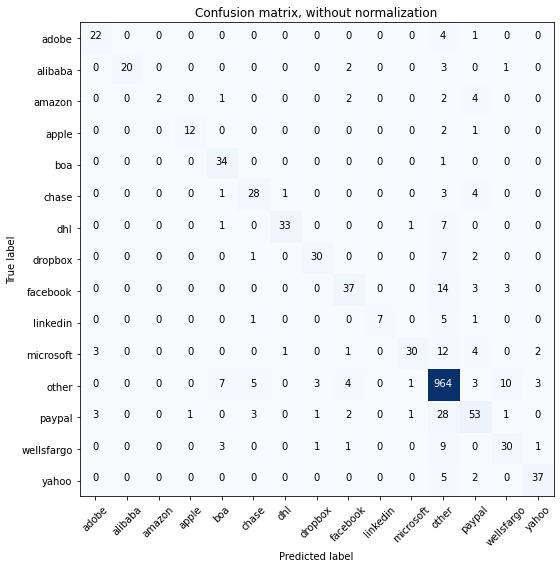

Acc     =  0.87
Pre     =  0.87
Rec     =  0.87
F1      =  0.864

Bal_Acc =  0.706
Bal_Pre =  0.85
Bal_Rec =  0.706
Bal_F1  =  0.771

              precision    recall  f1-score   support

       adobe       0.79      0.81      0.80        27
     alibaba       1.00      0.77      0.87        26
      amazon       1.00      0.18      0.31        11
       apple       0.92      0.80      0.86        15
         boa       0.72      0.97      0.83        35
       chase       0.74      0.76      0.75        37
         dhl       0.94      0.79      0.86        42
     dropbox       0.86      0.75      0.80        40
    facebook       0.76      0.65      0.70        57
    linkedin       1.00      0.50      0.67        14
   microsoft       0.91      0.57      0.70        53
       other       0.90      0.96      0.93      1000
      paypal       0.68      0.57      0.62        93
  wellsfargo       0.67      0.67      0.67        45
       yahoo       0.86      0.84      0.85        44



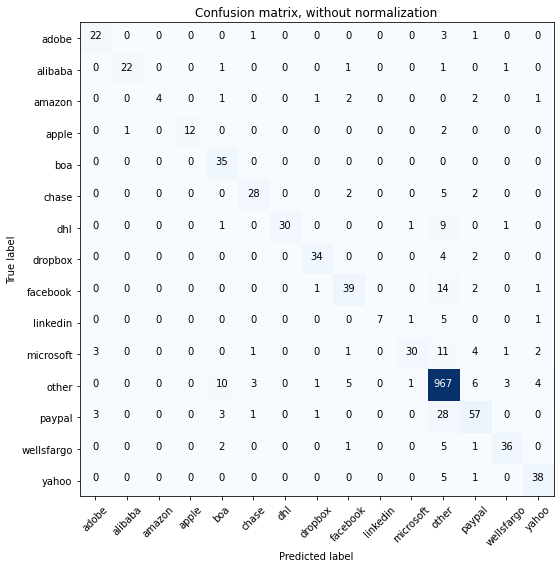

Acc     =  0.884
Pre     =  0.887
Rec     =  0.884
F1      =  0.88

Bal_Acc =  0.743
Bal_Pre =  0.874
Bal_Rec =  0.743
Bal_F1  =  0.803

              precision    recall  f1-score   support

       adobe       0.79      0.81      0.80        27
     alibaba       0.96      0.85      0.90        26
      amazon       1.00      0.36      0.53        11
       apple       1.00      0.80      0.89        15
         boa       0.66      1.00      0.80        35
       chase       0.82      0.76      0.79        37
         dhl       1.00      0.71      0.83        42
     dropbox       0.89      0.85      0.87        40
    facebook       0.76      0.68      0.72        57
    linkedin       1.00      0.50      0.67        14
   microsoft       0.91      0.57      0.70        53
       other       0.91      0.97      0.94      1000
      paypal       0.73      0.61      0.67        93
  wellsfargo       0.86      0.80      0.83        45
       yahoo       0.81      0.86      0.84        4

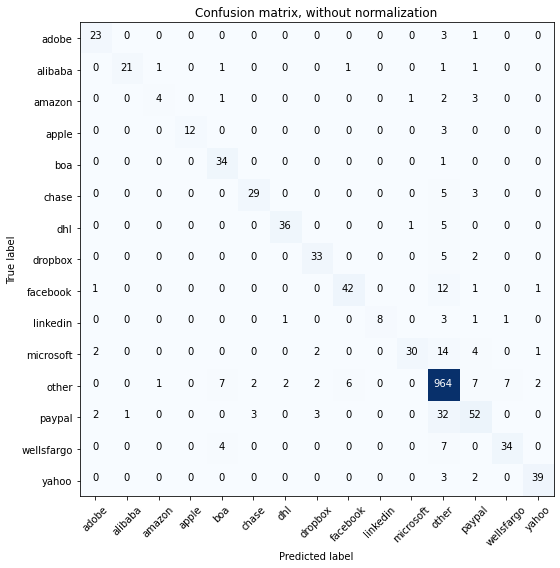

Acc     =  0.884
Pre     =  0.883
Rec     =  0.884
F1      =  0.88

Bal_Acc =  0.753
Bal_Pre =  0.858
Bal_Rec =  0.753
Bal_F1  =  0.802

              precision    recall  f1-score   support

       adobe       0.82      0.85      0.84        27
     alibaba       0.95      0.81      0.88        26
      amazon       0.67      0.36      0.47        11
       apple       1.00      0.80      0.89        15
         boa       0.72      0.97      0.83        35
       chase       0.85      0.78      0.82        37
         dhl       0.92      0.86      0.89        42
     dropbox       0.82      0.82      0.82        40
    facebook       0.86      0.74      0.79        57
    linkedin       1.00      0.57      0.73        14
   microsoft       0.94      0.57      0.71        53
       other       0.91      0.96      0.94      1000
      paypal       0.68      0.56      0.61        93
  wellsfargo       0.81      0.76      0.78        45
       yahoo       0.91      0.89      0.90        4

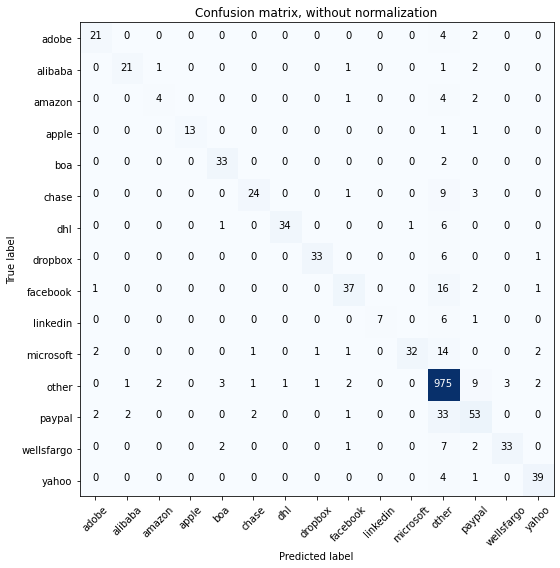

Acc     =  0.883
Pre     =  0.882
Rec     =  0.883
F1      =  0.877

Bal_Acc =  0.731
Bal_Pre =  0.868
Bal_Rec =  0.731
Bal_F1  =  0.794

              precision    recall  f1-score   support

       adobe       0.81      0.78      0.79        27
     alibaba       0.88      0.81      0.84        26
      amazon       0.57      0.36      0.44        11
       apple       1.00      0.87      0.93        15
         boa       0.85      0.94      0.89        35
       chase       0.86      0.65      0.74        37
         dhl       0.97      0.81      0.88        42
     dropbox       0.94      0.82      0.88        40
    facebook       0.82      0.65      0.73        57
    linkedin       1.00      0.50      0.67        14
   microsoft       0.97      0.60      0.74        53
       other       0.90      0.97      0.93      1000
      paypal       0.68      0.57      0.62        93
  wellsfargo       0.92      0.73      0.81        45
       yahoo       0.87      0.89      0.88        

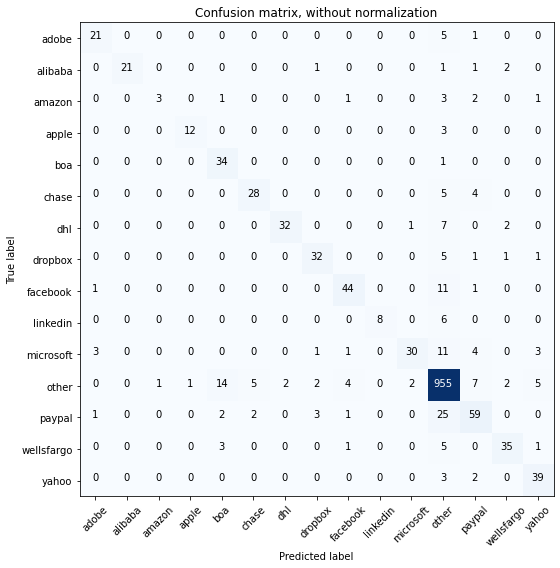

Acc     =  0.879
Pre     =  0.881
Rec     =  0.879
F1      =  0.875

Bal_Acc =  0.741
Bal_Pre =  0.845
Bal_Rec =  0.741
Bal_F1  =  0.79

              precision    recall  f1-score   support

       adobe       0.81      0.78      0.79        27
     alibaba       1.00      0.81      0.89        26
      amazon       0.75      0.27      0.40        11
       apple       0.92      0.80      0.86        15
         boa       0.63      0.97      0.76        35
       chase       0.80      0.76      0.78        37
         dhl       0.94      0.76      0.84        42
     dropbox       0.82      0.80      0.81        40
    facebook       0.85      0.77      0.81        57
    linkedin       1.00      0.57      0.73        14
   microsoft       0.91      0.57      0.70        53
       other       0.91      0.95      0.93      1000
      paypal       0.72      0.63      0.67        93
  wellsfargo       0.83      0.78      0.80        45
       yahoo       0.78      0.89      0.83        4

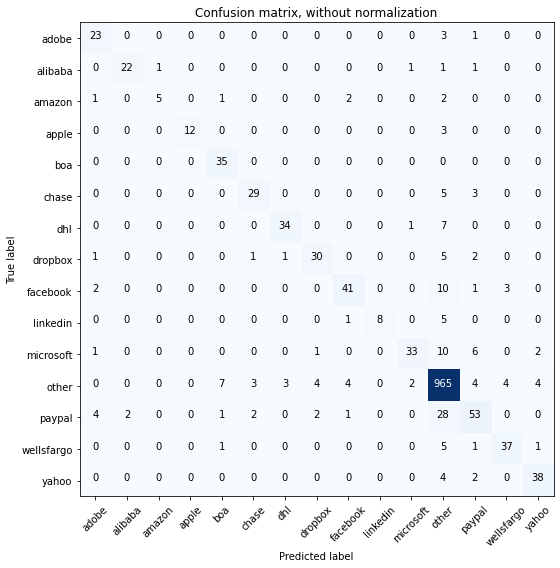

Acc     =  0.887
Pre     =  0.885
Rec     =  0.887
F1      =  0.883

Bal_Acc =  0.762
Bal_Pre =  0.855
Bal_Rec =  0.762
Bal_F1  =  0.806

              precision    recall  f1-score   support

       adobe       0.72      0.85      0.78        27
     alibaba       0.92      0.85      0.88        26
      amazon       0.83      0.45      0.59        11
       apple       1.00      0.80      0.89        15
         boa       0.78      1.00      0.88        35
       chase       0.83      0.78      0.81        37
         dhl       0.89      0.81      0.85        42
     dropbox       0.81      0.75      0.78        40
    facebook       0.84      0.72      0.77        57
    linkedin       1.00      0.57      0.73        14
   microsoft       0.89      0.62      0.73        53
       other       0.92      0.96      0.94      1000
      paypal       0.72      0.57      0.63        93
  wellsfargo       0.84      0.82      0.83        45
       yahoo       0.84      0.86      0.85        

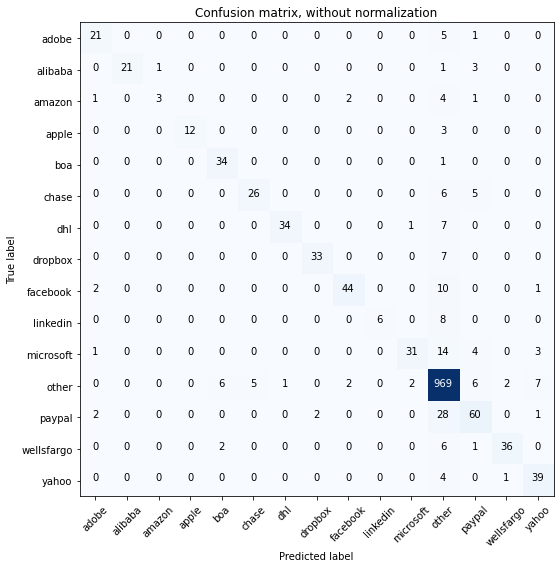

Acc     =  0.89
Pre     =  0.89
Rec     =  0.89
F1      =  0.884

Bal_Acc =  0.737
Bal_Pre =  0.883
Bal_Rec =  0.737
Bal_F1  =  0.803

              precision    recall  f1-score   support

       adobe       0.78      0.78      0.78        27
     alibaba       1.00      0.81      0.89        26
      amazon       0.75      0.27      0.40        11
       apple       1.00      0.80      0.89        15
         boa       0.81      0.97      0.88        35
       chase       0.84      0.70      0.76        37
         dhl       0.97      0.81      0.88        42
     dropbox       0.94      0.82      0.88        40
    facebook       0.92      0.77      0.84        57
    linkedin       1.00      0.43      0.60        14
   microsoft       0.91      0.58      0.71        53
       other       0.90      0.97      0.93      1000
      paypal       0.74      0.65      0.69        93
  wellsfargo       0.92      0.80      0.86        45
       yahoo       0.76      0.89      0.82        44


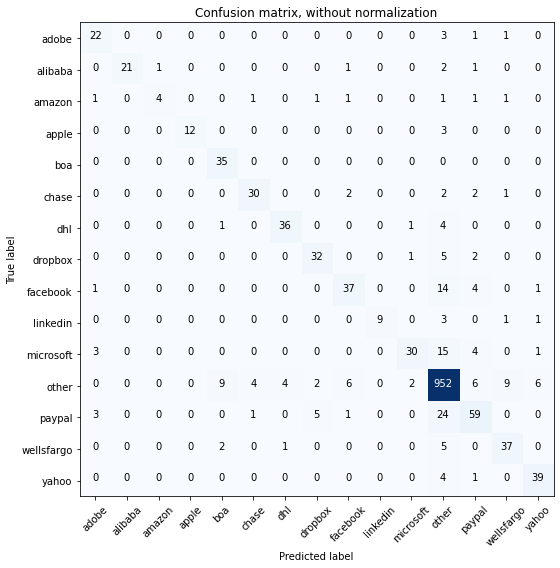

Acc     =  0.88
Pre     =  0.88
Rec     =  0.88
F1      =  0.877

Bal_Acc =  0.76
Bal_Pre =  0.843
Bal_Rec =  0.76
Bal_F1  =  0.799

              precision    recall  f1-score   support

       adobe       0.73      0.81      0.77        27
     alibaba       1.00      0.81      0.89        26
      amazon       0.80      0.36      0.50        11
       apple       1.00      0.80      0.89        15
         boa       0.74      1.00      0.85        35
       chase       0.83      0.81      0.82        37
         dhl       0.88      0.86      0.87        42
     dropbox       0.80      0.80      0.80        40
    facebook       0.77      0.65      0.70        57
    linkedin       1.00      0.64      0.78        14
   microsoft       0.88      0.57      0.69        53
       other       0.92      0.95      0.93      1000
      paypal       0.73      0.63      0.68        93
  wellsfargo       0.74      0.82      0.78        45
       yahoo       0.81      0.89      0.85        44

 

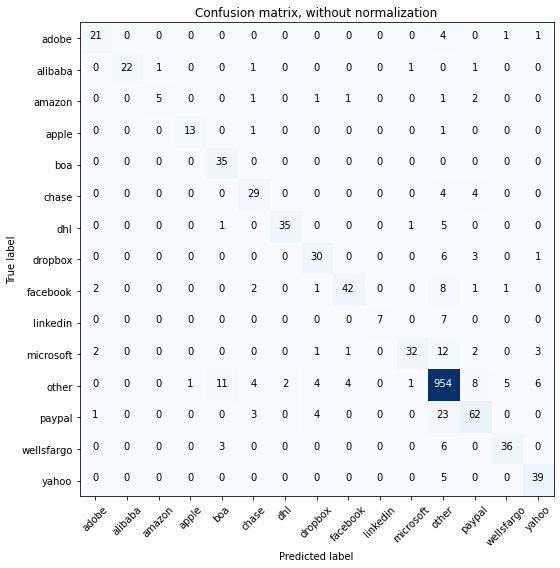

Acc     =  0.885
Pre     =  0.887
Rec     =  0.885
F1      =  0.882

Bal_Acc =  0.764
Bal_Pre =  0.849
Bal_Rec =  0.764
Bal_F1  =  0.804

              precision    recall  f1-score   support

       adobe       0.81      0.78      0.79        27
     alibaba       1.00      0.85      0.92        26
      amazon       0.83      0.45      0.59        11
       apple       0.93      0.87      0.90        15
         boa       0.70      1.00      0.82        35
       chase       0.71      0.78      0.74        37
         dhl       0.95      0.83      0.89        42
     dropbox       0.73      0.75      0.74        40
    facebook       0.88      0.74      0.80        57
    linkedin       1.00      0.50      0.67        14
   microsoft       0.91      0.60      0.73        53
       other       0.92      0.95      0.94      1000
      paypal       0.75      0.67      0.70        93
  wellsfargo       0.84      0.80      0.82        45
       yahoo       0.78      0.89      0.83        

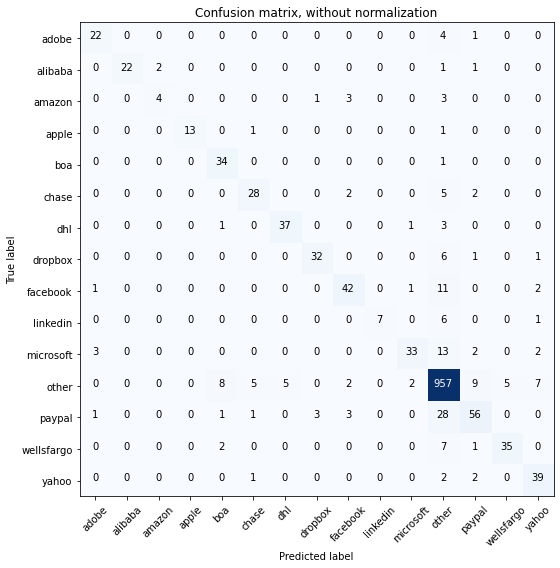

Acc     =  0.884
Pre     =  0.884
Rec     =  0.884
F1      =  0.88

Bal_Acc =  0.759
Bal_Pre =  0.85
Bal_Rec =  0.759
Bal_F1  =  0.802

              precision    recall  f1-score   support

       adobe       0.81      0.81      0.81        27
     alibaba       1.00      0.85      0.92        26
      amazon       0.67      0.36      0.47        11
       apple       1.00      0.87      0.93        15
         boa       0.74      0.97      0.84        35
       chase       0.78      0.76      0.77        37
         dhl       0.88      0.88      0.88        42
     dropbox       0.89      0.80      0.84        40
    facebook       0.81      0.74      0.77        57
    linkedin       1.00      0.50      0.67        14
   microsoft       0.89      0.62      0.73        53
       other       0.91      0.96      0.93      1000
      paypal       0.75      0.60      0.67        93
  wellsfargo       0.88      0.78      0.82        45
       yahoo       0.75      0.89      0.81        44

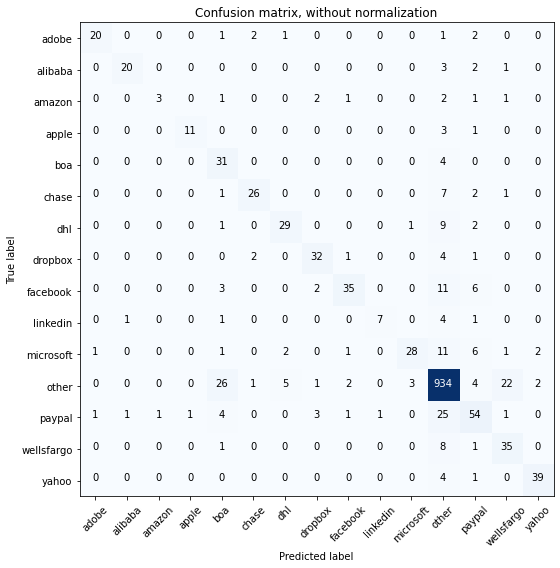

Acc     =  0.847
Pre     =  0.858
Rec     =  0.847
F1      =  0.846

Bal_Acc =  0.694
Bal_Pre =  0.798
Bal_Rec =  0.694
Bal_F1  =  0.742

              precision    recall  f1-score   support

       adobe       0.91      0.74      0.82        27
     alibaba       0.91      0.77      0.83        26
      amazon       0.75      0.27      0.40        11
       apple       0.92      0.73      0.81        15
         boa       0.44      0.89      0.58        35
       chase       0.84      0.70      0.76        37
         dhl       0.78      0.69      0.73        42
     dropbox       0.80      0.80      0.80        40
    facebook       0.85      0.61      0.71        57
    linkedin       0.88      0.50      0.64        14
   microsoft       0.88      0.53      0.66        53
       other       0.91      0.93      0.92      1000
      paypal       0.64      0.58      0.61        93
  wellsfargo       0.56      0.78      0.65        45
       yahoo       0.91      0.89      0.90        

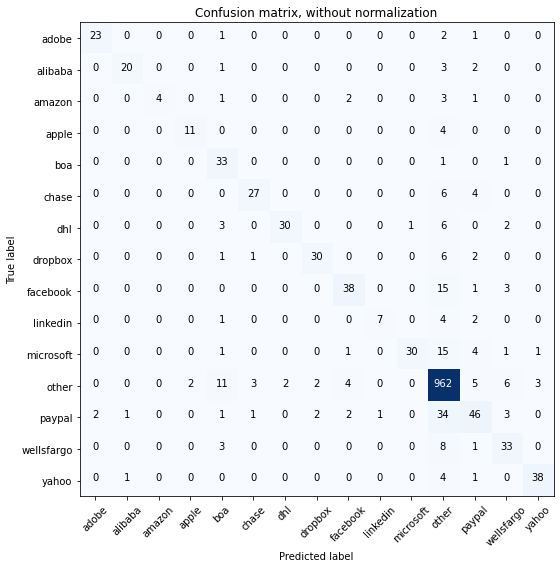

Acc     =  0.865
Pre     =  0.868
Rec     =  0.865
F1      =  0.86

Bal_Acc =  0.709
Bal_Pre =  0.847
Bal_Rec =  0.709
Bal_F1  =  0.772

              precision    recall  f1-score   support

       adobe       0.92      0.85      0.88        27
     alibaba       0.91      0.77      0.83        26
      amazon       1.00      0.36      0.53        11
       apple       0.85      0.73      0.79        15
         boa       0.58      0.94      0.72        35
       chase       0.84      0.73      0.78        37
         dhl       0.94      0.71      0.81        42
     dropbox       0.88      0.75      0.81        40
    facebook       0.81      0.67      0.73        57
    linkedin       0.88      0.50      0.64        14
   microsoft       0.97      0.57      0.71        53
       other       0.90      0.96      0.93      1000
      paypal       0.66      0.49      0.56        93
  wellsfargo       0.67      0.73      0.70        45
       yahoo       0.90      0.86      0.88        4

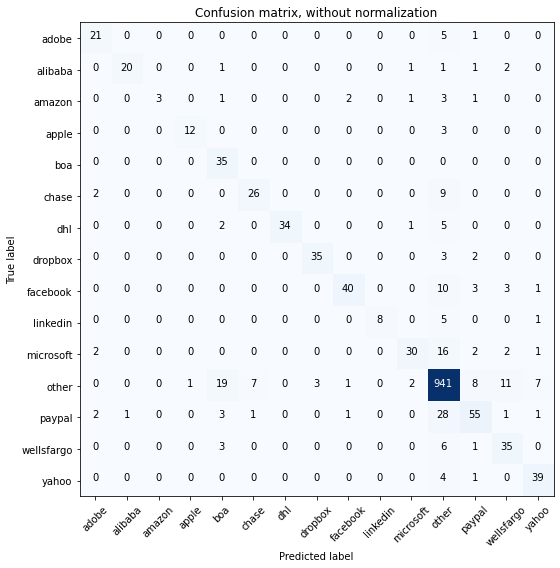

Acc     =  0.867
Pre     =  0.874
Rec     =  0.867
F1      =  0.864

Bal_Acc =  0.736
Bal_Pre =  0.848
Bal_Rec =  0.736
Bal_F1  =  0.788

              precision    recall  f1-score   support

       adobe       0.78      0.78      0.78        27
     alibaba       0.95      0.77      0.85        26
      amazon       1.00      0.27      0.43        11
       apple       0.92      0.80      0.86        15
         boa       0.55      1.00      0.71        35
       chase       0.76      0.70      0.73        37
         dhl       1.00      0.81      0.89        42
     dropbox       0.92      0.88      0.90        40
    facebook       0.91      0.70      0.79        57
    linkedin       1.00      0.57      0.73        14
   microsoft       0.86      0.57      0.68        53
       other       0.91      0.94      0.92      1000
      paypal       0.73      0.59      0.65        93
  wellsfargo       0.65      0.78      0.71        45
       yahoo       0.78      0.89      0.83        

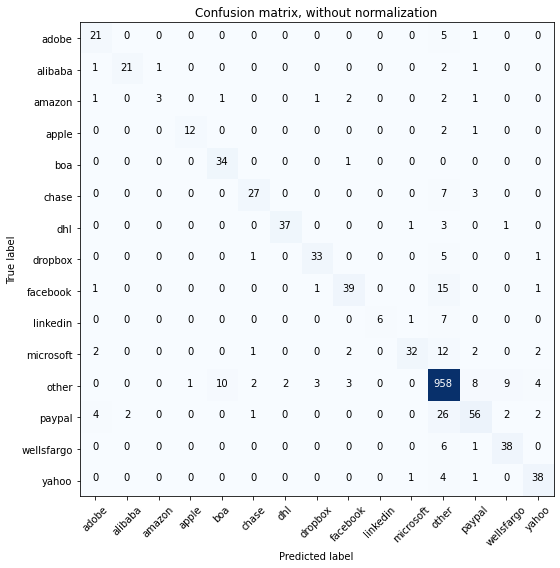

Acc     =  0.88
Pre     =  0.88
Rec     =  0.88
F1      =  0.875

Bal_Acc =  0.737
Bal_Pre =  0.844
Bal_Rec =  0.737
Bal_F1  =  0.787

              precision    recall  f1-score   support

       adobe       0.70      0.78      0.74        27
     alibaba       0.91      0.81      0.86        26
      amazon       0.75      0.27      0.40        11
       apple       0.92      0.80      0.86        15
         boa       0.76      0.97      0.85        35
       chase       0.84      0.73      0.78        37
         dhl       0.95      0.88      0.91        42
     dropbox       0.87      0.82      0.85        40
    facebook       0.83      0.68      0.75        57
    linkedin       1.00      0.43      0.60        14
   microsoft       0.91      0.60      0.73        53
       other       0.91      0.96      0.93      1000
      paypal       0.75      0.60      0.67        93
  wellsfargo       0.76      0.84      0.80        45
       yahoo       0.79      0.86      0.83        44


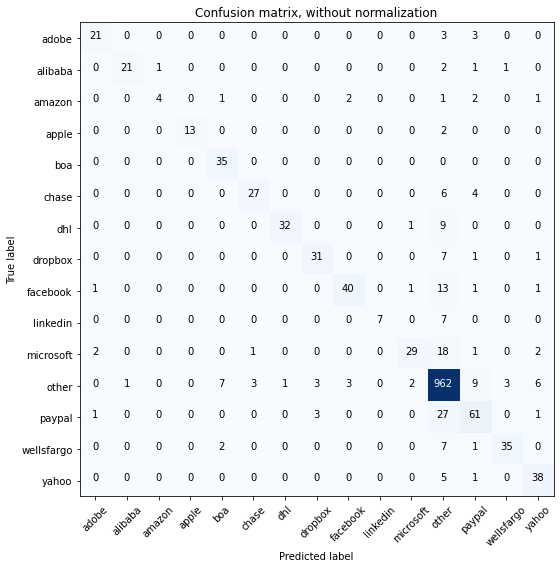

Acc     =  0.881
Pre     =  0.882
Rec     =  0.881
F1      =  0.876

Bal_Acc =  0.739
Bal_Pre =  0.873
Bal_Rec =  0.739
Bal_F1  =  0.8

              precision    recall  f1-score   support

       adobe       0.84      0.78      0.81        27
     alibaba       0.95      0.81      0.88        26
      amazon       0.80      0.36      0.50        11
       apple       1.00      0.87      0.93        15
         boa       0.78      1.00      0.88        35
       chase       0.87      0.73      0.79        37
         dhl       0.97      0.76      0.85        42
     dropbox       0.84      0.78      0.81        40
    facebook       0.89      0.70      0.78        57
    linkedin       1.00      0.50      0.67        14
   microsoft       0.88      0.55      0.67        53
       other       0.90      0.96      0.93      1000
      paypal       0.72      0.66      0.69        93
  wellsfargo       0.90      0.78      0.83        45
       yahoo       0.76      0.86      0.81        44

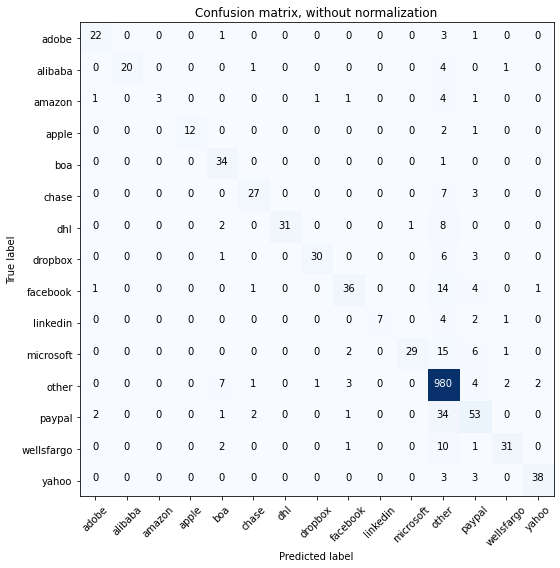

Acc     =  0.879
Pre     =  0.882
Rec     =  0.879
F1      =  0.872

Bal_Acc =  0.708
Bal_Pre =  0.897
Bal_Rec =  0.708
Bal_F1  =  0.791

              precision    recall  f1-score   support

       adobe       0.85      0.81      0.83        27
     alibaba       1.00      0.77      0.87        26
      amazon       1.00      0.27      0.43        11
       apple       1.00      0.80      0.89        15
         boa       0.71      0.97      0.82        35
       chase       0.84      0.73      0.78        37
         dhl       1.00      0.74      0.85        42
     dropbox       0.94      0.75      0.83        40
    facebook       0.82      0.63      0.71        57
    linkedin       1.00      0.50      0.67        14
   microsoft       0.97      0.55      0.70        53
       other       0.89      0.98      0.94      1000
      paypal       0.65      0.57      0.61        93
  wellsfargo       0.86      0.69      0.77        45
       yahoo       0.93      0.86      0.89        

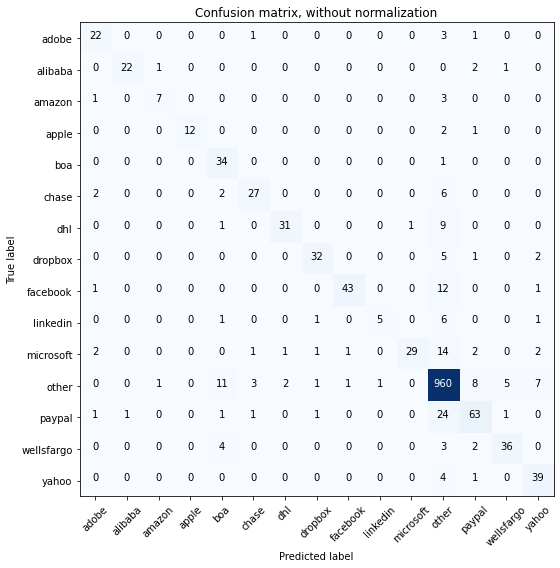

Acc     =  0.885
Pre     =  0.889
Rec     =  0.885
F1      =  0.881

Bal_Acc =  0.755
Bal_Pre =  0.852
Bal_Rec =  0.755
Bal_F1  =  0.801

              precision    recall  f1-score   support

       adobe       0.76      0.81      0.79        27
     alibaba       0.96      0.85      0.90        26
      amazon       0.78      0.64      0.70        11
       apple       1.00      0.80      0.89        15
         boa       0.63      0.97      0.76        35
       chase       0.82      0.73      0.77        37
         dhl       0.91      0.74      0.82        42
     dropbox       0.89      0.80      0.84        40
    facebook       0.96      0.75      0.84        57
    linkedin       0.83      0.36      0.50        14
   microsoft       0.97      0.55      0.70        53
       other       0.91      0.96      0.94      1000
      paypal       0.78      0.68      0.72        93
  wellsfargo       0.84      0.80      0.82        45
       yahoo       0.75      0.89      0.81        

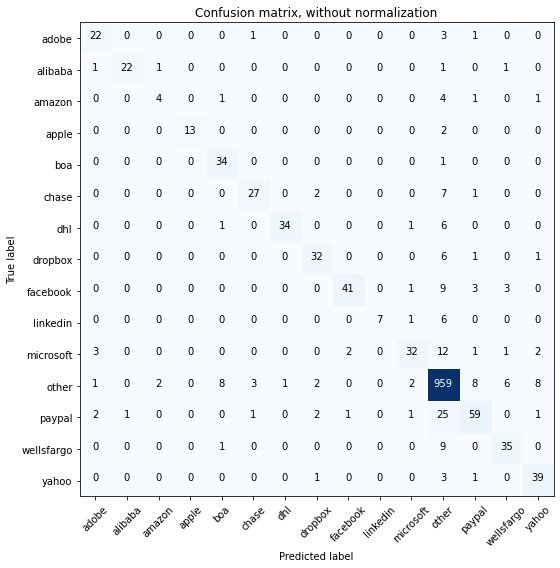

Acc     =  0.884
Pre     =  0.884
Rec     =  0.884
F1      =  0.88

Bal_Acc =  0.752
Bal_Pre =  0.843
Bal_Rec =  0.752
Bal_F1  =  0.795

              precision    recall  f1-score   support

       adobe       0.76      0.81      0.79        27
     alibaba       0.96      0.85      0.90        26
      amazon       0.57      0.36      0.44        11
       apple       1.00      0.87      0.93        15
         boa       0.76      0.97      0.85        35
       chase       0.84      0.73      0.78        37
         dhl       0.97      0.81      0.88        42
     dropbox       0.82      0.80      0.81        40
    facebook       0.93      0.72      0.81        57
    linkedin       1.00      0.50      0.67        14
   microsoft       0.84      0.60      0.70        53
       other       0.91      0.96      0.93      1000
      paypal       0.78      0.63      0.70        93
  wellsfargo       0.76      0.78      0.77        45
       yahoo       0.75      0.89      0.81        4

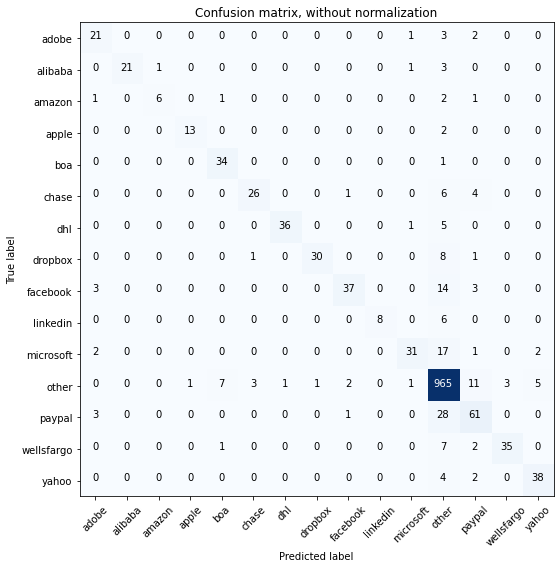

Acc     =  0.885
Pre     =  0.886
Rec     =  0.885
F1      =  0.881

Bal_Acc =  0.756
Bal_Pre =  0.882
Bal_Rec =  0.756
Bal_F1  =  0.814

              precision    recall  f1-score   support

       adobe       0.70      0.78      0.74        27
     alibaba       1.00      0.81      0.89        26
      amazon       0.86      0.55      0.67        11
       apple       0.93      0.87      0.90        15
         boa       0.79      0.97      0.87        35
       chase       0.87      0.70      0.78        37
         dhl       0.97      0.86      0.91        42
     dropbox       0.97      0.75      0.85        40
    facebook       0.90      0.65      0.76        57
    linkedin       1.00      0.57      0.73        14
   microsoft       0.89      0.58      0.70        53
       other       0.90      0.96      0.93      1000
      paypal       0.69      0.66      0.67        93
  wellsfargo       0.92      0.78      0.84        45
       yahoo       0.84      0.86      0.85        

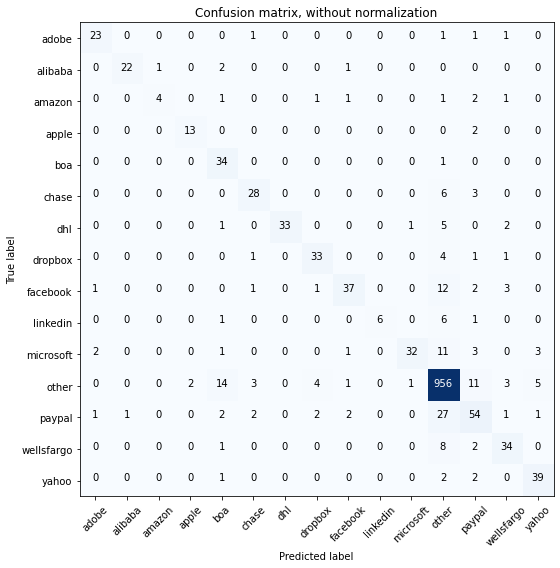

Acc     =  0.876
Pre     =  0.88
Rec     =  0.876
F1      =  0.873

Bal_Acc =  0.742
Bal_Pre =  0.837
Bal_Rec =  0.742
Bal_F1  =  0.787

              precision    recall  f1-score   support

       adobe       0.85      0.85      0.85        27
     alibaba       0.96      0.85      0.90        26
      amazon       0.80      0.36      0.50        11
       apple       0.87      0.87      0.87        15
         boa       0.59      0.97      0.73        35
       chase       0.78      0.76      0.77        37
         dhl       1.00      0.79      0.88        42
     dropbox       0.80      0.82      0.81        40
    facebook       0.86      0.65      0.74        57
    linkedin       1.00      0.43      0.60        14
   microsoft       0.94      0.60      0.74        53
       other       0.92      0.96      0.94      1000
      paypal       0.64      0.58      0.61        93
  wellsfargo       0.74      0.76      0.75        45
       yahoo       0.81      0.89      0.85        4

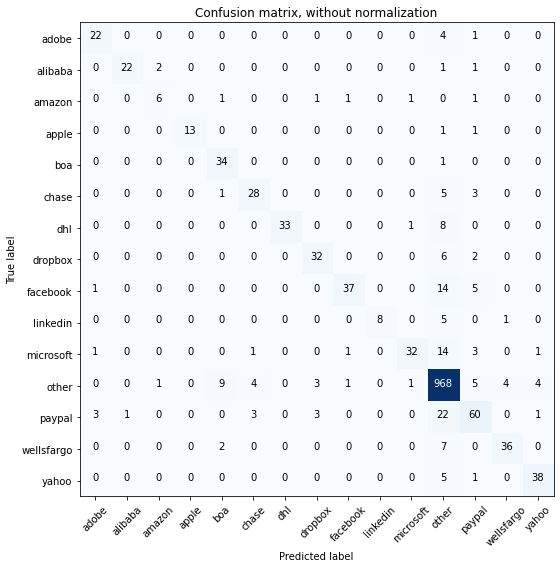

Acc     =  0.89
Pre     =  0.89
Rec     =  0.89
F1      =  0.886

Bal_Acc =  0.766
Bal_Pre =  0.865
Bal_Rec =  0.766
Bal_F1  =  0.812

              precision    recall  f1-score   support

       adobe       0.81      0.81      0.81        27
     alibaba       0.96      0.85      0.90        26
      amazon       0.67      0.55      0.60        11
       apple       1.00      0.87      0.93        15
         boa       0.72      0.97      0.83        35
       chase       0.78      0.76      0.77        37
         dhl       1.00      0.79      0.88        42
     dropbox       0.82      0.80      0.81        40
    facebook       0.93      0.65      0.76        57
    linkedin       1.00      0.57      0.73        14
   microsoft       0.91      0.60      0.73        53
       other       0.91      0.97      0.94      1000
      paypal       0.72      0.65      0.68        93
  wellsfargo       0.88      0.80      0.84        45
       yahoo       0.86      0.86      0.86        44


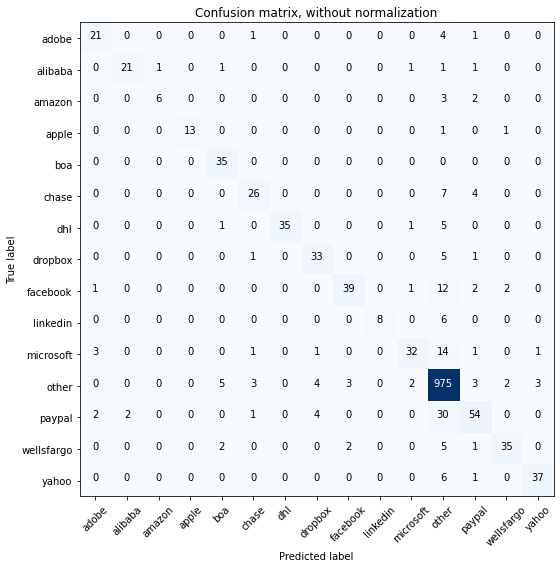

Acc     =  0.89
Pre     =  0.889
Rec     =  0.89
F1      =  0.885

Bal_Acc =  0.759
Bal_Pre =  0.874
Bal_Rec =  0.759
Bal_F1  =  0.812

              precision    recall  f1-score   support

       adobe       0.78      0.78      0.78        27
     alibaba       0.91      0.81      0.86        26
      amazon       0.86      0.55      0.67        11
       apple       1.00      0.87      0.93        15
         boa       0.80      1.00      0.89        35
       chase       0.79      0.70      0.74        37
         dhl       1.00      0.83      0.91        42
     dropbox       0.79      0.82      0.80        40
    facebook       0.89      0.68      0.77        57
    linkedin       1.00      0.57      0.73        14
   microsoft       0.86      0.60      0.71        53
       other       0.91      0.97      0.94      1000
      paypal       0.76      0.58      0.66        93
  wellsfargo       0.88      0.78      0.82        45
       yahoo       0.90      0.84      0.87        44

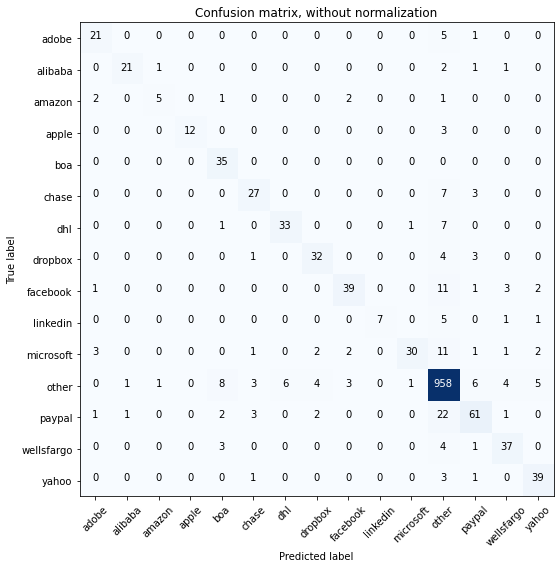

Acc     =  0.882
Pre     =  0.883
Rec     =  0.882
F1      =  0.878

Bal_Acc =  0.749
Bal_Pre =  0.834
Bal_Rec =  0.749
Bal_F1  =  0.789

              precision    recall  f1-score   support

       adobe       0.75      0.78      0.76        27
     alibaba       0.91      0.81      0.86        26
      amazon       0.71      0.45      0.56        11
       apple       1.00      0.80      0.89        15
         boa       0.70      1.00      0.82        35
       chase       0.75      0.73      0.74        37
         dhl       0.85      0.79      0.81        42
     dropbox       0.80      0.80      0.80        40
    facebook       0.85      0.68      0.76        57
    linkedin       1.00      0.50      0.67        14
   microsoft       0.94      0.57      0.71        53
       other       0.92      0.96      0.94      1000
      paypal       0.77      0.66      0.71        93
  wellsfargo       0.77      0.82      0.80        45
       yahoo       0.80      0.89      0.84        

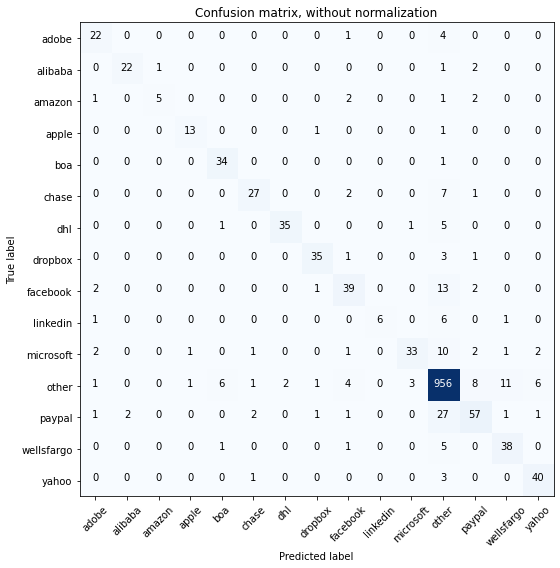

Acc     =  0.885
Pre     =  0.884
Rec     =  0.885
F1      =  0.881

Bal_Acc =  0.763
Bal_Pre =  0.847
Bal_Rec =  0.763
Bal_F1  =  0.803

              precision    recall  f1-score   support

       adobe       0.73      0.81      0.77        27
     alibaba       0.92      0.85      0.88        26
      amazon       0.83      0.45      0.59        11
       apple       0.87      0.87      0.87        15
         boa       0.81      0.97      0.88        35
       chase       0.84      0.73      0.78        37
         dhl       0.95      0.83      0.89        42
     dropbox       0.90      0.88      0.89        40
    facebook       0.75      0.68      0.72        57
    linkedin       1.00      0.43      0.60        14
   microsoft       0.89      0.62      0.73        53
       other       0.92      0.96      0.94      1000
      paypal       0.76      0.61      0.68        93
  wellsfargo       0.73      0.84      0.78        45
       yahoo       0.82      0.91      0.86        

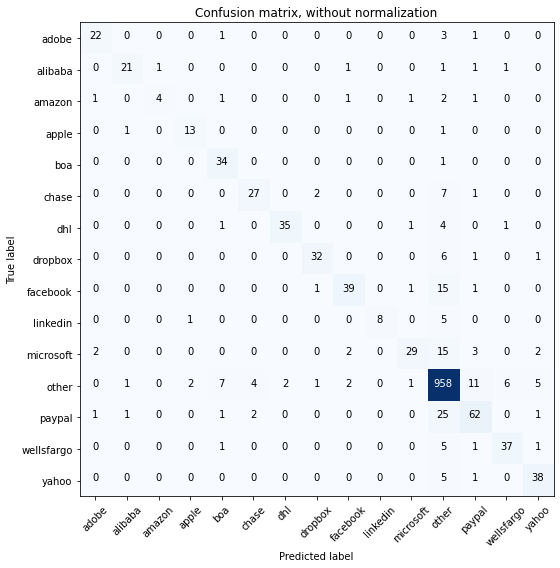

Acc     =  0.883
Pre     =  0.883
Rec     =  0.883
F1      =  0.879

Bal_Acc =  0.753
Bal_Pre =  0.849
Bal_Rec =  0.753
Bal_F1  =  0.798

              precision    recall  f1-score   support

       adobe       0.85      0.81      0.83        27
     alibaba       0.88      0.81      0.84        26
      amazon       0.80      0.36      0.50        11
       apple       0.81      0.87      0.84        15
         boa       0.74      0.97      0.84        35
       chase       0.82      0.73      0.77        37
         dhl       0.95      0.83      0.89        42
     dropbox       0.89      0.80      0.84        40
    facebook       0.87      0.68      0.76        57
    linkedin       1.00      0.57      0.73        14
   microsoft       0.88      0.55      0.67        53
       other       0.91      0.96      0.93      1000
      paypal       0.74      0.67      0.70        93
  wellsfargo       0.82      0.82      0.82        45
       yahoo       0.79      0.86      0.83        

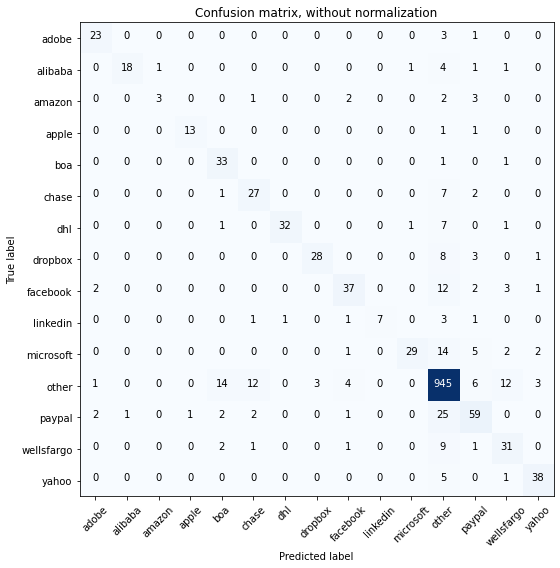

Acc     =  0.86
Pre     =  0.865
Rec     =  0.86
F1      =  0.856

Bal_Acc =  0.71
Bal_Pre =  0.821
Bal_Rec =  0.71
Bal_F1  =  0.761

              precision    recall  f1-score   support

       adobe       0.82      0.85      0.84        27
     alibaba       0.95      0.69      0.80        26
      amazon       0.75      0.27      0.40        11
       apple       0.93      0.87      0.90        15
         boa       0.62      0.94      0.75        35
       chase       0.61      0.73      0.67        37
         dhl       0.97      0.76      0.85        42
     dropbox       0.90      0.70      0.79        40
    facebook       0.79      0.65      0.71        57
    linkedin       1.00      0.50      0.67        14
   microsoft       0.94      0.55      0.69        53
       other       0.90      0.94      0.92      1000
      paypal       0.69      0.63      0.66        93
  wellsfargo       0.60      0.69      0.64        45
       yahoo       0.84      0.86      0.85        44



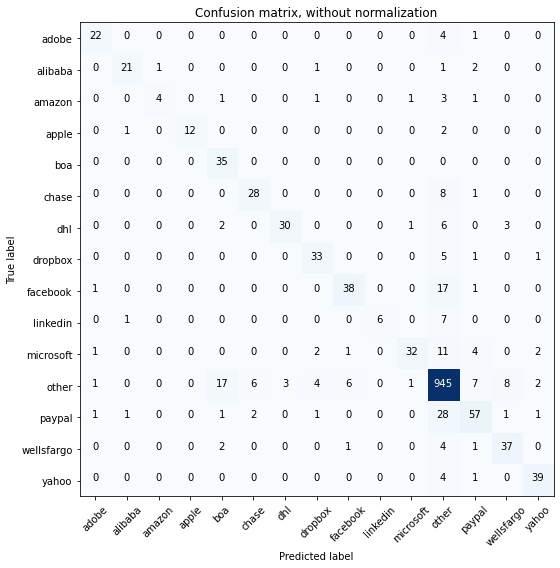

Acc     =  0.87
Pre     =  0.873
Rec     =  0.87
F1      =  0.866

Bal_Acc =  0.737
Bal_Pre =  0.84
Bal_Rec =  0.737
Bal_F1  =  0.785

              precision    recall  f1-score   support

       adobe       0.85      0.81      0.83        27
     alibaba       0.88      0.81      0.84        26
      amazon       0.80      0.36      0.50        11
       apple       1.00      0.80      0.89        15
         boa       0.60      1.00      0.75        35
       chase       0.78      0.76      0.77        37
         dhl       0.91      0.71      0.80        42
     dropbox       0.79      0.82      0.80        40
    facebook       0.83      0.67      0.74        57
    linkedin       1.00      0.43      0.60        14
   microsoft       0.91      0.60      0.73        53
       other       0.90      0.94      0.92      1000
      paypal       0.74      0.61      0.67        93
  wellsfargo       0.76      0.82      0.79        45
       yahoo       0.87      0.89      0.88        44


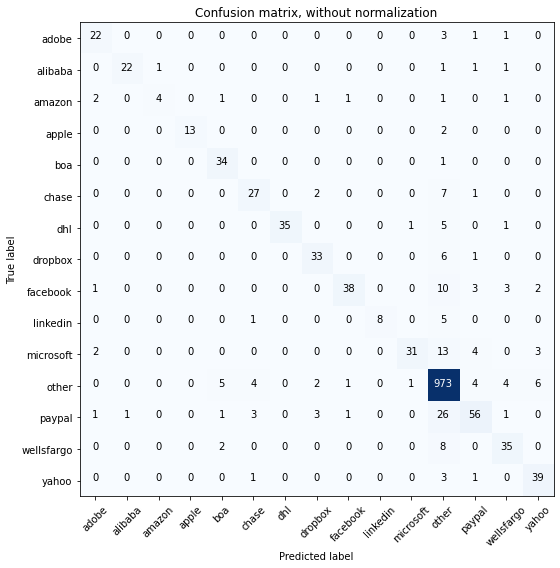

Acc     =  0.89
Pre     =  0.891
Rec     =  0.89
F1      =  0.885

Bal_Acc =  0.754
Bal_Pre =  0.865
Bal_Rec =  0.754
Bal_F1  =  0.806

              precision    recall  f1-score   support

       adobe       0.79      0.81      0.80        27
     alibaba       0.96      0.85      0.90        26
      amazon       0.80      0.36      0.50        11
       apple       1.00      0.87      0.93        15
         boa       0.79      0.97      0.87        35
       chase       0.75      0.73      0.74        37
         dhl       1.00      0.83      0.91        42
     dropbox       0.80      0.82      0.81        40
    facebook       0.93      0.67      0.78        57
    linkedin       1.00      0.57      0.73        14
   microsoft       0.94      0.58      0.72        53
       other       0.91      0.97      0.94      1000
      paypal       0.78      0.60      0.68        93
  wellsfargo       0.74      0.78      0.76        45
       yahoo       0.78      0.89      0.83        44

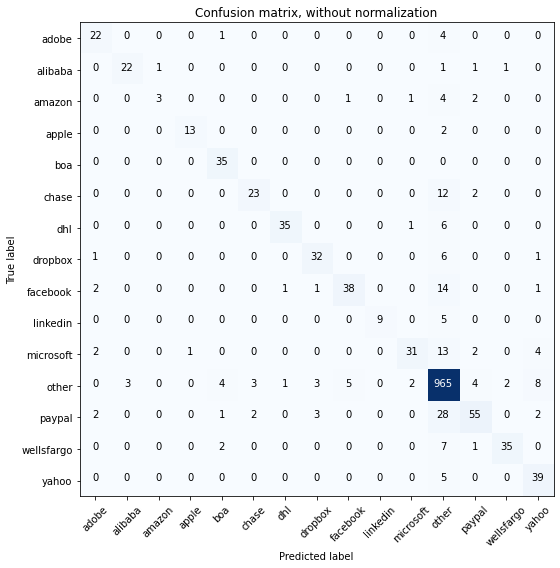

Acc     =  0.882
Pre     =  0.881
Rec     =  0.882
F1      =  0.876

Bal_Acc =  0.745
Bal_Pre =  0.855
Bal_Rec =  0.745
Bal_F1  =  0.796

              precision    recall  f1-score   support

       adobe       0.76      0.81      0.79        27
     alibaba       0.88      0.85      0.86        26
      amazon       0.75      0.27      0.40        11
       apple       0.93      0.87      0.90        15
         boa       0.81      1.00      0.90        35
       chase       0.82      0.62      0.71        37
         dhl       0.95      0.83      0.89        42
     dropbox       0.82      0.80      0.81        40
    facebook       0.86      0.67      0.75        57
    linkedin       1.00      0.64      0.78        14
   microsoft       0.89      0.58      0.70        53
       other       0.90      0.96      0.93      1000
      paypal       0.82      0.59      0.69        93
  wellsfargo       0.92      0.78      0.84        45
       yahoo       0.71      0.89      0.79        

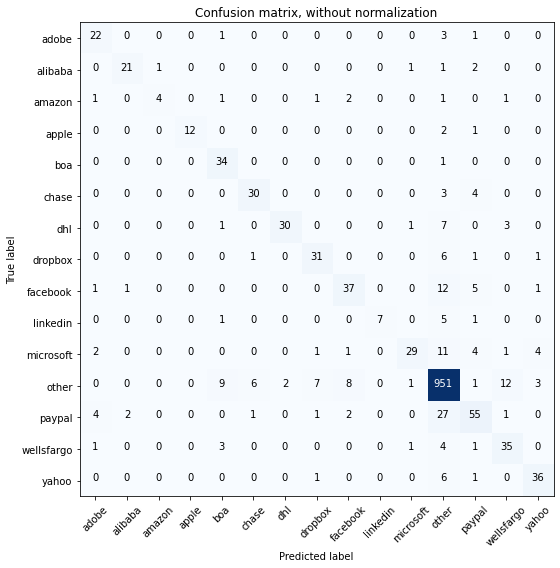

Acc     =  0.867
Pre     =  0.868
Rec     =  0.867
F1      =  0.863

Bal_Acc =  0.726
Bal_Pre =  0.816
Bal_Rec =  0.726
Bal_F1  =  0.768

              precision    recall  f1-score   support

       adobe       0.71      0.81      0.76        27
     alibaba       0.88      0.81      0.84        26
      amazon       0.80      0.36      0.50        11
       apple       1.00      0.80      0.89        15
         boa       0.68      0.97      0.80        35
       chase       0.79      0.81      0.80        37
         dhl       0.94      0.71      0.81        42
     dropbox       0.74      0.78      0.76        40
    facebook       0.74      0.65      0.69        57
    linkedin       1.00      0.50      0.67        14
   microsoft       0.88      0.55      0.67        53
       other       0.91      0.95      0.93      1000
      paypal       0.71      0.59      0.65        93
  wellsfargo       0.66      0.78      0.71        45
       yahoo       0.80      0.82      0.81        

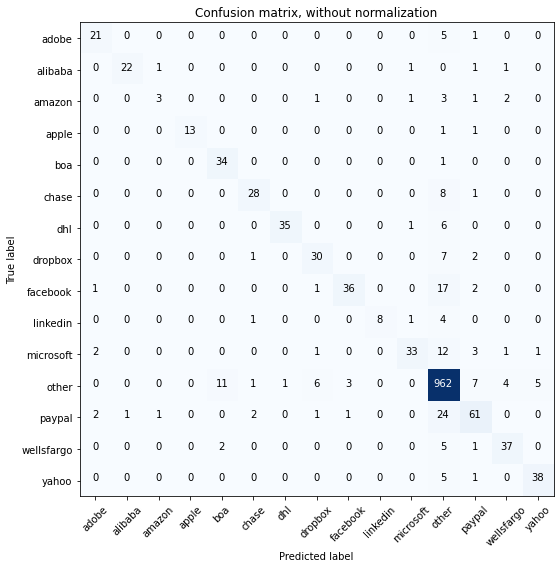

Acc     =  0.884
Pre     =  0.884
Rec     =  0.884
F1      =  0.88

Bal_Acc =  0.747
Bal_Pre =  0.853
Bal_Rec =  0.747
Bal_F1  =  0.796

              precision    recall  f1-score   support

       adobe       0.81      0.78      0.79        27
     alibaba       0.96      0.85      0.90        26
      amazon       0.60      0.27      0.37        11
       apple       1.00      0.87      0.93        15
         boa       0.72      0.97      0.83        35
       chase       0.85      0.76      0.80        37
         dhl       0.97      0.83      0.90        42
     dropbox       0.75      0.75      0.75        40
    facebook       0.90      0.63      0.74        57
    linkedin       1.00      0.57      0.73        14
   microsoft       0.89      0.62      0.73        53
       other       0.91      0.96      0.93      1000
      paypal       0.74      0.66      0.70        93
  wellsfargo       0.82      0.82      0.82        45
       yahoo       0.86      0.86      0.86        4

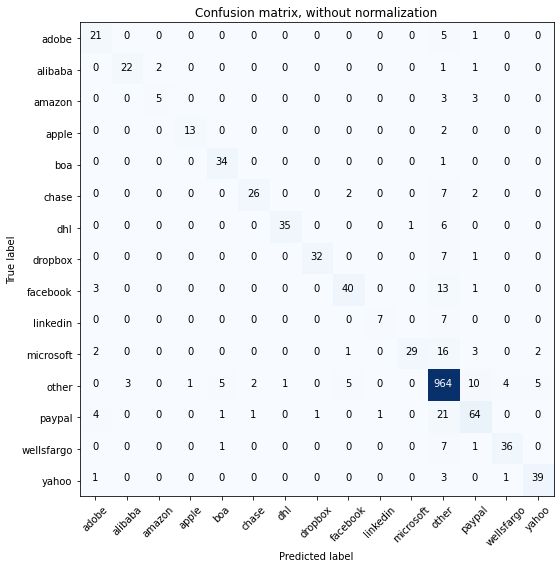

Acc     =  0.888
Pre     =  0.889
Rec     =  0.888
F1      =  0.884

Bal_Acc =  0.756
Bal_Pre =  0.861
Bal_Rec =  0.756
Bal_F1  =  0.805

              precision    recall  f1-score   support

       adobe       0.68      0.78      0.72        27
     alibaba       0.88      0.85      0.86        26
      amazon       0.71      0.45      0.56        11
       apple       0.93      0.87      0.90        15
         boa       0.83      0.97      0.89        35
       chase       0.90      0.70      0.79        37
         dhl       0.97      0.83      0.90        42
     dropbox       0.97      0.80      0.88        40
    facebook       0.83      0.70      0.76        57
    linkedin       0.88      0.50      0.64        14
   microsoft       0.97      0.55      0.70        53
       other       0.91      0.96      0.93      1000
      paypal       0.74      0.69      0.71        93
  wellsfargo       0.88      0.80      0.84        45
       yahoo       0.85      0.89      0.87        

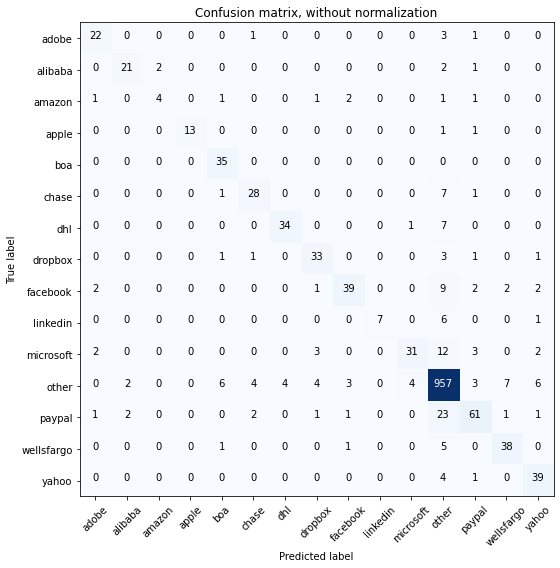

Acc     =  0.885
Pre     =  0.884
Rec     =  0.885
F1      =  0.881

Bal_Acc =  0.757
Bal_Pre =  0.832
Bal_Rec =  0.757
Bal_F1  =  0.793

              precision    recall  f1-score   support

       adobe       0.79      0.81      0.80        27
     alibaba       0.84      0.81      0.82        26
      amazon       0.67      0.36      0.47        11
       apple       1.00      0.87      0.93        15
         boa       0.78      1.00      0.88        35
       chase       0.78      0.76      0.77        37
         dhl       0.89      0.81      0.85        42
     dropbox       0.77      0.82      0.80        40
    facebook       0.85      0.68      0.76        57
    linkedin       1.00      0.50      0.67        14
   microsoft       0.86      0.58      0.70        53
       other       0.92      0.96      0.94      1000
      paypal       0.80      0.66      0.72        93
  wellsfargo       0.79      0.84      0.82        45
       yahoo       0.75      0.89      0.81        

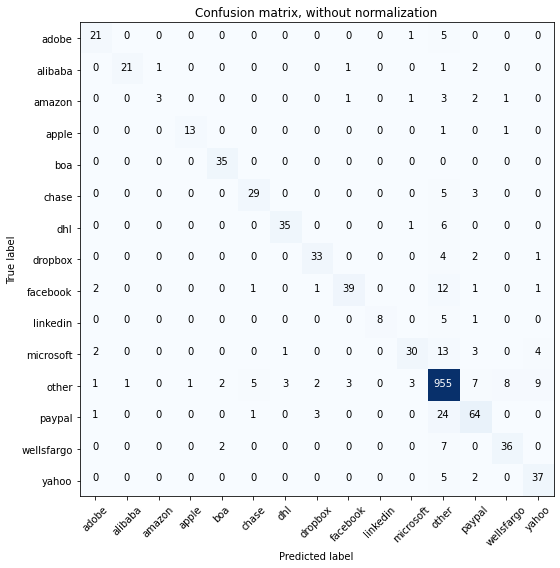

Acc     =  0.883
Pre     =  0.882
Rec     =  0.883
F1      =  0.879

Bal_Acc =  0.752
Bal_Pre =  0.848
Bal_Rec =  0.752
Bal_F1  =  0.797

              precision    recall  f1-score   support

       adobe       0.78      0.78      0.78        27
     alibaba       0.95      0.81      0.88        26
      amazon       0.75      0.27      0.40        11
       apple       0.93      0.87      0.90        15
         boa       0.90      1.00      0.95        35
       chase       0.81      0.78      0.79        37
         dhl       0.90      0.83      0.86        42
     dropbox       0.85      0.82      0.84        40
    facebook       0.89      0.68      0.77        57
    linkedin       1.00      0.57      0.73        14
   microsoft       0.83      0.57      0.67        53
       other       0.91      0.95      0.93      1000
      paypal       0.74      0.69      0.71        93
  wellsfargo       0.78      0.80      0.79        45
       yahoo       0.71      0.84      0.77        

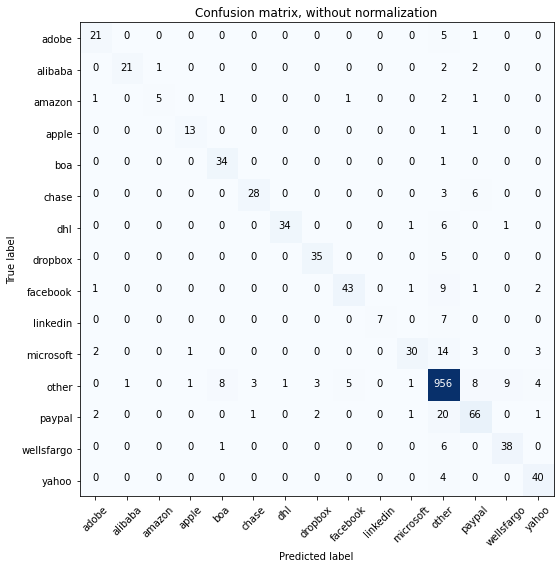

Acc     =  0.891
Pre     =  0.892
Rec     =  0.891
F1      =  0.888

Bal_Acc =  0.771
Bal_Pre =  0.863
Bal_Rec =  0.771
Bal_F1  =  0.814

              precision    recall  f1-score   support

       adobe       0.78      0.78      0.78        27
     alibaba       0.95      0.81      0.88        26
      amazon       0.83      0.45      0.59        11
       apple       0.87      0.87      0.87        15
         boa       0.77      0.97      0.86        35
       chase       0.88      0.76      0.81        37
         dhl       0.97      0.81      0.88        42
     dropbox       0.88      0.88      0.88        40
    facebook       0.88      0.75      0.81        57
    linkedin       1.00      0.50      0.67        14
   microsoft       0.88      0.57      0.69        53
       other       0.92      0.96      0.94      1000
      paypal       0.74      0.71      0.73        93
  wellsfargo       0.79      0.84      0.82        45
       yahoo       0.80      0.91      0.85        

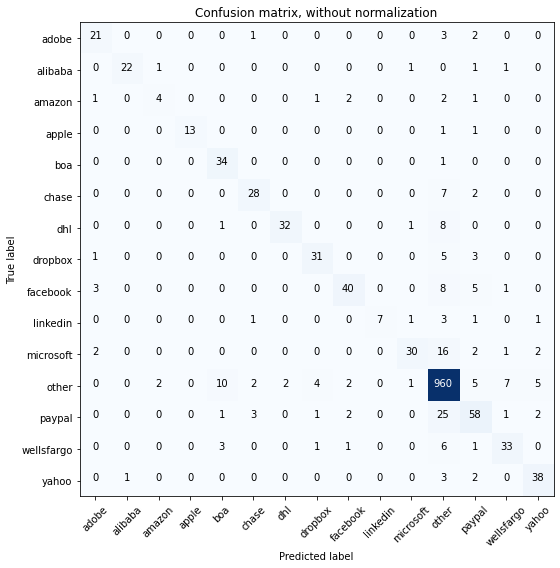

Acc     =  0.878
Pre     =  0.878
Rec     =  0.878
F1      =  0.874

Bal_Acc =  0.738
Bal_Pre =  0.827
Bal_Rec =  0.738
Bal_F1  =  0.78

              precision    recall  f1-score   support

       adobe       0.75      0.78      0.76        27
     alibaba       0.96      0.85      0.90        26
      amazon       0.57      0.36      0.44        11
       apple       1.00      0.87      0.93        15
         boa       0.69      0.97      0.81        35
       chase       0.80      0.76      0.78        37
         dhl       0.94      0.76      0.84        42
     dropbox       0.82      0.78      0.79        40
    facebook       0.85      0.70      0.77        57
    linkedin       1.00      0.50      0.67        14
   microsoft       0.88      0.57      0.69        53
       other       0.92      0.96      0.94      1000
      paypal       0.69      0.62      0.66        93
  wellsfargo       0.75      0.73      0.74        45
       yahoo       0.79      0.86      0.83        4

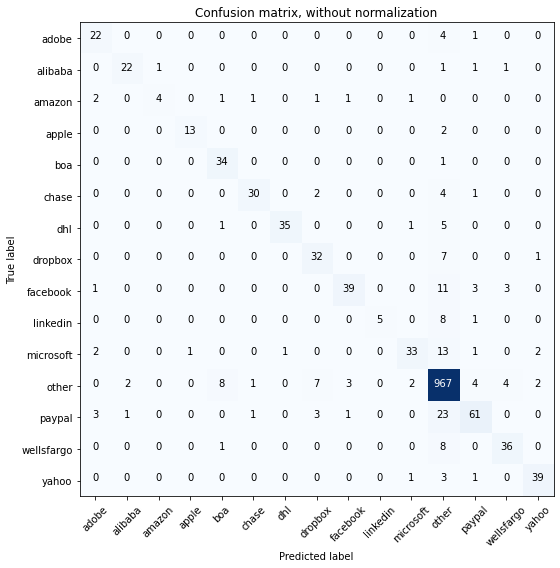

Acc     =  0.891
Pre     =  0.892
Rec     =  0.891
F1      =  0.887

Bal_Acc =  0.752
Bal_Pre =  0.859
Bal_Rec =  0.752
Bal_F1  =  0.802

              precision    recall  f1-score   support

       adobe       0.73      0.81      0.77        27
     alibaba       0.88      0.85      0.86        26
      amazon       0.80      0.36      0.50        11
       apple       0.93      0.87      0.90        15
         boa       0.76      0.97      0.85        35
       chase       0.91      0.81      0.86        37
         dhl       0.97      0.83      0.90        42
     dropbox       0.71      0.80      0.75        40
    facebook       0.89      0.68      0.77        57
    linkedin       1.00      0.36      0.53        14
   microsoft       0.87      0.62      0.73        53
       other       0.91      0.97      0.94      1000
      paypal       0.82      0.66      0.73        93
  wellsfargo       0.82      0.80      0.81        45
       yahoo       0.89      0.89      0.89        

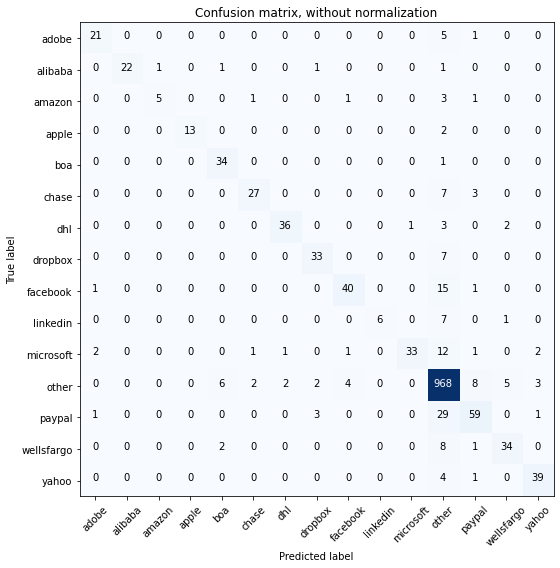

Acc     =  0.89
Pre     =  0.89
Rec     =  0.89
F1      =  0.885

Bal_Acc =  0.755
Bal_Pre =  0.887
Bal_Rec =  0.755
Bal_F1  =  0.816

              precision    recall  f1-score   support

       adobe       0.84      0.78      0.81        27
     alibaba       1.00      0.85      0.92        26
      amazon       0.83      0.45      0.59        11
       apple       1.00      0.87      0.93        15
         boa       0.79      0.97      0.87        35
       chase       0.87      0.73      0.79        37
         dhl       0.92      0.86      0.89        42
     dropbox       0.85      0.82      0.84        40
    facebook       0.87      0.70      0.78        57
    linkedin       1.00      0.43      0.60        14
   microsoft       0.97      0.62      0.76        53
       other       0.90      0.97      0.93      1000
      paypal       0.78      0.63      0.70        93
  wellsfargo       0.81      0.76      0.78        45
       yahoo       0.87      0.89      0.88        44


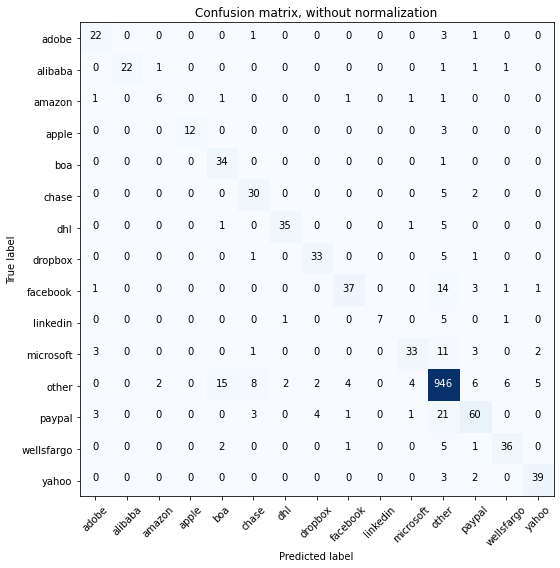

Acc     =  0.878
Pre     =  0.881
Rec     =  0.878
F1      =  0.876

Bal_Acc =  0.766
Bal_Pre =  0.83
Bal_Rec =  0.766
Bal_F1  =  0.797

              precision    recall  f1-score   support

       adobe       0.73      0.81      0.77        27
     alibaba       1.00      0.85      0.92        26
      amazon       0.67      0.55      0.60        11
       apple       1.00      0.80      0.89        15
         boa       0.64      0.97      0.77        35
       chase       0.68      0.81      0.74        37
         dhl       0.92      0.83      0.88        42
     dropbox       0.85      0.82      0.84        40
    facebook       0.84      0.65      0.73        57
    linkedin       1.00      0.50      0.67        14
   microsoft       0.82      0.62      0.71        53
       other       0.92      0.95      0.93      1000
      paypal       0.75      0.65      0.69        93
  wellsfargo       0.80      0.80      0.80        45
       yahoo       0.83      0.89      0.86        4

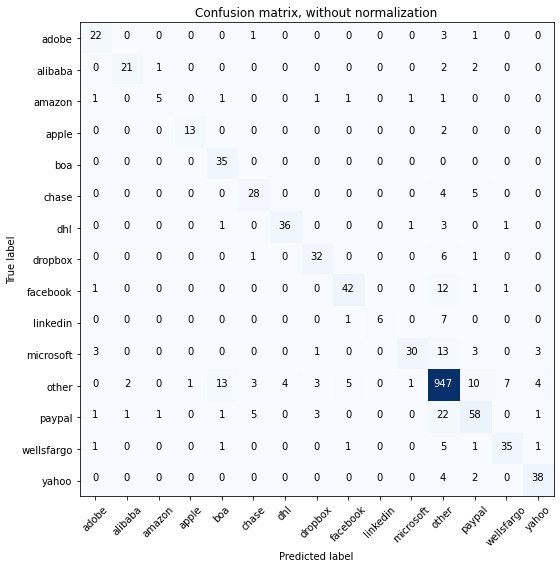

Acc     =  0.876
Pre     =  0.877
Rec     =  0.876
F1      =  0.873

Bal_Acc =  0.753
Bal_Pre =  0.823
Bal_Rec =  0.753
Bal_F1  =  0.786

              precision    recall  f1-score   support

       adobe       0.76      0.81      0.79        27
     alibaba       0.88      0.81      0.84        26
      amazon       0.71      0.45      0.56        11
       apple       0.93      0.87      0.90        15
         boa       0.67      1.00      0.80        35
       chase       0.74      0.76      0.75        37
         dhl       0.90      0.86      0.88        42
     dropbox       0.80      0.80      0.80        40
    facebook       0.84      0.74      0.79        57
    linkedin       1.00      0.43      0.60        14
   microsoft       0.91      0.57      0.70        53
       other       0.92      0.95      0.93      1000
      paypal       0.69      0.62      0.66        93
  wellsfargo       0.80      0.78      0.79        45
       yahoo       0.81      0.86      0.84        

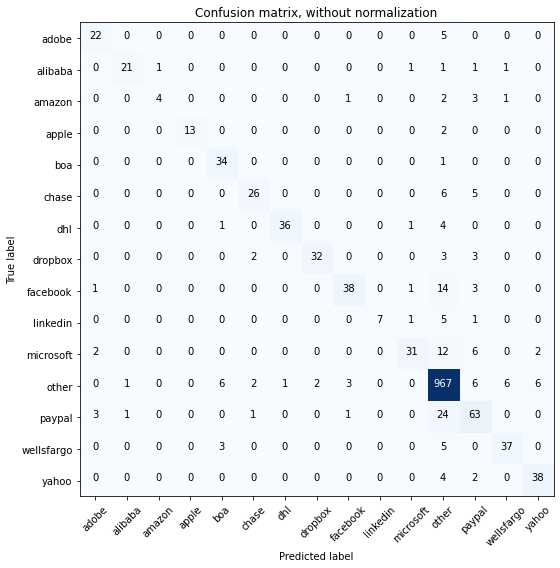

Acc     =  0.89
Pre     =  0.89
Rec     =  0.89
F1      =  0.886

Bal_Acc =  0.751
Bal_Pre =  0.869
Bal_Rec =  0.751
Bal_F1  =  0.806

              precision    recall  f1-score   support

       adobe       0.79      0.81      0.80        27
     alibaba       0.91      0.81      0.86        26
      amazon       0.80      0.36      0.50        11
       apple       1.00      0.87      0.93        15
         boa       0.77      0.97      0.86        35
       chase       0.84      0.70      0.76        37
         dhl       0.97      0.86      0.91        42
     dropbox       0.94      0.80      0.86        40
    facebook       0.88      0.67      0.76        57
    linkedin       1.00      0.50      0.67        14
   microsoft       0.89      0.58      0.70        53
       other       0.92      0.97      0.94      1000
      paypal       0.68      0.68      0.68        93
  wellsfargo       0.82      0.82      0.82        45
       yahoo       0.83      0.86      0.84        44


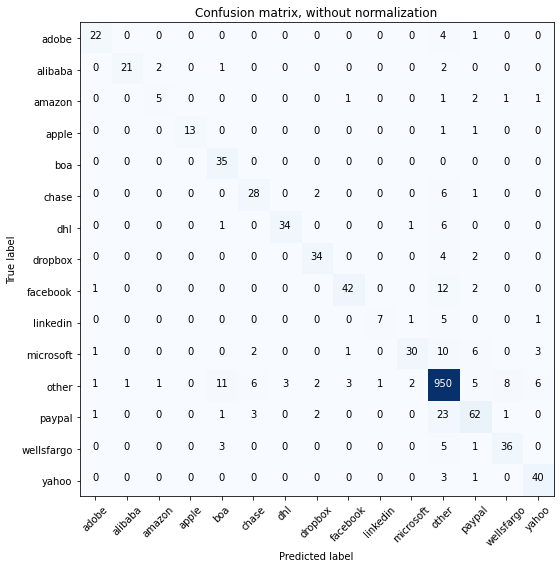

Acc     =  0.883
Pre     =  0.884
Rec     =  0.883
F1      =  0.88

Bal_Acc =  0.766
Bal_Pre =  0.831
Bal_Rec =  0.766
Bal_F1  =  0.797

              precision    recall  f1-score   support

       adobe       0.85      0.81      0.83        27
     alibaba       0.95      0.81      0.88        26
      amazon       0.62      0.45      0.53        11
       apple       1.00      0.87      0.93        15
         boa       0.67      1.00      0.80        35
       chase       0.72      0.76      0.74        37
         dhl       0.92      0.81      0.86        42
     dropbox       0.85      0.85      0.85        40
    facebook       0.89      0.74      0.81        57
    linkedin       0.88      0.50      0.64        14
   microsoft       0.88      0.57      0.69        53
       other       0.92      0.95      0.94      1000
      paypal       0.74      0.67      0.70        93
  wellsfargo       0.78      0.80      0.79        45
       yahoo       0.78      0.91      0.84        4

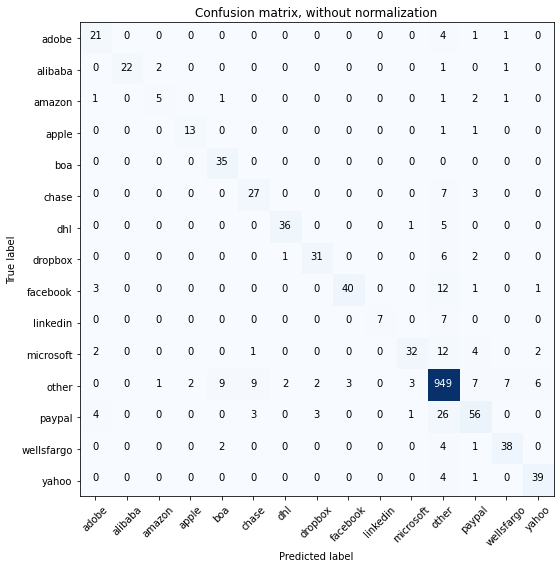

Acc     =  0.878
Pre     =  0.878
Rec     =  0.878
F1      =  0.875

Bal_Acc =  0.76
Bal_Pre =  0.826
Bal_Rec =  0.76
Bal_F1  =  0.792

              precision    recall  f1-score   support

       adobe       0.68      0.78      0.72        27
     alibaba       1.00      0.85      0.92        26
      amazon       0.62      0.45      0.53        11
       apple       0.87      0.87      0.87        15
         boa       0.74      1.00      0.85        35
       chase       0.68      0.73      0.70        37
         dhl       0.92      0.86      0.89        42
     dropbox       0.86      0.78      0.82        40
    facebook       0.93      0.70      0.80        57
    linkedin       1.00      0.50      0.67        14
   microsoft       0.86      0.60      0.71        53
       other       0.91      0.95      0.93      1000
      paypal       0.71      0.60      0.65        93
  wellsfargo       0.79      0.84      0.82        45
       yahoo       0.81      0.89      0.85        44

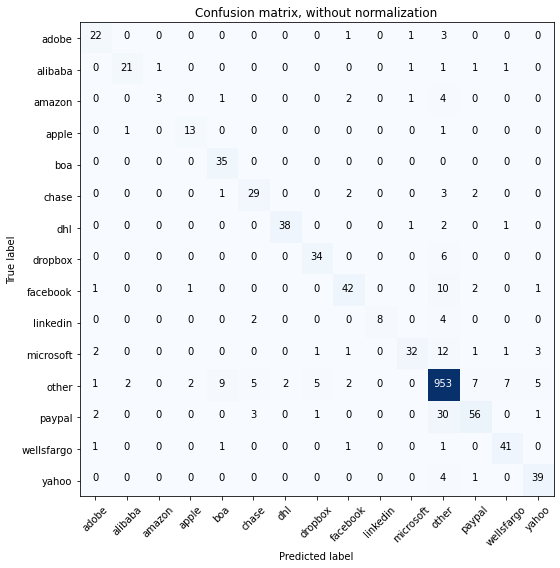

Acc     =  0.888
Pre     =  0.887
Rec     =  0.888
F1      =  0.883

Bal_Acc =  0.771
Bal_Pre =  0.833
Bal_Rec =  0.771
Bal_F1  =  0.801

              precision    recall  f1-score   support

       adobe       0.76      0.81      0.79        27
     alibaba       0.88      0.81      0.84        26
      amazon       0.75      0.27      0.40        11
       apple       0.81      0.87      0.84        15
         boa       0.74      1.00      0.85        35
       chase       0.74      0.78      0.76        37
         dhl       0.95      0.90      0.93        42
     dropbox       0.83      0.85      0.84        40
    facebook       0.82      0.74      0.78        57
    linkedin       1.00      0.57      0.73        14
   microsoft       0.89      0.60      0.72        53
       other       0.92      0.95      0.94      1000
      paypal       0.80      0.60      0.69        93
  wellsfargo       0.80      0.91      0.85        45
       yahoo       0.80      0.89      0.84        

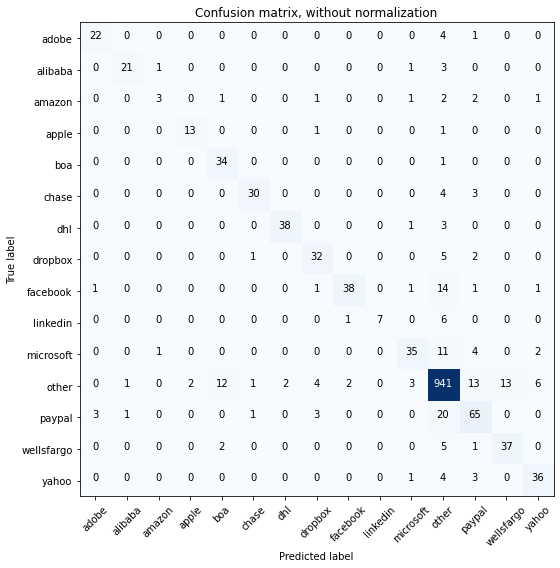

Acc     =  0.878
Pre     =  0.88
Rec     =  0.878
F1      =  0.876

Bal_Acc =  0.757
Bal_Pre =  0.827
Bal_Rec =  0.757
Bal_F1  =  0.79

              precision    recall  f1-score   support

       adobe       0.85      0.81      0.83        27
     alibaba       0.91      0.81      0.86        26
      amazon       0.60      0.27      0.37        11
       apple       0.87      0.87      0.87        15
         boa       0.69      0.97      0.81        35
       chase       0.91      0.81      0.86        37
         dhl       0.95      0.90      0.93        42
     dropbox       0.76      0.80      0.78        40
    facebook       0.93      0.67      0.78        57
    linkedin       1.00      0.50      0.67        14
   microsoft       0.81      0.66      0.73        53
       other       0.92      0.94      0.93      1000
      paypal       0.68      0.70      0.69        93
  wellsfargo       0.74      0.82      0.78        45
       yahoo       0.78      0.82      0.80        44

In [13]:
list_of_analysis=[]
for image_size in list_of_size:
    for models in list_of_combinations:
        model1 = models.split(",")[0]
        model2 = models.split(",")[1]
        model3 = models.split(",")[2]
        for classifier in list_of_classifiers:
            print("--------------------------------------------------------------------------")
            print(classifier, model1, model2, model3, str(image_size))
            print("")
            accuracy, precision, recall, f1_score, balanced_accuracy, PPV, TPR, Bal_F1, TNR, NPV, FPR, FNR, FDR, Overall_Acc = classify(model1, model2, model3, classifier, image_size)
            list_of_analysis.append(
                [
                 classifier, model1, model2, model3, image_size, accuracy, precision, recall, f1_score, balanced_accuracy, PPV, TPR, Bal_F1, TNR, NPV, FPR, FNR, FDR, Overall_Acc
                ]
            )

In [14]:
list_of_analysis

[['RF',
  'VGG16',
  'VGG19',
  'ResNet101V2',
  128,
  0.853,
  0.864,
  0.853,
  0.854,
  0.759,
  0.767,
  0.759,
  0.763,
  0.985,
  0.983,
  0.015,
  0.241,
  0.233,
  0.98],
 ['RF',
  'VGG16',
  'VGG19',
  'ResNet152V2',
  128,
  0.865,
  0.872,
  0.865,
  0.865,
  0.75,
  0.768,
  0.75,
  0.759,
  0.986,
  0.986,
  0.014,
  0.25,
  0.232,
  0.982],
 ['RF',
  'VGG16',
  'VGG19',
  'InceptionV3',
  128,
  0.85,
  0.863,
  0.85,
  0.852,
  0.747,
  0.773,
  0.747,
  0.76,
  0.984,
  0.983,
  0.016,
  0.253,
  0.227,
  0.98],
 ['RF',
  'VGG16',
  'VGG19',
  'MobileNet',
  128,
  0.86,
  0.87,
  0.86,
  0.861,
  0.741,
  0.763,
  0.741,
  0.752,
  0.986,
  0.985,
  0.014,
  0.259,
  0.237,
  0.981],
 ['RF',
  'VGG16',
  'VGG19',
  'MobileNetV2',
  128,
  0.859,
  0.87,
  0.859,
  0.86,
  0.747,
  0.766,
  0.747,
  0.756,
  0.985,
  0.984,
  0.015,
  0.253,
  0.234,
  0.981],
 ['RF',
  'VGG16',
  'VGG19',
  'DenseNet121',
  128,
  0.845,
  0.855,
  0.845,
  0.846,
  0.748,
  0.744,
  

In [15]:
import pandas as pd
df=pd.DataFrame(list_of_analysis, columns=[
                 "classifier",
                 "model1",
                 "model2",
                 "model3",
                 "image_size",
                 "accuracy", 
                 "precision", 
                 "recall", 
                 "f1_score", 
                 "balanced_accuracy", 
                 "balanced_precision_PPV", 
                 "balanced_recall_TPR", 
                 "Bal_F1",
                 "TNR", 
                 "NPV", 
                 "FPR", 
                 "FNR", 
                 "FDR", 
                 "Overall_Acc"
                ])
df

,classifier,model1,model2,model3,image_size,accuracy,precision,recall,f1_score,balanced_accuracy,balanced_precision_PPV,balanced_recall_TPR,Bal_F1,TNR,NPV,FPR,FNR,FDR,Overall_Acc
0,RF,VGG16,VGG19,ResNet101V2,128,0.853,0.864,0.853,0.854,0.759,0.767,0.759,0.763,0.985,0.983,0.015,0.241,0.233,0.980
1,RF,VGG16,VGG19,ResNet152V2,128,0.865,0.872,0.865,0.865,0.750,0.768,0.750,0.759,0.986,0.986,0.014,0.250,0.232,0.982
2,RF,VGG16,VGG19,InceptionV3,128,0.850,0.863,0.850,0.852,0.747,0.773,0.747,0.760,0.984,0.983,0.016,0.253,0.227,0.980
3,RF,VGG16,VGG19,MobileNet,128,0.860,0.870,0.860,0.861,0.741,0.763,0.741,0.752,0.986,0.985,0.014,0.259,0.237,0.981
4,RF,VGG16,VGG19,MobileNetV2,128,0.859,0.870,0.859,0.860,0.747,0.766,0.747,0.756,0.985,0.984,0.015,0.253,0.234,0.981
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
235,RF,MobileNet,DenseNet169,DenseNet201,256,0.890,0.890,0.890,0.886,0.751,0.869,0.751,0.806,0.985,0.989,0.015,0.249,0.131,0.985
236,RF,MobileNetV2,DenseNet121,DenseNet169,256,0.883,0.884,0.883,0.880,0.766,0.831,0.766,0.797,0.985,0.988,0.015,0.234,0.169,0.984
237,RF,MobileNetV2,DenseNet121,DenseNet201,256,0.878,0.878,0.878,0.875,0.760,0.826,0.760,0.792,0.984,0.987,0.016,0.240,0.174,0.984
238,RF,MobileNetV2,DenseNet169,DenseNet201,256,0.888,0.887,0.888,0.883,0.771,0.833,0.771,0.801,0.986,0.988,0.014,0.229,0.167,0.985


In [16]:
df.to_csv(analysis_output, header=True, index=False)